#**MSC PROJECT (6G7V0007_2324_9F)**

#**RAMSES MORENO DE LA CRUZ - MMU ID: 23624012**

# **1. CONFIGURATION OF THE ENVIRONMENT / LOADING LIBRARIES**

In [ ]:
#PIL
  #Python Library.
  #Used for opening, manipulating, and saving many different image file formats.
  #Used for loading and preprocessing images before converting them into PyTorch tensors.
from PIL import Image

#torch:
  #PyTorch library.
  #It provides multi-dimensional arrays (tensors) and operations on these tensors.
import torch

#torch.nn:
  #PyTorch Module
  #It provides support (classes and functions for defining layers, loss functions, activation functions, etc) for building ANN.
import torch.nn as nn

#torch.utils.data.random_split:
  #PyTorch Module
  #It splits a dataset into random training and validation subsets.
from torch.utils.data import random_split

#torch.utils.data import DataLoader
  #PyTorch Module
  #It provides a "DataLoader class" that wraps a dataset and provides an iterable over the dataset in batches.
  #It handles "data loading, shuffling, batching, etc", making it easier to feed data into ANN for training and evaluation.
#torch.utils.data import Subset
  #PyTorch Module
  #It creates a subset of a larger dataset by specifying indices of the samples that we want to include in the subset.
from torch.utils.data import DataLoader, Subset

#torchvision:
  #PyTorch library.
  #It is designed for computer vision tasks (image, video, pre-trained models, etc).
import torchvision

#torchvision.transforms
  #PyTorch Module
  #transform or augment data for training or inference.
from torchvision.transforms import v2

#torchvision.datasets (not necessary in this case, because I have my own set):
  #PyTorch Module
  #It provides support for popular datasets used in computer vision, such as CIFAR-10, MNIST, and ImageNet.
  #It includes classes for downloading, loading, and preprocessing these datasets.
from torchvision import datasets
from torchvision.datasets import DatasetFolder
import torchvision.transforms as transforms

#tqdm
  #Python library
  #It is used to add progress bars to loops or iterators.
  #"tqdm.auto" it is helpful to ensure that the appropriate version of tqdm is used based on the environment (notebook, IDE,...)
from tqdm.auto import tqdm

#Matplotlib library ("pyplot" submodule alias "plt")
import matplotlib.pyplot as plt

import seaborn as sns

In [ ]:
#Chapter 6 (libraries, functions, modules, and frameworks)
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SequentialFeatureSelector

#Chapter 7 (libraries, functions, modules, and frameworks)
from sklearn.model_selection import cross_validate
from sklearn.metrics import PredictionErrorDisplay

#Chapter 9 (libraries, functions, modules, and frameworks)
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence

#**2. LOADING THE DATASET**

In [ ]:
#!pip install
  #"command" (due to !) used to "install" Python packages (in this case the package is called "opendatasets")
    #"-q" for "quiet" mode for installing the package (it won't display detailed output during installation)
!pip install -q opendatasets

In [ ]:
import opendatasets as od
import pandas as pd


od.download('https://www.kaggle.com/datasets/naveenkumar20bps1137/parkinsons-disease-detection/data?select=parkinsons.data')

#Important: insert kaggle username and key
# ramsesmdlc
# f88c80645913d11d2a6d9cc8056d7692

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: ramsesmdlc
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/naveenkumar20bps1137/parkinsons-disease-detection


100%|██████████| 309k/309k [00:00<00:00, 42.6MB/s]

#**3. FIRST GLANCE AT THE DATASET**



In [ ]:
#Loading the whole data to a Pandas DataFrame
parkinsons_data = pd.read_csv('/content/parkinsons-disease-detection/telemonitoring/parkinsons_updrs.data')

In [ ]:
#Copying the whole dataset
whole_data = parkinsons_data.copy()

#Showing the whole dataset
print("\n" +'\033[1m','\033[33m',"First glance at the dataset:",'\033[0m',"\n")
whole_data


  First glance at the dataset:  



,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,42,61,0,142.7900,22.485,33.485,0.00406,0.000031,0.00167,0.00168,...,0.160,0.00973,0.01133,0.01549,0.02920,0.025137,22.369,0.64215,0.55314,0.21367
5871,42,61,0,149.8400,21.988,32.988,0.00297,0.000025,0.00119,0.00147,...,0.215,0.01052,0.01277,0.01904,0.03157,0.011927,22.886,0.52598,0.56518,0.12621
5872,42,61,0,156.8200,21.495,32.495,0.00349,0.000025,0.00152,0.00187,...,0.244,0.01371,0.01456,0.01877,0.04112,0.017701,25.065,0.47792,0.57888,0.14157
5873,42,61,0,163.7300,21.007,32.007,0.00281,0.000020,0.00128,0.00151,...,0.131,0.00693,0.00870,0.01307,0.02078,0.007984,24.422,0.56865,0.56327,0.14204


In [ ]:
#General information of the whole dataset
print("\n" +'\033[1m','\033[33m',"General information of the whole dataset:",'\033[0m',"\n")
whole_data.info()


  General information of the whole dataset:  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject#       5875 non-null   int64  
 1   age            5875 non-null   int64  
 2   sex            5875 non-null   int64  
 3   test_time      5875 non-null   float64
 4   motor_UPDRS    5875 non-null   float64
 5   total_UPDRS    5875 non-null   float64
 6   Jitter(%)      5875 non-null   float64
 7   Jitter(Abs)    5875 non-null   float64
 8   Jitter:RAP     5875 non-null   float64
 9   Jitter:PPQ5    5875 non-null   float64
 10  Jitter:DDP     5875 non-null   float64
 11  Shimmer        5875 non-null   float64
 12  Shimmer(dB)    5875 non-null   float64
 13  Shimmer:APQ3   5875 non-null   float64
 14  Shimmer:APQ5   5875 non-null   float64
 15  Shimmer:APQ11  5875 non-null   float64
 16  Shimmer:DDA    5875 non-null   float64
 17  NHR 

# **4. EXPLORATORY DATA ANALYSIS (EDA)**

## **4.1. WHOLE DATASET**

### **4.1.1. GENERAL INFORMATION**

In [ ]:
def EDA_0(whole_data):
  #"shape" of the whole dataset
  print("\n" +'\033[1m','\033[33m',"Shape of the dataset:",'\033[0m', whole_data.shape, "\n")

  #"head" of the whole dataset
  print("\n",'\033[1m','\033[33m',"Head of the dataset:",'\033[0m', "\n")
  print(whole_data.head(1))

  #"tail" of the whole dataset
  print("\n", '\033[1m','\033[33m',"Tail of the dataset:",'\033[0m', "\n")
  print(whole_data.tail(1))

  #"sample" of the whole dataset
  print("\n", '\033[1m','\033[33m',"Sample of the dataset:",'\033[0m', "\n")
  print(whole_data.sample(n=1))

  #"general information" of the whole dataset
  print("\n", '\033[1m','\033[33m',"General information of the dataset:",'\033[0m', "\n")
  whole_data.info()

  #"number and percentage" of missing values of the whole dataset
  print("\n" +'\033[1m','\033[33m', "Number and percentage of missing values per column of the dataset:", '\033[0m' + "\n")
  missing = whole_data.isnull().sum()
  percentage = missing / whole_data.shape[0] * 100
  print(pd.concat([missing, round(percentage,2)], axis=1, keys=["Missing", "Percentage %"]))

  print("\n" +'\033[1m','\033[33m', "Summary statistics of metric variables of the dataset:", '\033[0m' + "\n")
  print(whole_data.describe())

# Call the function
EDA_0(whole_data)


  Shape of the dataset:  (5875, 22) 


   Head of the dataset:  

   subject#  age  sex  test_time  motor_UPDRS  total_UPDRS  Jitter(%)  \
0         1   72    0     5.6431       28.199       34.398    0.00662   

   Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  ...  Shimmer(dB)  Shimmer:APQ3  \
0     0.000034     0.00401      0.00317  ...         0.23       0.01438   

   Shimmer:APQ5  Shimmer:APQ11  Shimmer:DDA      NHR    HNR     RPDE      DFA  \
0       0.01309        0.01662      0.04314  0.01429  21.64  0.41888  0.54842   

       PPE  
0  0.16006  

[1 rows x 22 columns]

   Tail of the dataset:  

      subject#  age  sex  test_time  motor_UPDRS  total_UPDRS  Jitter(%)  \
5874        42   61    0     170.73       20.513       31.513    0.00282   

      Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  ...  Shimmer(dB)  Shimmer:APQ3  \
5874     0.000021     0.00135      0.00166  ...        0.171       0.00946   

      Shimmer:APQ5  Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE  \
5874    


  Barplots  

Maximum value of recordings for whole data: 168
Minimum value of recordings for whole data: 101
Mean value of recordings for whole data: 139.88095238095238




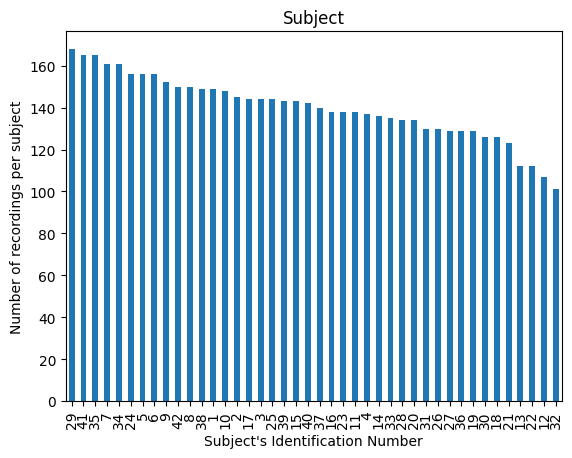



Number of males: 28
Number of females: 14


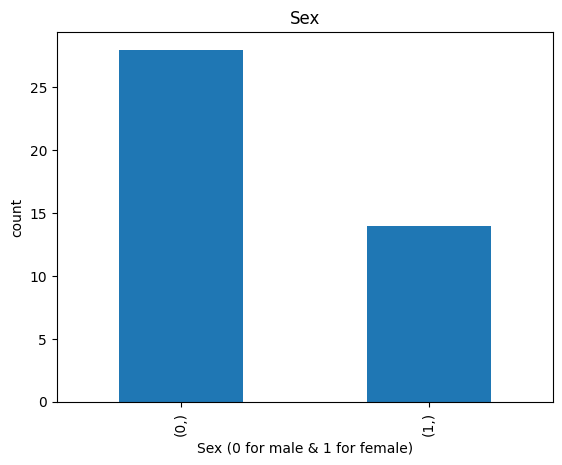




  Histograms  



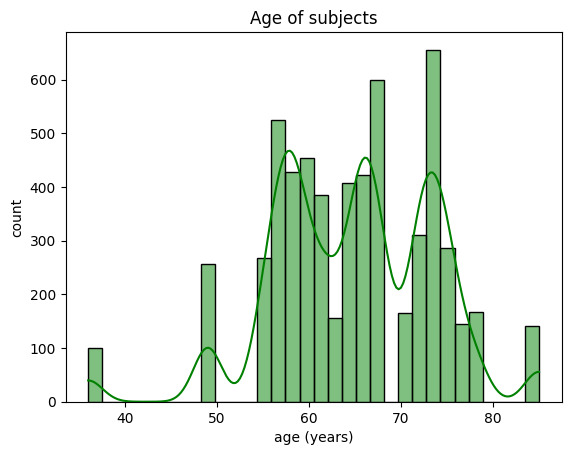

In [ ]:
#Whole dataset (more information - part 1)
def EDA_Graph_00(whole_data):

  print("\n" +'\033[1m','\033[33m',"Barplots",'\033[0m',"\n")

  #subject
  train_counts_subject = whole_data["subject#"].value_counts()

  #subject, maximum value
  max_value_subject_whole_data = train_counts_subject.max()
  print("Maximum value of recordings for whole data:", max_value_subject_whole_data)

  #subject, minimum value
  min_value_subject_whole_data = train_counts_subject.min()
  print("Minimum value of recordings for whole data:", min_value_subject_whole_data)

  #subject, mean value
  mean_value_subject_whole_data = train_counts_subject.mean()
  print("Mean value of recordings for whole data:", mean_value_subject_whole_data)
  print("\n")

  train_counts_subject.plot(kind='bar')
  plt.xlabel("Subject's Identification Number")
  plt.ylabel('Number of recordings per subject')
  plt.title('Subject')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #sex
  grouped = whole_data.groupby('subject#').agg({'sex': ['max']})
  train_counts_sex = grouped["sex"].value_counts()

  #sex, maximum value
  max_value_sex_whole_data = train_counts_sex.max()
  print("Number of males:", max_value_sex_whole_data)

  #sex, minimum value
  min_value_sex_whole_data = train_counts_sex.min()
  print("Number of females:", min_value_sex_whole_data)

  train_counts_sex.plot(kind='bar')
  plt.xlabel('Sex (0 for male & 1 for female)')
  plt.ylabel('count')
  plt.title('Sex')
  plt.show()
  print("\n")

  ##########################################################################################################################

  print("\n" +'\033[1m','\033[33m',"Histograms",'\033[0m',"\n")

  sns.histplot(data=whole_data, x='age', kde=True, color='green', edgecolor='black')
  plt.xlabel('age (years)')
  plt.ylabel('count')
  plt.title('Age of subjects')
  plt.show()
  print("\n")


# Call the function
EDA_Graph_00(whole_data)

In [ ]:
 ##########################################################################################################################
 #Whole dataset (more information - part 2)
#Sex and Subject (whole_data)
whole_data_3 = whole_data.copy()
def EDA_Graph_000(whole_data_3):

  #Dataset only of males (whole dataset)
  df_dropped_kmale = whole_data_3[whole_data_3['sex'] != 1]

  grouped_recording_kmale = df_dropped_kmale.groupby('subject#').size()
  print("ID sorted, for whole data, only male")
  print(grouped_recording_kmale)

  train_counts_recording_kmale = df_dropped_kmale["sex"].value_counts()
  print("Number of recordings for whole data, only for male:")
  print(train_counts_recording_kmale)

  train_counts_recording_kmale_2 = df_dropped_kmale["subject#"].value_counts()
  print("ID not sorted, for whole data, only male")
  print(train_counts_recording_kmale_2)

  #subject, maximum value
  max_value_subject_whole_data_kmale = train_counts_recording_kmale_2.max()
  print("Maximum value of recordings for whole data, only for male:", max_value_subject_whole_data_kmale)

  #subject, minimum value
  min_value_subject_whole_data_kmale = train_counts_recording_kmale_2.min()
  print("Minimum value of recordings for whole data, only for male:", min_value_subject_whole_data_kmale)

  #subject, mean value
  mean_value_subject_whole_data_kmale = train_counts_recording_kmale_2.mean()
  print("Mean value of recordings for whole data, only for male:", mean_value_subject_whole_data_kmale)
  print("\n")

  ########################

  #Dataset only of females (whole dataset)
  df_dropped_kfemale = whole_data_3[whole_data_3['sex'] != 0]

  grouped_recording_kfemale = df_dropped_kfemale.groupby('subject#').size()
  print("ID sorted, for whole data, only male")
  print(grouped_recording_kfemale)

  train_counts_recording_kfemale = df_dropped_kfemale["sex"].value_counts()
  print("Number of recordings for whole data, only for female:")
  print(train_counts_recording_kfemale)

  train_counts_recording_kfemale_2 = df_dropped_kfemale["subject#"].value_counts()
  print("ID not sorted, for whole data, only male")
  print(train_counts_recording_kfemale_2)

  #subject, maximum value
  max_value_subject_whole_data_kfemale = train_counts_recording_kfemale_2.max()
  print("Maximum value of recordings for whole data, only for female:", max_value_subject_whole_data_kfemale)

  #subject, minimum value
  min_value_subject_whole_data_kfemale = train_counts_recording_kfemale_2.min()
  print("Minimum value of recordings for whole data, only for female:", min_value_subject_whole_data_kfemale)

  #subject, mean value
  mean_value_subject_whole_data_kfemale = train_counts_recording_kfemale_2.mean()
  print("Mean value of recordings for whole data, only for female:", mean_value_subject_whole_data_kfemale)
  print("\n")

  # Call the function
EDA_Graph_000(whole_data_3)

ID sorted, for whole data, only male
subject#
1     149
2     145
3     144
4     137
5     156
6     156
7     161
9     152
10    148
11    138
12    107
15    143
16    138
18    126
19    129
20    134
21    123
24    156
25    144
26    130
29    168
30    126
31    130
34    161
35    165
38    149
39    143
42    150
dtype: int64
Number of recordings for whole data, only for male:
sex
0    4008
Name: count, dtype: int64
ID not sorted, for whole data, only male
subject#
29    168
35    165
7     161
34    161
24    156
5     156
6     156
9     152
42    150
38    149
1     149
10    148
2     145
3     144
25    144
15    143
39    143
16    138
11    138
4     137
20    134
31    130
26    130
19    129
30    126
18    126
21    123
12    107
Name: count, dtype: int64
Maximum value of recordings for whole data, only for male: 168
Minimum value of recordings for whole data, only for male: 107
Mean value of recordings for whole data, only for male: 143.14285714285714


ID sorted,

In [ ]:
 ##########################################################################################################################
#Whole dataset (more information - part 3)

#Sex and Age (whole_data)
whole_data_4 = whole_data.copy()
def EDA_Graph_0000(whole_data_4):

  #Dataset only of males (whole dataset)
  df_dropped_kmale = whole_data_4[whole_data_4['sex'] != 1]
  print(df_dropped_kmale.describe())

  ########################

  #Dataset only of females (whole dataset)
  df_dropped_kfemale = whole_data_4[whole_data_4['sex'] != 0]
  print(df_dropped_kfemale.describe())

  # Call the function
EDA_Graph_0000(whole_data_4)

          subject#          age     sex    test_time  motor_UPDRS  \
count  4008.000000  4008.000000  4008.0  4008.000000  4008.000000   
mean     19.072106    65.055389     0.0    93.221349    21.469349   
std      12.424387     7.845490     0.0    53.962102     7.891659   
min       1.000000    49.000000     0.0    -4.262500     5.037700   
25%       7.000000    59.000000     0.0    47.371750    15.000000   
50%      19.000000    65.000000     0.0    91.302500    21.208000   
75%      30.000000    72.000000     0.0   138.430000    27.548000   
max      42.000000    78.000000     0.0   215.490000    39.511000   

       total_UPDRS    Jitter(%)  Jitter(Abs)   Jitter:RAP  Jitter:PPQ5  ...  \
count  4008.000000  4008.000000  4008.000000  4008.000000  4008.000000  ...   
mean     29.724055     0.005956     0.000048     0.002824     0.003053  ...   
std      11.004499     0.004326     0.000033     0.002555     0.002414  ...   
min       7.000000     0.000900     0.000005     0.000400     

### **4.1.2. STRATIFIED SPLITTING**

The following proportions are going to be used in the project:
* training set (~60 %) = 3584 instances
* test set (~20 %) = 1146 instances
* validation set (~20 %) = 1145 instances

---
---

* First, the whole dataset provided (5875 instances) is split in a stratified manner into "training set" and "test set" without distorting the proportions shown above:

training instances (~80%) | test instances (~20%)  | whole instances (100%)
-------------------------|-----------------------|-----------------
4729                   | 1146                 | 5875

---
---



* Then, the complete "training set" (4729 instances) is split in a stratified manner into "training set" and "validation set" without distorting the proportions shown above:

training instances (~75%) | validation instances (~25%)  |
-------------------------|-----------------------------|
3584                   | 1145                       |


In [ ]:
#Fixing the name of the column "subject"

whole_data.columns = whole_data.columns.str.replace('subject#', 'subject')

In [ ]:
#The "value_counts()" method is helpful to count all unique values of the column "subject"

#It is useful to be fully aware that not all patients have the same anount of recordings; therefore the distribution of...
#..."patients" recordings is not going to be equal in the training, validation and test set.

value_counts_subject = whole_data["subject"].value_counts()
print("\n" +'\033[1m','\033[33m',"Counts for unique values in the column 'subject':",'\033[0m',"\n")
print(value_counts_subject)


  Counts for unique values in the column 'subject':  

subject
29    168
41    165
35    165
7     161
34    161
24    156
5     156
6     156
9     152
42    150
8     150
38    149
1     149
10    148
2     145
17    144
3     144
25    144
39    143
15    143
40    142
37    140
16    138
23    138
11    138
4     137
14    136
33    135
28    134
20    134
31    130
26    130
27    129
36    129
19    129
30    126
18    126
21    123
13    112
22    112
12    107
32    101
Name: count, dtype: int64


In [ ]:
#First, the whole dataset provided (5875 instances) is split in a stratified manner into "training set" and "test set".

#Step 1: Defining the dataset that is going to be split
  #whole_data

#Step 2: Defining the variable that is going to be used as a guide to perform the stratified splitting.
  #Target variable: "subject"

#Step 3: The stratified splitting will be done through the discretization of the variable "subject" into several bins.
   #Defining the values that represent the beginning and end of every bin.
   #In other words, there will be 41 bins (because there are 42 patients): 1-2, 2-3, 3-4,...41-42

strata_subject = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42]

#Step 4: Building a series based on the variable "subject" and in the bins "strata_subject" created in Step 3.
column_for_bin = pd.cut(whole_data['subject'], bins=strata_subject, labels=[
    "Strata N°1",
    "Strata N°2",
    "Strata N°3",
    "Strata N°4",
    "Strata N°5",
    "Strata N°6",
    "Strata N°7",
    "Strata N°8",
    "Strata N°9",
    "Strata N°10",
    "Strata N°11",
    "Strata N°12",
    "Strata N°13",
    "Strata N°14",
    "Strata N°15",
    "Strata N°16",
    "Strata N°17",
    "Strata N°18",
    "Strata N°19",
    "Strata N°20",
    "Strata N°21",
    "Strata N°22",
    "Strata N°23",
    "Strata N°24",
    "Strata N°25",
    "Strata N°26",
    "Strata N°27",
    "Strata N°28",
    "Strata N°29",
    "Strata N°30",
    "Strata N°31",
    "Strata N°32",
    "Strata N°33",
    "Strata N°34",
    "Strata N°35",
    "Strata N°36",
    "Strata N°37",
    "Strata N°38",
    "Strata N°39",
    "Strata N°40",
    ])

#Step 5: Rename the series created in the Step 4
column_for_bin.rename('strata_subject_bin', inplace=True)

#Step 6: Concatenation ("whole dataset" [from Step 1]) & the serie ("column_for_bin" [from Step 5])
new_whole_data = pd.concat([whole_data, column_for_bin], axis=1)

#Step 7: Building the "Test Set"
    #Sampling of the 20% of the dataframe built in Step 6.
    #In essence "GroupBy" by strata_subject (built in the Steps 3,4,5) was applied and a sample from 20% was taken from every strata.
TestSet = new_whole_data.groupby('strata_subject_bin').sample(frac=0.2, random_state=42)
TestSet.drop('strata_subject_bin', axis=1, inplace=True)
print("\n" +'\033[1m','\033[33m',"Shape of the test set:",'\033[0m', TestSet.shape, "\n")

    #Test Set (X dataset and Y dataset)
X_Test_1 = TestSet.drop(['motor_UPDRS'], axis=1)
Y_Test_1 = TestSet['motor_UPDRS']

#Step 8: Building the "Training Set"
    #Dropping specific rows of the original dataset (set in Step 6) based the index of the "Test Set" (created in Step 7).
index_values_to_drop = TestSet.index
TrainSet = new_whole_data.drop(index_values_to_drop)
TrainSet.drop('strata_subject_bin', axis=1, inplace=True)
print("\n" +'\033[1m','\033[33m',"Shape of the training set:",'\033[0m', TrainSet.shape, "\n")


  Shape of the test set:  (1146, 22) 


  Shape of the training set:  (4729, 22) 



<ipython-input-15-30cbd4dc5129>:68: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  TestSet = new_whole_data.groupby('strata_subject_bin').sample(frac=0.2, random_state=42)


In [ ]:
#Then, the complete "training set" (4729 instances) is split in a stratified manner into "training set" and "validation set":

#Step 1: Defining the dataset that is going to be split
  #TrainSet

#Step 2: Defining the variable that is going to be used as a guide to perform the stratified splitting.
  #Target variable: "subject"

#Step 3: The stratified splitting will be done through the discretization of the variable "subject" into several bins.
   #Defining the values that represent the beginning and end of every bin.
   #In other words, there will be 41 bins (because there are 42 patients): 1-2, 2-3, 3-4,...41-42

strata_subject_2 = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42]

#Step 4: Building a series based on the variable "subject" and in the bins "strata_subject_2" created in Step 3.
column_for_bin_2 = pd.cut(TrainSet['subject'], bins=strata_subject_2, labels=[
    "Strata N°1",
    "Strata N°2",
    "Strata N°3",
    "Strata N°4",
    "Strata N°5",
    "Strata N°6",
    "Strata N°7",
    "Strata N°8",
    "Strata N°9",
    "Strata N°10",
    "Strata N°11",
    "Strata N°12",
    "Strata N°13",
    "Strata N°14",
    "Strata N°15",
    "Strata N°16",
    "Strata N°17",
    "Strata N°18",
    "Strata N°19",
    "Strata N°20",
    "Strata N°21",
    "Strata N°22",
    "Strata N°23",
    "Strata N°24",
    "Strata N°25",
    "Strata N°26",
    "Strata N°27",
    "Strata N°28",
    "Strata N°29",
    "Strata N°30",
    "Strata N°31",
    "Strata N°32",
    "Strata N°33",
    "Strata N°34",
    "Strata N°35",
    "Strata N°36",
    "Strata N°37",
    "Strata N°38",
    "Strata N°39",
    "Strata N°40",
    ])

#Step 5: Rename the series created in the Step 4
column_for_bin_2.rename('strata_subject_bin_2', inplace=True)

#Step 6: Concatenation ("TrainSet" [from Step 1]) & the serie ("column_for_bin" [from Step 5])
new_TrainSet = pd.concat([TrainSet, column_for_bin_2], axis=1)

#Step 7: Building the "Validation Set"
    #Sampling of the 25% of the dataframe built in Step 6.
    #In essence "GroupBy" by strata_subject_bin_2 (built in the Steps 3,4,5) was applied and a sample from 25% was taken from every strata.
ValSet = new_TrainSet.groupby('strata_subject_bin_2').sample(frac=0.25, random_state=43)
ValSet.drop('strata_subject_bin_2', axis=1, inplace=True)
print("\n" +'\033[1m','\033[33m',"Shape of the validation set:",'\033[0m', ValSet.shape, "\n")

#Validation Set (X dataset and Y dataset)
X_Val_1 = ValSet.drop(['motor_UPDRS'], axis=1)
Y_Val_1 = ValSet['motor_UPDRS']

#Step 8: Building the "Training Set"
#Dropping specific rows of the original dataset (set in Step 6) based the index of the "Test Set" (created in Step 7).
index_values_to_drop_val = ValSet.index
data = new_TrainSet.drop(index_values_to_drop_val)
data.drop('strata_subject_bin_2', axis=1, inplace=True)
print("\n" +'\033[1m','\033[33m',"Shape of the training set:",'\033[0m', data.shape, "\n")

#Training Set (X dataset and Y dataset)
X_Training_1 = data.drop(['motor_UPDRS'], axis=1)
Y_Training_1 = data['motor_UPDRS']

<ipython-input-16-d00437b1a94c>:68: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ValSet = new_TrainSet.groupby('strata_subject_bin_2').sample(frac=0.25, random_state=43)



  Shape of the validation set:  (1145, 22) 


  Shape of the training set:  (3584, 22) 



## **4.2. TRAINING DATASET**

### **4.2.1. METRIC AND NON-METRIC VARIABLES (GENERAL INFORMATION)**

In [ ]:
def EDA_1(data):
  #"shape" of the training dataset
  print("\n" +'\033[1m','\033[33m',"Shape of the training dataset:",'\033[0m', data.shape, "\n")

  #"head" of the training dataset
  print("\n" +'\033[1m','\033[33m',"Head of the training dataset:",'\033[0m', "\n")
  print(data.head(1))

  #"tail" of the training dataset
  print("\n", '\033[1m','\033[33m',"Tail of the training dataset:",'\033[0m', "\n")
  print(data.tail(1))

  #"sample" of the training dataset
  print("\n", '\033[1m','\033[33m',"Sample of the training dataset:",'\033[0m', "\n")
  print(data.sample(n=1))

  #"general information" of the training dataset
  print("\n", '\033[1m','\033[33m',"General information of the training dataset:",'\033[0m', "\n")
  data.info()

  #"number and percentage" of missing values of the training dataset
  print("\n" +'\033[1m','\033[33m', "Number and percentage of missing values per column of the training dataset:", '\033[0m' + "\n")
  missing = data.isnull().sum()
  percentage = missing / data.shape[0] * 100
  print(pd.concat([missing, round(percentage,2)], axis=1, keys=["Missing", "Percentage %"]))

  print("\n" +'\033[1m','\033[33m', "Summary statistics of metric variables of the training dataset:", '\033[0m' + "\n")
  print(data.describe())

# Call the function
EDA_1(data)


  Shape of the training dataset:  (3584, 22) 


  Head of the training dataset:  

   subject  age  sex  test_time  motor_UPDRS  total_UPDRS  Jitter(%)  \
0        1   72    0     5.6431       28.199       34.398    0.00662   

   Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  ...  Shimmer(dB)  Shimmer:APQ3  \
0     0.000034     0.00401      0.00317  ...         0.23       0.01438   

   Shimmer:APQ5  Shimmer:APQ11  Shimmer:DDA      NHR    HNR     RPDE      DFA  \
0       0.01309        0.01662      0.04314  0.01429  21.64  0.41888  0.54842   

       PPE  
0  0.16006  

[1 rows x 22 columns]

   Tail of the training dataset:  

      subject  age  sex  test_time  motor_UPDRS  total_UPDRS  Jitter(%)  \
5874       42   61    0     170.73       20.513       31.513    0.00282   

      Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  ...  Shimmer(dB)  Shimmer:APQ3  \
5874     0.000021     0.00135      0.00166  ...        0.171       0.00946   

      Shimmer:APQ5  Shimmer:APQ11  Shimmer:DDA       NHR     HN

### **4.2.2. METRIC VARIABLES (UNIVARIATE ANALYSIS)**

* Bar Plots
* Histograms



  Barplots  



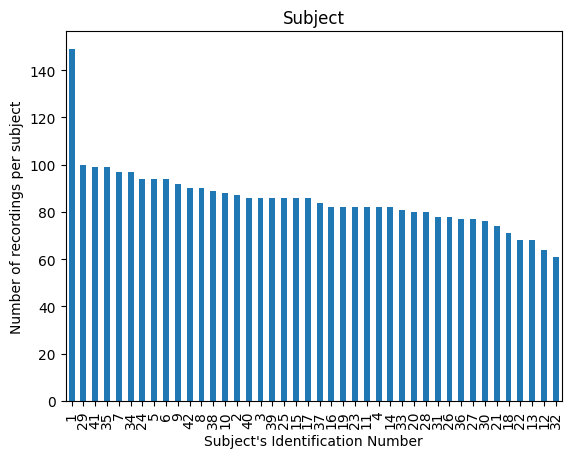

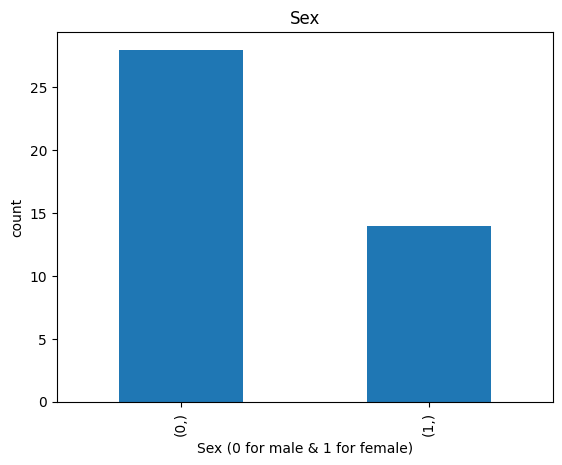




  Histograms  



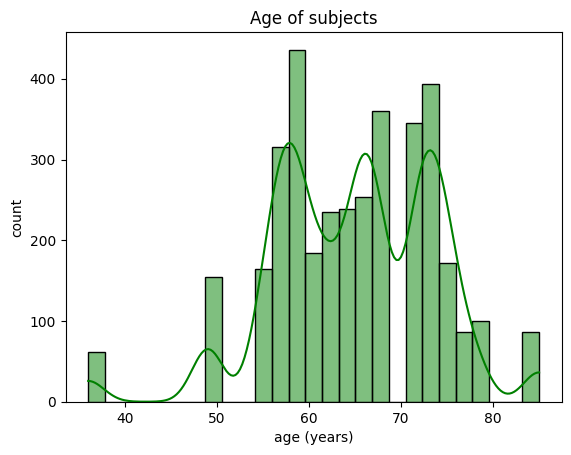

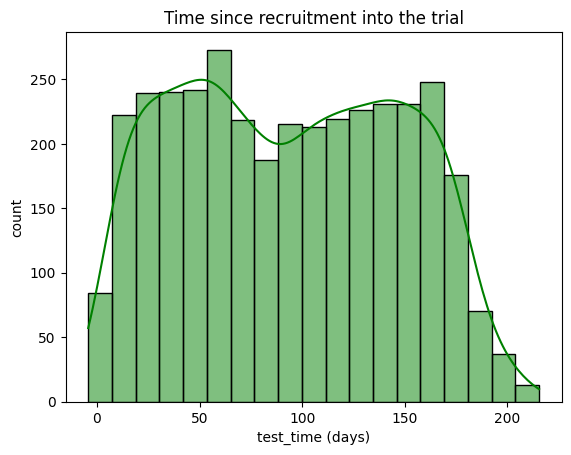

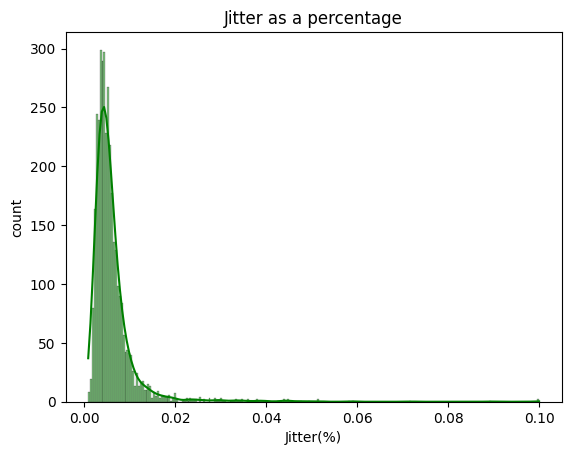

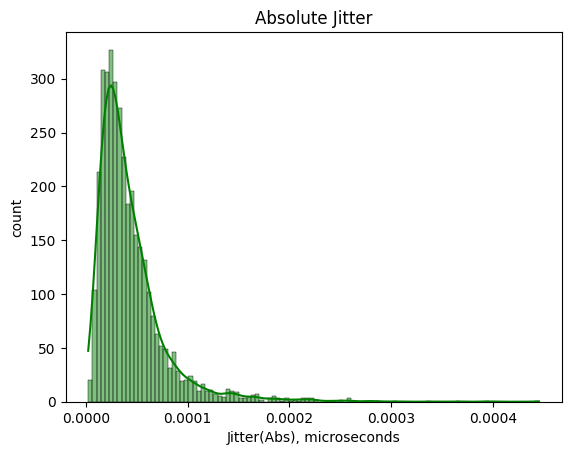

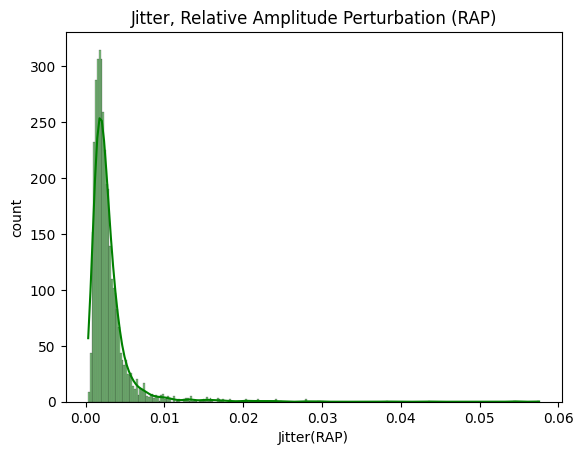

...

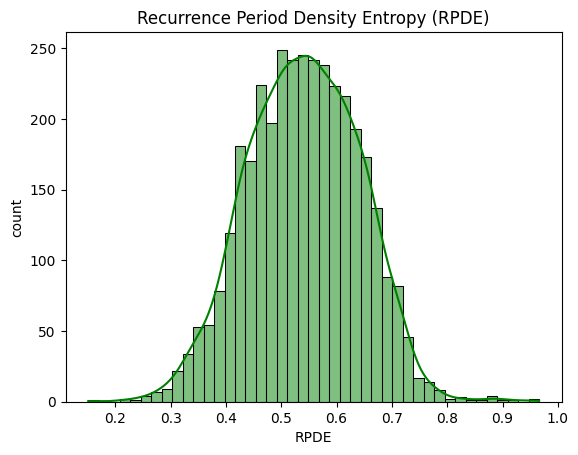

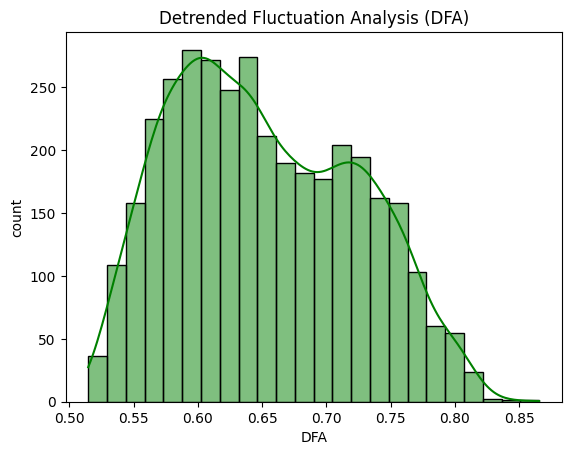

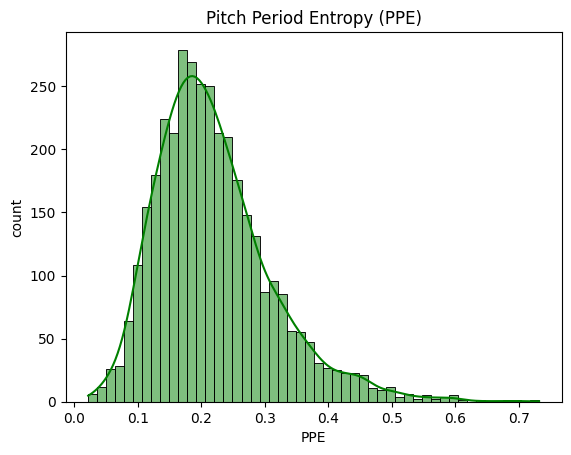

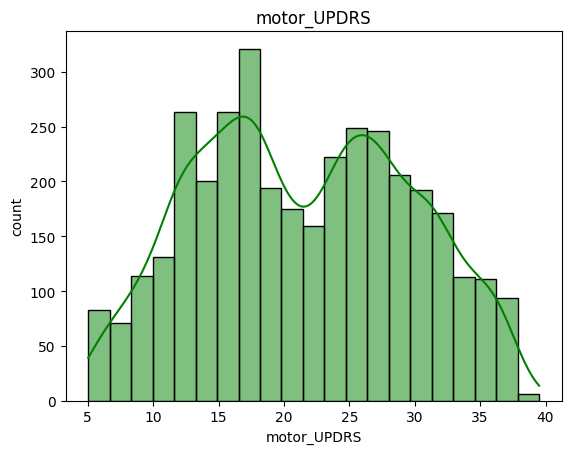

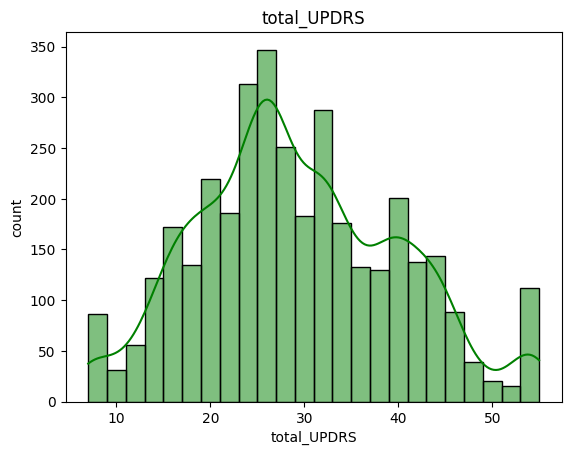

In [ ]:
def EDA_Graph_2(data):

  print("\n" +'\033[1m','\033[33m',"Barplots",'\033[0m',"\n")

  #subject
  train_counts_subject = data["subject"].value_counts()

  train_counts_subject.plot(kind='bar')
  plt.xlabel("Subject's Identification Number")
  plt.ylabel('Number of recordings per subject')
  plt.title('Subject')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #sex
  grouped = data.groupby('subject').agg({'sex': ['max']})
  train_counts_sex = grouped["sex"].value_counts()

  train_counts_sex.plot(kind='bar')
  plt.xlabel('Sex (0 for male & 1 for female)')
  plt.ylabel('count')
  plt.title('Sex')
  plt.show()
  print("\n")

  ##########################################################################################################################

  print("\n" +'\033[1m','\033[33m',"Histograms",'\033[0m',"\n")

  #age
  sns.histplot(data=data, x='age', kde=True, color='green', edgecolor='black')
  plt.xlabel('age (years)')
  plt.ylabel('count')
  plt.title('Age of subjects')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #test_time
  sns.histplot(data=data, x='test_time', kde=True, color='green', edgecolor='black')
  plt.xlabel('test_time (days)')
  plt.ylabel('count')
  plt.title('Time since recruitment into the trial')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #Jitter(%)
  sns.histplot(data=data, x='Jitter(%)', kde=True, color='green', edgecolor='black')
  plt.xlabel('Jitter(%)')
  plt.ylabel('count')
  plt.title('Jitter as a percentage')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #Jitter(Abs)
  sns.histplot(data=data, x='Jitter(Abs)', kde=True, color='green', edgecolor='black')
  plt.xlabel('Jitter(Abs), microseconds')
  plt.ylabel('count')
  plt.title('Absolute Jitter')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #Jitter:RAP
  sns.histplot(data=data, x='Jitter:RAP', kde=True, color='green', edgecolor='black')
  plt.xlabel('Jitter(RAP)')
  plt.ylabel('count')
  plt.title('Jitter, Relative Amplitude Perturbation (RAP)')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #Jitter:PPQ5
  sns.histplot(data=data, x='Jitter:PPQ5', kde=True, color='green', edgecolor='black')
  plt.xlabel('Jitter(PPQ5), quotient')
  plt.ylabel('count')
  plt.title('Jitter, Five-Point Period Perturbation Quotient (PPQ5)')
  plt.show()
  print("\n")

  # ##########################################################################################################################

  #Jitter:DDP
  sns.histplot(data=data, x='Jitter:DDP', kde=True, color='green', edgecolor='black')
  plt.xlabel('Jitter(DDP)')
  plt.ylabel('count')
  plt.title('Jitter, Average absolute difference of differences between cycles, divided by the average period (DDP)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #Shimmer
  sns.histplot(data=data, x='Shimmer', kde=True, color='green', edgecolor='black')
  plt.xlabel('Shimmer')
  plt.ylabel('count')
  plt.title('Local Shimmer')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #Shimmer(dB)
  sns.histplot(data=data, x='Shimmer(dB)', kde=True, color='green', edgecolor='black')
  plt.xlabel('Shimmer(dB), decibels')
  plt.ylabel('count')
  plt.title('Local Shimmer in decibels (dB)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #Shimmer:APQ3
  sns.histplot(data=data, x='Shimmer:APQ3', kde=True, color='green', edgecolor='black')
  plt.xlabel('Shimmer(APQ3), quotient')
  plt.ylabel('count')
  plt.title('Shimmer, Three point Amplitude Perturbation Quotient (APQ3)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #Shimmer:APQ5
  sns.histplot(data=data, x='Shimmer:APQ5', kde=True, color='green', edgecolor='black')
  plt.xlabel('Shimmer(APQ5), quotient')
  plt.ylabel('count')
  plt.title('Shimmer, Five point Amplitude Perturbation Quotient (APQ5)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #Shimmer:APQ11
  sns.histplot(data=data, x='Shimmer:APQ11', kde=True, color='green', edgecolor='black')
  plt.xlabel('Shimmer(APQ11), quotient')
  plt.ylabel('count')
  plt.title('Shimmer, Eleven point Amplitude Perturbation Quotient (APQ11)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #Shimmer:DDA
  sns.histplot(data=data, x='Shimmer:DDA', kde=True, color='green', edgecolor='black')
  plt.xlabel('Shimmer(DDA)')
  plt.ylabel('count')
  plt.title('Shimmer, difference between consecutive differences between the amplitudes of consecutive periods (DDA)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #NHR
  sns.histplot(data=data, x='NHR', kde=True, color='green', edgecolor='black')
  plt.xlabel('NHR, ratio')
  plt.ylabel('count')
  plt.title('Noise-to-Harmonics Ratio (NHR)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #HNR
  sns.histplot(data=data, x='HNR', kde=True, color='green', edgecolor='black')
  plt.xlabel('HNR, ratio')
  plt.ylabel('count')
  plt.title('HNR, Harmonics-to-Noise Ratio (HNR)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #RPDE
  sns.histplot(data=data, x='RPDE', kde=True, color='green', edgecolor='black')
  plt.xlabel('RPDE')
  plt.ylabel('count')
  plt.title('Recurrence Period Density Entropy (RPDE)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #DFA
  sns.histplot(data=data, x='DFA', kde=True, color='green', edgecolor='black')
  plt.xlabel('DFA')
  plt.ylabel('count')
  plt.title('Detrended Fluctuation Analysis (DFA)')
  plt.show()
  print("\n")

  ###########################################################################################################################

  #PPE
  sns.histplot(data=data, x='PPE', kde=True, color='green', edgecolor='black')
  plt.xlabel('PPE')
  plt.ylabel('count')
  plt.title('Pitch Period Entropy (PPE)')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #motor_UPDRS
  sns.histplot(data=data, x='motor_UPDRS', kde=True, color='green', edgecolor='black')
  plt.xlabel('motor_UPDRS')
  plt.ylabel('count')
  plt.title('motor_UPDRS')
  plt.show()
  print("\n")

  ##########################################################################################################################

  #total_UPDRS
  sns.histplot(data=data, x='total_UPDRS', kde=True, color='green', edgecolor='black')
  plt.xlabel('total_UPDRS')
  plt.ylabel('count')
  plt.title('total_UPDRS')
  plt.show()
  print("\n")

# Call the function
EDA_Graph_2(data)

### **4.2.3. METRIC VARIABLES (BIVARIATE ANALYSIS)**

* Pairplot
* JointPlot
* Scatterplots
* Pearson Correlation Coefficient
* Spearman Correlation Coefficient

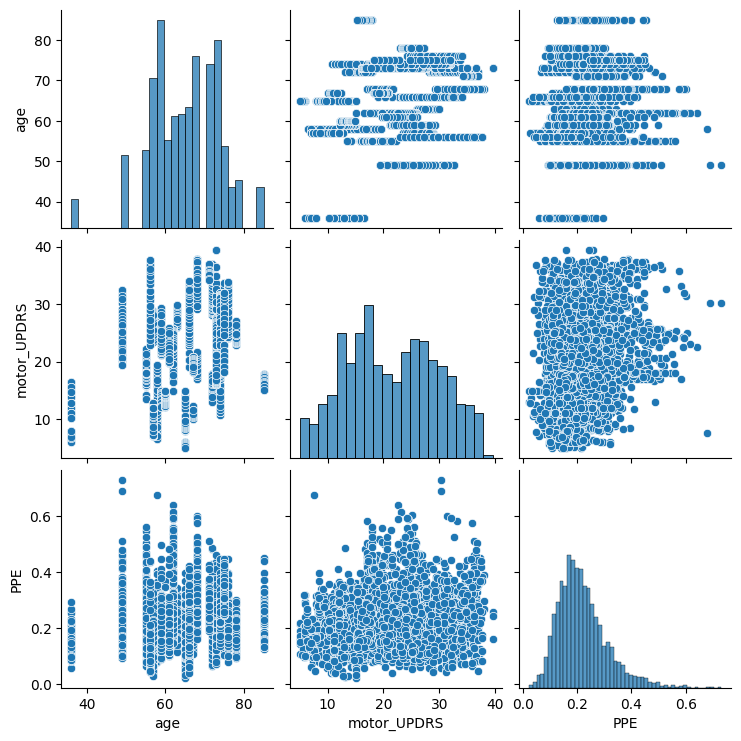

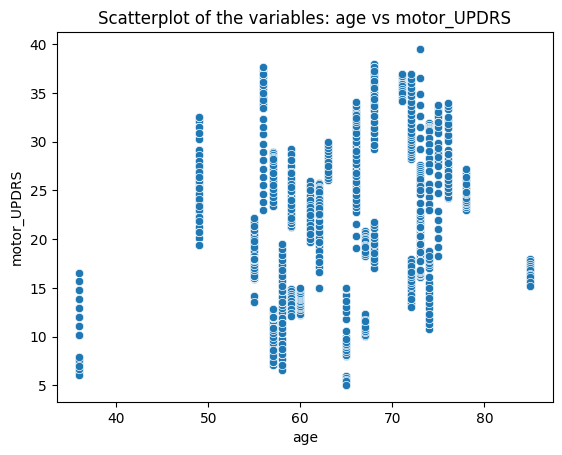

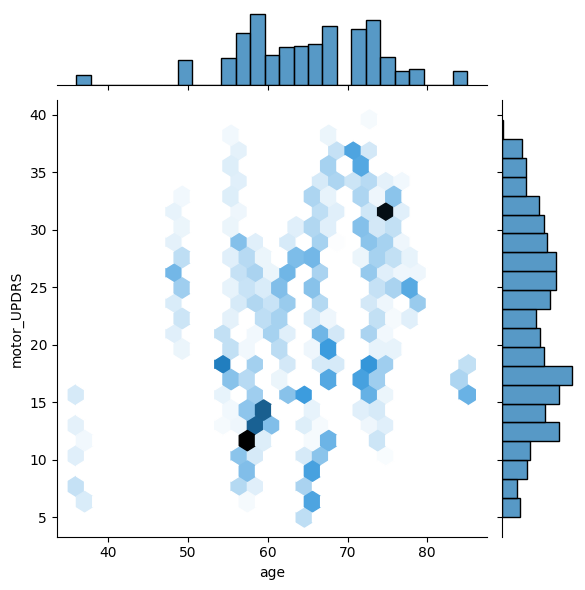

In [ ]:
#Function for Scatterplots
def EDA_Graph_Extra3(data):

  #Pairplot
  data_pairplot = data[['age','motor_UPDRS',"PPE"]]
  sns.pairplot(data_pairplot)
  plt.show()

  sns.scatterplot(x='age', y='motor_UPDRS', data=data)
  plt.xlabel('age')
  plt.ylabel('motor_UPDRS')
  plt.title('Scatterplot of the variables: age vs motor_UPDRS')
  plt.show()

  sns.jointplot(data=data, x="age", y="motor_UPDRS",kind="hex")
  plt.show()

EDA_Graph_Extra3(data)

In [ ]:
#"Pearson's Correlation Coefficient of the metric variables" of the training dataset
corr_Pearson_matrix = data.corr()

#Sorting values (useful for Section)
corr_Pearson_serie = corr_Pearson_matrix["motor_UPDRS"].sort_values(ascending=False)

print("\n" +'\033[1m','\033[33m', "Correlation Matrix (Pearson Coefficient)", '\033[0m' + "\n")
corr_Pearson_matrix


  Correlation Matrix (Pearson Coefficient) 



,subject,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
subject,1.000000,-0.052365,0.297517,-0.001726,0.209668,0.217103,0.142898,0.093411,0.129233,0.146097,...,0.149007,0.121260,0.146030,0.182270,0.121261,0.174562,-0.226829,0.165387,0.135351,0.165758
age,-0.052365,1.000000,-0.048949,0.024603,0.282680,0.316182,0.011735,0.024627,-0.000769,0.002866,...,0.097716,0.086258,0.075365,0.114988,0.086258,-0.000632,-0.090137,0.076209,-0.110127,0.104907
sex,0.297517,-0.048949,1.000000,-0.005091,-0.050313,-0.111658,0.052674,-0.151942,0.076617,0.087845,...,0.060237,0.048736,0.070936,0.032585,0.048739,0.167875,-0.009845,-0.148895,-0.145808,-0.107025
test_time,-0.001726,0.024603,-0.005091,1.000000,0.069940,0.079028,-0.021866,-0.010663,-0.025801,-0.019500,...,-0.043221,-0.038747,-0.045504,-0.053047,-0.038743,-0.022157,0.050192,-0.045870,0.021597,-0.006629
motor_UPDRS,0.209668,0.282680,-0.050313,0.069940,1.000000,0.947476,0.074269,0.039854,0.063341,0.069145,...,0.091120,0.066514,0.072014,0.116734,0.066514,0.066099,-0.133199,0.103239,-0.133771,0.151383
total_UPDRS,0.217103,0.316182,-0.111658,0.079028,0.947476,1.000000,0.066394,0.058583,0.057461,0.058575,...,0.084907,0.066321,0.068738,0.106727,0.066322,0.054590,-0.142698,0.135472,-0.129381,0.147580
Jitter(%),0.142898,0.011735,0.052674,-0.021866,0.074269,0.066394,1.000000,0.853991,0.983405,0.967768,...,0.709074,0.653014,0.691915,0.654006,0.653012,0.813529,-0.669548,0.411929,0.233610,0.721286
Jitter(Abs),0.093411,0.024627,-0.151942,-0.010663,0.039854,0.058583,0.853991,1.000000,0.833650,0.780978,...,0.655636,0.622231,0.623299,0.590131,0.622228,0.695209,-0.709642,0.543110,0.360856,0.793405
Jitter:RAP,0.129233,-0.000769,0.076617,-0.025801,0.063341,0.057461,0.983405,0.833650,1.000000,0.945807,...,0.678329,0.639894,0.657650,0.616152,0.639891,0.778342,-0.635586,0.367572,0.222869,0.670538
Jitter:PPQ5,0.146097,0.002866,0.087845,-0.019500,0.069145,0.058575,0.967768,0.780978,0.945807,1.000000,...,0.725478,0.663587,0.731938,0.677267,0.663585,0.852631,-0.659069,0.369426,0.187158,0.667045


<Axes: >

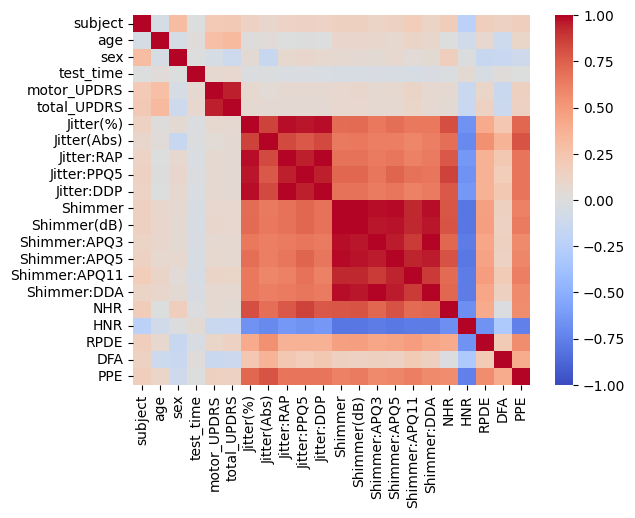

In [ ]:
sns.heatmap(corr_Pearson_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1, center=0)

In [ ]:
#"Spearman's Rank Correlation Coefficient of the metric variables" of the training dataset
corr_Spearman_matrix = data.corr(method="spearman")

#Sorting values (useful for Section)
corr_Spearman_serie = corr_Spearman_matrix["motor_UPDRS"].sort_values(ascending=False)

print("\n" +'\033[1m','\033[33m', "Correlation Matrix (Spearman Coefficient)", '\033[0m' + "\n")
corr_Spearman_matrix


  Correlation Matrix (Spearman Coefficient) 



,subject,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
subject,1.000000,-0.036620,0.297093,-0.000413,0.197384,0.232926,0.157771,0.097949,0.158388,0.154571,...,0.092761,0.088662,0.094531,0.132576,0.088665,0.130477,-0.194604,0.161199,0.145108,0.147009
age,-0.036620,1.000000,-0.045986,0.016036,0.312043,0.325422,0.157582,0.115003,0.121061,0.151237,...,0.257568,0.220124,0.239209,0.283756,0.220112,0.156151,-0.168932,0.119924,-0.109170,0.164783
sex,0.297093,-0.045986,1.000000,-0.000331,-0.056787,-0.084249,-0.100955,-0.336420,-0.005410,-0.105224,...,-0.098873,-0.058528,-0.094971,-0.135779,-0.058519,-0.069760,0.066624,-0.148389,-0.133874,-0.178646
test_time,-0.000413,0.016036,-0.000331,1.000000,0.062601,0.064687,-0.017627,-0.020298,-0.020953,-0.012717,...,-0.044284,-0.039739,-0.044839,-0.049265,-0.039747,-0.050440,0.054736,-0.043532,0.020251,-0.011025
motor_UPDRS,0.197384,0.312043,-0.056787,0.062601,1.000000,0.957649,0.114440,0.058422,0.094024,0.106485,...,0.122358,0.095644,0.100105,0.142993,0.095633,0.118600,-0.132891,0.087109,-0.146948,0.149625
total_UPDRS,0.232926,0.325422,-0.084249,0.064687,0.957649,1.000000,0.116475,0.090396,0.097865,0.106372,...,0.124392,0.104373,0.106438,0.142518,0.104366,0.128973,-0.140973,0.122018,-0.155755,0.142123
Jitter(%),0.157771,0.157582,-0.100955,-0.017627,0.114440,0.116475,1.000000,0.905371,0.956923,0.960287,...,0.676916,0.618206,0.624457,0.639459,0.618196,0.798447,-0.757004,0.528065,0.450445,0.853083
Jitter(Abs),0.097949,0.115003,-0.336420,-0.020298,0.058422,0.090396,0.905371,1.000000,0.825749,0.889785,...,0.637107,0.582401,0.608975,0.638980,0.582391,0.744971,-0.760622,0.636218,0.507264,0.813832
Jitter:RAP,0.158388,0.121061,-0.005410,-0.020953,0.094024,0.097865,0.956923,0.825749,1.000000,0.949491,...,0.662643,0.635595,0.620529,0.604285,0.635588,0.748809,-0.727469,0.445830,0.440555,0.781524
Jitter:PPQ5,0.154571,0.151237,-0.105224,-0.012717,0.106485,0.106372,0.960287,0.889785,0.949491,1.000000,...,0.703571,0.661414,0.670270,0.673080,0.661408,0.756255,-0.791532,0.514184,0.491272,0.848283


<Axes: >

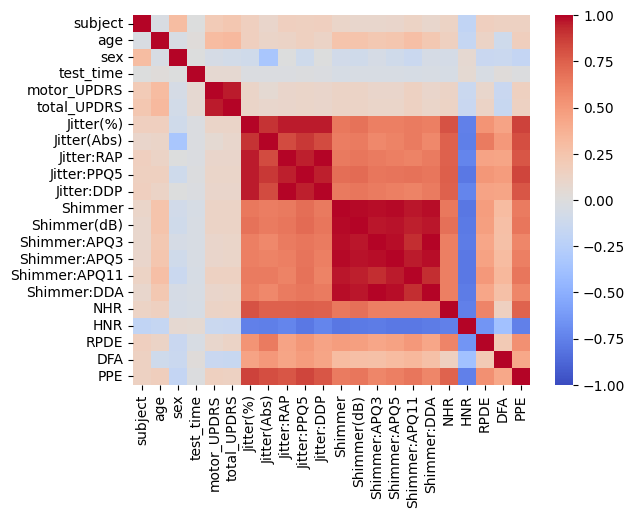

In [ ]:
sns.heatmap(corr_Spearman_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1, center=0)

In [ ]:
#Transforming the series of correlation with the variable price (from Section and) into dataframes
corr_Pearson_df_1 = pd.DataFrame(corr_Pearson_serie)
corr_Spearman_df_1 = pd.DataFrame(corr_Spearman_serie)

#Reseting the indexes of the newly created dataframes
corr_Pearson_df_1.reset_index(inplace=True)
corr_Spearman_df_1.reset_index(inplace=True)

#Renaming columns of the newly created dataframes
corr_Pearson_df_1 = corr_Pearson_df_1.rename(columns = {"index":"Metric Variable","motor_UPDRS":"Pearson Correlation"})
corr_Spearman_df_1 = corr_Spearman_df_1.rename(columns = {"index":"Metric Variable","motor_UPDRS":"Spearman Correlation"})

#Concatenating the newly created dataframes (Pearson and Spearman Correlation Coefficient of each feature with the target variable "Price")
print("\n" +'\033[1m','\033[33m', "Comparison of Pearson and Spearman Correlation Coefficient", '\033[0m' + "\n")
corr_compare_df_1 = pd.concat([corr_Pearson_df_1, corr_Spearman_df_1], axis=1)
corr_compare_df_1


  Comparison of Pearson and Spearman Correlation Coefficient 



,Metric Variable,Pearson Correlation,Metric Variable,Spearman Correlation
0,motor_UPDRS,1.000000,motor_UPDRS,1.000000
1,total_UPDRS,0.947476,total_UPDRS,0.957649
2,age,0.282680,age,0.312043
3,subject,0.209668,subject,0.197384
4,PPE,0.151383,PPE,0.149625
5,Shimmer:APQ11,0.116734,Shimmer:APQ11,0.142993
6,RPDE,0.103239,Shimmer(dB),0.122358
7,Shimmer(dB),0.091120,NHR,0.118600
8,Shimmer,0.084116,Shimmer,0.117644
9,Jitter(%),0.074269,Jitter(%),0.114440


# **5. FEATURE ENGINEERING**

*  Building the main Pipelines.

In [ ]:
#Data
data_c1 = data.copy()
data_c1.info()

#Training Set
  # X
x_training_bfs = data_c1.drop(['motor_UPDRS',"total_UPDRS","subject"], axis=1)
x_training_bfs.info()

  # Y
y_training_bfs = data_c1['motor_UPDRS']

<class 'pandas.core.frame.DataFrame'>
Index: 3584 entries, 0 to 5874
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject        3584 non-null   int64  
 1   age            3584 non-null   int64  
 2   sex            3584 non-null   int64  
 3   test_time      3584 non-null   float64
 4   motor_UPDRS    3584 non-null   float64
 5   total_UPDRS    3584 non-null   float64
 6   Jitter(%)      3584 non-null   float64
 7   Jitter(Abs)    3584 non-null   float64
 8   Jitter:RAP     3584 non-null   float64
 9   Jitter:PPQ5    3584 non-null   float64
 10  Jitter:DDP     3584 non-null   float64
 11  Shimmer        3584 non-null   float64
 12  Shimmer(dB)    3584 non-null   float64
 13  Shimmer:APQ3   3584 non-null   float64
 14  Shimmer:APQ5   3584 non-null   float64
 15  Shimmer:APQ11  3584 non-null   float64
 16  Shimmer:DDA    3584 non-null   float64
 17  NHR            3584 non-null   float64
 18  HNR          

In [ ]:
#Function that define the "pipeline" for feature transformation
def transformer_pipeline(X):

    #metric features transformations (valid for: Boosted Tree)
    metric_features = X.select_dtypes(exclude='object').columns.tolist()
    metric_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="median")),
        ]
    )

    #Preprocessor (valid for: Boosted Tree)
    transformer_features = ColumnTransformer(
        transformers=[
            ("metric", metric_transformer, metric_features),
        ],
        remainder='passthrough',
        verbose_feature_names_out=False
    )

    #Output: Pipeline ({transformation/preprocessing of the data})
    return transformer_features

In [ ]:
#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
def regression_pipeline(estimator_model, X):

    reg_pipeline = Pipeline(
        steps=[
            ("transformations", transformer_pipeline(X)),
            ("regressor", estimator_model)
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data} + {model})
    return reg_pipeline

 # **6. FEATURE SELECTION AND DIMENSIONALITY REDUCTION - BOOSTED TREES**

 * Principal Component Analysis (PCA)
 * Manual Selection (based on EDA, PCA & domain knowledge)
 * Select K-best
 * Recursive Feature Elimination with Cross Validation (RFECV)
 * Sequential Feature Selector (SFS)
 * Summary of the "Feature Selection Process" (according to the "model" and according to the "feature selection technique")

## **6.1. PRINCIPAL COMPONENT ANALYSIS (PCA)**

* **Goal of using PCA in this project**: Spot positive or negative linear correlations among the features because:

  * This information and the insights gained during the Exploratory Data Analysis (EDA) will be used during the process of "Manual Selection of Features".

  * "Shapley Values" can be sensitive to "correlated features", as it becomes difficult to disentangle the "individual contributions" of each feature to the output of the model.
  
  * "Partial Dependency Plots" (PDP) assumes that the features are independent when visualizing the marginal effect of a single feature; therefore, if this assumption is violated, the PDP's method may not represent the true "feature's change" effects.

* **Important**: This method does not work properly as an "automatic feature selector" because its main goal is to reduce the dimensionality of the feature space creating new variables called "principal components", explaining the maximum amount of variance (mainly in the first one principal components). The following step were developed in PCA:

  * Step 1: Transforming the training dataset
  * Step 2: Performing Principal Component Analysis (PCA)
  * Step 2.1: Computing: Eigenvalues, Eigenvectors, Proportion of variance explained and Cumulative Proportion of variance explained.
  * Step 2.2: Scree Plot
  * Step 2.3: Loading Plot
  * Step 2.4: Cumulative Explained Variance Plot

Feature scaling (StandardScaler) was applied for several reasons:
* Less sensitive to outliers compared to MinMaxScaler (more than 50% of  features have outliers).
* Preserves the shape of the original distribution
* Preferred for algorithms assuming normally distributed data (some of the features have a normally distribution shape).

In [ ]:
#Function that define the "pipeline" for feature transformation in the exclusive case of Principal Component Analysis (PCA)
def pca_transformer_pipeline(X):

    #metric features transformations (valid for transforming the data that is going to be used in PCA)
    metric_features = X.select_dtypes(exclude='object').columns.tolist()
    metric_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler())
        ]
    )

    #Preprocessor (valid for transforming the data that is going to be used in PCA)
    pca_transformer_features = ColumnTransformer(
        transformers=[
            ("metric", metric_transformer, metric_features),
        ],
        remainder='passthrough',
        verbose_feature_names_out=False
    )

    #Output: Pipeline ({transformation/preprocessing of the data})
    return pca_transformer_features

In [ ]:
#Function that define the "pipeline" for PCA (of course this pipeline has inside the pipeline called "pca_transformer_features")
def pca_pipeline(X):

    pca_pipeline = Pipeline(
        steps=[
            ("transformations", pca_transformer_pipeline(X)),
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data})
    return pca_pipeline

In [ ]:
#Pipeline exclusive for transforming the training data that is going to be used in PCA (i.e., standardization is a key point in this process)
pca_scaling = pca_pipeline(x_training_bfs)

#Fitting the data to the pipeline called "pca_pipeline" exclusive for PCA
pca_scaling.fit(x_training_bfs, y_training_bfs)

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False))])

In [ ]:
#Transfomed Features that belong to the training dataset
X_scaled = pca_scaling.transform(x_training_bfs)
X_scaled

array([[ 0.8042221 , -0.67463769, -1.63947445, ..., -1.20788066,
        -1.45129505, -0.64952807],
       [ 0.8042221 , -0.67463769, -1.50864794, ..., -1.0486236 ,
        -1.22136285, -1.21879441],
       [ 0.8042221 , -0.67463769, -1.3779686 , ..., -0.77783698,
        -1.51275094, -0.10085875],
       ...,
       [-0.44408107, -0.67463769,  1.17673336, ..., -0.62205282,
        -1.02293207, -0.85210187],
       [-0.44408107, -0.67463769,  1.30545671, ...,  0.27822089,
        -1.24245755, -0.84695262],
       [-0.44408107, -0.67463769,  1.43585662, ...,  0.45117108,
        -1.13698406, -0.72293232]])

In [ ]:
#Performing PCA
pca = PCA()
pca.fit(X_scaled)

PCA()

In [ ]:
#Computing: Eigenvalues

  #It represents the amount of variance each principal "component explains".
  #It is important to highlight that the first components (i.e., components N° 1, 2 or 3) explain more variance...
  #...that the last components (i.e., components N° 12, 13 and 14 as we can see in:
    #The printed "eigenvalues"
    #The "Scree Plot"
    #The "Cumulative Explained Variance Plot"
  #In addition, it determines the number of "principal components" to retain (where the "eigenvalues" start to level off).
      #The goal is to retain the minimum number of "components" that explain a good amount of the "total variance" (between 80-90% of the "total variance")

eigenvalues = pca.explained_variance_
print(eigenvalues)

[1.12281573e+01 1.72423591e+00 1.46879974e+00 1.03888665e+00
 9.91540960e-01 7.97323977e-01 7.20648625e-01 2.93146882e-01
 2.14612315e-01 1.84767617e-01 1.53867564e-01 9.88896341e-02
 4.21444531e-02 2.12594683e-02 1.29055211e-02 9.55198715e-03
 4.56379146e-03 3.70453529e-07 2.07118784e-08]


In [ ]:
#Computing: Eigenvectors

  #They are the directions of the "principal components", (i.e., the "eigenvectors" are a linear combination of the original features)

eigenvectors = pca.components_
print(eigenvectors)

[[ 2.05116063e-02  1.09152790e-02 -1.21301346e-02  2.65757122e-01
   2.49260443e-01  2.58006486e-01  2.63992989e-01  2.58008184e-01
   2.78604663e-01  2.78998239e-01  2.68651205e-01  2.75402962e-01
   2.63597458e-01  2.68650449e-01  2.56545732e-01 -2.57428177e-01
   1.66410120e-01  7.54907120e-02  2.30464381e-01]
 [-1.80276391e-01 -1.75888455e-01  5.62534291e-02  2.75099823e-01
   3.07287175e-01  2.84106206e-01  2.10558242e-01  2.84107850e-01
  -2.50578466e-01 -2.40533266e-01 -2.74091091e-01 -2.57183640e-01
  -2.35943445e-01 -2.74093893e-01 -1.48185908e-02  4.13951810e-02
   5.07346766e-02  3.28168767e-01  2.29372370e-01]
 [-1.69368552e-01  5.43010155e-01  1.75652171e-03  1.86426821e-01
  -9.06255651e-02  2.23429006e-01  2.31692594e-01  2.23413310e-01
  -2.86250329e-02 -2.89817083e-02 -4.70308149e-02 -1.25323071e-02
  -9.18503606e-02 -4.70282531e-02  2.47957370e-01  2.06358724e-01
  -3.83683783e-01 -4.00831449e-01 -2.30966300e-01]
 [ 7.63002640e-01 -1.10543013e-01  5.10574003e-01  7.52

In [ ]:
#Computing: Proportion of variance explained

  #It is the proportion of the "total variance" in the data that that a specific "component" has.
  #It determines how much of the original data's information is preserved per "component".

proportion = pca.explained_variance_ratio_
print(proportion)

[5.90790762e-01 9.07239376e-02 7.72836797e-02 5.46629883e-02
 5.21718054e-02 4.19527110e-02 3.79182922e-02 1.54244784e-02
 1.12922334e-02 9.72189810e-03 8.09603326e-03 5.20326537e-03
 2.21751021e-03 1.11860719e-03 6.79048432e-04 5.02595893e-04
 2.40132530e-04 1.94921140e-08 1.08979471e-09]


In [ ]:
#Computing: Cumulative Proportion of variance explained

  #It is the "cumulative sum" of the "variance explained" for each "component".

cumulative_proportion = np.cumsum (proportion)
print(cumulative_proportion)

[0.59079076 0.6815147  0.75879838 0.81346137 0.86563317 0.90758588
 0.94550418 0.96092866 0.97222089 0.98194279 0.99003882 0.99524209
 0.9974596  0.9985782  0.99925725 0.99975985 0.99999998 1.
 1.        ]


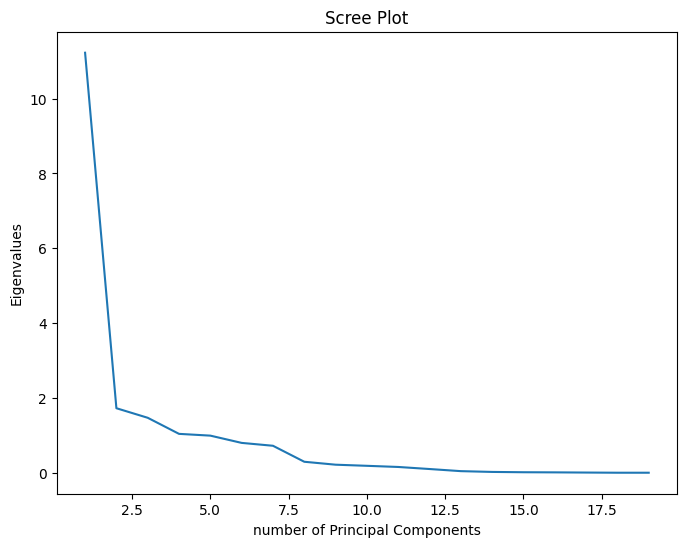

In [ ]:
##Scree Plot

  #Graphical representation that displays the "eigenvalues" vs "principal components" in descending order.
  #It determines the number of "principal components" to retain by identifying the "elbow" in the plot (where the "eigenvalues" start to level off).
    #The goal is to retain the minimum number of "components" that explain a satisfactory amount of the "total variance", often 80-90%.

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(eigenvalues)+1),eigenvalues)
plt.xlabel('number of Principal Components')
plt.ylabel('Eigenvalues')
plt.title('Scree Plot')
plt.show()

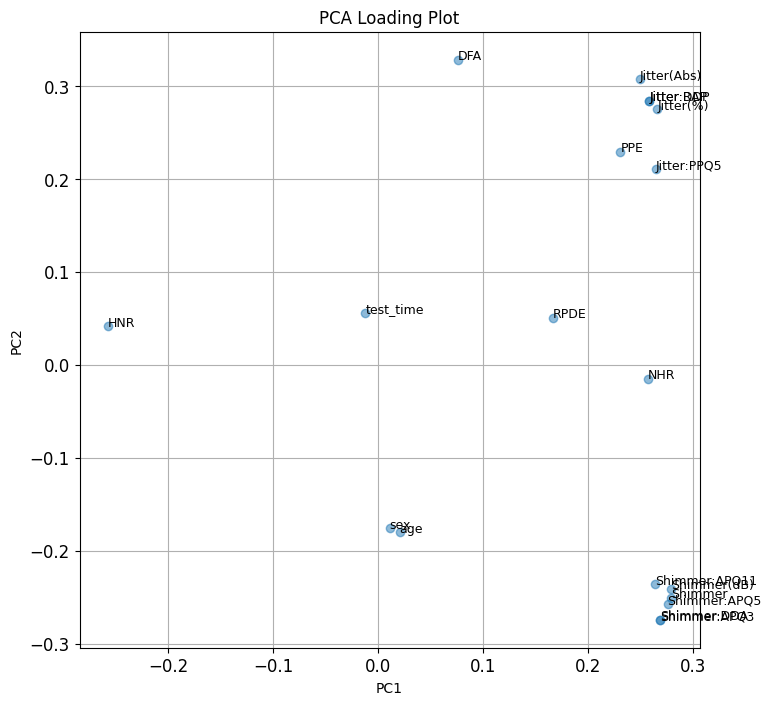

In [ ]:
#Loading Plot
#It shows the loadings of each variable for the first two principal components.
#Loadings: coefficients that indicate the relative weight or importance of each "feature" in the "principal components".
#This information (i.e. the "loadings" come from the "eigenvectors").
#Variables with high "loading" (close to -1 or 1) have a strong influence on a specific "principal components".
#To make easier the visualization only the first two "principal components" (that explain the vast majority of the "total variance") were shown.

#PCA (through the "Loading Plot") is useful to spot "correlations" among the original variables.
#Variables with similar loadings are positively correlated
#Variables with opposite loadings are negatively correlated: opposite in sign (one positive, one negative) on the same principal component.

#Loadings = Transpose of eigenvectors
loadings = pca.components_.T

#Building the Loading Plot
plt.figure(figsize=(8, 8))
plt.scatter(loadings[:,0], loadings[:,1], alpha=0.5)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

#Add feature labels in the graph
# Assuming 'feature_names' is a list containing the original column names
feature_names = ['age',
                 'sex',
                 'test_time',
                 'Jitter(%)',
                 'Jitter(Abs)',
                 'Jitter:RAP',
                 'Jitter:PPQ5',
                 'Jitter:DDP',
                 'Shimmer',
                 'Shimmer(dB)',
                 'Shimmer:APQ3',
                 'Shimmer:APQ5',
                 'Shimmer:APQ11',
                 'Shimmer:DDA',
                 'NHR',
                 'HNR',
                 'RPDE',
                 'DFA',
                 'PPE']

for i, feature in enumerate(feature_names): # Use the list of feature names instead of X_scaled.columns
  plt.annotate(feature, (loadings[i,0], loadings[i,1]), fontsize=9)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Loading Plot')
plt.grid()
plt.show()

In [ ]:
pca19 = PCA(n_components=19)
# fit PCA model to beast cancer data
pca19.fit(X_scaled)
# transform data onto the first two principal components
pca_features19 = pca19.transform(X_scaled)
print("Original shape: {}".format(str(X_scaled.shape)))
print("Reduced shape: {}".format(str(pca_features19.shape)))

Original shape: (3584, 19)
Reduced shape: (3584, 19)


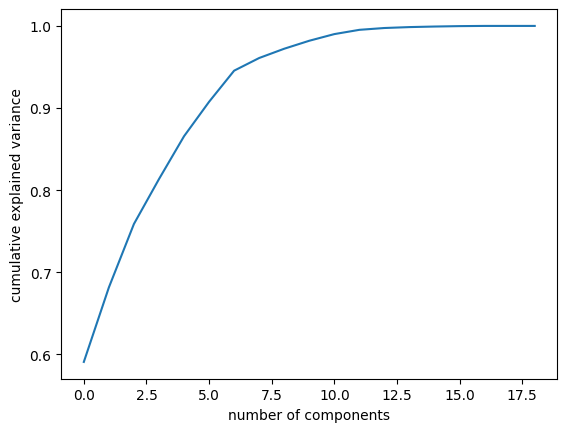

In [ ]:
plt.plot(np.cumsum(pca19.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

## **6.2. MANUAL (BASED ON EDA, PCA, & DOMAIN KNOWLEDGE)**

In [ ]:
#Phase - Manual - Boosted Tree

In [ ]:
#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
def regression_pipeline_m(estimator_model, X):

    reg_pipeline = Pipeline(
        steps=[
            ("transformations", transformer_pipeline(X)),
            ("regressor", estimator_model)
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data} + {model})
    return reg_pipeline

In [ ]:
#Pipeline exclusive for the model:
bt_m = regression_pipeline_m(GradientBoostingRegressor(max_depth=2, random_state=21), x_training_bfs)

#Fitting the data to the pipeline exclusive for the model:
bt_m.fit(x_training_bfs, y_training_bfs)

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=2, random_state=21))])

In [ ]:
#Getting the prediction:
y_pred_bt_m = bt_m.predict(x_training_bfs)
print(y_pred_bt_m)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(bt_m.score(x_training_bfs, y_training_bfs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_m = mean_absolute_error(y_training_bfs, y_pred_bt_m)
print("MAE:", mae_bt_m)
rmse_bt_m = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=False)
print("RMSE:",rmse_bt_m)
mse_bt_m = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=True)
print("MSE:",mse_bt_m)

#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_m = bt_m['transformations'].get_feature_names_out()
print("Features:", features_bt_m)
  #Features Shape
print("Features:", features_bt_m.shape)

[26.18611676 24.01058904 26.1360035  ... 21.36314971 21.74294949
 21.74294949]
0.6172260452614544
MAE: 4.195439573541383
RMSE: 5.035795124485732
MSE: 25.35923253579427
Features: ['age' 'sex' 'test_time' 'Jitter(%)' 'Jitter(Abs)' 'Jitter:RAP'
 'Jitter:PPQ5' 'Jitter:DDP' 'Shimmer' 'Shimmer(dB)' 'Shimmer:APQ3'
 'Shimmer:APQ5' 'Shimmer:APQ11' 'Shimmer:DDA' 'NHR' 'HNR' 'RPDE' 'DFA'
 'PPE']
Features: (19,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#Dataframe of "Feature and Coefficients"
features_bt_m_df1 = pd.DataFrame(
    dict(
        features_bt_m = bt_m['transformations'].get_feature_names_out(),
    ),
)
features_bt_m_df1

,features_bt_m
0,age
1,sex
2,test_time
3,Jitter(%)
4,Jitter(Abs)
5,Jitter:RAP
6,Jitter:PPQ5
7,Jitter:DDP
8,Shimmer
9,Shimmer(dB)


## **6.3. UNIVARIATE FEATURE SELECTION: SELECT K BEST**

* **Goal**: choose features individually based on their relationship with the target variable, without considering feature interactions.

* **Important:**  the "scoring function" choosen was "f_regression" because it is suitable for "Regression", it is based on "scoring function" called "r_regression" and it is less computational expensive than the "scoring function" called "mutual_info_regression".

* **Important:** Different values of "k" were tried (e.g., 2, 4, 6, 8, 10, 12, 14, 16, 18, 20) and the model's performance was evaluated using the Mean Absolute Error (MAE) to select "k value" that provided a good balance between performance (MAE) and model complexity (number of variables).

In [ ]:
#Phase - KBest - Boosted Tree

In [ ]:
#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
  #<---The same for all models. It will make easier the evaluation
def regression_pipeline_k(estimator_model, X):

    reg_pipeline = Pipeline(
        steps=[
            ("transformations", transformer_pipeline(X)),
            ("feat_sel_k", SelectKBest(f_regression, k=4)),
            ("regressor", estimator_model),
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data} + {model})
    return reg_pipeline

In [ ]:
#Pipeline exclusive for the model:
bt_k_best = regression_pipeline_k(GradientBoostingRegressor(max_depth=2, random_state=21), x_training_bfs)

#Fitting the data to the pipeline exclusive for the model:
bt_k_best.fit(x_training_bfs, y_training_bfs)

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False)),
                ('feat_sel_k',
                 SelectKBest(k=4,
                             score_func=<function f_regression at 0x7bfa6fafb9a0>)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=2, random_state=21))])

In [ ]:
#Getting the prediction:
y_pred_bt_k_best = bt_k_best.predict(x_training_bfs)
print(y_pred_bt_k_best)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(bt_k_best.score(x_training_bfs, y_training_bfs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_k_best = mean_absolute_error(y_training_bfs, y_pred_bt_k_best)
print("MAE:", mae_bt_k_best)
rmse_bt_k_best = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=False)
print("RMSE:", rmse_bt_k_best)
mse_bt_k_best = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=True)
print("MSE:", mse_bt_k_best)

#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_k_best = bt_k_best['feat_sel_k'].get_feature_names_out()
print("Features:", features_bt_k_best)
  #Features Shape
print("Features:", features_bt_k_best.shape)

[27.12779686 25.69309405 27.12779686 ... 20.34538923 21.30718166
 21.30718166]
0.6205008556077152
MAE: 4.134070270286336
RMSE: 5.035795124485732
MSE: 25.35923253579427
Features: ['x0' 'x15' 'x17' 'x18']
Features: (4,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#Dataframe of "Feature and Coefficients"
features_bt_k_best_df1 = pd.DataFrame(
    dict(
        features_bt_k_best = bt_k_best['feat_sel_k'].get_feature_names_out(),
    ),
)
features_bt_k_best_df1

,features_bt_k_best
0,x0
1,x15
2,x17
3,x18


In [ ]:
#Data for k-best selection (MAE)
data_k_best_experiments = [[2, 4.317619787048539],
                           [4, 4.134070270286336],
                           [6, 4.205885699312133],
                           [8, 4.2374125771676985],
                           [10, 4.2262753367705646],
                           [12, 4.233546487286586],
                           [14, 4.235920848131045],
                           [16, 4.334837158094602],
                           [18, 4.235272990152494]]

# Create the pandas DataFrame
data_k_best_experiments_df = pd.DataFrame(data_k_best_experiments, columns=['k value', "Boosted Tree MAE"])

# print dataframe.
data_k_best_experiments_df

,k value,Boosted Tree MAE
0,2,4.317620
1,4,4.134070
2,6,4.205886
3,8,4.237413
4,10,4.226275
5,12,4.233546
6,14,4.235921
7,16,4.334837
8,18,4.235273


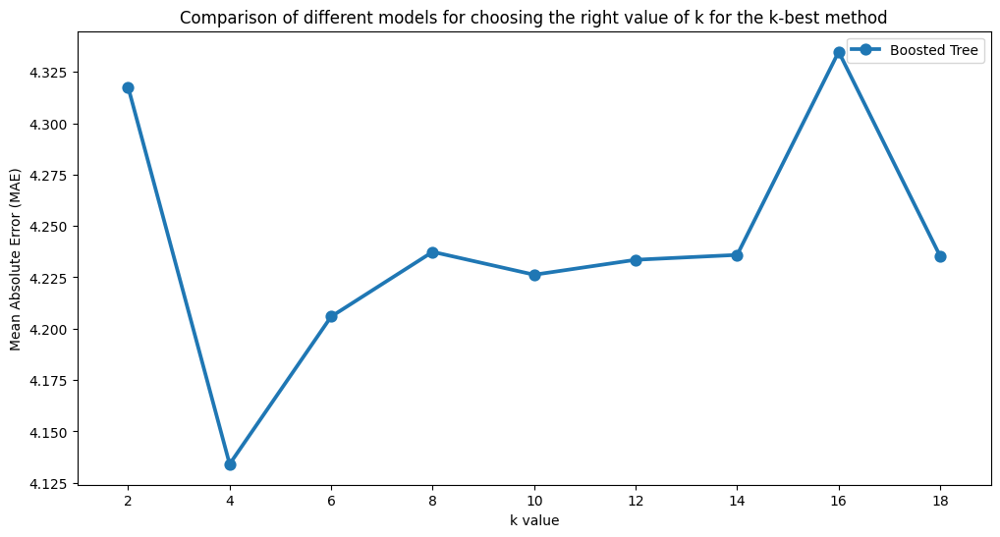

In [ ]:
# Create the point plot
plt.figure(figsize=(12, 6))
sns.pointplot(x='k value', y='Boosted Tree MAE', data=data_k_best_experiments_df, label='Boosted Tree')

# Add labels and title
plt.xlabel('k value')
plt.ylabel('Mean Absolute Error (MAE)')
plt.title('Comparison of different models for choosing the right value of k for the k-best method')
plt.legend()

# Display the plot
plt.show()

## **6.4. RECURSIVE FEATURE ELIMINATION WITH CROSS VALIDATION (RFECV)**

* **Goal**: Choose features using a method that starts with the full set of features and iteratively removes the least important ones. It will use a machine learning model (in this case, a "linear regression" through its "coefficients") to rank the univariate measure of importance and then remove the least important ones. Finally, it captures multivariate relationships.

In [ ]:
#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
  #<---The same for all models. It will make easier the evaluation
def regression_pipeline_RFECV(estimator_model, X):

    reg_pipeline = Pipeline(
        steps=[
            ("transformations", transformer_pipeline(X)),
            ("feat_sel_RFECV", RFECV(LinearRegression(), step=1, cv=5)),
            ("regressor", estimator_model),
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data} + {model})
    return reg_pipeline

In [ ]:
#Phase - RFECV - Boosted Tree

In [ ]:
#Pipeline exclusive for the model:
bt_RFECV = regression_pipeline_RFECV(GradientBoostingRegressor(max_depth=2, random_state=21), x_training_bfs)

#Fitting the data to the pipeline exclusive for the model:
bt_RFECV.fit(x_training_bfs, y_training_bfs)

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False)),
                ('feat_sel_RFECV', RFECV(cv=5, estimator=LinearRegression())),
                ('regressor',
                 GradientBoostingRegressor(max_depth=2, random_state=21))])

In [ ]:
#Getting the prediction:
y_pred_bt_RFECV = bt_RFECV.predict(x_training_bfs)
print(y_pred_bt_RFECV)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(bt_RFECV.score(x_training_bfs, y_training_bfs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_RFECV = mean_absolute_error(y_training_bfs, y_pred_bt_RFECV)
print("MAE:", mae_bt_RFECV)
rmse_bt_RFECV = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=False)
print("RMSE:", rmse_bt_RFECV)
mse_bt_RFECV = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=True)
print("MSE:", mse_bt_RFECV)

#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_RFECV = bt_RFECV['feat_sel_RFECV'].get_feature_names_out()
print("Features:", features_bt_RFECV)
  #Features Shape
print("Features:", features_bt_RFECV.shape)

[22.38877499 20.62860032 20.47200625 ... 21.19676965 21.16613037
 20.62860032]
0.03790021997149229
MAE: 6.848533317499294
RMSE: 5.035795124485732
MSE: 25.35923253579427
Features: ['x5']
Features: (1,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#Dataframe of "Feature and Coefficients"
features_bt_RFECV_df1 = pd.DataFrame(
    dict(
        features_bt_RFECV = bt_RFECV['feat_sel_RFECV'].get_feature_names_out(),
    ),
)
features_bt_RFECV_df1

,features_bt_RFECV
0,x5


In [ ]:
# should match the number of features
# The size of all values in cv_results_ is equal to:
  # ceil((n_features - min_features_to_select) / step) + 1 ;where:
    #"n_features" represents the total number of features or elements we're working with.
    #"step" is the number of features removed at each iteration.
    #"ceil": This takes the ceiling of the division result, ensuring that even fractional steps are rounded up to the nearest...
    #..whole number. This means that even if the division results in a fractional step, it's counted as a full step.
    #"min_features_to_select" is 1 (by default)

#The performance of the RFE selector are evaluated using "scorer" for different number of selected features and aggregated together.
  #Finally, the "scores" are averaged across folds and the number of features selected is set to the number of features that maximize...
  #...the cross-validation score.
#mean_test_score: Mean of scores over the folds.
#std_test_scoren: Standard deviation of scores over the folds.

#Number of scores = same number of original features (before to RFECV)
n_scores = len (bt_RFECV['feat_sel_RFECV'].cv_results_['mean_test_score'])
print(n_scores)

#Scores
print(np.flip(bt_RFECV['feat_sel_RFECV'].cv_results_['mean_test_score']))

19
[-0.99167189 -0.98433959 -1.01579821 -1.0350708  -0.96132544 -0.96222048
 -0.93890697 -0.89074944 -0.93390966 -0.94277135 -0.92675766 -0.82830095
 -0.84680526 -0.84466546 -0.85796604 -0.85732661 -0.84963136 -0.83640271
 -0.81826131]


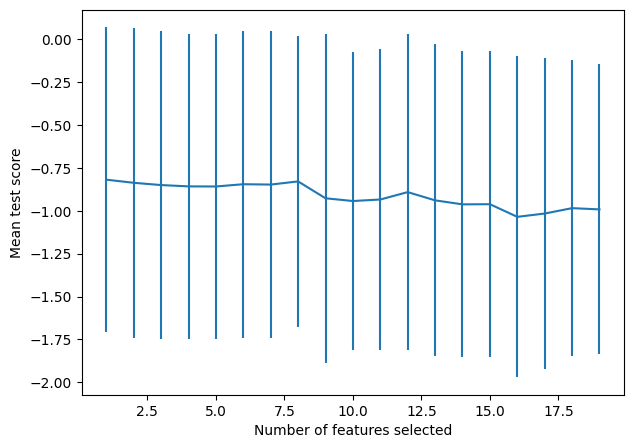

In [ ]:
fig, ax = plt.subplots(figsize=(7,5))
ax.errorbar(
    range(1, n_scores+1),
    bt_RFECV['feat_sel_RFECV'].cv_results_["mean_test_score"],
    yerr = bt_RFECV['feat_sel_RFECV'].cv_results_["std_test_score"],
)
ax.set_xlabel("Number of features selected")
ax.set_ylabel("Mean test score");

## **6.5. SEQUENTIAL FEATURE SELECTOR (SFS)**

* **Goal**: choose features using a method that starts with an empty set of features and iteratively adds or removes features (also called "forward or/and backward selection") based on the model's performance (i.e. it ranks the features based on the model's performance). Finally, it captures multivariate relationships.

In [ ]:
#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
  #<---The same for all models. It will make easier the evaluation

  #Sequential Feature Selector adds (forward selection) features to form a feature subset in a greedy fashion.
    #At each stage, this "estimator" (i.e., the model that could be "linear, random forest, boosted trees") chooses the best feature to...
    #...add or remove based on the cross-validation score of an "estimator".

    #"n_features_to_select": If "auto", the behaviour depends on the "tol" parameter.
    #tol: float; If the score is not incremented by at least "tol" between two consecutive feature additions or removals, stop adding or removing.
      #"tol" does not represent a percentage (%)
      #"tol" stands for "tolerance" and specifies the threshold for the stopping criteria during the search for the optimal subset of features.
      #If the improvement in the "scoring metric" (specified by the scoring parameter [MAE, RMSE, MSE,...]) is less than the value of "tol",...
      #... the search stops, considering that the improvement is not significant enough to continue.
      #"tol": is an absolute value that determines the minimum improvement required in the scoring metric"..
      #...(specified by the scoring parameter [MAE, RMSE, MSE,...]) to continue the feature selection process. I

def regression_pipeline_SFS(estimator_model, X):

    reg_pipeline = Pipeline(
        steps=[
            ("transformations", transformer_pipeline(X)),
            ("feat_sel_SFS", SequentialFeatureSelector(LinearRegression(), n_features_to_select='auto', direction="forward", tol=0.01)),
            ("regressor", estimator_model),
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data} + {model})
    return reg_pipeline

In [ ]:
#Phase - SFS - Boosted Tree

In [ ]:
#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
  #<---The same for all models. It will make easier the evaluation

  #Sequential Feature Selector adds (forward selection) features to form a feature subset in a greedy fashion.
    #At each stage, this "estimator" (i.e., the model that could be "linear, random forest, boosted trees") chooses the best feature to...
    #...add or remove based on the cross-validation score of an "estimator".

    #"n_features_to_select": If "auto", the behaviour depends on the "tol" parameter.
    #tol: float; If the score is not incremented by at least "tol" between two consecutive feature additions or removals, stop adding or removing.
      #"tol" does not represent a percentage (%)
      #"tol" stands for "tolerance" and specifies the threshold for the stopping criteria during the search for the optimal subset of features.
      #If the improvement in the "scoring metric" (specified by the scoring parameter [MAE, RMSE, MSE,...]) is less than the value of "tol",...
      #... the search stops, considering that the improvement is not significant enough to continue.
      #"tol": is an absolute value that determines the minimum improvement required in the scoring metric"..
      #...(specified by the scoring parameter [MAE, RMSE, MSE,...]) to continue the feature selection process.

In [ ]:
#Pipeline exclusive for the model:
bt_SFS = regression_pipeline_SFS(GradientBoostingRegressor(max_depth=2, random_state=21), x_training_bfs)

#Fitting the data to the pipeline exclusive for the model:
bt_SFS.fit(x_training_bfs, y_training_bfs)

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False)),
                ('feat_sel_SFS',
                 SequentialFeatureSelector(estimator=LinearRegression(),
                                           tol=0.01)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=2, random_state=21))])

In [ ]:
#Getting the prediction:
y_pred_bt_SFS = bt_SFS.predict(x_training_bfs)
print(y_pred_bt_SFS)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(bt_SFS.score(x_training_bfs, y_training_bfs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_SFS = mean_absolute_error(y_training_bfs, y_pred_bt_SFS)
print("MAE:", mae_bt_SFS)
rmse_bt_SFS = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=False)
print("RMSE:", rmse_bt_SFS)
mse_bt_SFS = mean_squared_error(y_training_bfs, y_pred_bt_m, squared=True)
print("MSE:", mse_bt_SFS)

#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_SFS = bt_SFS['feat_sel_SFS'].get_feature_names_out()
print("Features:", features_bt_SFS)
  #Features Shape
print("Features:", features_bt_SFS.shape)

[25.41592478 25.69183989 25.41592478 ... 21.46918399 21.46918399
 21.46918399]
0.595462001545767
MAE: 4.3191792306789285
RMSE: 5.035795124485732
MSE: 25.35923253579427
Features: ['x0' 'x4' 'x18']
Features: (3,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#Dataframe of "Feature and Coefficients"
features_bt_SFS_df1 = pd.DataFrame(
    dict(
        features_bt_SFS = bt_SFS['feat_sel_SFS'].get_feature_names_out(),
    ),
)
features_bt_SFS_df1

,features_bt_SFS
0,x0
1,x4
2,x18


## **6.6. MAIN SUMMARY OF FEATURE SELECTION**

In [ ]:
#MOST IMPORTANT FEATURES
#MANUAL
#Boosted Tree
features_bt_m_df2 = pd.DataFrame(
    dict(
        features_bt_m = bt_m['transformations'].get_feature_names_out(),
    ),
)
features_bt_m_df2.rename(columns = {'features_bt_m':'features'}, inplace = True)

# ##################################################################################################
#KBEST
#Boosted Tree
features_bt_k_best_df2 = pd.DataFrame(
    dict(
        features_bt_k_best = bt_k_best['feat_sel_k'].get_feature_names_out(),
    ),
)
features_bt_k_best_df2.rename(columns = {'features_bt_k_best':'features'}, inplace = True)

# ###################################################################################################
#RFECV
#Boosted Tree
features_bt_RFECV_df2 = pd.DataFrame(
    dict(
        features_bt_RFECV = bt_RFECV['feat_sel_RFECV'].get_feature_names_out(),
    ),
)
features_bt_RFECV_df2.rename(columns = {'features_bt_RFECV':'features'}, inplace = True)

# ###################################################################################################
# #SFS
#Boosted Tree
features_bt_SFS_df2 = pd.DataFrame(
    dict(
        features_bt_SFS = bt_SFS['feat_sel_SFS'].get_feature_names_out(),
    ),
)
features_bt_SFS_df2.rename(columns = {'features_bt_SFS':'features'}, inplace = True)

In [ ]:
#ORGANIZATION PER TECHNIQUE
#DATAFRAME CONCATENATION - MANUAL
features_m_frequency = pd.concat([features_bt_m_df2],
                                  axis=0 )

###################################################################################################
#DATAFRAME CONCATENATION - KBEST
features_k_best_frequency = pd.concat([features_bt_k_best_df2],
                                  axis=0 )
###################################################################################################
#DATAFRAME CONCATENATION - RFECV
features_RFECV_frequency = pd.concat([features_bt_RFECV_df2],
                                  axis=0 )

###################################################################################################
#DATAFRAME CONCATENATION - SFS
features_SFS_frequency = pd.concat([features_bt_SFS_df2],
                                  axis=0 )

In [ ]:
#ORGANIZATION PER TECHNIQUE - COUNT
value_counts_features_m_frequency = features_m_frequency['features'].value_counts()[0:20]

value_counts_features_k_best_frequency = features_k_best_frequency['features'].value_counts()[0:20]

value_counts_features_RFECV_frequency = features_RFECV_frequency['features'].value_counts()[0:20]

value_counts_features_SFS_frequency = features_SFS_frequency['features'].value_counts()[0:20]

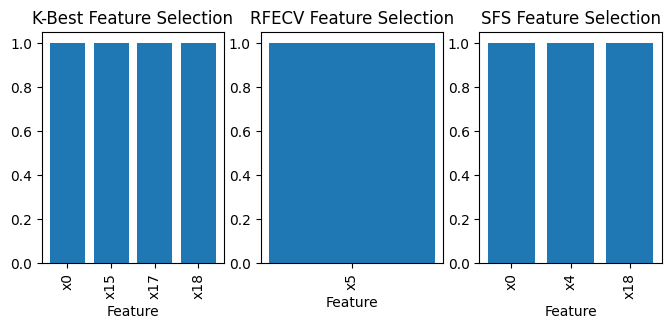

In [ ]:
# Create a figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(8, 3))

# Plot the second bar plot
axes[0].bar(value_counts_features_k_best_frequency.index, value_counts_features_k_best_frequency.values)
axes[0].set_title('K-Best Feature Selection')
axes[0].set_xlabel('Feature')
axes[0].tick_params(axis='x', rotation=90)

# Plot the third bar plot
axes[1].bar(value_counts_features_RFECV_frequency.index, value_counts_features_RFECV_frequency.values)
axes[1].set_title('RFECV Feature Selection')
axes[1].set_xlabel('Feature')
axes[1].tick_params(axis='x', rotation=90)

# Plot the fourth bar plot
axes[2].bar(value_counts_features_SFS_frequency.index, value_counts_features_SFS_frequency.values)
axes[2].set_title('SFS Feature Selection')
axes[2].set_xlabel('Feature')
axes[2].tick_params(axis='x', rotation=90)

# Display the plot
plt.show()

In [ ]:
#ORGANIZATION PER MODEL
###################################################################################################
#DATAFRAME CONCATENATION - BOOSTED TREE
features_bt_frequency = pd.concat([features_bt_k_best_df2,
                                  features_bt_RFECV_df2,
                                  features_bt_SFS_df2],
                                  axis=0 )

In [ ]:
#ORGANIZATION PER TECHNIQUE - COUNT
value_counts_features_bt_frequency = features_bt_frequency['features'].value_counts()[0:20]

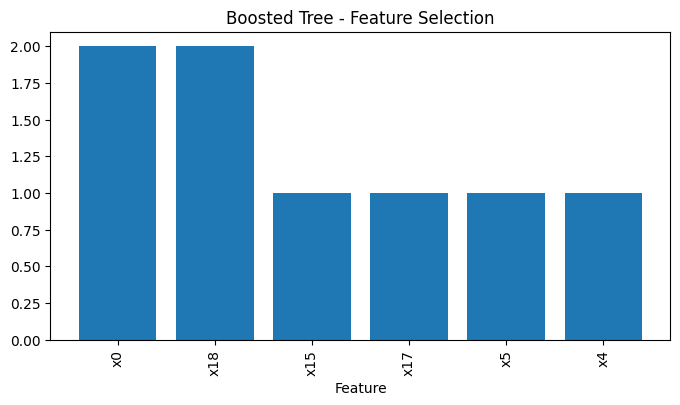

In [ ]:
import matplotlib.pyplot as plt

# Assuming value_counts_features_bt_frequency is a Pandas Series or similar
# with indices as feature names and values as counts

# Create a figure with a specified size
plt.figure(figsize=(8, 4))

# Plot a single bar plot
plt.bar(value_counts_features_bt_frequency.index, value_counts_features_bt_frequency.values)

# Set title and labels
plt.title('Boosted Tree - Feature Selection')
plt.xlabel('Feature')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Display the plot
plt.show()


# **7. MODEL BUILDING, EVALUATION, ANALYSIS (PERFORMANCE) - SELECTED FEATURES - BOOSTED TREES**

* **Training Phase** / **Validation Phase** (tune the hyperparameters and select the best model configuration) / **Test Phase** (evaluate the performance and test generalization)

  * Boosted Tree

Model  | Main Property | Pros | Cons |
-------|----------|-----------|------------|
**Linear**      | Capture linear relationships. |$\uparrow$ Interpretability $\downarrow$ Overfit. | Struggle with complex non-linear relationships. Perform better with smaller datasets and fewer features. |
**Polynomial**      | Capture non-linear relationships. | $\uparrow, \downarrow$ Interpretability (more flexible than linear models) | $\uparrow$ Overfit. May struggle with extrapolation. |
**Random Forest**      | Capture complex non-linear relationships. | $\downarrow$ Overfit (robust to noise). | $\downarrow$ Interpretability (harder to interpret than individual decision trees). Slower to train. |
**Boosted Tree**      | Great predictive performance. | Outperform Random Forests. | $\uparrow$ Overfit. More complex to tune and train |
**Voter Ensemble**      | Great predictive performance. | Outperform Random Forests. | $\uparrow$ Overfit. More complex to tune and train |

In [ ]:
#Data
data_c2 = data.copy()
data_c2.info()

#Training Set
  # X
x_training_bfs = data_c1.drop(['motor_UPDRS',"total_UPDRS"], axis=1)

  # Y
y_training_bfs = data_c1['motor_UPDRS']

<class 'pandas.core.frame.DataFrame'>
Index: 3584 entries, 0 to 5874
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject        3584 non-null   int64  
 1   age            3584 non-null   int64  
 2   sex            3584 non-null   int64  
 3   test_time      3584 non-null   float64
 4   motor_UPDRS    3584 non-null   float64
 5   total_UPDRS    3584 non-null   float64
 6   Jitter(%)      3584 non-null   float64
 7   Jitter(Abs)    3584 non-null   float64
 8   Jitter:RAP     3584 non-null   float64
 9   Jitter:PPQ5    3584 non-null   float64
 10  Jitter:DDP     3584 non-null   float64
 11  Shimmer        3584 non-null   float64
 12  Shimmer(dB)    3584 non-null   float64
 13  Shimmer:APQ3   3584 non-null   float64
 14  Shimmer:APQ5   3584 non-null   float64
 15  Shimmer:APQ11  3584 non-null   float64
 16  Shimmer:DDA    3584 non-null   float64
 17  NHR            3584 non-null   float64
 18  HNR          

In [ ]:
x_training_bfs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3584 entries, 0 to 5874
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject        3584 non-null   int64  
 1   age            3584 non-null   int64  
 2   sex            3584 non-null   int64  
 3   test_time      3584 non-null   float64
 4   Jitter(%)      3584 non-null   float64
 5   Jitter(Abs)    3584 non-null   float64
 6   Jitter:RAP     3584 non-null   float64
 7   Jitter:PPQ5    3584 non-null   float64
 8   Jitter:DDP     3584 non-null   float64
 9   Shimmer        3584 non-null   float64
 10  Shimmer(dB)    3584 non-null   float64
 11  Shimmer:APQ3   3584 non-null   float64
 12  Shimmer:APQ5   3584 non-null   float64
 13  Shimmer:APQ11  3584 non-null   float64
 14  Shimmer:DDA    3584 non-null   float64
 15  NHR            3584 non-null   float64
 16  HNR            3584 non-null   float64
 17  RPDE           3584 non-null   float64
 18  DFA          

In [ ]:
#TRAINING PHASE - DATA DEFINITION

#Data definition for the Training Phase
#Training dataset
  # Independent Features X

#Training dataset for Boosted Forest
    #This dataset for the independent features X (alsco called "x_training_data_bt_after_fs") was prepared considering...
    #...the features selected in the section 6. FEATURE SELECTION AND DIMENSIONALITY REDUCTION
x_training_data_bt_after_fs = data_c2[["age",
                                      "Jitter(Abs)",
                                      "Jitter:RAP",
                                      'HNR',
                                      'DFA',
                                      'PPE']]

#Training dataset
  # Dependent Feature (also celled "Target Value") Y
  #This is the same dataset for all models (Boosted Forest) during the training phase.
y_training_data_after_fs = data_c2['motor_UPDRS']

In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 1)

#Pipeline exclusive for the model: Boosted Tree
bt_train = regression_pipeline(GradientBoostingRegressor(max_depth=5, random_state=21), x_training_data_bt_after_fs)

#Fitting the data to the pipeline exclusive for the model:
bt_train.fit(x_training_data_bt_after_fs, y_training_data_after_fs)

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'HNR', 'DFA',
                                                   'PPE'])],
                                   verbose_feature_names_out=False)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=5, random_state=21))])

In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 2)

#Getting the prediction:
y_pred_bt_train = bt_train.predict(x_training_data_bt_after_fs)
print(y_pred_bt_train)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(bt_train.score(x_training_data_bt_after_fs, y_training_data_after_fs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_train = mean_absolute_error(y_training_data_after_fs, y_pred_bt_train)
print("MAE:", mae_bt_train)
rmse_bt_train = mean_squared_error(y_training_data_after_fs, y_pred_bt_train, squared=False)
print("RMSE:", rmse_bt_train)
mse_bt_train = mean_squared_error(y_training_data_after_fs, y_pred_bt_train, squared=True)
print("MSE:", mse_bt_train)

#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_train = bt_train['transformations'].get_feature_names_out()
print("Features:", features_bt_train)
  #Features Shape
print("Features:", features_bt_train.shape)

[27.43363414 28.33224756 28.69966535 ... 21.65114332 22.09040239
 21.80146614]
0.8879233880871042
MAE: 2.0042279164281402
RMSE: 2.7249237883228603
MSE: 7.425209652167808
Features: ['age' 'Jitter(Abs)' 'Jitter:RAP' 'HNR' 'DFA' 'PPE']
Features: (6,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 3)

#Dataframe of "Feature and Coefficients"
features_bt_train_df1 = pd.DataFrame(
    dict(
        features_bt_train = bt_train['transformations'].get_feature_names_out(),
    ),
)
features_bt_train_df1

,features_bt_train
0,age
1,Jitter(Abs)
2,Jitter:RAP
3,HNR
4,DFA
5,PPE


In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 4)

# Get the transformed data as a NumPy array
transformed_data = bt_train['transformations'].transform(x_training_data_bt_after_fs)

# Option 1:  Print a few rows of the array (no head() method available)
print(transformed_data[:, :])  # Print the first 5 rows and all columns

# Option 2: Convert the NumPy array to a Pandas DataFrame to use .head()
transformed_df = pd.DataFrame(transformed_data)
print(transformed_df.head())

[[7.2000e+01 3.3800e-05 4.0100e-03 2.1640e+01 5.4842e-01 1.6006e-01]
 [7.2000e+01 1.6800e-05 1.3200e-03 2.7183e+01 5.6477e-01 1.0810e-01]
 [7.2000e+01 2.4620e-05 2.0500e-03 2.3047e+01 5.4405e-01 2.1014e-01]
 ...
 [6.1000e+01 2.4700e-05 1.5200e-03 2.5065e+01 5.7888e-01 1.4157e-01]
 [6.1000e+01 2.0340e-05 1.2800e-03 2.4422e+01 5.6327e-01 1.4204e-01]
 [6.1000e+01 2.1100e-05 1.3500e-03 2.3259e+01 5.7077e-01 1.5336e-01]]
      0         1        2       3        4        5
0  72.0  0.000034  0.00401  21.640  0.54842  0.16006
1  72.0  0.000017  0.00132  27.183  0.56477  0.10810
2  72.0  0.000025  0.00205  23.047  0.54405  0.21014
3  72.0  0.000027  0.00191  24.445  0.57794  0.33277
4  72.0  0.000020  0.00093  26.126  0.56122  0.19361


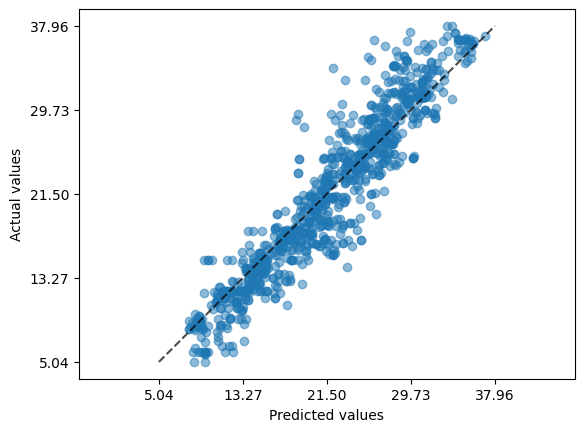

In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 5)

PredictionErrorDisplay.from_estimator(
    bt_train, x_training_data_bt_after_fs, y_training_data_after_fs, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample = 1000,random_state = 286
);

In [ ]:
#Validation Set (X dataset and Y dataset)
X_Val_1 = ValSet.drop(['motor_UPDRS'], axis=1)
Y_Val_1 = ValSet['motor_UPDRS']

In [ ]:
#VALIDATION PHASE - DATA DEFINITION (PART 4)

  # Independent Features X

#Validation dataset for Boosted Forest
    #This dataset for the independent features X (alsco called "x_training_data_bt_after_fs") was prepared considering...
    #...the features selected in the section 6. FEATURE SELECTION AND DIMENSIONALITY REDUCTION
x_validation_bt_after_fs = ValSet[["age",
                                    "Jitter(Abs)",
                                    "Jitter:RAP",
                                    'HNR',
                                    'DFA',
                                    'PPE']]
#Validation dataset
  # Dependent Feature (also celled "Target Value") Y
  #This is the same dataset for all models (Boosted Forest) during the Validation phase.
y_validation_after_fs = Y_Val_1.copy()

In [ ]:
#VALIDATION PHASE - PIPELINE / TRANSFORMATION DEFINITION (PART 2)

#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
def regression_pipeline_val(estimator_model, X, param_grid):

    reg_pipeline = Pipeline(
        steps=[
            ("transformations", transformer_pipeline(X)),
            ("regressor", estimator_model)
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data} + {model})
    return reg_pipeline

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 1)

bt_grid = dict(regressor__n_estimators=[100, 110], regressor__max_depth=[10, 20])

from sklearn.model_selection import GridSearchCV

bt_gridsearch_cv = GridSearchCV(
    regression_pipeline_val(GradientBoostingRegressor(), x_validation_bt_after_fs, bt_grid),
    bt_grid,
    cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True,
    n_jobs=-1,
    error_score='raise',
)
bt_gridsearch_cv

GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('transformations',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('metric',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median'))]),
                                                                         ['age',
                                                                          'Jitter(Abs)',
                                                                          'Jitter:RAP',
                                                                          'HNR',
                                                                          'DFA',
                                                                          'PPE'])],
                                                          verbose_feature_names_out=False)),
                                       ('regressor',
                                        GradientBoostingRegressor())]),
             n_jobs=-1,
             param_grid={'regressor__max_depth': [10, 20],
                         'regressor__n_estimators': [100, 110]},
             return_train_score=True, scoring='neg_mean_absolute_error')

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 2)

gs_results_bt = bt_gridsearch_cv.fit(x_validation_bt_after_fs, y_validation_after_fs)

gs_bt_df = pd.DataFrame(gs_results_bt.cv_results_)

gs_bt_df[ [
'param_regressor__n_estimators',
'param_regressor__max_depth', "mean_train_score",'std_train_score','mean_test_score',
 'std_test_score', 'rank_test_score'
] ].sort_values('rank_test_score')

,param_regressor__n_estimators,param_regressor__max_depth,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
1,110,10,-0.028688,0.005424,-7.098167,0.707935,1
0,100,10,-0.041317,0.007403,-7.141188,0.706601,2
3,110,20,-0.000063,0.000002,-7.642323,0.839357,3
2,100,20,-0.000181,0.000006,-7.654688,0.843212,4


In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 3)

  #Best parameters of the Validation Phase (Cross Validation)
gs_results_bt.best_params_

{'regressor__max_depth': 10, 'regressor__n_estimators': 110}

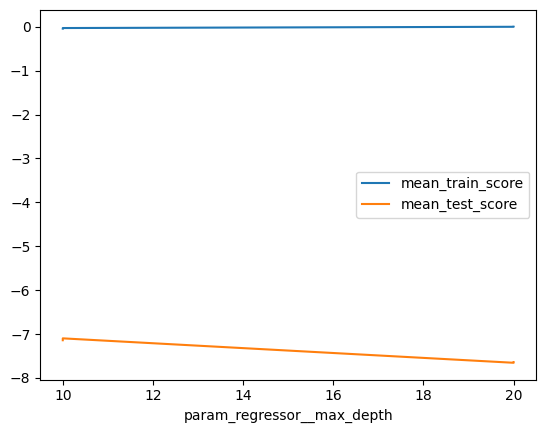

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 4)

  #Graph of on of the best parameters of the Validation Phase (Cross Validation)
gs_bt_df.set_index('param_regressor__max_depth')[['mean_train_score','mean_test_score']].plot.line();

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 5)

  #Best Linear Model (during the Validation Phase)
best_model_bt = gs_results_bt.best_estimator_
best_model_bt

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'HNR', 'DFA',
                                                   'PPE'])],
                                   verbose_feature_names_out=False)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=10, n_estimators=110))])

In [ ]:
#VALIDATION PHASE - DATA DEFINITION (PART 1)

# Access the "transformations steps" (called by me a as "transformations") from the "best estimator" (called "best_model_bt")
transformations_bt = best_model_bt.named_steps['transformations']

# Transform the input data (i.e., the independet features) using the transformations steps
X_transformed_bt_val = transformations_bt.transform(x_validation_bt_after_fs)

# Convert the transformed data to a DataFrame
X_transformed_bt_val_df = pd.DataFrame(X_transformed_bt_val, columns=x_validation_bt_after_fs.columns)
X_transformed_bt_val_df

,age,Jitter(Abs),Jitter:RAP,HNR,DFA,PPE
0,58.0,0.000085,0.00593,12.998,0.76560,0.312570
1,58.0,0.000024,0.00184,24.026,0.67828,0.156860
2,58.0,0.000046,0.00325,21.427,0.78900,0.205090
3,58.0,0.000074,0.00467,18.431,0.80335,0.325390
4,58.0,0.000030,0.00195,23.144,0.68099,0.176350
...,...,...,...,...,...,...
1140,61.0,0.000013,0.00067,28.084,0.54540,0.084809
1141,61.0,0.000024,0.00137,24.659,0.60601,0.139590
1142,61.0,0.000044,0.00245,22.185,0.63705,0.185630
1143,61.0,0.000052,0.00279,22.292,0.61083,0.136340


In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 5)

  #Best Linear Model (during the Validation Phase)
best_model_bt = gs_results_bt.best_estimator_
best_model_bt

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'HNR', 'DFA',
                                                   'PPE'])],
                                   verbose_feature_names_out=False)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=10, n_estimators=110))])

In [ ]:
    #Test Set (X dataset and Y dataset)
X_Test_1 = TestSet.drop(['motor_UPDRS'], axis=1)
Y_Test_1 = TestSet['motor_UPDRS']

In [ ]:
#TEST PHASE - DATA DEFINITION (PART 4)

  # Independent Features X

#Training dataset for Boosted Forest
    #This dataset for the independent features X (alsco called "x_training_data_bt_after_fs") was prepared considering...
    #...the features selected in the section 6. FEATURE SELECTION AND DIMENSIONALITY REDUCTION
x_test_bt_after_fs = X_Test_1[["age",
                                "Jitter(Abs)",
                                "Jitter:RAP",
                                'HNR',
                                'DFA',
                                'PPE']]

#Test dataset
  # Dependent Feature (also celled "Target Value") Y
  #This is the same dataset for all models (Boosted Forest) during the test phase.
y_test_after_fs = Y_Test_1.copy()

In [ ]:
#TEST PHASE - BOOSTED TREE (PART 1)

#Getting the prediction:
y_pred_bt_test = best_model_bt.predict(x_test_bt_after_fs)
print(y_pred_bt_test)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(best_model_bt.score(x_test_bt_after_fs, y_test_after_fs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_test = mean_absolute_error(y_test_after_fs, y_pred_bt_test)
print("MAE:", mae_bt_test)
rmse_bt_test = mean_squared_error(y_test_after_fs, y_pred_bt_test, squared=False)
print("RMSE:", rmse_bt_test)
mse_bt_test = mean_squared_error(y_test_after_fs, y_pred_bt_test, squared=True)
print("MSE:", mse_bt_test)


#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_test = best_model_bt['transformations'].get_feature_names_out()
print("Features:", features_bt_test)
  #Features Shape
print("Features:", features_bt_test.shape)

[13.4012692  14.83010788 12.28721569 ... 23.83496405 22.88645863
 21.53956038]
0.8106156874755998
MAE: 2.3153205499514877
RMSE: 3.5225496805001213
MSE: 12.408356251591506
Features: ['age' 'Jitter(Abs)' 'Jitter:RAP' 'HNR' 'DFA' 'PPE']
Features: (6,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#TEST PHASE - BOOSTED TREE (PART 2)

#Dataframe of "Feature and Coefficients"
features_bt_test_df1 = pd.DataFrame(
    dict(
        features_bt_test = best_model_bt['transformations'].get_feature_names_out(),
    ),
)
features_bt_test_df1

,features_bt_test
0,age
1,Jitter(Abs)
2,Jitter:RAP
3,HNR
4,DFA
5,PPE


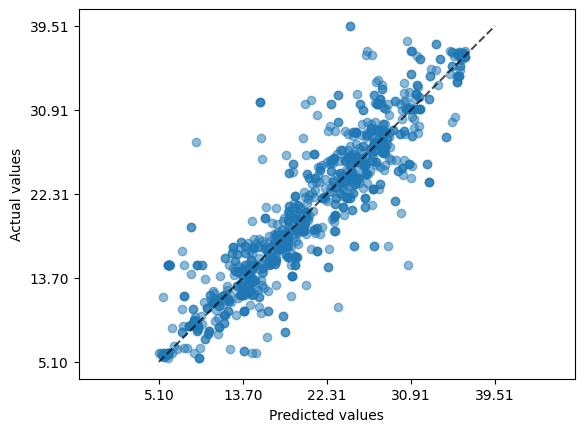

In [ ]:
#TEST PHASE - BOOSTED TREE (PART 4)

PredictionErrorDisplay.from_estimator(
    best_model_bt, x_test_bt_after_fs, y_test_after_fs, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample = 1000,random_state = 286
);

# **13. MODEL BUILDING, EVALUATION, ANALYSIS (PERFORMANCE) - ALL FEATURES - BOOSTED TREES**

* **Training Phase** / **Validation Phase** (tune the hyperparameters and select the best model configuration) / **Test Phase** (evaluate the performance and test generalization)

  * Boosted Tree

Model  | Main Property | Pros | Cons |
-------|----------|-----------|------------|
**Linear**      | Capture linear relationships. |$\uparrow$ Interpretability $\downarrow$ Overfit. | Struggle with complex non-linear relationships. Perform better with smaller datasets and fewer features. |
**Polynomial**      | Capture non-linear relationships. | $\uparrow, \downarrow$ Interpretability (more flexible than linear models) | $\uparrow$ Overfit. May struggle with extrapolation. |
**Random Forest**      | Capture complex non-linear relationships. | $\downarrow$ Overfit (robust to noise). | $\downarrow$ Interpretability (harder to interpret than individual decision trees). Slower to train. |
**Boosted Tree**      | Great predictive performance. | Outperform Random Forests. | $\uparrow$ Overfit. More complex to tune and train |
**Voter Ensemble**      | Great predictive performance. | Outperform Random Forests. | $\uparrow$ Overfit. More complex to tune and train |

In [ ]:
#Data
data_c2 = data.copy()
data_c2.info()

#Training Set
  # X
x_training_bfs = data_c1.drop(['motor_UPDRS',"total_UPDRS"], axis=1)

  # Y
y_training_bfs = data_c1['motor_UPDRS']

<class 'pandas.core.frame.DataFrame'>
Index: 3584 entries, 0 to 5874
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject        3584 non-null   int64  
 1   age            3584 non-null   int64  
 2   sex            3584 non-null   int64  
 3   test_time      3584 non-null   float64
 4   motor_UPDRS    3584 non-null   float64
 5   total_UPDRS    3584 non-null   float64
 6   Jitter(%)      3584 non-null   float64
 7   Jitter(Abs)    3584 non-null   float64
 8   Jitter:RAP     3584 non-null   float64
 9   Jitter:PPQ5    3584 non-null   float64
 10  Jitter:DDP     3584 non-null   float64
 11  Shimmer        3584 non-null   float64
 12  Shimmer(dB)    3584 non-null   float64
 13  Shimmer:APQ3   3584 non-null   float64
 14  Shimmer:APQ5   3584 non-null   float64
 15  Shimmer:APQ11  3584 non-null   float64
 16  Shimmer:DDA    3584 non-null   float64
 17  NHR            3584 non-null   float64
 18  HNR          

In [ ]:
x_training_bfs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3584 entries, 0 to 5874
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject        3584 non-null   int64  
 1   age            3584 non-null   int64  
 2   sex            3584 non-null   int64  
 3   test_time      3584 non-null   float64
 4   Jitter(%)      3584 non-null   float64
 5   Jitter(Abs)    3584 non-null   float64
 6   Jitter:RAP     3584 non-null   float64
 7   Jitter:PPQ5    3584 non-null   float64
 8   Jitter:DDP     3584 non-null   float64
 9   Shimmer        3584 non-null   float64
 10  Shimmer(dB)    3584 non-null   float64
 11  Shimmer:APQ3   3584 non-null   float64
 12  Shimmer:APQ5   3584 non-null   float64
 13  Shimmer:APQ11  3584 non-null   float64
 14  Shimmer:DDA    3584 non-null   float64
 15  NHR            3584 non-null   float64
 16  HNR            3584 non-null   float64
 17  RPDE           3584 non-null   float64
 18  DFA          

In [ ]:
#TRAINING PHASE - DATA DEFINITION

#Data definition for the Training Phase
#Training dataset
  # Independent Features X

#Training dataset for Boosted Forest
    #This dataset for the independent features X (alsco called "x_training_data_bt_after_fs") was prepared considering...
    #...the features selected in the section 6. FEATURE SELECTION AND DIMENSIONALITY REDUCTION
x_training_data_bt_after_fs = data_c2[["age",
                                       "sex",
                                      "test_time",
                                      "Jitter(%)",
                                      'Jitter(Abs)',
                                      'Jitter:RAP',
                                       "Jitter:PPQ5",
                                       "Jitter:DDP",
                                       "Shimmer",
                                       "Shimmer(dB)",
                                       "Shimmer:APQ3",
                                       "Shimmer:APQ5",
                                       "Shimmer:APQ11",
                                       "Shimmer:DDA",
                                       "NHR",
                                       "HNR",
                                       "RPDE",
                                       "DFA",
                                      'PPE']]

#Training dataset
  # Dependent Feature (also celled "Target Value") Y
  #This is the same dataset for all models (Boosted Forest) during the training phase.
y_training_data_after_fs = data_c2['motor_UPDRS']

In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 1)

#Pipeline exclusive for the model: Boosted Tree
bt_train = regression_pipeline(GradientBoostingRegressor(max_depth=5, random_state=21), x_training_data_bt_after_fs)

#Fitting the data to the pipeline exclusive for the model:
bt_train.fit(x_training_data_bt_after_fs, y_training_data_after_fs)

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=5, random_state=21))])

In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 2)

#Getting the prediction:
y_pred_bt_train = bt_train.predict(x_training_data_bt_after_fs)
print(y_pred_bt_train)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(bt_train.score(x_training_data_bt_after_fs, y_training_data_after_fs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_train = mean_absolute_error(y_training_data_after_fs, y_pred_bt_train)
print("MAE:", mae_bt_train)
rmse_bt_train = mean_squared_error(y_training_data_after_fs, y_pred_bt_train, squared=False)
print("RMSE:", rmse_bt_train)
mse_bt_train = mean_squared_error(y_training_data_after_fs, y_pred_bt_train, squared=True)
print("MSE:", mse_bt_train)

#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_train = bt_train['transformations'].get_feature_names_out()
print("Features:", features_bt_train)
  #Features Shape
print("Features:", features_bt_train.shape)

[27.10845037 27.1898405  28.14488563 ... 23.00041161 22.08488788
 21.29698007]
0.9581363890145155
MAE: 1.2123562156810241
RMSE: 1.6653871389429111
MSE: 2.773514322556455
Features: ['age' 'sex' 'test_time' 'Jitter(%)' 'Jitter(Abs)' 'Jitter:RAP'
 'Jitter:PPQ5' 'Jitter:DDP' 'Shimmer' 'Shimmer(dB)' 'Shimmer:APQ3'
 'Shimmer:APQ5' 'Shimmer:APQ11' 'Shimmer:DDA' 'NHR' 'HNR' 'RPDE' 'DFA'
 'PPE']
Features: (19,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 3)

#Dataframe of "Feature and Coefficients"
features_bt_train_df1 = pd.DataFrame(
    dict(
        features_bt_train = bt_train['transformations'].get_feature_names_out(),
    ),
)
features_bt_train_df1

,features_bt_train
0,age
1,sex
2,test_time
3,Jitter(%)
4,Jitter(Abs)
5,Jitter:RAP
6,Jitter:PPQ5
7,Jitter:DDP
8,Shimmer
9,Shimmer(dB)


In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 4)

# Get the transformed data as a NumPy array
transformed_data = bt_train['transformations'].transform(x_training_data_bt_after_fs)

# Option 1:  Print a few rows of the array (no head() method available)
print(transformed_data[:, :])  # Print the first 5 rows and all columns

# Option 2: Convert the NumPy array to a Pandas DataFrame to use .head()
transformed_df = pd.DataFrame(transformed_data)
print(transformed_df.head())

[[7.2000e+01 0.0000e+00 5.6431e+00 ... 4.1888e-01 5.4842e-01 1.6006e-01]
 [7.2000e+01 0.0000e+00 1.2666e+01 ... 4.3493e-01 5.6477e-01 1.0810e-01]
 [7.2000e+01 0.0000e+00 1.9681e+01 ... 4.6222e-01 5.4405e-01 2.1014e-01]
 ...
 [6.1000e+01 0.0000e+00 1.5682e+02 ... 4.7792e-01 5.7888e-01 1.4157e-01]
 [6.1000e+01 0.0000e+00 1.6373e+02 ... 5.6865e-01 5.6327e-01 1.4204e-01]
 [6.1000e+01 0.0000e+00 1.7073e+02 ... 5.8608e-01 5.7077e-01 1.5336e-01]]
     0    1        2        3         4        5        6        7        8   \
0  72.0  0.0   5.6431  0.00662  0.000034  0.00401  0.00317  0.01204  0.02565   
1  72.0  0.0  12.6660  0.00300  0.000017  0.00132  0.00150  0.00395  0.02024   
2  72.0  0.0  19.6810  0.00481  0.000025  0.00205  0.00208  0.00616  0.01675   
3  72.0  0.0  25.6470  0.00528  0.000027  0.00191  0.00264  0.00573  0.02309   
4  72.0  0.0  33.6420  0.00335  0.000020  0.00093  0.00130  0.00278  0.01703   

      9        10       11       12       13        14      15       16  \


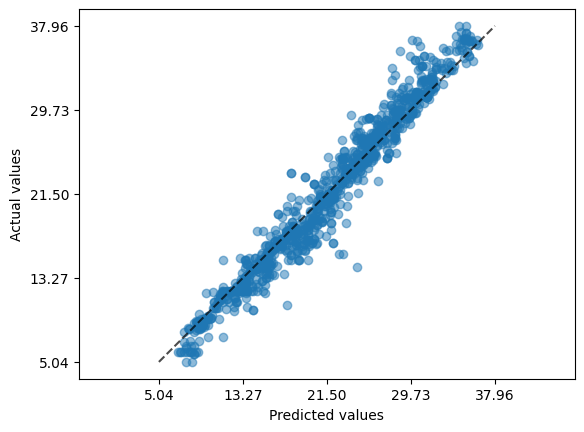

In [ ]:
#TRAINING PHASE - BOOSTED TREE (WITHOUT CROSS VALIDATION) (PART 5)

PredictionErrorDisplay.from_estimator(
    bt_train, x_training_data_bt_after_fs, y_training_data_after_fs, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample = 1000,random_state = 286
);

In [ ]:
#Validation Set (X dataset and Y dataset)
X_Val_1 = ValSet.drop(['motor_UPDRS'], axis=1)
Y_Val_1 = ValSet['motor_UPDRS']

In [ ]:
#VALIDATION PHASE - DATA DEFINITION (PART 4)

  # Independent Features X

#Validation dataset for Boosted Forest
    #This dataset for the independent features X (alsco called "x_training_data_bt_after_fs") was prepared considering...
    #...the features selected in the section 6. FEATURE SELECTION AND DIMENSIONALITY REDUCTION
x_validation_bt_after_fs = ValSet[["age",
                                       "sex",
                                      "test_time",
                                      "Jitter(%)",
                                      'Jitter(Abs)',
                                      'Jitter:RAP',
                                       "Jitter:PPQ5",
                                       "Jitter:DDP",
                                       "Shimmer",
                                       "Shimmer(dB)",
                                       "Shimmer:APQ3",
                                       "Shimmer:APQ5",
                                       "Shimmer:APQ11",
                                       "Shimmer:DDA",
                                       "NHR",
                                       "HNR",
                                       "RPDE",
                                       "DFA",
                                      'PPE']]


#Validation dataset
  # Dependent Feature (also celled "Target Value") Y
  #This is the same dataset for all models (Boosted Forest) during the Validation phase.
y_validation_after_fs = Y_Val_1.copy()

In [ ]:
#VALIDATION PHASE - PIPELINE / TRANSFORMATION DEFINITION (PART 2)

#Function that define the "pipeline" for models (of course this pipeline has inside the pipeline of feature transformation)
def regression_pipeline_val(estimator_model, X, param_grid):

    reg_pipeline = Pipeline(
        steps=[
            ("transformations", transformer_pipeline(X)),
            ("regressor", estimator_model)
        ]
    )

    #Output: Pipeline ({transformation/preprocessing of the data} + {model})
    return reg_pipeline

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 1)

bt_grid = dict(regressor__n_estimators=[100, 110], regressor__max_depth=[10, 20])

from sklearn.model_selection import GridSearchCV

bt_gridsearch_cv = GridSearchCV(
    regression_pipeline_val(GradientBoostingRegressor(), x_validation_bt_after_fs, bt_grid),
    bt_grid,
    cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True,
    n_jobs=-1,
    error_score='raise',
)
bt_gridsearch_cv

GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('transformations',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('metric',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median'))]),
                                                                         ['age',
                                                                          'sex',
                                                                          'test_time',
                                                                          'Jitter(%)',
                                                                          'Jitter(Abs)',
                                                                          'Jitter:RAP',
                                                                          'Jitter:PPQ5',
                                                                          'Jitter:DDP',
                                                                          'Shimmer',
                                                                          'Shimmer(dB)',
                                                                          'Shimmer:APQ3',
                                                                          'Shimmer:APQ5',
                                                                          'Shimmer:APQ11',
                                                                          'Shimmer:DDA',
                                                                          'NHR',
                                                                          'HNR',
                                                                          'RPDE',
                                                                          'DFA',
                                                                          'PPE'])],
                                                          verbose_feature_names_out=False)),
                                       ('regressor',
                                        GradientBoostingRegressor())]),
             n_jobs=-1,
             param_grid={'regressor__max_depth': [10, 20],
                         'regressor__n_estimators': [100, 110]},
             return_train_score=True, scoring='neg_mean_absolute_error')

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 2)

gs_results_bt = bt_gridsearch_cv.fit(x_validation_bt_after_fs, y_validation_after_fs)

gs_bt_df = pd.DataFrame(gs_results_bt.cv_results_)

gs_bt_df[ [
'param_regressor__n_estimators',
'param_regressor__max_depth', "mean_train_score",'std_train_score','mean_test_score',
 'std_test_score', 'rank_test_score'
] ].sort_values('rank_test_score')

,param_regressor__n_estimators,param_regressor__max_depth,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
1,110,10,-0.002625,0.001175,-7.461139,1.388492,1
0,100,10,-0.003786,0.001587,-7.489594,1.289956,2
3,110,20,-0.000063,0.000002,-7.995756,1.356191,3
2,100,20,-0.000181,0.000006,-8.065034,1.397138,4


In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 3)

  #Best parameters of the Validation Phase (Cross Validation)
gs_results_bt.best_params_

{'regressor__max_depth': 10, 'regressor__n_estimators': 110}

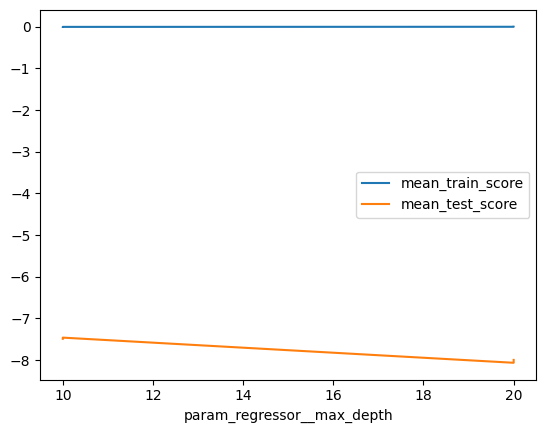

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 4)

  #Graph of on of the best parameters of the Validation Phase (Cross Validation)
gs_bt_df.set_index('param_regressor__max_depth')[['mean_train_score','mean_test_score']].plot.line();

In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 5)

  #Best Linear Model (during the Validation Phase)
best_model_bt = gs_results_bt.best_estimator_
best_model_bt

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=10, n_estimators=110))])

In [ ]:
#VALIDATION PHASE - DATA DEFINITION (PART 1)

# Access the "transformations steps" (called by me a as "transformations") from the "best estimator" (called "best_model_bt")
transformations_bt = best_model_bt.named_steps['transformations']

# Transform the input data (i.e., the independet features) using the transformations steps
X_transformed_bt_val = transformations_bt.transform(x_validation_bt_after_fs)

# Convert the transformed data to a DataFrame
X_transformed_bt_val_df = pd.DataFrame(X_transformed_bt_val, columns=x_validation_bt_after_fs.columns)
X_transformed_bt_val_df

,age,sex,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,58.0,0.0,68.729,0.01033,0.000085,0.00593,0.00582,0.01779,0.06918,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
1,58.0,0.0,59.803,0.00348,0.000024,0.00184,0.00207,0.00551,0.03752,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
2,58.0,0.0,157.800,0.00631,0.000046,0.00325,0.00339,0.00976,0.03957,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
3,58.0,0.0,143.830,0.00955,0.000074,0.00467,0.00513,0.01400,0.05727,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
4,58.0,0.0,166.760,0.00417,0.000030,0.00195,0.00222,0.00585,0.02599,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,61.0,0.0,86.767,0.00169,0.000013,0.00067,0.00085,0.00200,0.01383,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
1141,61.0,0.0,16.709,0.00296,0.000024,0.00137,0.00168,0.00410,0.02466,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
1142,61.0,0.0,37.772,0.00502,0.000044,0.00245,0.00269,0.00736,0.03222,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
1143,61.0,0.0,86.765,0.00621,0.000052,0.00279,0.00325,0.00838,0.02742,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
#VALIDATION PHASE - GRID SEARCH (PART 5)

  #Best Linear Model (during the Validation Phase)
best_model_bt = gs_results_bt.best_estimator_
best_model_bt

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('metric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['age', 'sex', 'test_time',
                                                   'Jitter(%)', 'Jitter(Abs)',
                                                   'Jitter:RAP', 'Jitter:PPQ5',
                                                   'Jitter:DDP', 'Shimmer',
                                                   'Shimmer(dB)',
                                                   'Shimmer:APQ3',
                                                   'Shimmer:APQ5',
                                                   'Shimmer:APQ11',
                                                   'Shimmer:DDA', 'NHR', 'HNR',
                                                   'RPDE', 'DFA', 'PPE'])],
                                   verbose_feature_names_out=False)),
                ('regressor',
                 GradientBoostingRegressor(max_depth=10, n_estimators=110))])

In [ ]:
    #Test Set (X dataset and Y dataset)
X_Test_1 = TestSet.drop(['motor_UPDRS'], axis=1)
Y_Test_1 = TestSet['motor_UPDRS']

In [ ]:
#TEST PHASE - DATA DEFINITION (PART 4)

  # Independent Features X

#Training dataset for Boosted Forest
    #This dataset for the independent features X (alsco called "x_training_data_bt_after_fs") was prepared considering...
    #...the features selected in the section 6. FEATURE SELECTION AND DIMENSIONALITY REDUCTION
x_test_bt_after_fs = X_Test_1[["age",
                                       "sex",
                                      "test_time",
                                      "Jitter(%)",
                                      'Jitter(Abs)',
                                      'Jitter:RAP',
                                       "Jitter:PPQ5",
                                       "Jitter:DDP",
                                       "Shimmer",
                                       "Shimmer(dB)",
                                       "Shimmer:APQ3",
                                       "Shimmer:APQ5",
                                       "Shimmer:APQ11",
                                       "Shimmer:DDA",
                                       "NHR",
                                       "HNR",
                                       "RPDE",
                                       "DFA",
                                      'PPE']]



#Test dataset
  # Dependent Feature (also celled "Target Value") Y
  #This is the same dataset for all models (Boosted Forest) during the test phase.
y_test_after_fs = Y_Test_1.copy()

In [ ]:
#TEST PHASE - BOOSTED TREE (PART 1)

#Getting the prediction:
y_pred_bt_test = best_model_bt.predict(x_test_bt_after_fs)
print(y_pred_bt_test)

##Aggregate Score (also called Coefficient of Determination R^2)
  #Score: amount of variance of the target explained by the model
  #Score: Represents the proportion of the variance (i.e. variability) in the dependent variable which is explained...
  #...by the linear regression model.
print(best_model_bt.score(x_test_bt_after_fs, y_test_after_fs))

#Aggregate Loss
  #Loss: the average residual value
  #Mean Absolute Error (MAE): average absolute error between actual and predicted values (i.e. the value that come from the model).
mae_bt_test = mean_absolute_error(y_test_after_fs, y_pred_bt_test)
print("MAE:", mae_bt_test)
rmse_bt_test = mean_squared_error(y_test_after_fs, y_pred_bt_test, squared=False)
print("RMSE:", rmse_bt_test)
mse_bt_test = mean_squared_error(y_test_after_fs, y_pred_bt_test, squared=True)
print("MSE:", mse_bt_test)


#Features (also called "independent variables {metric and non-metric}")
  #Features values
features_bt_test = best_model_bt['transformations'].get_feature_names_out()
print("Features:", features_bt_test)
  #Features Shape
print("Features:", features_bt_test.shape)

[16.1640256  16.73931609 11.37445978 ... 22.74219062 24.3204707
 21.22005984]
0.8977941694923156
MAE: 1.2263811072210724
RMSE: 2.587753840690825
MSE: 6.696469940010116
Features: ['age' 'sex' 'test_time' 'Jitter(%)' 'Jitter(Abs)' 'Jitter:RAP'
 'Jitter:PPQ5' 'Jitter:DDP' 'Shimmer' 'Shimmer(dB)' 'Shimmer:APQ3'
 'Shimmer:APQ5' 'Shimmer:APQ11' 'Shimmer:DDA' 'NHR' 'HNR' 'RPDE' 'DFA'
 'PPE']
Features: (19,)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
#TEST PHASE - BOOSTED TREE (PART 2)

#Dataframe of "Feature and Coefficients"
features_bt_test_df1 = pd.DataFrame(
    dict(
        features_bt_test = best_model_bt['transformations'].get_feature_names_out(),
    ),
)
features_bt_test_df1

,features_bt_test
0,age
1,sex
2,test_time
3,Jitter(%)
4,Jitter(Abs)
5,Jitter:RAP
6,Jitter:PPQ5
7,Jitter:DDP
8,Shimmer
9,Shimmer(dB)


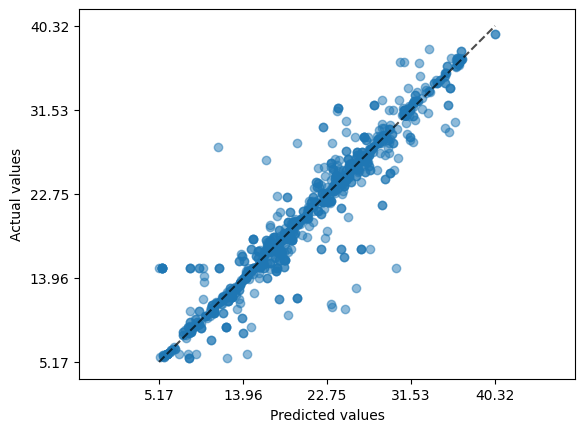

In [ ]:
#TEST PHASE - BOOSTED TREE (PART 4)

PredictionErrorDisplay.from_estimator(
    best_model_bt, x_test_bt_after_fs, y_test_after_fs, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample = 1000,random_state = 286
);

# **8. MODEL EVALUATION & ANALYSIS (INTERPRETABILITY / EXPLAINABILITY) - SELECTED FEATURES - BOOSTED TREES**

* Global and Local Explanations with SHAP
* Partial Dependency Plots

  * **Important**: If the features (predictors) are not independent, PDPs may not represent the true feature's change effects.

  * **Important**: "Shapley Values" can be sensitive to "correlated features", as it becomes difficult to disentangle the "individual contributions" of each feature to the output of the model.

  * **Important**: It is important to remark, that for the sake of properly working with both "Shapley Values" and "Partial Dependency Plots" we executed in the previous stages the followings techniques to handle and/or spot correlated features:
    * Correlation Coefficients during the Exploratory Data Analysis (EDA): Pearson Correlation Coefficient, and Spearman Correlation Coefficient.
    * Principal Component Analysis (PCA): using the "Loading Plot"
    

  * Boosted Tree

Information  | Shapley Values | Partial Dependency Plots (PDP) |
----------|-----------|------------|
Main Property | Quantify the contribution of each feature to the model's output for a especific prediction. | Shows how the predicted output changes as the value of a single feature is varied, holding other features. |
Pros | Can handle non-linear relationships. | Provide an intuitive visualization of feature effects. Can identify non-linear and interactive relationships.|
 |  |  Computationally efficient. Less sensitive to outliers as they summarize the average effect of a specific feature.|
Cons | Computationally expensive. Sensitive to correlated features and outliers. | Assume features are independent. |


## **8.1. SHAPLEY VALUES**

In [ ]:
!pip install --upgrade -q shap
import shap
shap.initjs()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 14.6 MB/s eta 0:00:00


In [ ]:
#Using validation data - Part 1

model_bt_shap = GradientBoostingRegressor(random_state=728,  n_estimators=110,  max_depth=10)

#Transformed data of independent features (validation data after cross validation)
model_bt_shap = model_bt_shap.fit(X_transformed_bt_val_df, y_validation_after_fs)

In [ ]:
#Using validation data - Part 2 (probablu drop, useless )

eval_results = cross_validate(
    model_bt_shap, X_transformed_bt_val_df, y_validation_after_fs, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
    )
print(-eval_results['test_score'].mean(), eval_results['test_score'].std())
print(-eval_results['train_score'].mean(), eval_results['train_score'].std())

7.459065945130436 1.3230210936606817
0.0026459406437336496 0.0012488989846765244


In [ ]:
#Using validation data - Part 3

import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor

# Assuming 'model_bt_shap' and 'X_transformed_bt_val_df' are already defined as in your code

# Calculate feature importances instead of coefficients
feature_importances_bt_shap = pd.DataFrame({
    'feature': X_transformed_bt_val_df.columns,
    'importance': np.round(model_bt_shap.feature_importances_, 3)
})
feature_importances_bt_shap

,feature,importance
0,age,0.661
1,sex,0.032
2,test_time,0.070
3,Jitter(%),0.010
4,Jitter(Abs),0.042
5,Jitter:RAP,0.001
6,Jitter:PPQ5,0.001
7,Jitter:DDP,0.002
8,Shimmer,0.002
9,Shimmer(dB),0.003


          Feature  Importance  Coverage
0             age    0.661347  2.873108
1             DFA    0.101265  0.979484
2       test_time    0.069668  1.284287
3     Jitter(Abs)    0.041546  0.455927
4             sex    0.032419  0.161548
5             HNR    0.022468  0.553918
6            RPDE    0.019630  0.725804
7             PPE    0.013006  0.433863
8       Jitter(%)    0.010056  0.180341
9     Shimmer:DDA    0.007443  0.127868
10            NHR    0.004977  0.337046
11   Shimmer:APQ3    0.002997  0.132386
12    Shimmer(dB)    0.002749  0.175395
13     Jitter:DDP    0.002363  0.187884
14        Shimmer    0.002181  0.153791
15   Shimmer:APQ5    0.002160  0.228551
16  Shimmer:APQ11    0.001347  0.338396
17     Jitter:RAP    0.001302  0.129853
18    Jitter:PPQ5    0.001078  0.228884


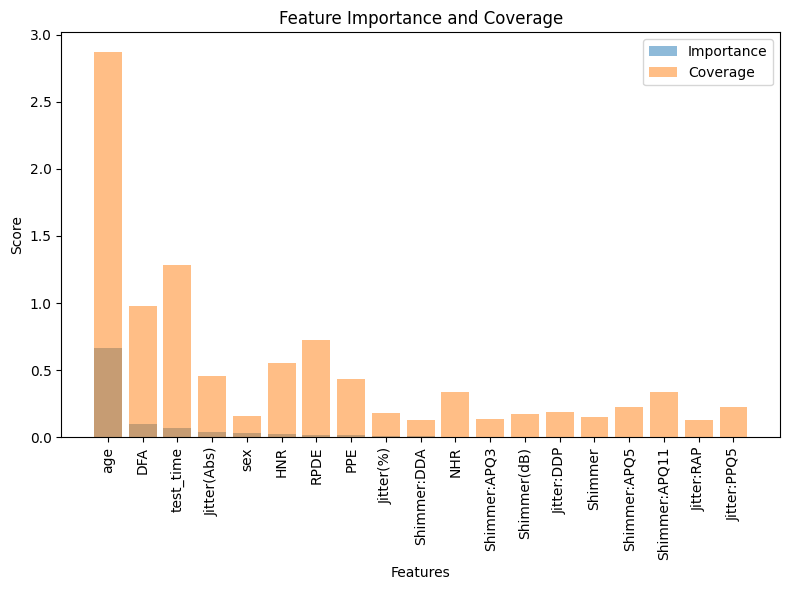

Mean Squared Error: 0.0001367922619731434


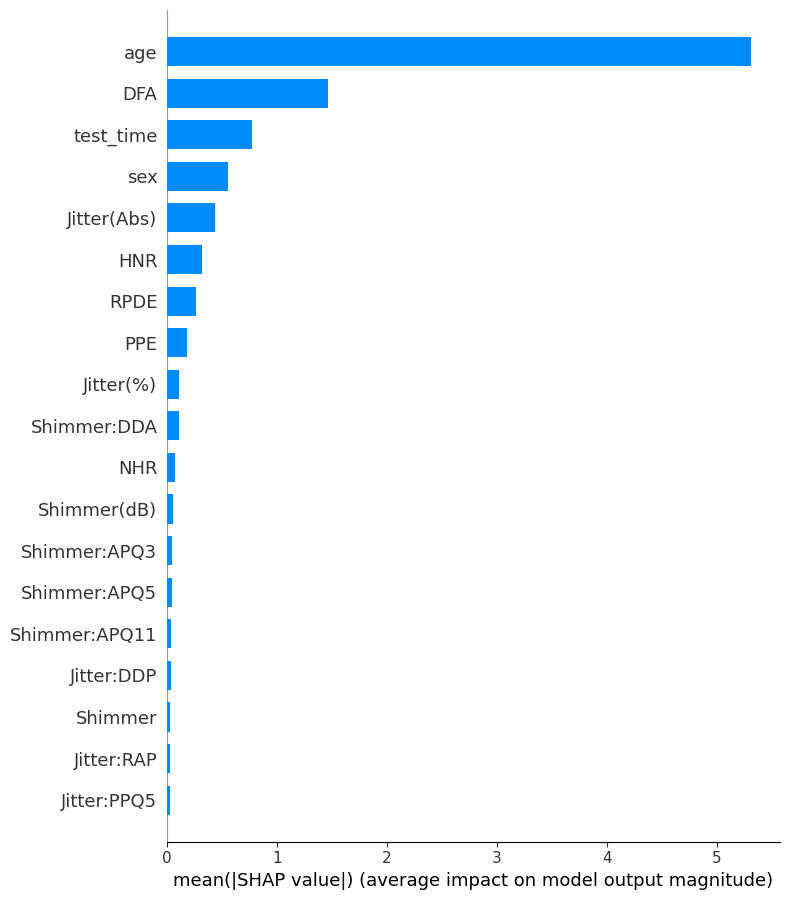

In [ ]:
#Using validation data - Part 4

import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import shap

# Assuming you have already defined X_transformed_bt_val_df and y_validation_after_fs

# Define and train the model
model_bt_shap = GradientBoostingRegressor(random_state=728, n_estimators=110, max_depth=10)
model_bt_shap.fit(X_transformed_bt_val_df, y_validation_after_fs)

# 1. Feature Importance (combines frequency of use and gain)
feature_importance = model_bt_shap.feature_importances_

# 2. Proxy for Coverage (proportion of samples affected by each feature)
def calculate_coverage(model, X):
    coverage = np.zeros(X.shape[1])
    for tree in model.estimators_.flatten():
        tree = tree.tree_
        for node in range(tree.node_count):
            if tree.feature[node] != -2:  # not a leaf node
                feature = tree.feature[node]
                coverage[feature] += tree.n_node_samples[node] / X.shape[0]
    return coverage / model.n_estimators_

coverage = calculate_coverage(model_bt_shap, X_transformed_bt_val_df)

# Combine results into a DataFrame
feature_names = X_transformed_bt_val_df.columns
results = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance,
    'Coverage': coverage
})
results = results.sort_values('Importance', ascending=False).reset_index(drop=True)

print(results)

# Visualize Feature Importance and Coverage
plt.figure(figsize=(8, 6))
plt.bar(results['Feature'], results['Importance'], alpha=0.5, label='Importance')
plt.bar(results['Feature'], results['Coverage'], alpha=0.5, label='Coverage')
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Score')
plt.title('Feature Importance and Coverage')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate MSE for interpretation
from sklearn.metrics import mean_squared_error
y_pred = model_bt_shap.predict(X_transformed_bt_val_df)
mse = mean_squared_error(y_validation_after_fs, y_pred)
print(f"Mean Squared Error: {mse}")

# SHAP Values for more detailed feature importance
explainer = shap.TreeExplainer(model_bt_shap)
shap_values = explainer.shap_values(X_transformed_bt_val_df)

# Plot SHAP summary
shap.summary_plot(shap_values, X_transformed_bt_val_df, plot_type="bar")


In [ ]:
#Transformed data of independent features (validation data after cross validation)

explainer_bt_shap = shap.TreeExplainer(model_bt_shap, X_transformed_bt_val_df)

In [ ]:
shap_values_bt_shap = explainer_bt_shap(X_transformed_bt_val_df)

 98%|===================| 1125/1145 [00:33<00:00]       

In [ ]:
sv_val_bt = shap_values_bt_shap.values
sv_val_bt

array([[-7.51029445,  0.31715606, -0.79920847, ...,  0.13649287,
        -0.83733273, -0.03668686],
       [-7.27545385,  0.32732389, -1.10070468, ..., -0.11496967,
        -0.71076504, -0.03646763],
       [-4.85155051,  0.22127927,  1.90223329, ...,  0.04612483,
        -1.58964344, -0.02337191],
       ...,
       [-0.01793465,  0.46180411, -0.31587095, ...,  0.58908849,
        -0.54817687,  0.04819491],
       [ 0.51667113,  0.68004278,  0.36276564, ...,  0.53273852,
        -0.04785943,  0.14146585],
       [ 0.1540964 ,  0.41851082, -0.16310133, ...,  0.55852805,
        -0.15220688,  0.03562619]])

In [ ]:
#From numpy array to dataframe (Shapley Values)
sv_val_bt_df = pd.DataFrame(sv_val_bt)
sv_val_bt_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466


In [ ]:
sv_val_bt_df.shape

(1145, 19)

In [ ]:
#test 1.1
X_Val_1 = ValSet.drop(['motor_UPDRS'], axis=1)
X_Val_1

,subject,age,sex,test_time,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,2,58,0,68.729,14.694,0.01033,0.000085,0.00593,0.00582,0.01779,...,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,2,58,0,59.803,14.604,0.00348,0.000024,0.00184,0.00207,0.00551,...,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,2,58,0,157.800,19.900,0.00631,0.000046,0.00325,0.00339,0.00976,...,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,2,58,0,143.830,18.736,0.00955,0.000074,0.00467,0.00513,0.01400,...,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,2,58,0,166.760,20.647,0.00417,0.000030,0.00195,0.00222,0.00585,...,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,42,61,0,86.767,36.464,0.00169,0.000013,0.00067,0.00085,0.00200,...,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,42,61,0,16.709,30.437,0.00296,0.000024,0.00137,0.00168,0.00410,...,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,42,61,0,37.772,32.249,0.00502,0.000044,0.00245,0.00269,0.00736,...,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,42,61,0,86.765,36.464,0.00621,0.000052,0.00279,0.00325,0.00838,...,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
#test 1.2
ValSet

,subject,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,2,58,0,68.729,12.388,14.694,0.01033,0.000085,0.00593,0.00582,...,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,2,58,0,59.803,12.208,14.604,0.00348,0.000024,0.00184,0.00207,...,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,2,58,0,157.800,17.288,19.900,0.00631,0.000046,0.00325,0.00339,...,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,2,58,0,143.830,16.269,18.736,0.00955,0.000074,0.00467,0.00513,...,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,2,58,0,166.760,17.941,20.647,0.00417,0.000030,0.00195,0.00222,...,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,42,61,0,86.767,25.598,36.464,0.00169,0.000013,0.00067,0.00085,...,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,42,61,0,16.709,21.078,30.437,0.00296,0.000024,0.00137,0.00168,...,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,42,61,0,37.772,22.437,32.249,0.00502,0.000044,0.00245,0.00269,...,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,42,61,0,86.765,25.598,36.464,0.00621,0.000052,0.00279,0.00325,...,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
#test 1.3
y_validation_after_fs

,motor_UPDRS
232,12.388
279,12.208
219,17.288
217,16.269
291,17.941
...,...
5837,25.598
5778,21.078
5806,22.437
5787,25.598


In [ ]:
#test 1.4
y_validation_after_fs.reset_index(drop = True, inplace=True)

In [ ]:
#test 1.5
shapley_val_bt_df = pd.concat([sv_val_bt_df, y_validation_after_fs], axis=1)
shapley_val_bt_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687,12.388
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468,12.208
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372,17.288
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566,16.269
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898,17.941
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051,25.598
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771,21.078
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195,22.437
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466,25.598


In [ ]:
#test 1.6
shapley_val_bt_df_query_1x = shapley_val_bt_df.query("5<=motor_UPDRS<=15") # 0% - 25%
shapley_val_bt_df_query_1x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687,12.3880
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468,12.2080
5,-8.523706,0.363322,-1.068349,-0.145737,0.400959,-0.008859,0.003362,-0.008035,-0.007731,0.007306,-0.013276,-0.015229,-0.000719,-0.071396,-0.173841,0.303606,-0.077966,-0.432301,-0.068662,12.1060
6,-8.112849,0.630590,-1.560229,-0.045137,0.055142,-0.016976,-0.006771,-0.007745,0.000149,-0.025300,-0.014841,-0.010200,-0.003285,-0.065465,0.012618,0.036586,-0.176187,-0.917467,-0.057995,11.3590
7,-8.540817,0.383091,-1.289790,-0.012054,0.147420,-0.025959,-0.006540,-0.024271,-0.008127,-0.054903,-0.030849,-0.004093,-0.002937,-0.060892,0.087330,0.256214,-0.105821,-0.569784,0.024689,11.7820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
845,-5.534322,-2.195945,1.672170,-0.088038,-0.134252,-0.023018,-0.021067,-0.028845,-0.016150,-0.032786,-0.010678,-0.008525,0.018537,-0.030749,-0.007752,-0.197795,-0.182933,0.061180,-0.089309,14.7800
846,-9.852677,-2.504369,-1.093041,-0.175909,-0.077234,-0.038727,-0.098019,-0.081893,-0.009444,-0.039641,-0.014878,-0.003267,0.002057,-0.031366,-0.011018,-0.206291,-0.116360,-0.558631,-0.023125,6.6924
847,-6.222435,-2.455462,1.068695,-0.092470,-0.187191,-0.001786,-0.018575,-0.009047,-0.019195,-0.031069,0.000700,0.013800,0.016308,0.005460,0.017797,-0.034405,-0.080119,-0.627380,-0.041981,12.9360
848,-9.626418,-2.491971,-1.094985,-0.146134,-0.173325,-0.045986,-0.104511,-0.075521,-0.012118,-0.022386,-0.003559,-0.034551,0.021419,-0.005341,-0.008538,-0.395060,-0.157819,-0.499468,-0.060080,6.6924


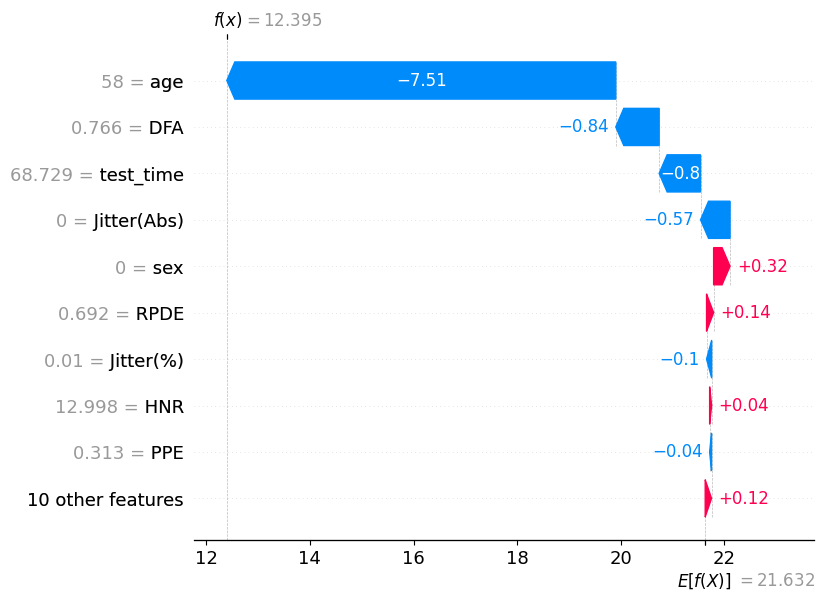

In [ ]:
#test 1.7
shap.plots.waterfall(shap_values_bt_shap[0])

In [ ]:
#################################################

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_2 = shapley_val_bt_df.query("15<=motor_UPDRS<=20") # 25% - 50%
shapley_val_bt_df_query_2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372,17.288
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566,16.269
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898,17.941
13,-5.590833,0.232759,2.534692,-0.093658,0.282442,-0.003326,0.040207,0.031304,0.030315,0.004699,-0.008063,-0.011482,0.020700,-0.036893,0.074769,0.232943,-0.043351,-0.480654,-0.051177,18.819
14,-4.252091,0.215927,2.291213,-0.085803,-0.216932,-0.006036,-0.007642,0.003959,0.012873,-0.011277,-0.016858,0.001873,0.002315,-0.044817,0.077906,0.072759,0.084278,-1.391235,-0.045945,18.309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1078,-2.012737,-0.751091,0.448395,0.176222,-0.395101,0.061495,0.026296,0.058964,-0.055305,-0.031908,0.081947,-0.045869,-0.026101,0.044684,-0.083837,-0.120674,0.459382,-1.504777,0.012823,17.975
1079,-2.330351,-0.750234,0.618922,-0.137637,0.127328,-0.005261,0.001355,-0.001018,-0.013253,-0.068434,-0.015839,-0.029947,0.046231,-0.031547,-0.028540,0.079906,-0.162396,-2.435590,-0.053661,16.435
1080,-2.590835,-0.785923,0.022800,-0.129865,0.187004,-0.007754,-0.007790,0.001234,0.003477,0.002143,-0.010298,0.008965,-0.020713,-0.033875,-0.004769,0.054391,-0.058701,-2.557522,-0.059732,15.636
1081,-1.344691,-0.884162,-1.074840,-0.141117,0.162327,-0.018811,-0.000211,-0.010233,-0.015064,-0.030643,-0.028180,-0.049992,0.060443,-0.046626,0.003819,0.140649,-0.077221,-2.752142,-0.032480,15.485


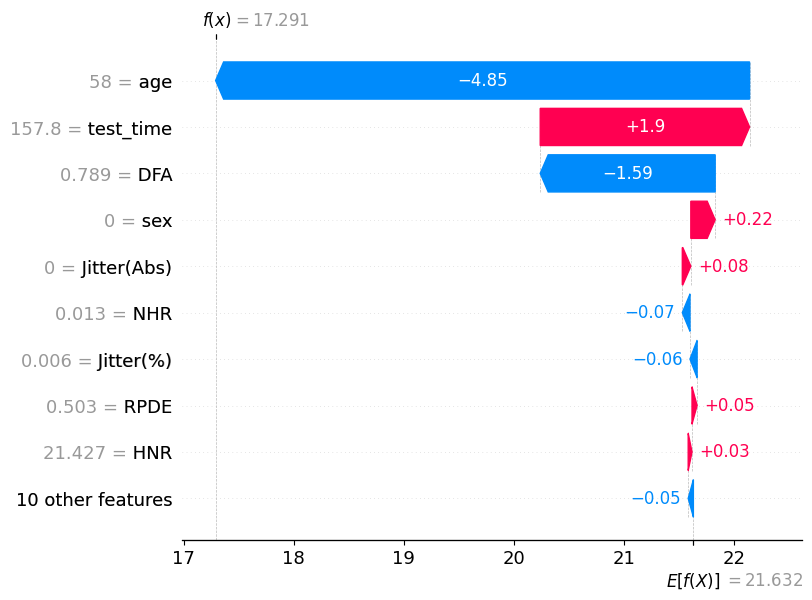

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[2])

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_3 = shapley_val_bt_df.query("20<=motor_UPDRS<=27") # 50% - 75%
shapley_val_bt_df_query_3

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
30,-1.144695,1.555762,-1.636090,-0.028375,0.046380,0.013581,0.024549,0.010176,0.001717,-0.009407,0.004133,-0.013137,0.045900,0.012891,-0.078783,-0.116427,-0.102970,4.119043,-0.059782,24.275
32,-1.719412,1.513233,-2.001502,-0.043410,0.202934,-0.001040,0.004618,0.003507,-0.013631,-0.023417,-0.020531,-0.001950,0.024267,-0.073272,-0.009440,0.157503,-0.088235,3.946097,-0.046840,23.437
33,-1.159185,1.546858,-1.425002,-0.025772,0.055447,0.002751,0.018130,0.002305,0.001109,-0.013783,-0.008713,-0.016708,0.053445,0.021363,-0.079758,-0.108692,-0.078151,4.158841,0.114213,24.695
45,-1.199181,1.542711,-1.653236,-0.032142,0.042482,-0.013272,0.000144,-0.016183,0.003047,-0.010475,-0.000494,-0.016810,0.041915,0.015583,-0.063764,-0.116999,-0.093710,4.200702,0.007601,24.275
47,-0.889475,1.549712,-1.009792,-0.026719,-0.091268,0.001505,0.023558,0.001256,-0.004155,-0.018461,0.001534,-0.025503,0.043191,0.011752,-0.098528,-0.111411,-0.100526,4.687646,-0.044223,25.539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051,25.598
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771,21.078
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195,22.437
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466,25.598


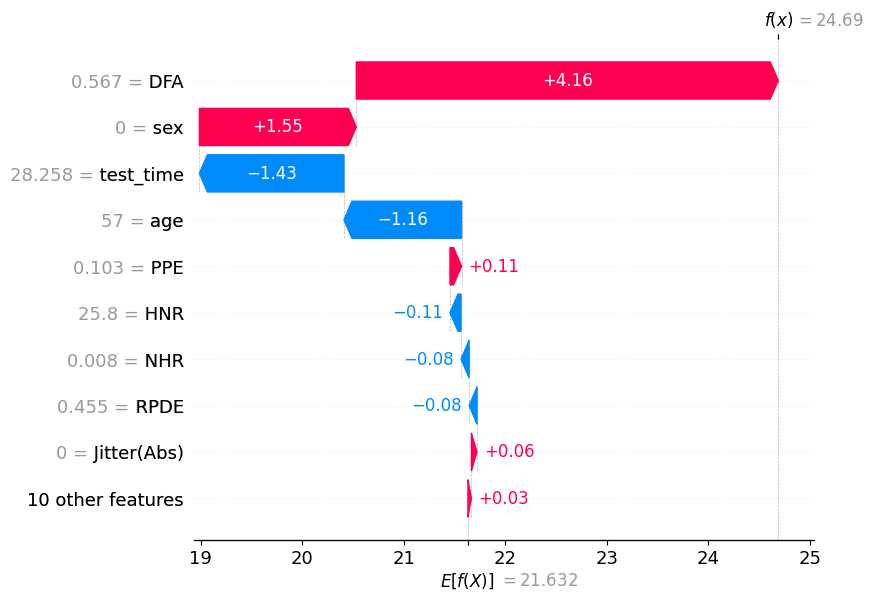

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[33])

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_4 = shapley_val_bt_df.query("27<=motor_UPDRS<=39") # 75% - Max
shapley_val_bt_df_query_4

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
29,-1.608079,0.568962,4.918075,-0.049295,0.134749,-0.007888,0.010074,0.004839,0.000394,-0.025993,-0.016467,0.014596,0.011380,-0.057844,0.023719,0.108851,-0.038201,2.917604,-0.054902,28.503
31,-0.325392,1.661616,0.281871,-0.065361,0.210578,-0.006320,-0.004630,-0.027072,-0.013979,-0.040440,-0.013284,-0.014355,0.012844,-0.068371,0.007491,-0.144612,-0.059890,5.039593,-0.014754,28.057
34,-0.294125,1.653089,1.062649,-0.056420,0.127620,0.011717,0.016099,-0.020405,0.010326,0.007552,-0.016681,-0.021347,0.027575,-0.006174,-0.088921,-0.165580,-0.068656,4.641162,-0.040937,28.416
35,-0.446440,1.635323,1.003054,-0.067226,0.160735,-0.005665,0.003692,0.004069,-0.009853,-0.040148,-0.008660,0.003216,0.015982,-0.055803,-0.088110,-0.119009,-0.080977,4.747655,-0.086050,28.213
36,-0.282716,1.694250,1.626138,-0.046321,0.287037,-0.000903,0.008638,0.005619,-0.018903,-0.032393,0.008126,-0.024392,0.006108,0.013904,0.024868,0.110304,-0.017724,3.529492,-0.048651,28.503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,10.058800,1.205805,0.524554,-0.066401,0.182542,-0.007454,-0.002027,0.007264,0.048787,-0.047296,-0.024154,0.025072,0.085529,-0.048454,0.020780,0.358456,0.057100,-0.106522,0.110649,34.012
1111,10.061510,0.962997,-1.466795,-0.094843,-0.011012,0.001841,-0.005663,0.006138,0.035545,-0.014031,-0.010715,-0.000454,0.017226,-0.002716,0.007247,-0.466784,-0.087163,0.838071,0.012128,31.418
1112,9.530456,-0.004795,-0.507813,-0.163483,1.900620,-0.329779,-0.043144,-0.312485,0.005101,-0.075309,-0.029512,-0.069303,0.058252,-0.094790,-0.536820,1.561015,0.046322,0.117364,-0.043985,32.610
1113,9.411244,0.841707,-2.363115,-0.131363,-0.040472,-0.038798,0.051385,-0.076024,0.039916,-0.008988,-0.017486,-0.009059,-0.012320,0.018080,-0.261278,-0.650666,-0.041385,0.898723,-0.028746,29.211


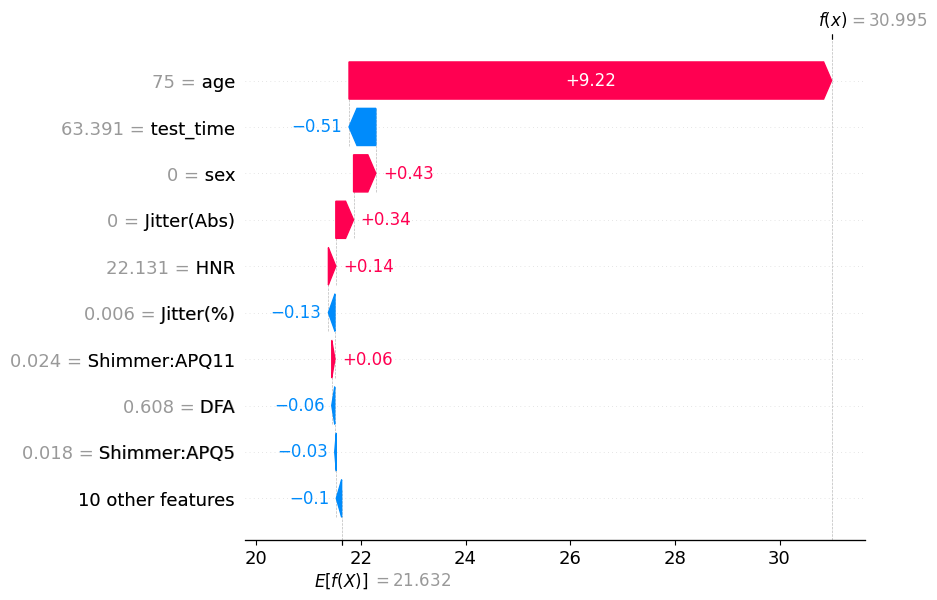

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[100])

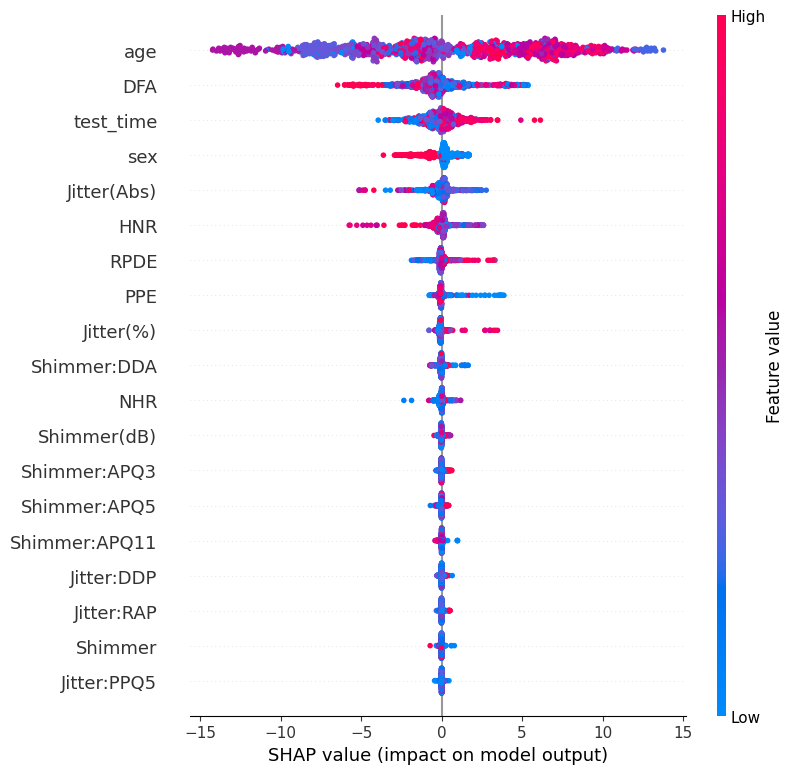

In [ ]:
shap.plots.beeswarm(shap_values_bt_shap, max_display=20)

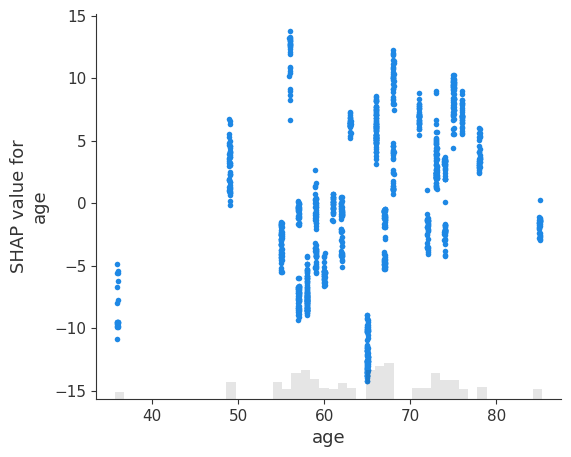

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'age'])

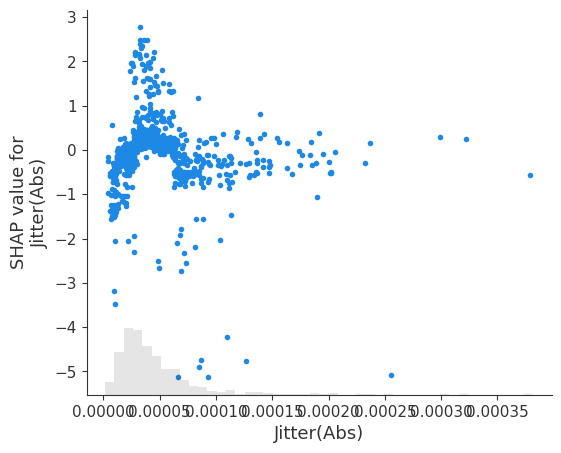

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'Jitter(Abs)'])


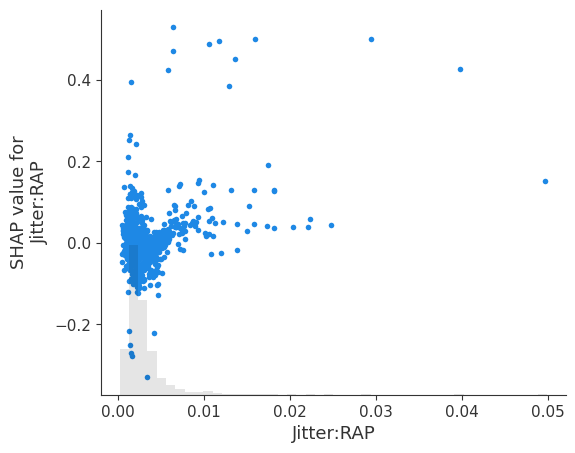

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'Jitter:RAP'])

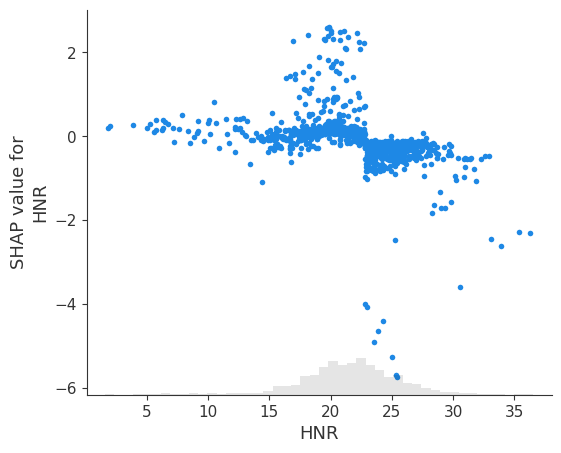

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'HNR'])

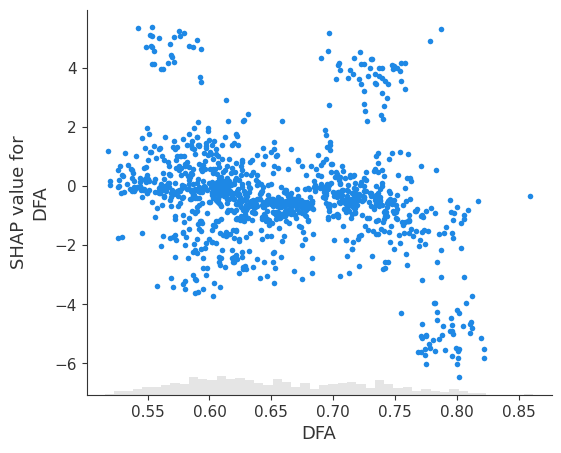

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'DFA'])

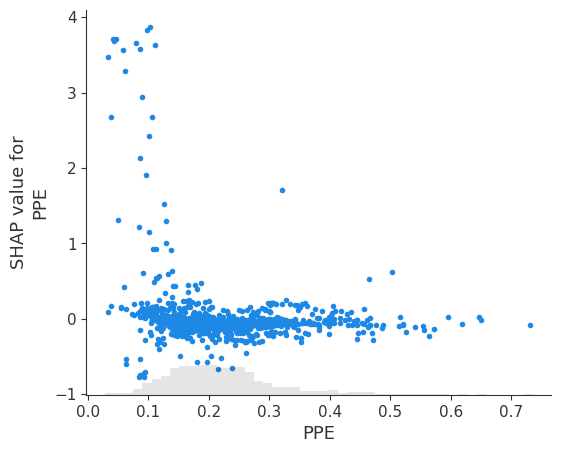

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'PPE'])

## **8.2. PARTIAL DEPENDENCY PLOT**

In [ ]:
x_validation_bt_after_fs

,age,sex,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,58,0,68.729,0.01033,0.000085,0.00593,0.00582,0.01779,0.06918,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,58,0,59.803,0.00348,0.000024,0.00184,0.00207,0.00551,0.03752,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,58,0,157.800,0.00631,0.000046,0.00325,0.00339,0.00976,0.03957,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,58,0,143.830,0.00955,0.000074,0.00467,0.00513,0.01400,0.05727,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,58,0,166.760,0.00417,0.000030,0.00195,0.00222,0.00585,0.02599,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,61,0,86.767,0.00169,0.000013,0.00067,0.00085,0.00200,0.01383,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,61,0,16.709,0.00296,0.000024,0.00137,0.00168,0.00410,0.02466,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,61,0,37.772,0.00502,0.000044,0.00245,0.00269,0.00736,0.03222,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,61,0,86.765,0.00621,0.000052,0.00279,0.00325,0.00838,0.02742,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
x_validation_bt_after_fs2 = x_validation_bt_after_fs.copy()

In [ ]:
x_validation_bt_after_fs2.reset_index(drop = True, inplace=True)

In [ ]:
print(x_validation_bt_after_fs2)

      age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
0      58    0     68.729    0.01033     0.000085     0.00593      0.00582   
1      58    0     59.803    0.00348     0.000024     0.00184      0.00207   
2      58    0    157.800    0.00631     0.000046     0.00325      0.00339   
3      58    0    143.830    0.00955     0.000074     0.00467      0.00513   
4      58    0    166.760    0.00417     0.000030     0.00195      0.00222   
...   ...  ...        ...        ...          ...         ...          ...   
1140   61    0     86.767    0.00169     0.000013     0.00067      0.00085   
1141   61    0     16.709    0.00296     0.000024     0.00137      0.00168   
1142   61    0     37.772    0.00502     0.000044     0.00245      0.00269   
1143   61    0     86.765    0.00621     0.000052     0.00279      0.00325   
1144   61    0     44.640    0.00647     0.000058     0.00316      0.00253   

      Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:A

In [ ]:
selected_rows31 = x_validation_bt_after_fs2.loc[[0,1,5,6,7]]
print(selected_rows31)

   age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
0   58    0     68.729    0.01033     0.000085     0.00593      0.00582   
1   58    0     59.803    0.00348     0.000024     0.00184      0.00207   
5   58    0     54.769    0.00510     0.000038     0.00278      0.00297   
6   58    0     17.772    0.00804     0.000062     0.00385      0.00435   
7   58    0     38.715    0.00762     0.000057     0.00369      0.00265   

   Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
0     0.01779  0.06918        0.587       0.04132       0.04137   
1     0.00551  0.03752        0.345       0.01743       0.02236   
5     0.00835  0.07305        0.653       0.03807       0.04782   
6     0.01155  0.03678        0.324       0.02037       0.02216   
7     0.01108  0.03036        0.271       0.01687       0.01715   

   Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
0        0.05282      0.12395  0.058886  12.998  0.69227  0.76560  0.

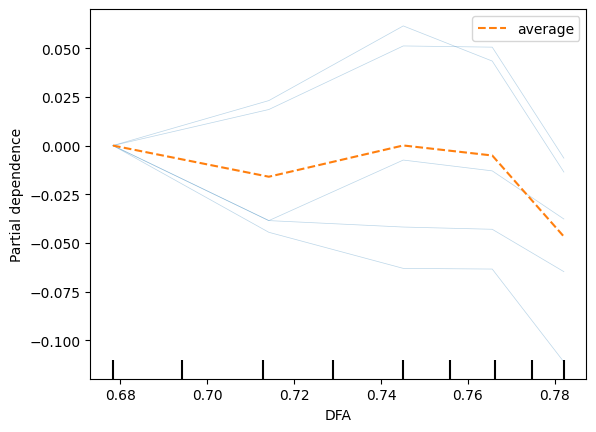

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows31, features=['DFA'], kind='both', centered=True)

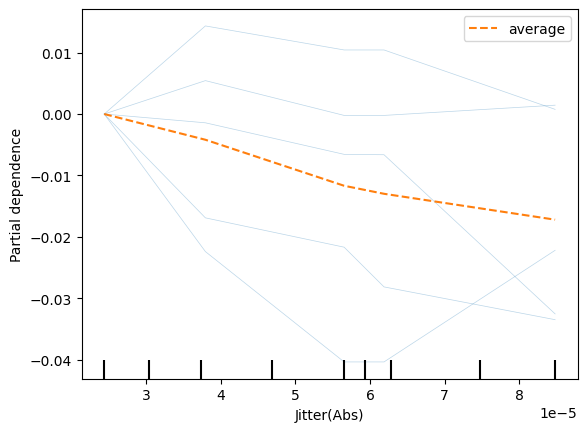

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows31, features=['Jitter(Abs)'], kind='both', centered=True)

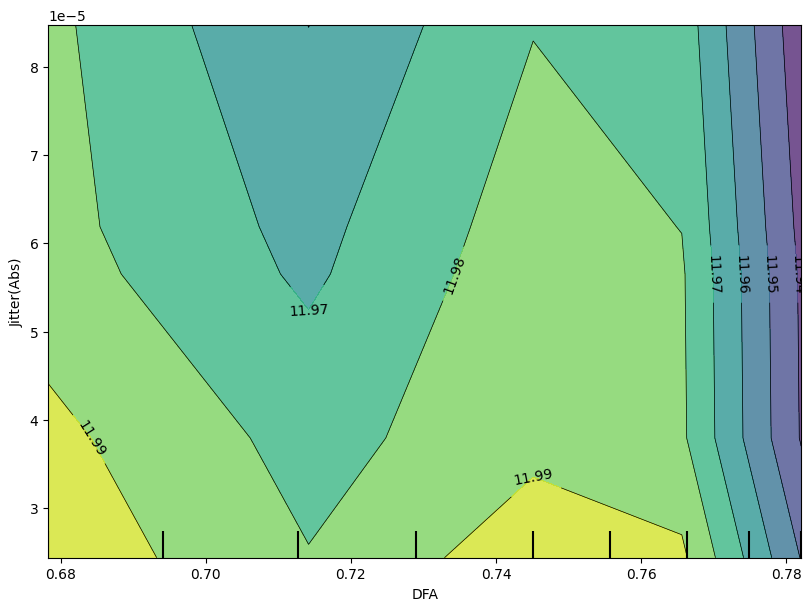

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows31,
                                        features=[('DFA', 'Jitter(Abs)')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

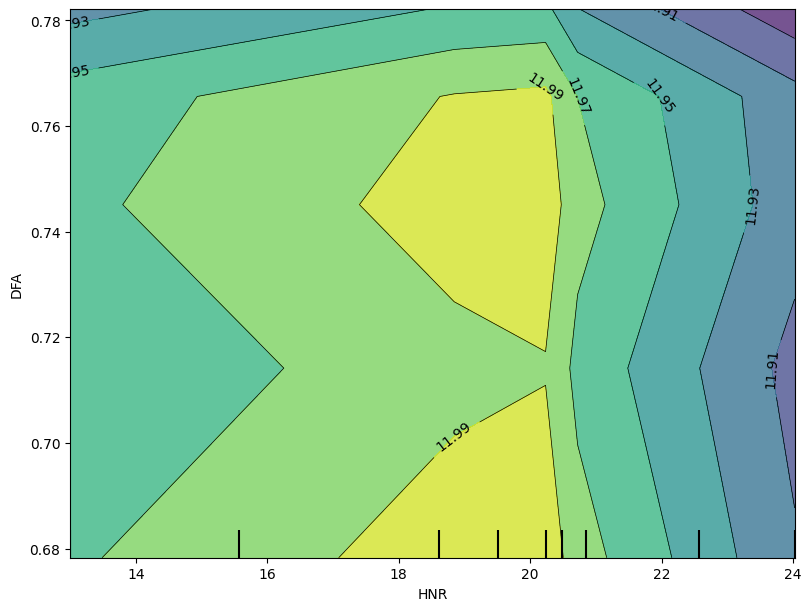

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows31,
                                        features=[('HNR', 'DFA')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows32 = x_validation_bt_after_fs2.loc[[2,3,4,13,14]]
print(selected_rows32)

    age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
2    58    0     157.80    0.00631     0.000046     0.00325      0.00339   
3    58    0     143.83    0.00955     0.000074     0.00467      0.00513   
4    58    0     166.76    0.00417     0.000030     0.00195      0.00222   
13   58    0     178.80    0.00440     0.000033     0.00230      0.00282   
14   58    0     171.80    0.00777     0.000064     0.00381      0.00460   

    Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
2      0.00976  0.03957        0.380       0.02316       0.02275   
3      0.01400  0.05727        0.505       0.03194       0.03464   
4      0.00585  0.02599        0.251       0.01146       0.01435   
13     0.00689  0.05036        0.437       0.02352       0.03349   
14     0.01142  0.03591        0.317       0.01982       0.02008   

    Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
2         0.02527      0.06947  0.013434  21.427  0.5027

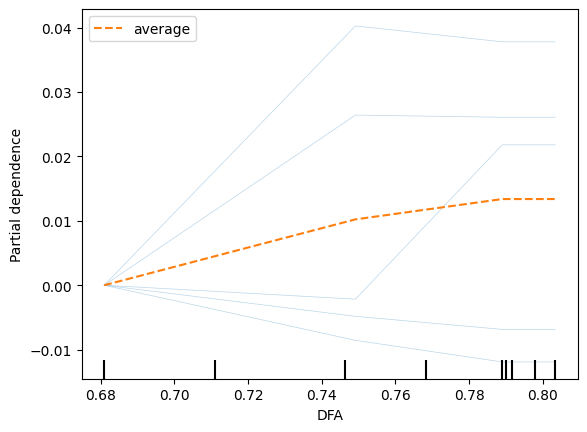

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows32, features=['DFA'], kind='both', centered=True)

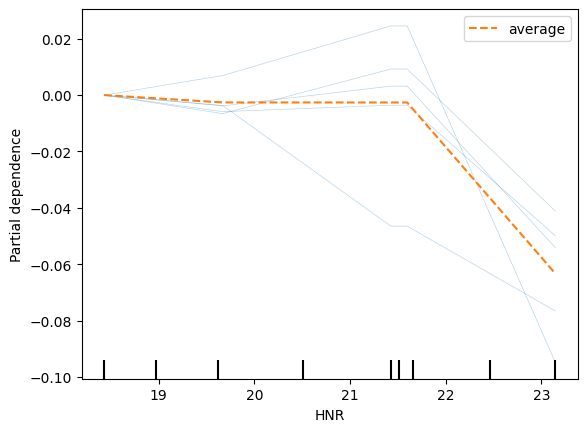

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows32, features=['HNR'], kind='both', centered=True)

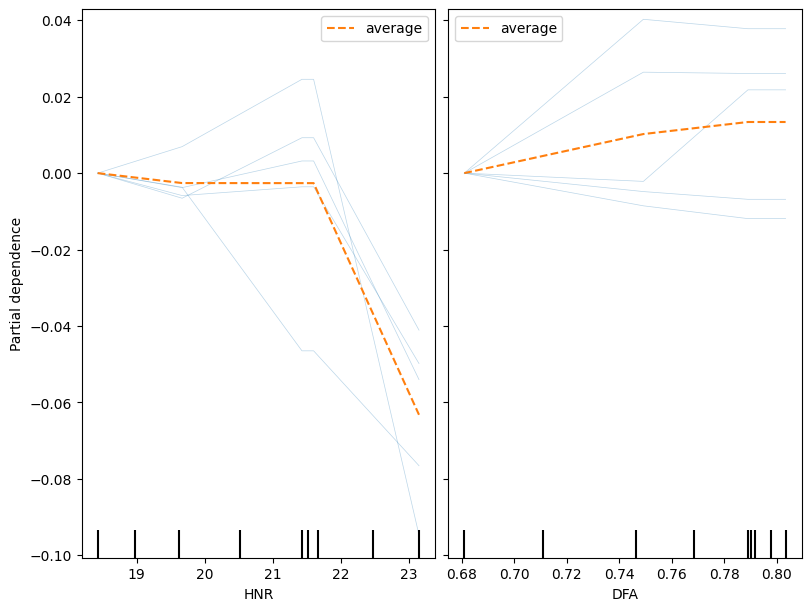

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows32,
                                        features=['HNR', 'DFA'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

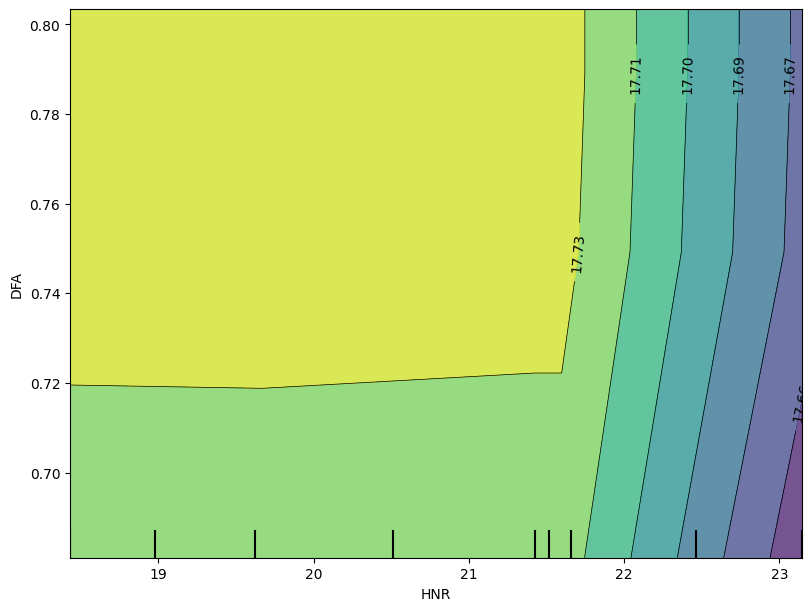

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows32,
                                        features=[('HNR', 'DFA')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows33 = x_validation_bt_after_fs2.loc[[30,32,33,45,47]]
print(selected_rows33)

    age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
30   57    0    21.2490    0.00292     0.000018     0.00138      0.00161   
32   57    0     7.2882    0.00695     0.000039     0.00389      0.00361   
33   57    0    28.2580    0.00304     0.000017     0.00157      0.00151   
45   57    0    21.2470    0.00380     0.000023     0.00221      0.00237   
47   57    0    42.3130    0.00279     0.000016     0.00156      0.00166   

    Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
30     0.00414  0.01160        0.118       0.00538       0.00630   
32     0.01166  0.02426        0.213       0.01349       0.01431   
33     0.00472  0.01205        0.109       0.00621       0.00690   
45     0.00663  0.01034        0.114       0.00509       0.00544   
47     0.00468  0.01797        0.155       0.01053       0.01100   

    Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
30        0.00950      0.01614  0.011256  27.130  0.4318

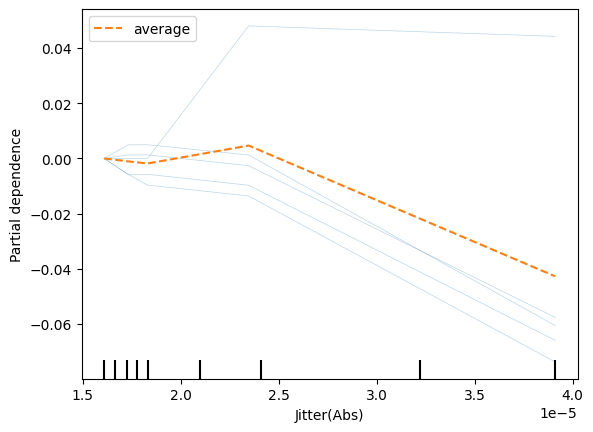

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows33, features=['Jitter(Abs)'], kind='both', centered=True)

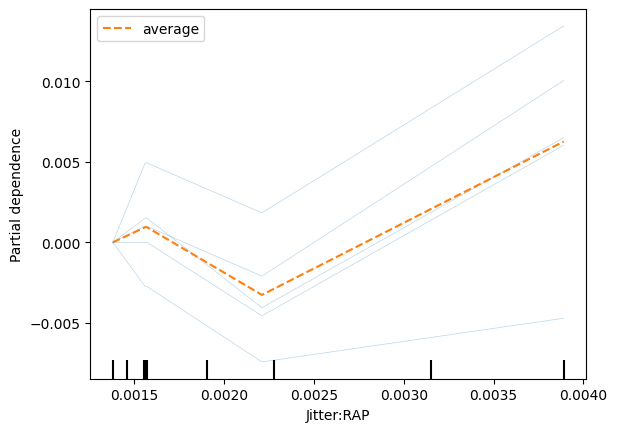

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows33, features=['Jitter:RAP'], kind='both', centered=True)

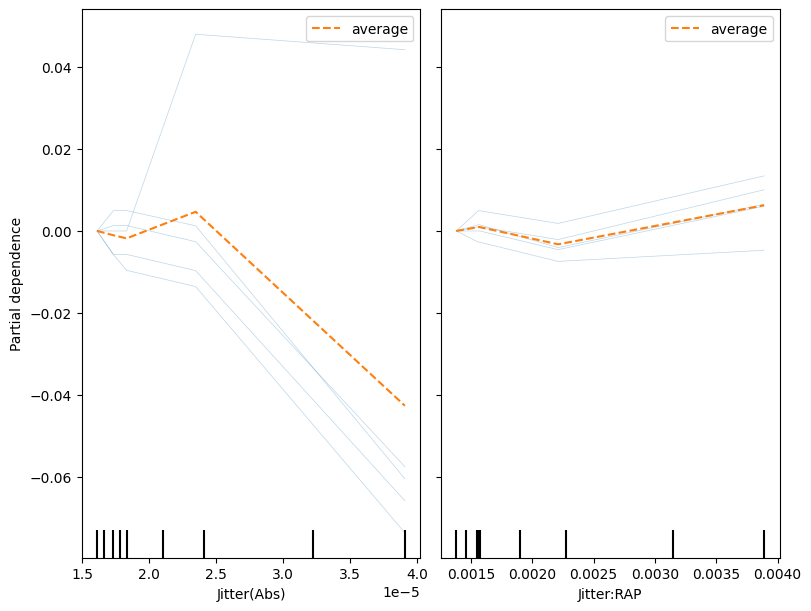

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows33,
                                        features=['Jitter(Abs)', 'Jitter:RAP'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

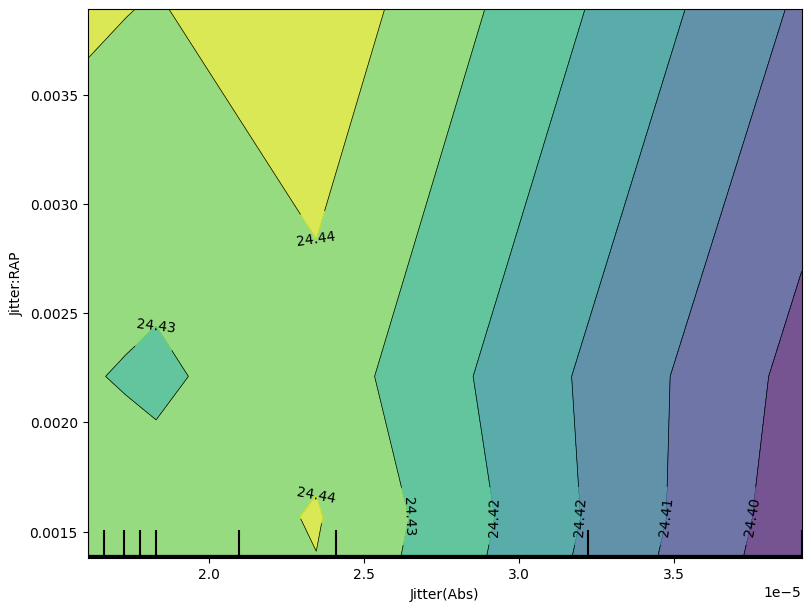

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows33,
                                        features=[('Jitter(Abs)', 'Jitter:RAP')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows34 = x_validation_bt_after_fs2.loc[[1110,1111,1112,1113,1114]]
print(selected_rows34)

      age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
1110   68    1   182.5700    0.00653     0.000038     0.00300      0.00367   
1111   68    1    28.4750    0.00502     0.000023     0.00222      0.00255   
1112   68    1    42.5150    0.00618     0.000038     0.00337      0.00319   
1113   68    1     2.4896    0.00348     0.000015     0.00158      0.00167   
1114   68    1   133.5200    0.01017     0.000045     0.00502      0.00451   

      Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
1110     0.00900  0.03252        0.291       0.01459       0.01873   
1111     0.00667  0.02184        0.191       0.01116       0.01151   
1112     0.01012  0.02967        0.264       0.01598       0.01596   
1113     0.00474  0.01972        0.172       0.00897       0.01041   
1114     0.01505  0.04217        0.375       0.02104       0.02236   

      Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
1110        0.03235      0.043

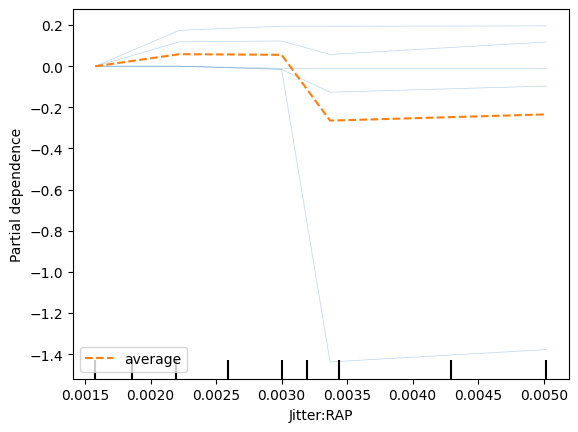

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows34, features=['Jitter:RAP'], kind='both', centered=True)

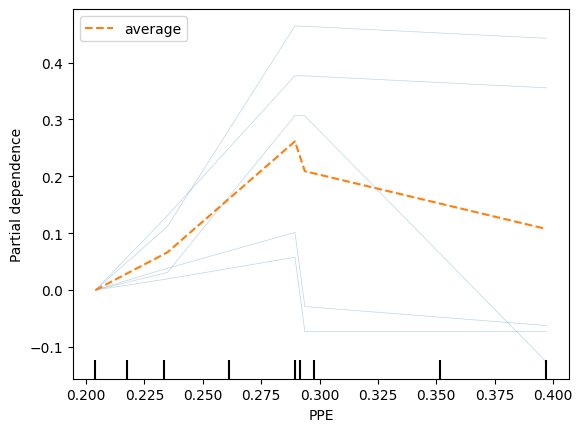

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows34, features=['PPE'], kind='both', centered=True)

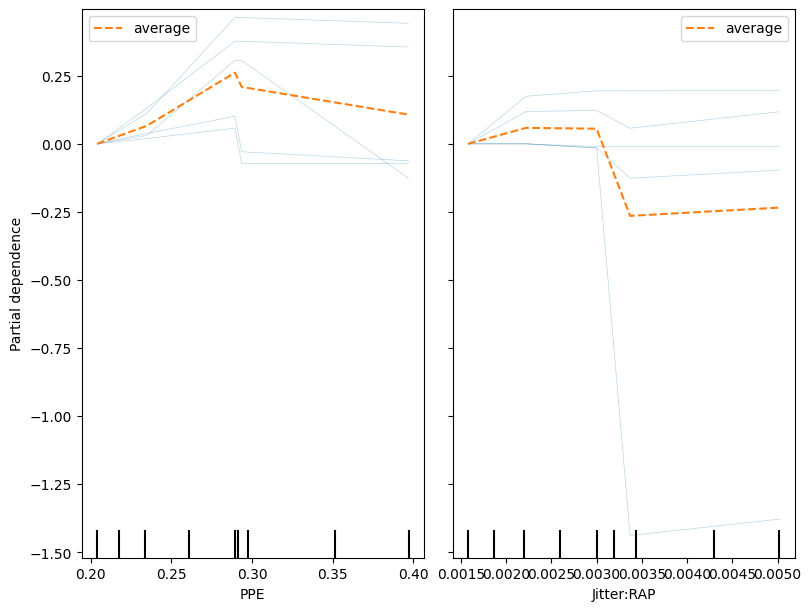

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows34,
                                        features=['PPE', 'Jitter:RAP'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

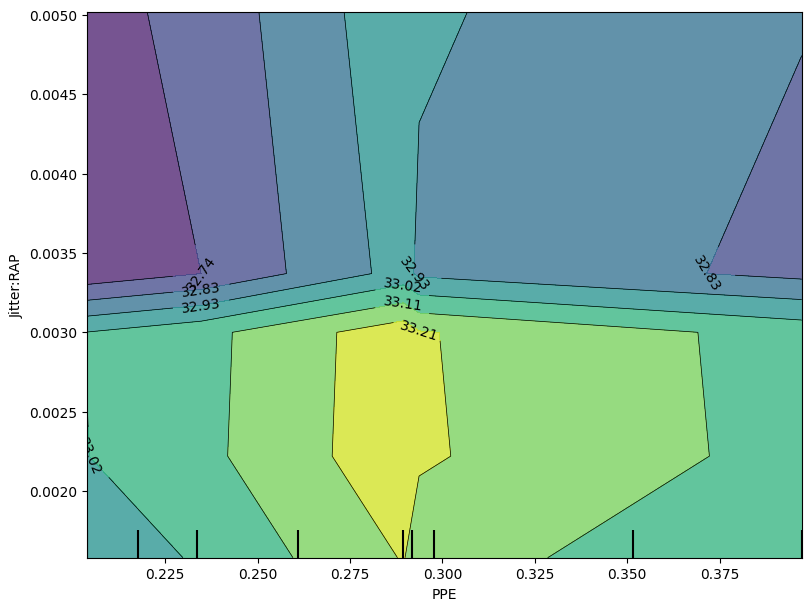

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows34,
                                        features=[('PPE', 'Jitter:RAP')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

# **14. MODEL EVALUATION & ANALYSIS (INTERPRETABILITY / EXPLAINABILITY) - ALL FEATURES - BOOSTED TREES**

* Global and Local Explanations with SHAP
* Partial Dependency Plots

  * **Important**: If the features (predictors) are not independent, PDPs may not represent the true feature's change effects.

  * **Important**: "Shapley Values" can be sensitive to "correlated features", as it becomes difficult to disentangle the "individual contributions" of each feature to the output of the model.

  * **Important**: It is important to remark, that for the sake of properly working with both "Shapley Values" and "Partial Dependency Plots" we executed in the previous stages the followings techniques to handle and/or spot correlated features:
    * Correlation Coefficients during the Exploratory Data Analysis (EDA): Pearson Correlation Coefficient, and Spearman Correlation Coefficient.
    * Principal Component Analysis (PCA): using the "Loading Plot"
  * Boosted Tree

Information  | Shapley Values | Partial Dependency Plots (PDP) |
----------|-----------|------------|
Main Property | Quantify the contribution of each feature to the model's output for a especific prediction. | Shows how the predicted output changes as the value of a single feature is varied, holding other features. |
Pros | Can handle non-linear relationships. | Provide an intuitive visualization of feature effects. Can identify non-linear and interactive relationships.|
 |  |  Computationally efficient. Less sensitive to outliers as they summarize the average effect of a specific feature.|
Cons | Computationally expensive. Sensitive to correlated features and outliers. | Assume features are independent. |


## **14.1. SHAPLEY VALUES**

In [ ]:
!pip install --upgrade -q shap
import shap
shap.initjs()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 12.9 MB/s eta 0:00:00


In [ ]:
#Using validation data - Part 1

model_bt_shap = GradientBoostingRegressor(random_state=728,  n_estimators=110,  max_depth=10)

#Transformed data of independent features (validation data after cross validation)
model_bt_shap = model_bt_shap.fit(X_transformed_bt_val_df, y_validation_after_fs)

In [ ]:
#Using validation data - Part 2 (probablu drop, useless )

eval_results = cross_validate(
    model_bt_shap, X_transformed_bt_val_df, y_validation_after_fs, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
    )
print(-eval_results['test_score'].mean(), eval_results['test_score'].std())
print(-eval_results['train_score'].mean(), eval_results['train_score'].std())

7.459065945130436 1.3230210936606817
0.0026459406437336496 0.0012488989846765244


In [ ]:
#Using validation data - Part 3

import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor

# Assuming 'model_bt_shap' and 'X_transformed_bt_val_df' are already defined as in your code

# Calculate feature importances instead of coefficients
feature_importances_bt_shap = pd.DataFrame({
    'feature': X_transformed_bt_val_df.columns,
    'importance': np.round(model_bt_shap.feature_importances_, 3)
})
feature_importances_bt_shap

,feature,importance
0,age,0.661
1,sex,0.032
2,test_time,0.070
3,Jitter(%),0.010
4,Jitter(Abs),0.042
5,Jitter:RAP,0.001
6,Jitter:PPQ5,0.001
7,Jitter:DDP,0.002
8,Shimmer,0.002
9,Shimmer(dB),0.003


          Feature  Importance  Coverage
0             age    0.661347  2.873108
1             DFA    0.101265  0.979484
2       test_time    0.069668  1.284287
3     Jitter(Abs)    0.041546  0.455927
4             sex    0.032419  0.161548
5             HNR    0.022468  0.553918
6            RPDE    0.019630  0.725804
7             PPE    0.013006  0.433863
8       Jitter(%)    0.010056  0.180341
9     Shimmer:DDA    0.007443  0.127868
10            NHR    0.004977  0.337046
11   Shimmer:APQ3    0.002997  0.132386
12    Shimmer(dB)    0.002749  0.175395
13     Jitter:DDP    0.002363  0.187884
14        Shimmer    0.002181  0.153791
15   Shimmer:APQ5    0.002160  0.228551
16  Shimmer:APQ11    0.001347  0.338396
17     Jitter:RAP    0.001302  0.129853
18    Jitter:PPQ5    0.001078  0.228884


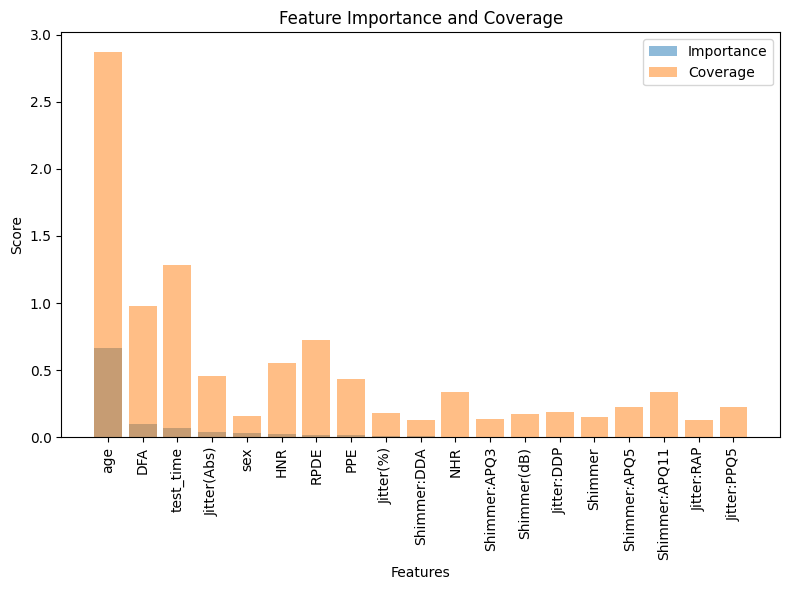

Mean Squared Error: 0.0001367922619731434


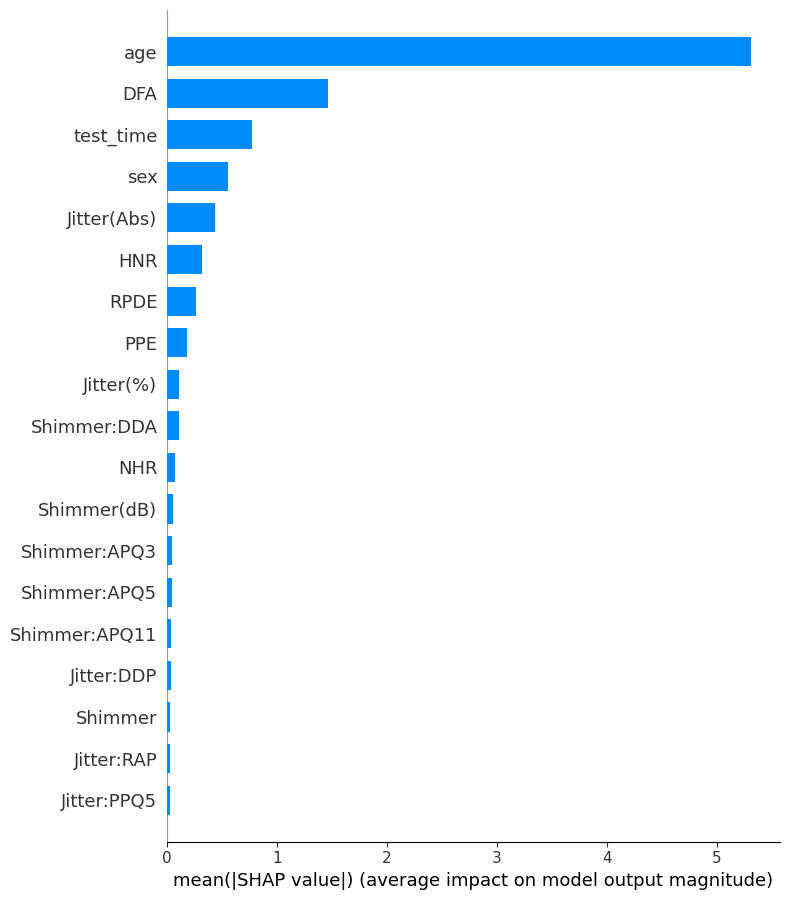

In [ ]:
#Using validation data - Part 4

import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import shap

# Assuming you have already defined X_transformed_bt_val_df and y_validation_after_fs

# Define and train the model
model_bt_shap = GradientBoostingRegressor(random_state=728, n_estimators=110, max_depth=10)
model_bt_shap.fit(X_transformed_bt_val_df, y_validation_after_fs)

# 1. Feature Importance (combines frequency of use and gain)
feature_importance = model_bt_shap.feature_importances_

# 2. Proxy for Coverage (proportion of samples affected by each feature)
def calculate_coverage(model, X):
    coverage = np.zeros(X.shape[1])
    for tree in model.estimators_.flatten():
        tree = tree.tree_
        for node in range(tree.node_count):
            if tree.feature[node] != -2:  # not a leaf node
                feature = tree.feature[node]
                coverage[feature] += tree.n_node_samples[node] / X.shape[0]
    return coverage / model.n_estimators_

coverage = calculate_coverage(model_bt_shap, X_transformed_bt_val_df)

# Combine results into a DataFrame
feature_names = X_transformed_bt_val_df.columns
results = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance,
    'Coverage': coverage
})
results = results.sort_values('Importance', ascending=False).reset_index(drop=True)

print(results)

# Visualize Feature Importance and Coverage
plt.figure(figsize=(8, 6))
plt.bar(results['Feature'], results['Importance'], alpha=0.5, label='Importance')
plt.bar(results['Feature'], results['Coverage'], alpha=0.5, label='Coverage')
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Score')
plt.title('Feature Importance and Coverage')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate MSE for interpretation
from sklearn.metrics import mean_squared_error
y_pred = model_bt_shap.predict(X_transformed_bt_val_df)
mse = mean_squared_error(y_validation_after_fs, y_pred)
print(f"Mean Squared Error: {mse}")

# SHAP Values for more detailed feature importance
explainer = shap.TreeExplainer(model_bt_shap)
shap_values = explainer.shap_values(X_transformed_bt_val_df)

# Plot SHAP summary
shap.summary_plot(shap_values, X_transformed_bt_val_df, plot_type="bar")


In [ ]:
#Transformed data of independent features (validation data after cross validation)

explainer_bt_shap = shap.TreeExplainer(model_bt_shap, X_transformed_bt_val_df)

In [ ]:
shap_values_bt_shap = explainer_bt_shap(X_transformed_bt_val_df)

 98%|===================| 1125/1145 [00:19<00:00]       

In [ ]:
sv_val_bt = shap_values_bt_shap.values
sv_val_bt

array([[-7.51029445,  0.31715606, -0.79920847, ...,  0.13649287,
        -0.83733273, -0.03668686],
       [-7.27545385,  0.32732389, -1.10070468, ..., -0.11496967,
        -0.71076504, -0.03646763],
       [-4.85155051,  0.22127927,  1.90223329, ...,  0.04612483,
        -1.58964344, -0.02337191],
       ...,
       [-0.01793465,  0.46180411, -0.31587095, ...,  0.58908849,
        -0.54817687,  0.04819491],
       [ 0.51667113,  0.68004278,  0.36276564, ...,  0.53273852,
        -0.04785943,  0.14146585],
       [ 0.1540964 ,  0.41851082, -0.16310133, ...,  0.55852805,
        -0.15220688,  0.03562619]])

In [ ]:
#From numpy array to dataframe (Shapley Values)
sv_val_bt_df = pd.DataFrame(sv_val_bt)
sv_val_bt_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466


In [ ]:
sv_val_bt_df.shape

(1145, 19)

In [ ]:
#test 1.1
X_Val_1 = ValSet.drop(['motor_UPDRS'], axis=1)
X_Val_1

,subject,age,sex,test_time,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,2,58,0,68.729,14.694,0.01033,0.000085,0.00593,0.00582,0.01779,...,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,2,58,0,59.803,14.604,0.00348,0.000024,0.00184,0.00207,0.00551,...,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,2,58,0,157.800,19.900,0.00631,0.000046,0.00325,0.00339,0.00976,...,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,2,58,0,143.830,18.736,0.00955,0.000074,0.00467,0.00513,0.01400,...,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,2,58,0,166.760,20.647,0.00417,0.000030,0.00195,0.00222,0.00585,...,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,42,61,0,86.767,36.464,0.00169,0.000013,0.00067,0.00085,0.00200,...,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,42,61,0,16.709,30.437,0.00296,0.000024,0.00137,0.00168,0.00410,...,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,42,61,0,37.772,32.249,0.00502,0.000044,0.00245,0.00269,0.00736,...,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,42,61,0,86.765,36.464,0.00621,0.000052,0.00279,0.00325,0.00838,...,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
#test 1.2
ValSet

,subject,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,2,58,0,68.729,12.388,14.694,0.01033,0.000085,0.00593,0.00582,...,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,2,58,0,59.803,12.208,14.604,0.00348,0.000024,0.00184,0.00207,...,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,2,58,0,157.800,17.288,19.900,0.00631,0.000046,0.00325,0.00339,...,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,2,58,0,143.830,16.269,18.736,0.00955,0.000074,0.00467,0.00513,...,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,2,58,0,166.760,17.941,20.647,0.00417,0.000030,0.00195,0.00222,...,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,42,61,0,86.767,25.598,36.464,0.00169,0.000013,0.00067,0.00085,...,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,42,61,0,16.709,21.078,30.437,0.00296,0.000024,0.00137,0.00168,...,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,42,61,0,37.772,22.437,32.249,0.00502,0.000044,0.00245,0.00269,...,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,42,61,0,86.765,25.598,36.464,0.00621,0.000052,0.00279,0.00325,...,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
#test 1.3
y_validation_after_fs

,motor_UPDRS
232,12.388
279,12.208
219,17.288
217,16.269
291,17.941
...,...
5837,25.598
5778,21.078
5806,22.437
5787,25.598


In [ ]:
#test 1.4
y_validation_after_fs.reset_index(drop = True, inplace=True)

In [ ]:
#test 1.5
shapley_val_bt_df = pd.concat([sv_val_bt_df, y_validation_after_fs], axis=1)
shapley_val_bt_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687,12.388
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468,12.208
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372,17.288
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566,16.269
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898,17.941
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051,25.598
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771,21.078
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195,22.437
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466,25.598


In [ ]:
#test 1.6
shapley_val_bt_df_query_1x = shapley_val_bt_df.query("5<=motor_UPDRS<=15") # 0% - 25%
shapley_val_bt_df_query_1x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687,12.3880
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468,12.2080
5,-8.523706,0.363322,-1.068349,-0.145737,0.400959,-0.008859,0.003362,-0.008035,-0.007731,0.007306,-0.013276,-0.015229,-0.000719,-0.071396,-0.173841,0.303606,-0.077966,-0.432301,-0.068662,12.1060
6,-8.112849,0.630590,-1.560229,-0.045137,0.055142,-0.016976,-0.006771,-0.007745,0.000149,-0.025300,-0.014841,-0.010200,-0.003285,-0.065465,0.012618,0.036586,-0.176187,-0.917467,-0.057995,11.3590
7,-8.540817,0.383091,-1.289790,-0.012054,0.147420,-0.025959,-0.006540,-0.024271,-0.008127,-0.054903,-0.030849,-0.004093,-0.002937,-0.060892,0.087330,0.256214,-0.105821,-0.569784,0.024689,11.7820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
845,-5.534322,-2.195945,1.672170,-0.088038,-0.134252,-0.023018,-0.021067,-0.028845,-0.016150,-0.032786,-0.010678,-0.008525,0.018537,-0.030749,-0.007752,-0.197795,-0.182933,0.061180,-0.089309,14.7800
846,-9.852677,-2.504369,-1.093041,-0.175909,-0.077234,-0.038727,-0.098019,-0.081893,-0.009444,-0.039641,-0.014878,-0.003267,0.002057,-0.031366,-0.011018,-0.206291,-0.116360,-0.558631,-0.023125,6.6924
847,-6.222435,-2.455462,1.068695,-0.092470,-0.187191,-0.001786,-0.018575,-0.009047,-0.019195,-0.031069,0.000700,0.013800,0.016308,0.005460,0.017797,-0.034405,-0.080119,-0.627380,-0.041981,12.9360
848,-9.626418,-2.491971,-1.094985,-0.146134,-0.173325,-0.045986,-0.104511,-0.075521,-0.012118,-0.022386,-0.003559,-0.034551,0.021419,-0.005341,-0.008538,-0.395060,-0.157819,-0.499468,-0.060080,6.6924


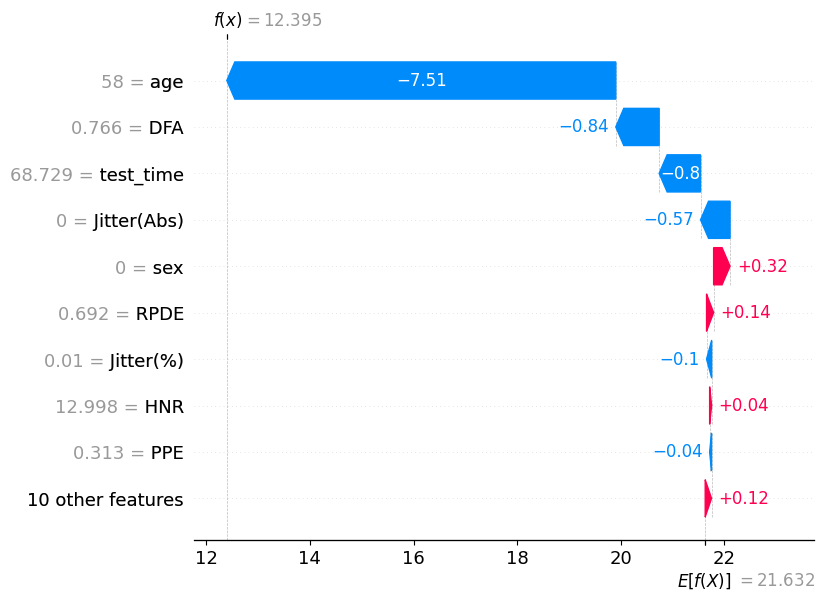

In [ ]:
#test 1.7
shap.plots.waterfall(shap_values_bt_shap[0])

In [ ]:
#################################################

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_2 = shapley_val_bt_df.query("15<=motor_UPDRS<=20") # 25% - 50%
shapley_val_bt_df_query_2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372,17.288
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566,16.269
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898,17.941
13,-5.590833,0.232759,2.534692,-0.093658,0.282442,-0.003326,0.040207,0.031304,0.030315,0.004699,-0.008063,-0.011482,0.020700,-0.036893,0.074769,0.232943,-0.043351,-0.480654,-0.051177,18.819
14,-4.252091,0.215927,2.291213,-0.085803,-0.216932,-0.006036,-0.007642,0.003959,0.012873,-0.011277,-0.016858,0.001873,0.002315,-0.044817,0.077906,0.072759,0.084278,-1.391235,-0.045945,18.309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1078,-2.012737,-0.751091,0.448395,0.176222,-0.395101,0.061495,0.026296,0.058964,-0.055305,-0.031908,0.081947,-0.045869,-0.026101,0.044684,-0.083837,-0.120674,0.459382,-1.504777,0.012823,17.975
1079,-2.330351,-0.750234,0.618922,-0.137637,0.127328,-0.005261,0.001355,-0.001018,-0.013253,-0.068434,-0.015839,-0.029947,0.046231,-0.031547,-0.028540,0.079906,-0.162396,-2.435590,-0.053661,16.435
1080,-2.590835,-0.785923,0.022800,-0.129865,0.187004,-0.007754,-0.007790,0.001234,0.003477,0.002143,-0.010298,0.008965,-0.020713,-0.033875,-0.004769,0.054391,-0.058701,-2.557522,-0.059732,15.636
1081,-1.344691,-0.884162,-1.074840,-0.141117,0.162327,-0.018811,-0.000211,-0.010233,-0.015064,-0.030643,-0.028180,-0.049992,0.060443,-0.046626,0.003819,0.140649,-0.077221,-2.752142,-0.032480,15.485


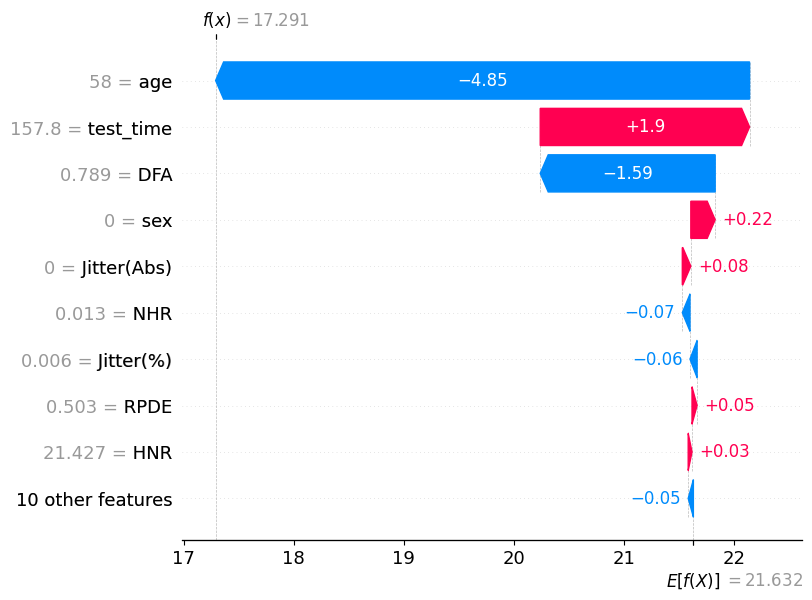

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[2])

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_3 = shapley_val_bt_df.query("20<=motor_UPDRS<=27") # 50% - 75%
shapley_val_bt_df_query_3

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
30,-1.144695,1.555762,-1.636090,-0.028375,0.046380,0.013581,0.024549,0.010176,0.001717,-0.009407,0.004133,-0.013137,0.045900,0.012891,-0.078783,-0.116427,-0.102970,4.119043,-0.059782,24.275
32,-1.719412,1.513233,-2.001502,-0.043410,0.202934,-0.001040,0.004618,0.003507,-0.013631,-0.023417,-0.020531,-0.001950,0.024267,-0.073272,-0.009440,0.157503,-0.088235,3.946097,-0.046840,23.437
33,-1.159185,1.546858,-1.425002,-0.025772,0.055447,0.002751,0.018130,0.002305,0.001109,-0.013783,-0.008713,-0.016708,0.053445,0.021363,-0.079758,-0.108692,-0.078151,4.158841,0.114213,24.695
45,-1.199181,1.542711,-1.653236,-0.032142,0.042482,-0.013272,0.000144,-0.016183,0.003047,-0.010475,-0.000494,-0.016810,0.041915,0.015583,-0.063764,-0.116999,-0.093710,4.200702,0.007601,24.275
47,-0.889475,1.549712,-1.009792,-0.026719,-0.091268,0.001505,0.023558,0.001256,-0.004155,-0.018461,0.001534,-0.025503,0.043191,0.011752,-0.098528,-0.111411,-0.100526,4.687646,-0.044223,25.539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051,25.598
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771,21.078
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195,22.437
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466,25.598


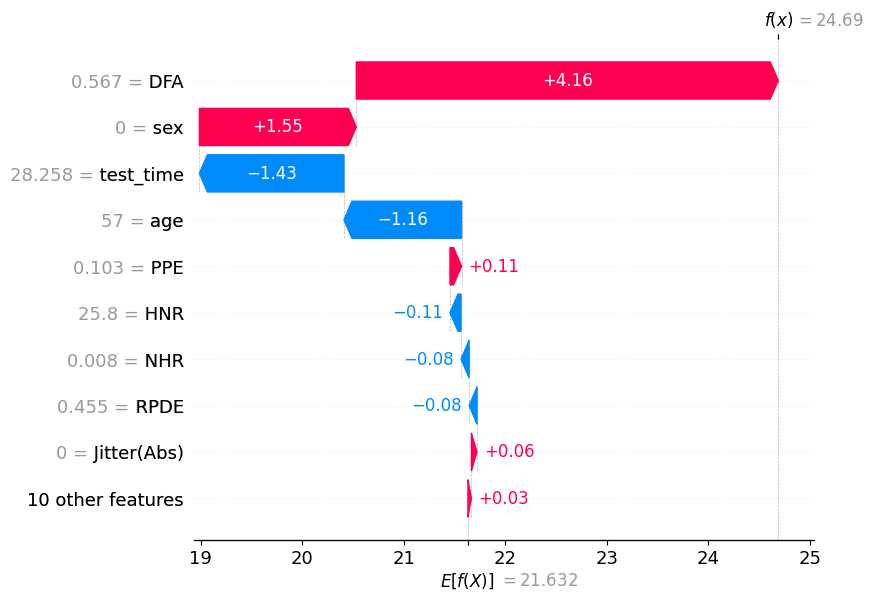

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[33])

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_4 = shapley_val_bt_df.query("27<=motor_UPDRS<=39") # 75% - Max
shapley_val_bt_df_query_4

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
29,-1.608079,0.568962,4.918075,-0.049295,0.134749,-0.007888,0.010074,0.004839,0.000394,-0.025993,-0.016467,0.014596,0.011380,-0.057844,0.023719,0.108851,-0.038201,2.917604,-0.054902,28.503
31,-0.325392,1.661616,0.281871,-0.065361,0.210578,-0.006320,-0.004630,-0.027072,-0.013979,-0.040440,-0.013284,-0.014355,0.012844,-0.068371,0.007491,-0.144612,-0.059890,5.039593,-0.014754,28.057
34,-0.294125,1.653089,1.062649,-0.056420,0.127620,0.011717,0.016099,-0.020405,0.010326,0.007552,-0.016681,-0.021347,0.027575,-0.006174,-0.088921,-0.165580,-0.068656,4.641162,-0.040937,28.416
35,-0.446440,1.635323,1.003054,-0.067226,0.160735,-0.005665,0.003692,0.004069,-0.009853,-0.040148,-0.008660,0.003216,0.015982,-0.055803,-0.088110,-0.119009,-0.080977,4.747655,-0.086050,28.213
36,-0.282716,1.694250,1.626138,-0.046321,0.287037,-0.000903,0.008638,0.005619,-0.018903,-0.032393,0.008126,-0.024392,0.006108,0.013904,0.024868,0.110304,-0.017724,3.529492,-0.048651,28.503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,10.058800,1.205805,0.524554,-0.066401,0.182542,-0.007454,-0.002027,0.007264,0.048787,-0.047296,-0.024154,0.025072,0.085529,-0.048454,0.020780,0.358456,0.057100,-0.106522,0.110649,34.012
1111,10.061510,0.962997,-1.466795,-0.094843,-0.011012,0.001841,-0.005663,0.006138,0.035545,-0.014031,-0.010715,-0.000454,0.017226,-0.002716,0.007247,-0.466784,-0.087163,0.838071,0.012128,31.418
1112,9.530456,-0.004795,-0.507813,-0.163483,1.900620,-0.329779,-0.043144,-0.312485,0.005101,-0.075309,-0.029512,-0.069303,0.058252,-0.094790,-0.536820,1.561015,0.046322,0.117364,-0.043985,32.610
1113,9.411244,0.841707,-2.363115,-0.131363,-0.040472,-0.038798,0.051385,-0.076024,0.039916,-0.008988,-0.017486,-0.009059,-0.012320,0.018080,-0.261278,-0.650666,-0.041385,0.898723,-0.028746,29.211


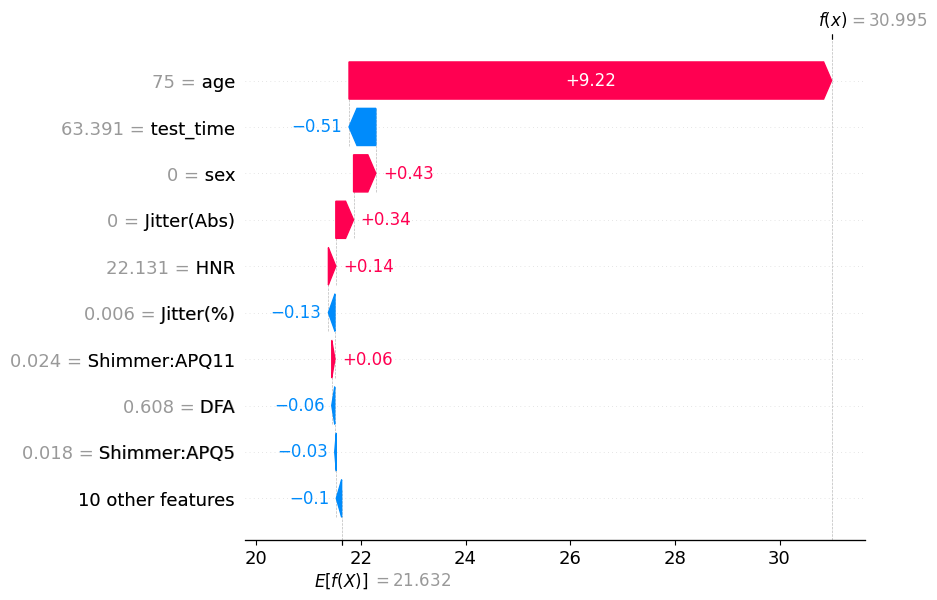

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[100])

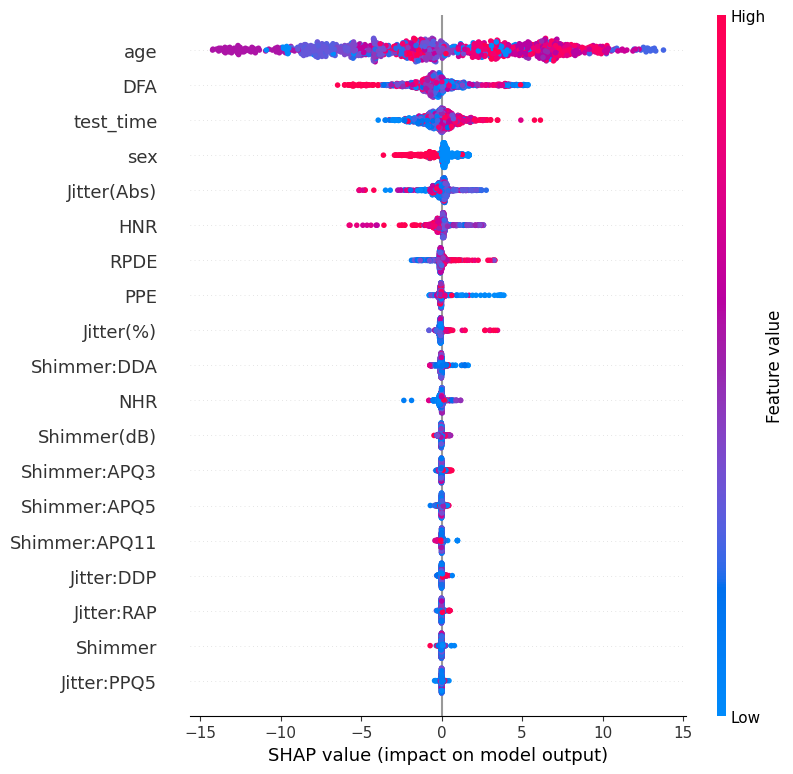

In [ ]:
shap.plots.beeswarm(shap_values_bt_shap, max_display=20)

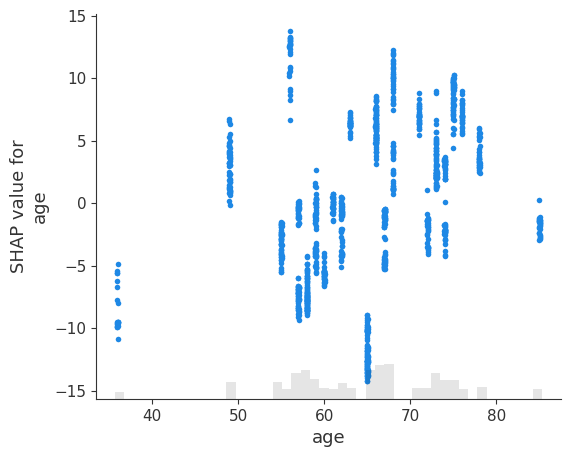

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'age'])

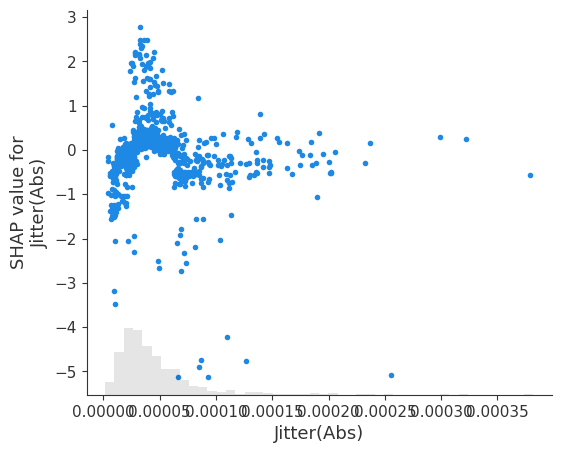

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'Jitter(Abs)'])


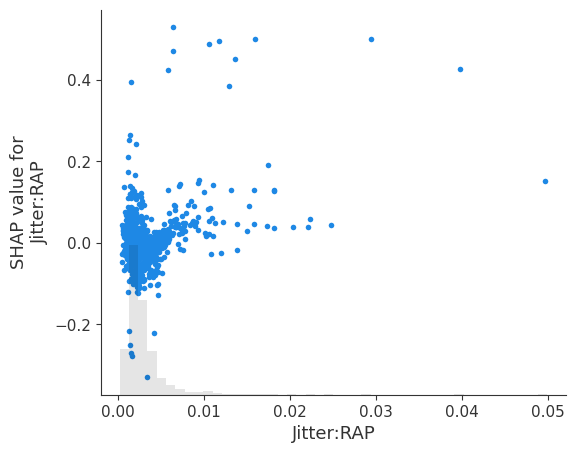

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'Jitter:RAP'])

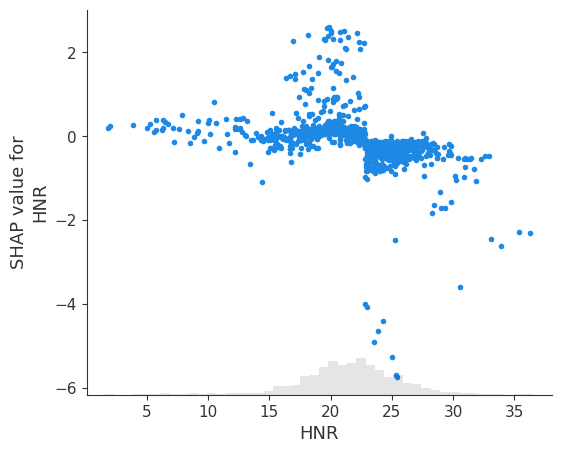

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'HNR'])

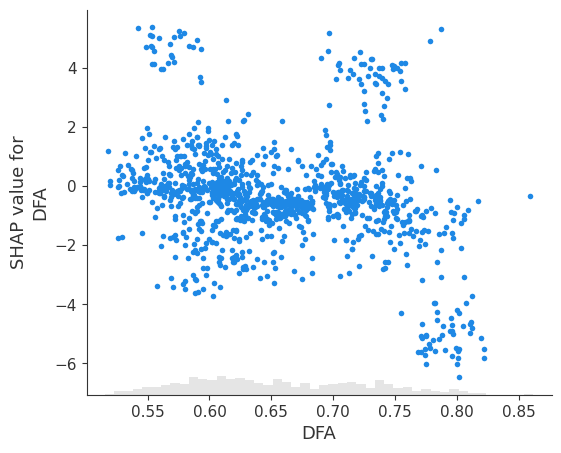

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'DFA'])

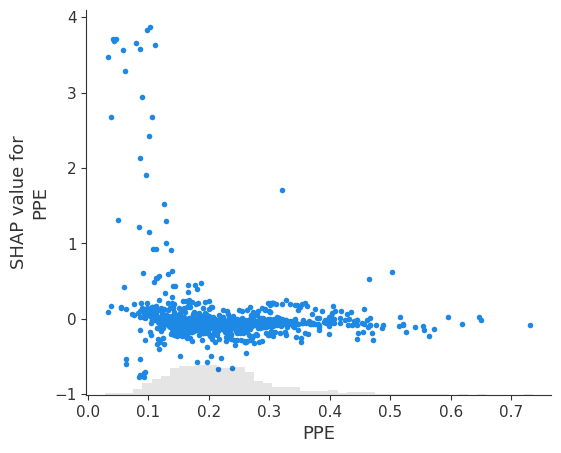

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'PPE'])

## **14.2. PARTIAL DEPENDENCY PLOT**

In [ ]:
x_validation_bt_after_fs

,age,sex,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,58,0,68.729,0.01033,0.000085,0.00593,0.00582,0.01779,0.06918,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,58,0,59.803,0.00348,0.000024,0.00184,0.00207,0.00551,0.03752,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,58,0,157.800,0.00631,0.000046,0.00325,0.00339,0.00976,0.03957,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,58,0,143.830,0.00955,0.000074,0.00467,0.00513,0.01400,0.05727,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,58,0,166.760,0.00417,0.000030,0.00195,0.00222,0.00585,0.02599,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,61,0,86.767,0.00169,0.000013,0.00067,0.00085,0.00200,0.01383,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,61,0,16.709,0.00296,0.000024,0.00137,0.00168,0.00410,0.02466,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,61,0,37.772,0.00502,0.000044,0.00245,0.00269,0.00736,0.03222,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,61,0,86.765,0.00621,0.000052,0.00279,0.00325,0.00838,0.02742,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
x_validation_bt_after_fs2 = x_validation_bt_after_fs.copy()

In [ ]:
x_validation_bt_after_fs2.reset_index(drop = True, inplace=True)

In [ ]:
print(x_validation_bt_after_fs2)

      age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
0      58    0     68.729    0.01033     0.000085     0.00593      0.00582   
1      58    0     59.803    0.00348     0.000024     0.00184      0.00207   
2      58    0    157.800    0.00631     0.000046     0.00325      0.00339   
3      58    0    143.830    0.00955     0.000074     0.00467      0.00513   
4      58    0    166.760    0.00417     0.000030     0.00195      0.00222   
...   ...  ...        ...        ...          ...         ...          ...   
1140   61    0     86.767    0.00169     0.000013     0.00067      0.00085   
1141   61    0     16.709    0.00296     0.000024     0.00137      0.00168   
1142   61    0     37.772    0.00502     0.000044     0.00245      0.00269   
1143   61    0     86.765    0.00621     0.000052     0.00279      0.00325   
1144   61    0     44.640    0.00647     0.000058     0.00316      0.00253   

      Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:A

In [ ]:
selected_rows31 = x_validation_bt_after_fs2.loc[[0,1,5,6,7]]
print(selected_rows31)

   age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
0   58    0     68.729    0.01033     0.000085     0.00593      0.00582   
1   58    0     59.803    0.00348     0.000024     0.00184      0.00207   
5   58    0     54.769    0.00510     0.000038     0.00278      0.00297   
6   58    0     17.772    0.00804     0.000062     0.00385      0.00435   
7   58    0     38.715    0.00762     0.000057     0.00369      0.00265   

   Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
0     0.01779  0.06918        0.587       0.04132       0.04137   
1     0.00551  0.03752        0.345       0.01743       0.02236   
5     0.00835  0.07305        0.653       0.03807       0.04782   
6     0.01155  0.03678        0.324       0.02037       0.02216   
7     0.01108  0.03036        0.271       0.01687       0.01715   

   Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
0        0.05282      0.12395  0.058886  12.998  0.69227  0.76560  0.

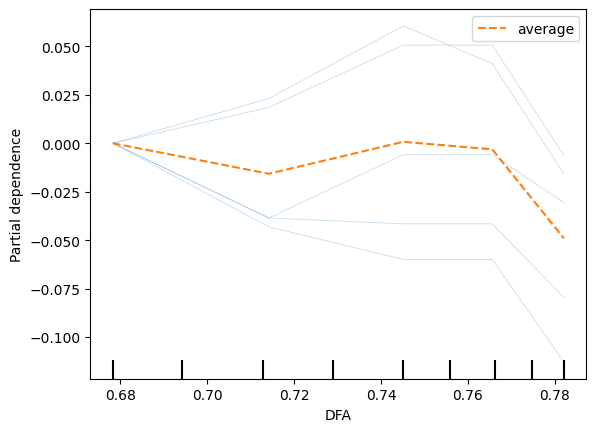

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows31, features=['DFA'], kind='both', centered=True)

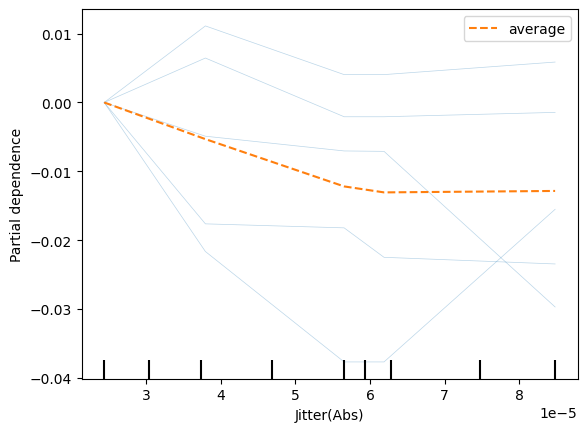

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows31, features=['Jitter(Abs)'], kind='both', centered=True)

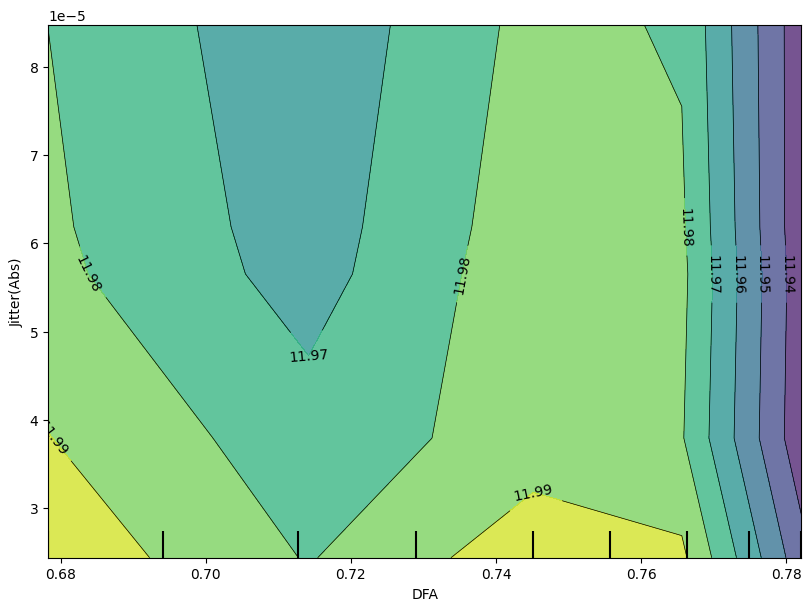

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows31,
                                        features=[('DFA', 'Jitter(Abs)')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

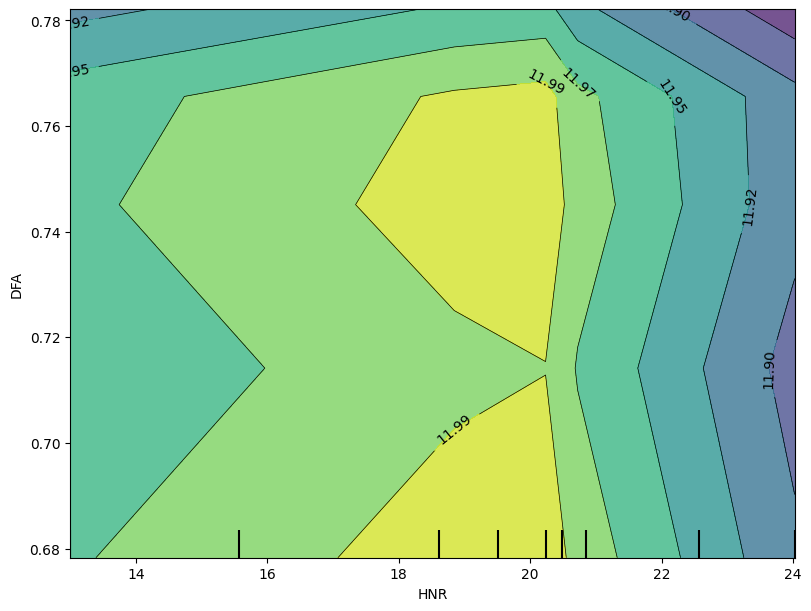

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows31,
                                        features=[('HNR', 'DFA')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows32 = x_validation_bt_after_fs2.loc[[2,3,4,13,14]]
print(selected_rows32)

    age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
2    58    0     157.80    0.00631     0.000046     0.00325      0.00339   
3    58    0     143.83    0.00955     0.000074     0.00467      0.00513   
4    58    0     166.76    0.00417     0.000030     0.00195      0.00222   
13   58    0     178.80    0.00440     0.000033     0.00230      0.00282   
14   58    0     171.80    0.00777     0.000064     0.00381      0.00460   

    Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
2      0.00976  0.03957        0.380       0.02316       0.02275   
3      0.01400  0.05727        0.505       0.03194       0.03464   
4      0.00585  0.02599        0.251       0.01146       0.01435   
13     0.00689  0.05036        0.437       0.02352       0.03349   
14     0.01142  0.03591        0.317       0.01982       0.02008   

    Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
2         0.02527      0.06947  0.013434  21.427  0.5027

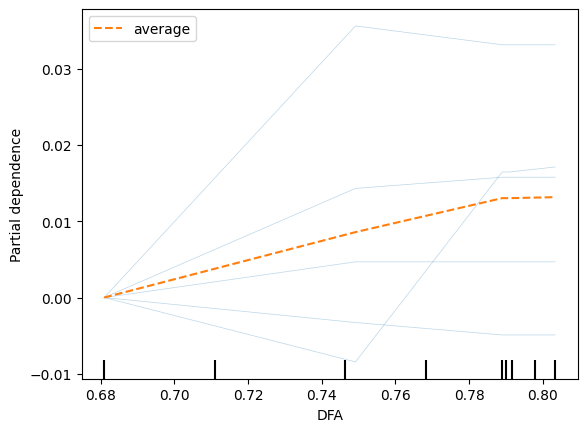

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows32, features=['DFA'], kind='both', centered=True)

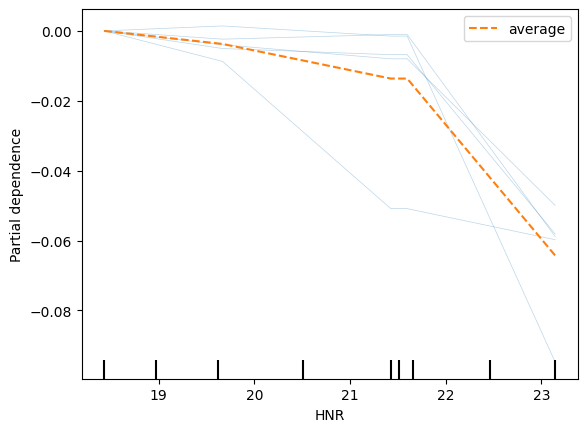

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows32, features=['HNR'], kind='both', centered=True)

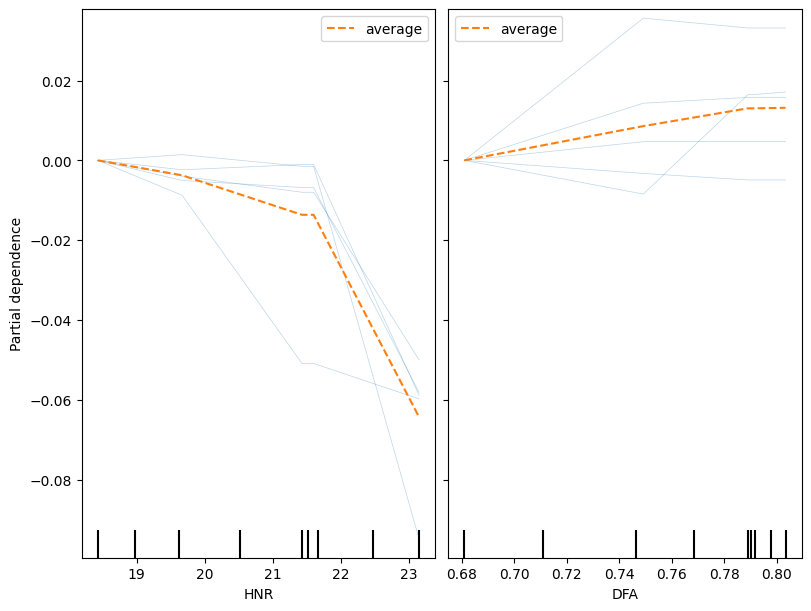

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows32,
                                        features=['HNR', 'DFA'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

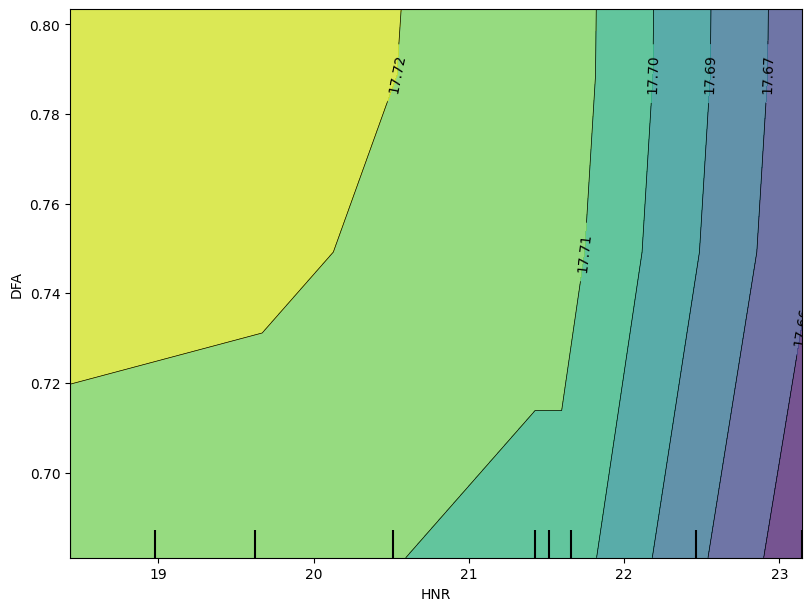

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows32,
                                        features=[('HNR', 'DFA')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows33 = x_validation_bt_after_fs2.loc[[30,32,33,45,47]]
print(selected_rows33)

    age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
30   57    0    21.2490    0.00292     0.000018     0.00138      0.00161   
32   57    0     7.2882    0.00695     0.000039     0.00389      0.00361   
33   57    0    28.2580    0.00304     0.000017     0.00157      0.00151   
45   57    0    21.2470    0.00380     0.000023     0.00221      0.00237   
47   57    0    42.3130    0.00279     0.000016     0.00156      0.00166   

    Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
30     0.00414  0.01160        0.118       0.00538       0.00630   
32     0.01166  0.02426        0.213       0.01349       0.01431   
33     0.00472  0.01205        0.109       0.00621       0.00690   
45     0.00663  0.01034        0.114       0.00509       0.00544   
47     0.00468  0.01797        0.155       0.01053       0.01100   

    Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
30        0.00950      0.01614  0.011256  27.130  0.4318

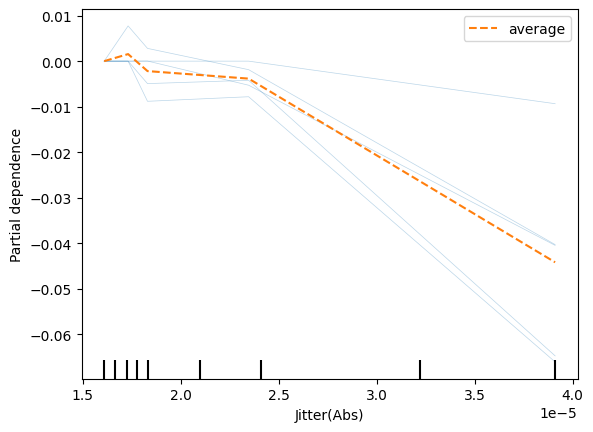

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows33, features=['Jitter(Abs)'], kind='both', centered=True)

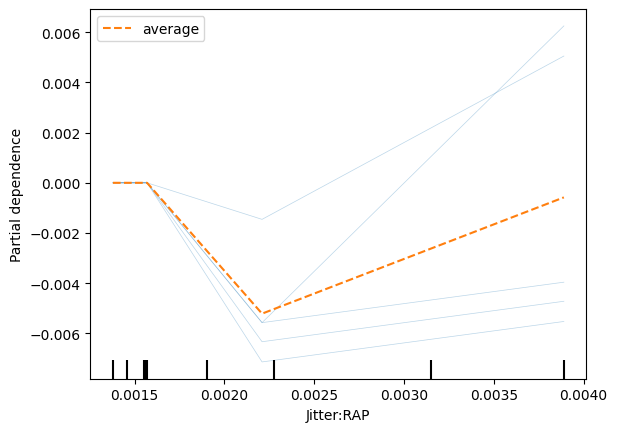

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows33, features=['Jitter:RAP'], kind='both', centered=True)

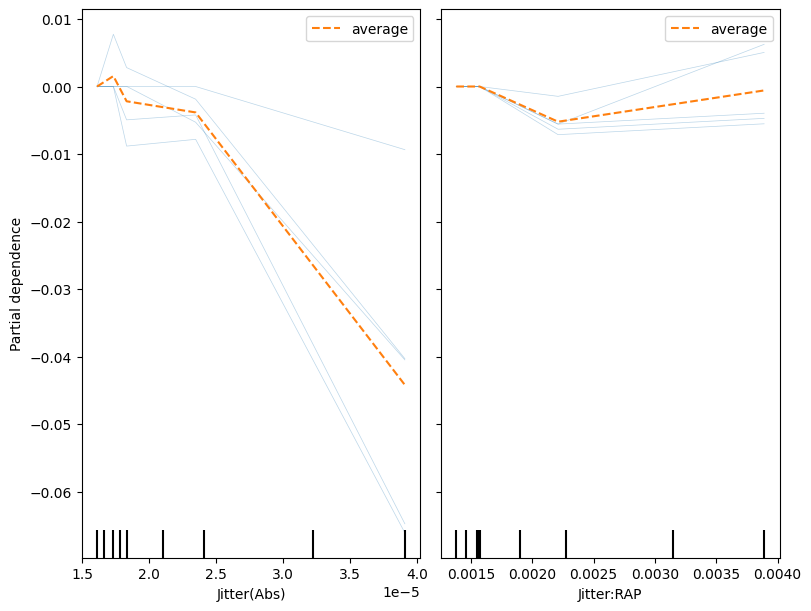

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows33,
                                        features=['Jitter(Abs)', 'Jitter:RAP'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

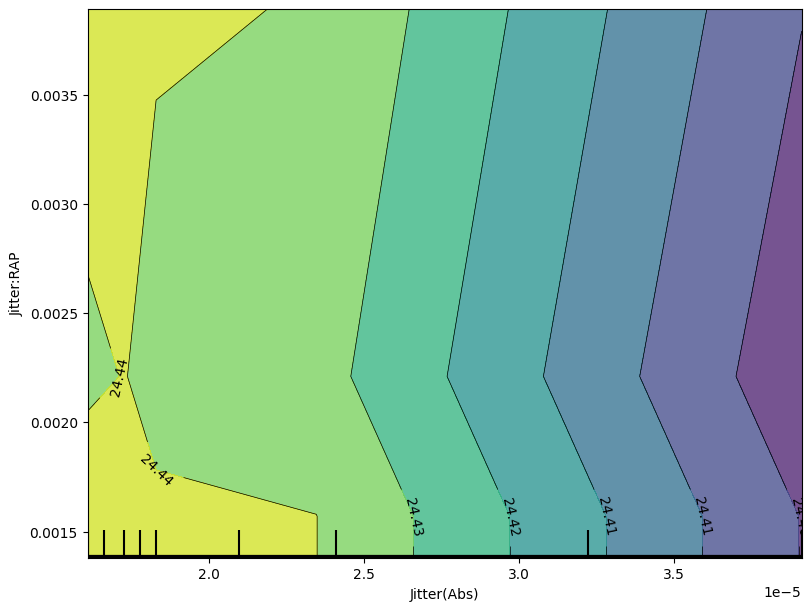

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows33,
                                        features=[('Jitter(Abs)', 'Jitter:RAP')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows34 = x_validation_bt_after_fs2.loc[[1110,1111,1112,1113,1114]]
print(selected_rows34)

      age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
1110   68    1   182.5700    0.00653     0.000038     0.00300      0.00367   
1111   68    1    28.4750    0.00502     0.000023     0.00222      0.00255   
1112   68    1    42.5150    0.00618     0.000038     0.00337      0.00319   
1113   68    1     2.4896    0.00348     0.000015     0.00158      0.00167   
1114   68    1   133.5200    0.01017     0.000045     0.00502      0.00451   

      Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
1110     0.00900  0.03252        0.291       0.01459       0.01873   
1111     0.00667  0.02184        0.191       0.01116       0.01151   
1112     0.01012  0.02967        0.264       0.01598       0.01596   
1113     0.00474  0.01972        0.172       0.00897       0.01041   
1114     0.01505  0.04217        0.375       0.02104       0.02236   

      Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
1110        0.03235      0.043

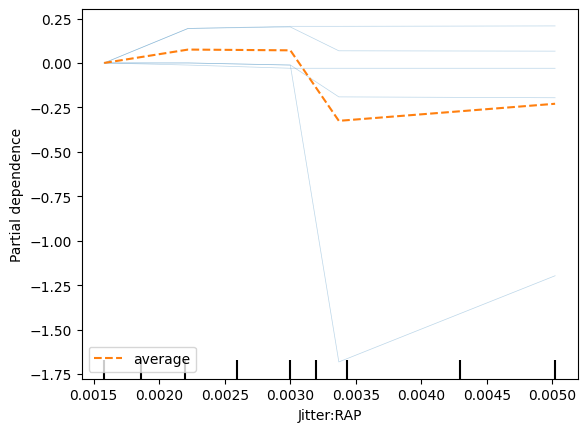

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows34, features=['Jitter:RAP'], kind='both', centered=True)

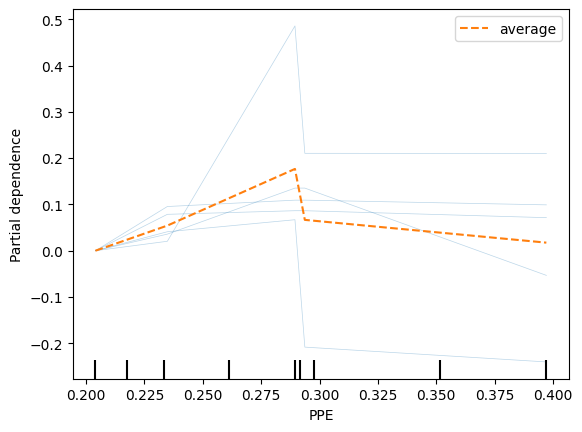

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows34, features=['PPE'], kind='both', centered=True)

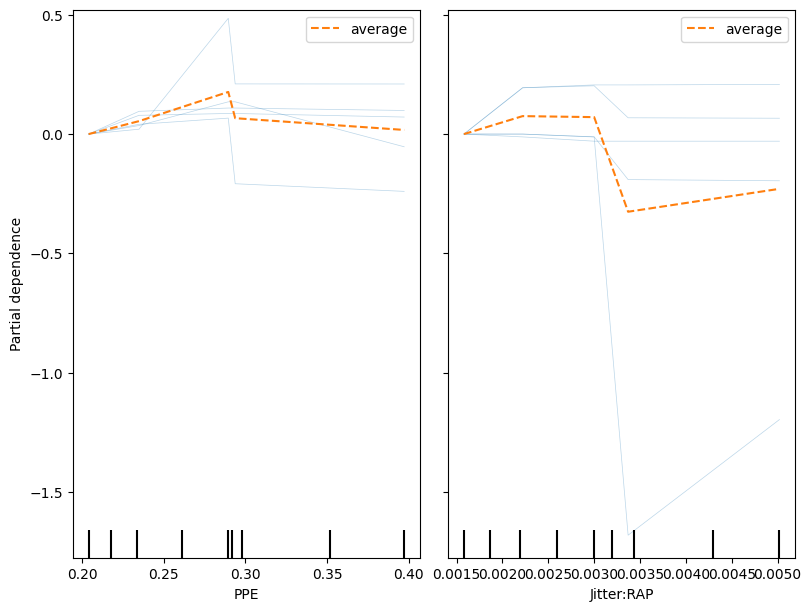

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows34,
                                        features=['PPE', 'Jitter:RAP'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

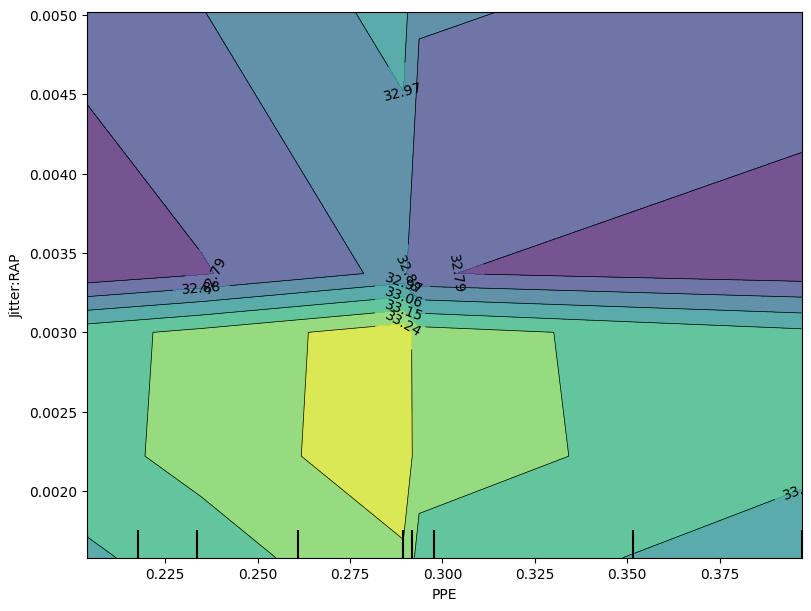

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows34,
                                        features=[('PPE', 'Jitter:RAP')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

# **15. MODEL EVALUATION & ANALYSIS (INTERPRETABILITY / EXPLAINABILITY) - BOOSTED TREES**

* Global and Local Explanations with SHAP
* Partial Dependency Plots

  * **Important**: If the features (predictors) are not independent, PDPs may not represent the true feature's change effects.

  * **Important**: "Shapley Values" can be sensitive to "correlated features", as it becomes difficult to disentangle the "individual contributions" of each feature to the output of the model.

  * **Important**: It is important to remark, that for the sake of properly working with both "Shapley Values" and "Partial Dependency Plots" we executed in the previous stages the followings techniques to handle and/or spot correlated features:
    * Correlation Coefficients during the Exploratory Data Analysis (EDA): Pearson Correlation Coefficient, and Spearman Correlation Coefficient.
    * Principal Component Analysis (PCA): using the "Loading Plot"
  * Boosted Tree

Information  | Shapley Values | Partial Dependency Plots (PDP) |
----------|-----------|------------|
Main Property | Quantify the contribution of each feature to the model's output for a especific prediction. | Shows how the predicted output changes as the value of a single feature is varied, holding other features. |
Pros | Can handle non-linear relationships. | Provide an intuitive visualization of feature effects. Can identify non-linear and interactive relationships.|
 |  |  Computationally efficient. Less sensitive to outliers as they summarize the average effect of a specific feature.|
Cons | Computationally expensive. Sensitive to correlated features and outliers. | Assume features are independent. |


## **15.1. SHAPLEY VALUES**

In [ ]:
!pip install --upgrade -q shap
import shap
shap.initjs()

In [ ]:
#Using validation data - Part 1

model_bt_shap = GradientBoostingRegressor(random_state=728,  n_estimators=110,  max_depth=10)

#Transformed data of independent features (validation data after cross validation)
model_bt_shap = model_bt_shap.fit(X_transformed_bt_val_df, y_validation_after_fs)

In [ ]:
#Using validation data - Part 2 (probablu drop, useless )

eval_results = cross_validate(
    model_bt_shap, X_transformed_bt_val_df, y_validation_after_fs, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
    )
print(-eval_results['test_score'].mean(), eval_results['test_score'].std())
print(-eval_results['train_score'].mean(), eval_results['train_score'].std())

7.459065945130436 1.3230210936606817
0.0026459406437336496 0.0012488989846765244


In [ ]:
#Using validation data - Part 3

import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor

# Assuming 'model_bt_shap' and 'X_transformed_bt_val_df' are already defined as in your code

# Calculate feature importances instead of coefficients
feature_importances_bt_shap = pd.DataFrame({
    'feature': X_transformed_bt_val_df.columns,
    'importance': np.round(model_bt_shap.feature_importances_, 3)
})
feature_importances_bt_shap

,feature,importance
0,age,0.661
1,sex,0.032
2,test_time,0.070
3,Jitter(%),0.010
4,Jitter(Abs),0.042
5,Jitter:RAP,0.001
6,Jitter:PPQ5,0.001
7,Jitter:DDP,0.002
8,Shimmer,0.002
9,Shimmer(dB),0.003


          Feature  Importance  Coverage
0             age    0.661347  2.873108
1             DFA    0.101265  0.979484
2       test_time    0.069668  1.284287
3     Jitter(Abs)    0.041546  0.455927
4             sex    0.032419  0.161548
5             HNR    0.022468  0.553918
6            RPDE    0.019630  0.725804
7             PPE    0.013006  0.433863
8       Jitter(%)    0.010056  0.180341
9     Shimmer:DDA    0.007443  0.127868
10            NHR    0.004977  0.337046
11   Shimmer:APQ3    0.002997  0.132386
12    Shimmer(dB)    0.002749  0.175395
13     Jitter:DDP    0.002363  0.187884
14        Shimmer    0.002181  0.153791
15   Shimmer:APQ5    0.002160  0.228551
16  Shimmer:APQ11    0.001347  0.338396
17     Jitter:RAP    0.001302  0.129853
18    Jitter:PPQ5    0.001078  0.228884


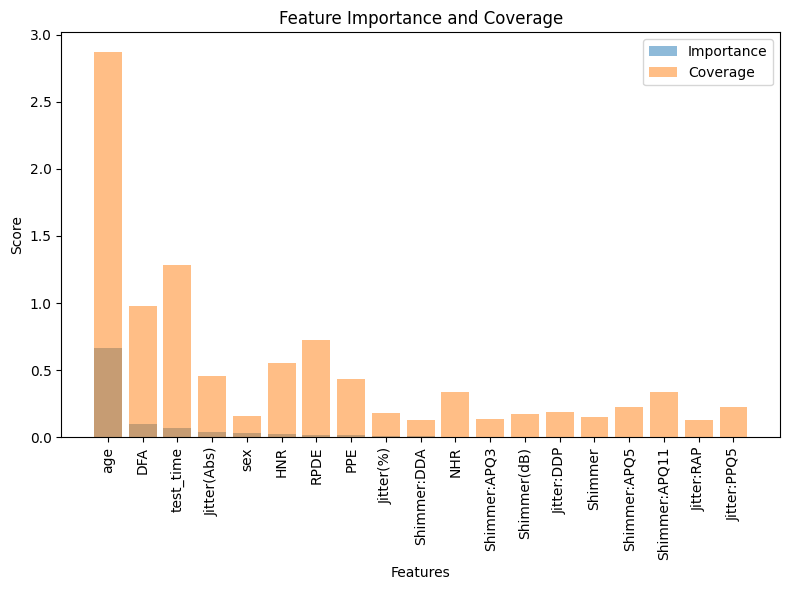

Mean Squared Error: 0.0001367922619731434


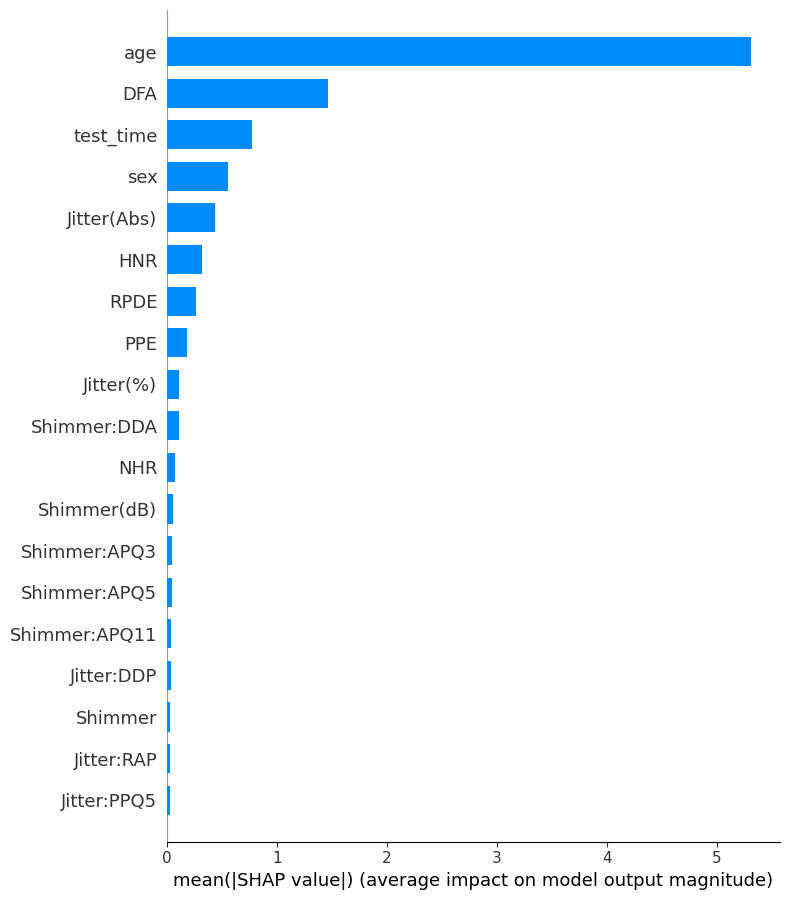

In [ ]:
#Using validation data - Part 4

import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import shap

# Assuming you have already defined X_transformed_bt_val_df and y_validation_after_fs

# Define and train the model
model_bt_shap = GradientBoostingRegressor(random_state=728, n_estimators=110, max_depth=10)
model_bt_shap.fit(X_transformed_bt_val_df, y_validation_after_fs)

# 1. Feature Importance (combines frequency of use and gain)
feature_importance = model_bt_shap.feature_importances_

# 2. Proxy for Coverage (proportion of samples affected by each feature)
def calculate_coverage(model, X):
    coverage = np.zeros(X.shape[1])
    for tree in model.estimators_.flatten():
        tree = tree.tree_
        for node in range(tree.node_count):
            if tree.feature[node] != -2:  # not a leaf node
                feature = tree.feature[node]
                coverage[feature] += tree.n_node_samples[node] / X.shape[0]
    return coverage / model.n_estimators_

coverage = calculate_coverage(model_bt_shap, X_transformed_bt_val_df)

# Combine results into a DataFrame
feature_names = X_transformed_bt_val_df.columns
results = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance,
    'Coverage': coverage
})
results = results.sort_values('Importance', ascending=False).reset_index(drop=True)

print(results)

# Visualize Feature Importance and Coverage
plt.figure(figsize=(8, 6))
plt.bar(results['Feature'], results['Importance'], alpha=0.5, label='Importance')
plt.bar(results['Feature'], results['Coverage'], alpha=0.5, label='Coverage')
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Score')
plt.title('Feature Importance and Coverage')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate MSE for interpretation
from sklearn.metrics import mean_squared_error
y_pred = model_bt_shap.predict(X_transformed_bt_val_df)
mse = mean_squared_error(y_validation_after_fs, y_pred)
print(f"Mean Squared Error: {mse}")

# SHAP Values for more detailed feature importance
explainer = shap.TreeExplainer(model_bt_shap)
shap_values = explainer.shap_values(X_transformed_bt_val_df)

# Plot SHAP summary
shap.summary_plot(shap_values, X_transformed_bt_val_df, plot_type="bar")


In [ ]:
#Transformed data of independent features (validation data after cross validation)

explainer_bt_shap = shap.TreeExplainer(model_bt_shap, X_transformed_bt_val_df)

In [ ]:
shap_values_bt_shap = explainer_bt_shap(X_transformed_bt_val_df)

 98%|===================| 1125/1145 [00:19<00:00]       

In [ ]:
sv_val_bt = shap_values_bt_shap.values
sv_val_bt

array([[-7.51029445,  0.31715606, -0.79920847, ...,  0.13649287,
        -0.83733273, -0.03668686],
       [-7.27545385,  0.32732389, -1.10070468, ..., -0.11496967,
        -0.71076504, -0.03646763],
       [-4.85155051,  0.22127927,  1.90223329, ...,  0.04612483,
        -1.58964344, -0.02337191],
       ...,
       [-0.01793465,  0.46180411, -0.31587095, ...,  0.58908849,
        -0.54817687,  0.04819491],
       [ 0.51667113,  0.68004278,  0.36276564, ...,  0.53273852,
        -0.04785943,  0.14146585],
       [ 0.1540964 ,  0.41851082, -0.16310133, ...,  0.55852805,
        -0.15220688,  0.03562619]])

In [ ]:
#From numpy array to dataframe (Shapley Values)
sv_val_bt_df = pd.DataFrame(sv_val_bt)
sv_val_bt_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466


In [ ]:
sv_val_bt_df.shape

(1145, 19)

In [ ]:
#test 1.1
X_Val_1 = ValSet.drop(['motor_UPDRS'], axis=1)
X_Val_1

,subject,age,sex,test_time,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,2,58,0,68.729,14.694,0.01033,0.000085,0.00593,0.00582,0.01779,...,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,2,58,0,59.803,14.604,0.00348,0.000024,0.00184,0.00207,0.00551,...,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,2,58,0,157.800,19.900,0.00631,0.000046,0.00325,0.00339,0.00976,...,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,2,58,0,143.830,18.736,0.00955,0.000074,0.00467,0.00513,0.01400,...,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,2,58,0,166.760,20.647,0.00417,0.000030,0.00195,0.00222,0.00585,...,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,42,61,0,86.767,36.464,0.00169,0.000013,0.00067,0.00085,0.00200,...,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,42,61,0,16.709,30.437,0.00296,0.000024,0.00137,0.00168,0.00410,...,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,42,61,0,37.772,32.249,0.00502,0.000044,0.00245,0.00269,0.00736,...,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,42,61,0,86.765,36.464,0.00621,0.000052,0.00279,0.00325,0.00838,...,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
#test 1.2
ValSet

,subject,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,2,58,0,68.729,12.388,14.694,0.01033,0.000085,0.00593,0.00582,...,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,2,58,0,59.803,12.208,14.604,0.00348,0.000024,0.00184,0.00207,...,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,2,58,0,157.800,17.288,19.900,0.00631,0.000046,0.00325,0.00339,...,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,2,58,0,143.830,16.269,18.736,0.00955,0.000074,0.00467,0.00513,...,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,2,58,0,166.760,17.941,20.647,0.00417,0.000030,0.00195,0.00222,...,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,42,61,0,86.767,25.598,36.464,0.00169,0.000013,0.00067,0.00085,...,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,42,61,0,16.709,21.078,30.437,0.00296,0.000024,0.00137,0.00168,...,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,42,61,0,37.772,22.437,32.249,0.00502,0.000044,0.00245,0.00269,...,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,42,61,0,86.765,25.598,36.464,0.00621,0.000052,0.00279,0.00325,...,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
#test 1.3
y_validation_after_fs

,motor_UPDRS
232,12.388
279,12.208
219,17.288
217,16.269
291,17.941
...,...
5837,25.598
5778,21.078
5806,22.437
5787,25.598


In [ ]:
#test 1.4
y_validation_after_fs.reset_index(drop = True, inplace=True)

In [ ]:
#test 1.5
shapley_val_bt_df = pd.concat([sv_val_bt_df, y_validation_after_fs], axis=1)
shapley_val_bt_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687,12.388
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468,12.208
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372,17.288
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566,16.269
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898,17.941
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051,25.598
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771,21.078
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195,22.437
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466,25.598


In [ ]:
#test 1.6
shapley_val_bt_df_query_1x = shapley_val_bt_df.query("5<=motor_UPDRS<=15") # 0% - 25%
shapley_val_bt_df_query_1x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
0,-7.510294,0.317156,-0.799208,-0.098004,-0.569703,0.029738,0.006587,0.026252,0.001552,0.014647,0.028678,0.004557,-0.001275,-0.006157,0.017738,0.038666,0.136493,-0.837333,-0.036687,12.3880
1,-7.275454,0.327324,-1.100705,-0.048989,-0.040794,-0.010624,-0.005975,-0.004764,0.000820,-0.026733,-0.020764,-0.004460,0.004272,-0.029215,-0.082445,-0.247331,-0.114970,-0.710765,-0.036468,12.2080
5,-8.523706,0.363322,-1.068349,-0.145737,0.400959,-0.008859,0.003362,-0.008035,-0.007731,0.007306,-0.013276,-0.015229,-0.000719,-0.071396,-0.173841,0.303606,-0.077966,-0.432301,-0.068662,12.1060
6,-8.112849,0.630590,-1.560229,-0.045137,0.055142,-0.016976,-0.006771,-0.007745,0.000149,-0.025300,-0.014841,-0.010200,-0.003285,-0.065465,0.012618,0.036586,-0.176187,-0.917467,-0.057995,11.3590
7,-8.540817,0.383091,-1.289790,-0.012054,0.147420,-0.025959,-0.006540,-0.024271,-0.008127,-0.054903,-0.030849,-0.004093,-0.002937,-0.060892,0.087330,0.256214,-0.105821,-0.569784,0.024689,11.7820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
845,-5.534322,-2.195945,1.672170,-0.088038,-0.134252,-0.023018,-0.021067,-0.028845,-0.016150,-0.032786,-0.010678,-0.008525,0.018537,-0.030749,-0.007752,-0.197795,-0.182933,0.061180,-0.089309,14.7800
846,-9.852677,-2.504369,-1.093041,-0.175909,-0.077234,-0.038727,-0.098019,-0.081893,-0.009444,-0.039641,-0.014878,-0.003267,0.002057,-0.031366,-0.011018,-0.206291,-0.116360,-0.558631,-0.023125,6.6924
847,-6.222435,-2.455462,1.068695,-0.092470,-0.187191,-0.001786,-0.018575,-0.009047,-0.019195,-0.031069,0.000700,0.013800,0.016308,0.005460,0.017797,-0.034405,-0.080119,-0.627380,-0.041981,12.9360
848,-9.626418,-2.491971,-1.094985,-0.146134,-0.173325,-0.045986,-0.104511,-0.075521,-0.012118,-0.022386,-0.003559,-0.034551,0.021419,-0.005341,-0.008538,-0.395060,-0.157819,-0.499468,-0.060080,6.6924


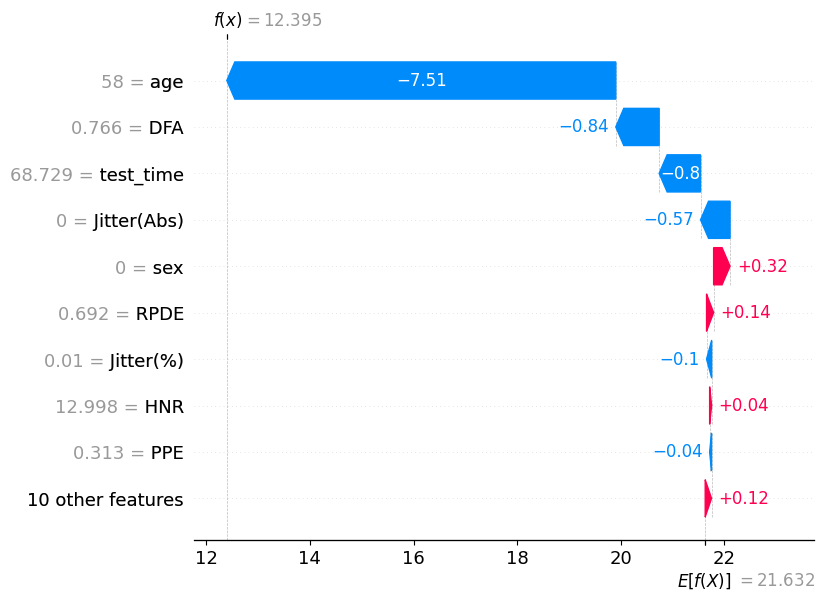

In [ ]:
#test 1.7
shap.plots.waterfall(shap_values_bt_shap[0])

In [ ]:
#################################################

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_2 = shapley_val_bt_df.query("15<=motor_UPDRS<=20") # 25% - 50%
shapley_val_bt_df_query_2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
2,-4.851551,0.221279,1.902233,-0.064598,0.077379,-0.004271,0.010342,-0.001312,0.010275,-0.014149,-0.012471,0.008495,0.009433,-0.029981,-0.069777,0.034726,0.046125,-1.589643,-0.023372,17.288
3,-5.797133,0.216123,1.810408,-0.078919,-0.212524,-0.007975,0.030391,0.009809,0.023598,0.013777,-0.003583,-0.007399,0.008249,-0.018839,0.030548,0.025264,-0.098556,-1.236852,-0.071566,16.269
4,-5.403047,0.188225,2.137329,-0.044700,0.202805,-0.012331,0.006290,-0.002628,0.006196,-0.020878,-0.027656,-0.003046,-0.014508,0.053807,-0.018671,-0.220368,0.092937,-0.708663,0.081898,17.941
13,-5.590833,0.232759,2.534692,-0.093658,0.282442,-0.003326,0.040207,0.031304,0.030315,0.004699,-0.008063,-0.011482,0.020700,-0.036893,0.074769,0.232943,-0.043351,-0.480654,-0.051177,18.819
14,-4.252091,0.215927,2.291213,-0.085803,-0.216932,-0.006036,-0.007642,0.003959,0.012873,-0.011277,-0.016858,0.001873,0.002315,-0.044817,0.077906,0.072759,0.084278,-1.391235,-0.045945,18.309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1078,-2.012737,-0.751091,0.448395,0.176222,-0.395101,0.061495,0.026296,0.058964,-0.055305,-0.031908,0.081947,-0.045869,-0.026101,0.044684,-0.083837,-0.120674,0.459382,-1.504777,0.012823,17.975
1079,-2.330351,-0.750234,0.618922,-0.137637,0.127328,-0.005261,0.001355,-0.001018,-0.013253,-0.068434,-0.015839,-0.029947,0.046231,-0.031547,-0.028540,0.079906,-0.162396,-2.435590,-0.053661,16.435
1080,-2.590835,-0.785923,0.022800,-0.129865,0.187004,-0.007754,-0.007790,0.001234,0.003477,0.002143,-0.010298,0.008965,-0.020713,-0.033875,-0.004769,0.054391,-0.058701,-2.557522,-0.059732,15.636
1081,-1.344691,-0.884162,-1.074840,-0.141117,0.162327,-0.018811,-0.000211,-0.010233,-0.015064,-0.030643,-0.028180,-0.049992,0.060443,-0.046626,0.003819,0.140649,-0.077221,-2.752142,-0.032480,15.485


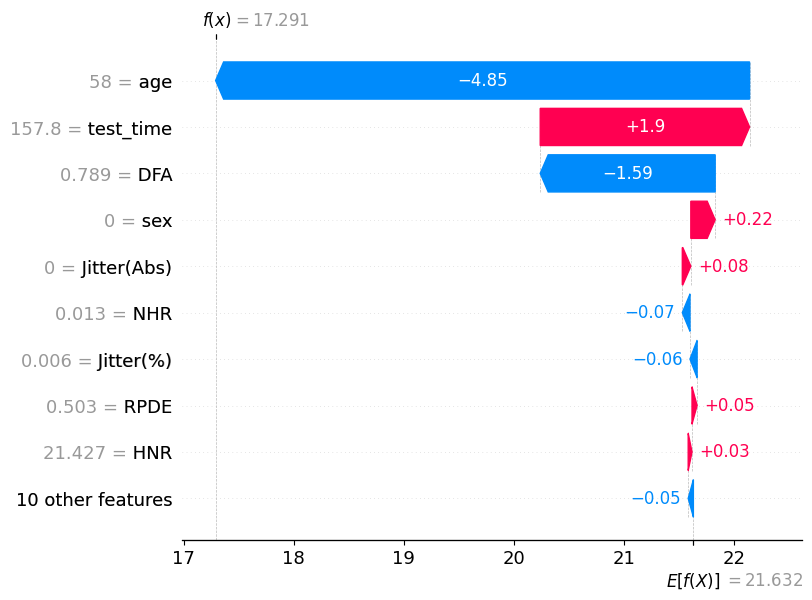

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[2])

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_3 = shapley_val_bt_df.query("20<=motor_UPDRS<=27") # 50% - 75%
shapley_val_bt_df_query_3

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
30,-1.144695,1.555762,-1.636090,-0.028375,0.046380,0.013581,0.024549,0.010176,0.001717,-0.009407,0.004133,-0.013137,0.045900,0.012891,-0.078783,-0.116427,-0.102970,4.119043,-0.059782,24.275
32,-1.719412,1.513233,-2.001502,-0.043410,0.202934,-0.001040,0.004618,0.003507,-0.013631,-0.023417,-0.020531,-0.001950,0.024267,-0.073272,-0.009440,0.157503,-0.088235,3.946097,-0.046840,23.437
33,-1.159185,1.546858,-1.425002,-0.025772,0.055447,0.002751,0.018130,0.002305,0.001109,-0.013783,-0.008713,-0.016708,0.053445,0.021363,-0.079758,-0.108692,-0.078151,4.158841,0.114213,24.695
45,-1.199181,1.542711,-1.653236,-0.032142,0.042482,-0.013272,0.000144,-0.016183,0.003047,-0.010475,-0.000494,-0.016810,0.041915,0.015583,-0.063764,-0.116999,-0.093710,4.200702,0.007601,24.275
47,-0.889475,1.549712,-1.009792,-0.026719,-0.091268,0.001505,0.023558,0.001256,-0.004155,-0.018461,0.001534,-0.025503,0.043191,0.011752,-0.098528,-0.111411,-0.100526,4.687646,-0.044223,25.539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140,0.528722,0.304945,0.407619,-0.065328,-0.277785,0.136206,0.031836,0.157329,0.047891,-0.002213,0.037129,-0.049594,0.037213,-0.089646,-0.100569,-0.275031,0.275512,1.629281,1.224051,25.598
1141,-0.167269,0.274219,-1.053963,-0.073686,-0.154182,0.046859,0.014318,0.074181,-0.003089,-0.019191,0.004372,0.108127,0.021540,0.068787,-0.208628,-0.161979,-0.012056,0.401084,0.292771,21.078
1142,-0.017935,0.461804,-0.315871,-0.105707,0.686018,-0.067084,0.011060,-0.067441,0.015750,-0.047891,-0.085422,0.066713,0.004701,-0.074638,0.054690,0.175479,0.589088,-0.548177,0.048195,22.437
1143,0.516671,0.680043,0.362766,-0.040976,0.871568,-0.020649,0.056067,-0.023386,-0.004745,-0.034586,0.341728,0.215207,0.043594,0.234965,0.046348,0.069334,0.532739,-0.047859,0.141466,25.598


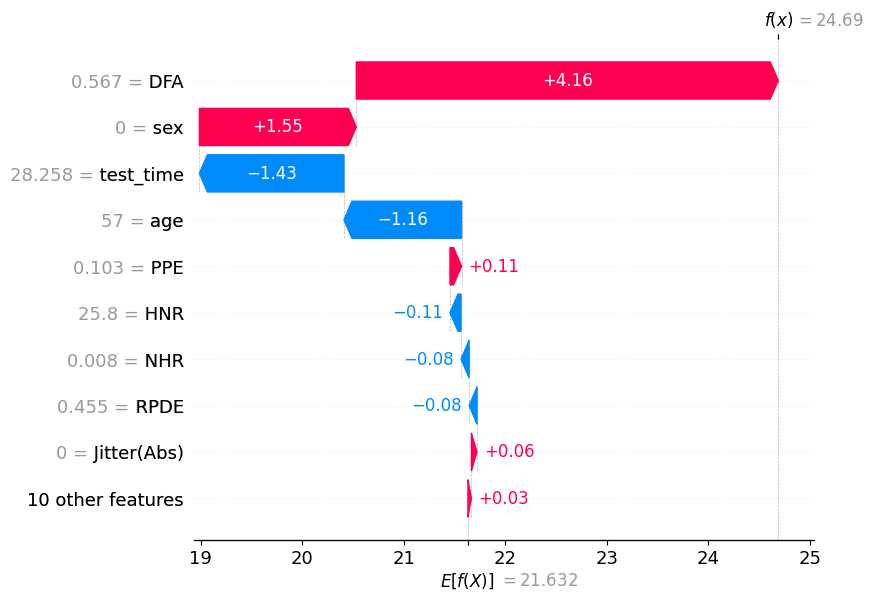

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[33])

In [ ]:
#Filter the values of the newly created dataframe in the previous step
shapley_val_bt_df_query_4 = shapley_val_bt_df.query("27<=motor_UPDRS<=39") # 75% - Max
shapley_val_bt_df_query_4

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,motor_UPDRS
29,-1.608079,0.568962,4.918075,-0.049295,0.134749,-0.007888,0.010074,0.004839,0.000394,-0.025993,-0.016467,0.014596,0.011380,-0.057844,0.023719,0.108851,-0.038201,2.917604,-0.054902,28.503
31,-0.325392,1.661616,0.281871,-0.065361,0.210578,-0.006320,-0.004630,-0.027072,-0.013979,-0.040440,-0.013284,-0.014355,0.012844,-0.068371,0.007491,-0.144612,-0.059890,5.039593,-0.014754,28.057
34,-0.294125,1.653089,1.062649,-0.056420,0.127620,0.011717,0.016099,-0.020405,0.010326,0.007552,-0.016681,-0.021347,0.027575,-0.006174,-0.088921,-0.165580,-0.068656,4.641162,-0.040937,28.416
35,-0.446440,1.635323,1.003054,-0.067226,0.160735,-0.005665,0.003692,0.004069,-0.009853,-0.040148,-0.008660,0.003216,0.015982,-0.055803,-0.088110,-0.119009,-0.080977,4.747655,-0.086050,28.213
36,-0.282716,1.694250,1.626138,-0.046321,0.287037,-0.000903,0.008638,0.005619,-0.018903,-0.032393,0.008126,-0.024392,0.006108,0.013904,0.024868,0.110304,-0.017724,3.529492,-0.048651,28.503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,10.058800,1.205805,0.524554,-0.066401,0.182542,-0.007454,-0.002027,0.007264,0.048787,-0.047296,-0.024154,0.025072,0.085529,-0.048454,0.020780,0.358456,0.057100,-0.106522,0.110649,34.012
1111,10.061510,0.962997,-1.466795,-0.094843,-0.011012,0.001841,-0.005663,0.006138,0.035545,-0.014031,-0.010715,-0.000454,0.017226,-0.002716,0.007247,-0.466784,-0.087163,0.838071,0.012128,31.418
1112,9.530456,-0.004795,-0.507813,-0.163483,1.900620,-0.329779,-0.043144,-0.312485,0.005101,-0.075309,-0.029512,-0.069303,0.058252,-0.094790,-0.536820,1.561015,0.046322,0.117364,-0.043985,32.610
1113,9.411244,0.841707,-2.363115,-0.131363,-0.040472,-0.038798,0.051385,-0.076024,0.039916,-0.008988,-0.017486,-0.009059,-0.012320,0.018080,-0.261278,-0.650666,-0.041385,0.898723,-0.028746,29.211


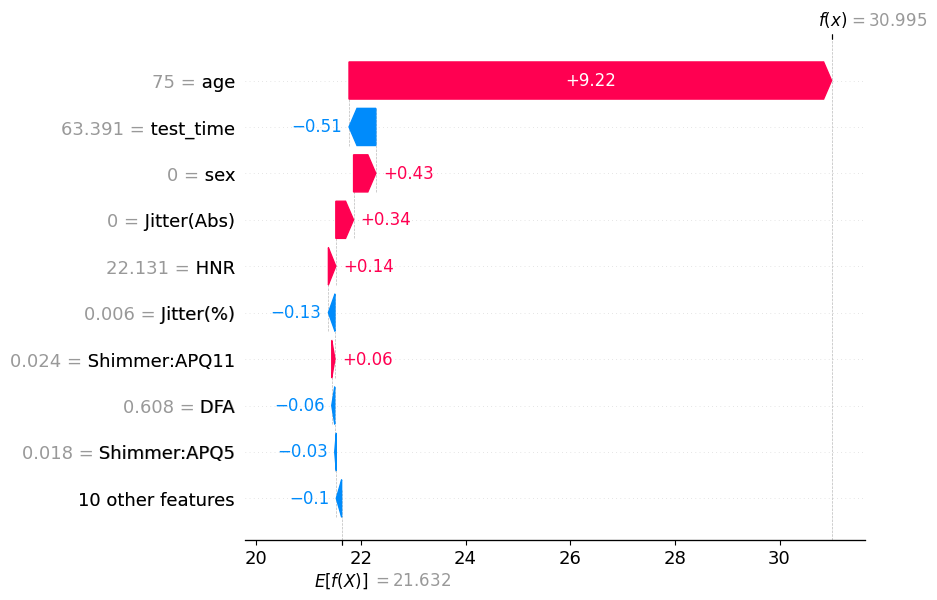

In [ ]:
shap.plots.waterfall(shap_values_bt_shap[100])

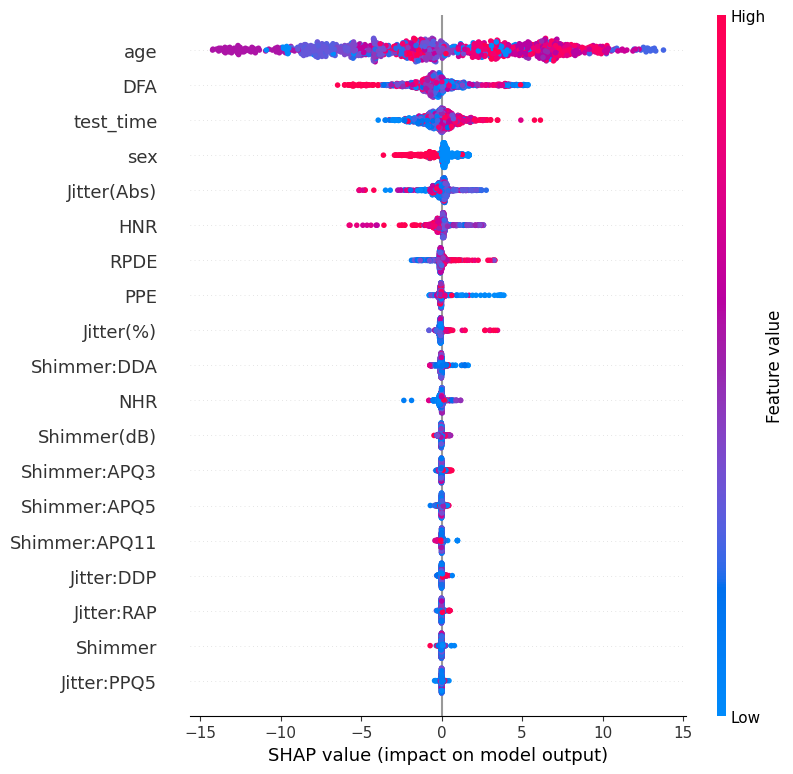

In [ ]:
shap.plots.beeswarm(shap_values_bt_shap, max_display=20)

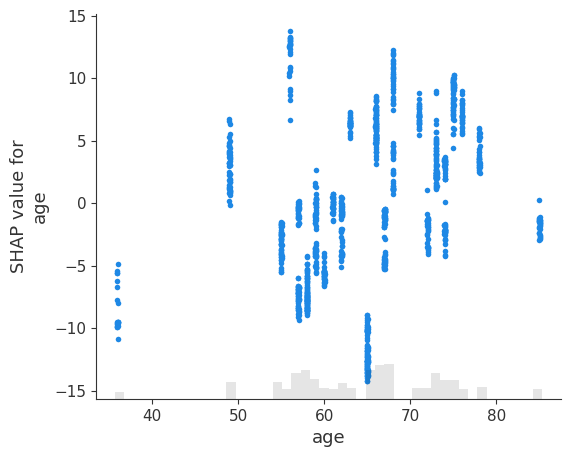

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'age'])

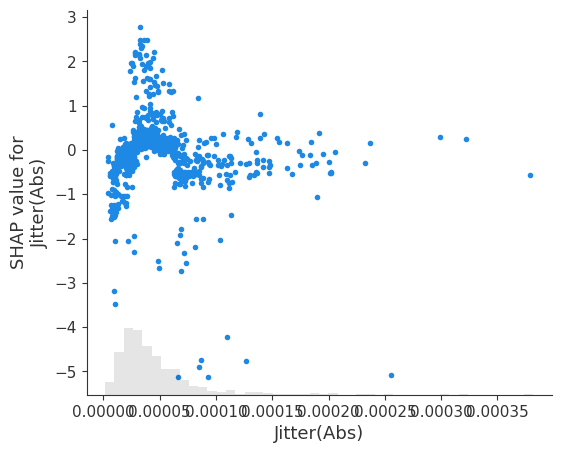

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'Jitter(Abs)'])


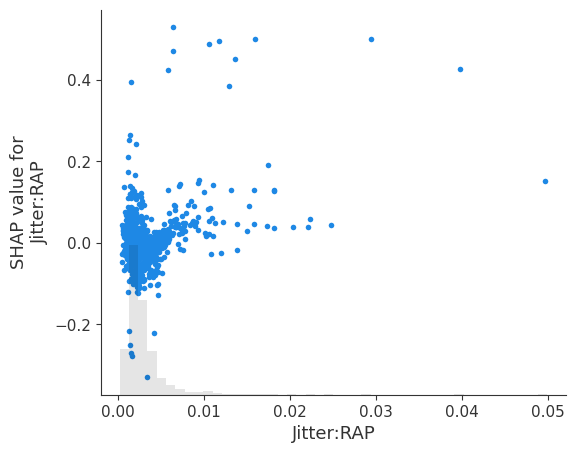

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'Jitter:RAP'])

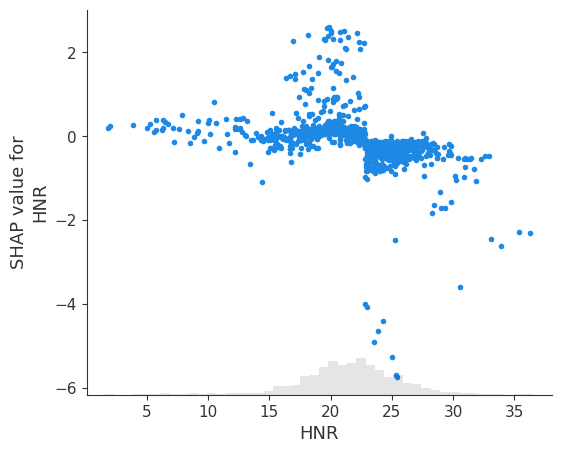

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'HNR'])

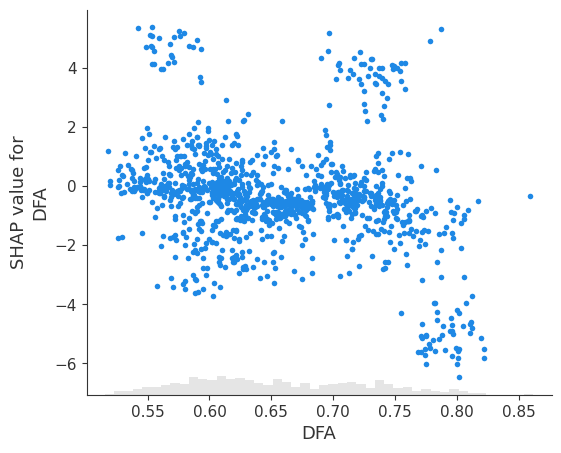

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'DFA'])

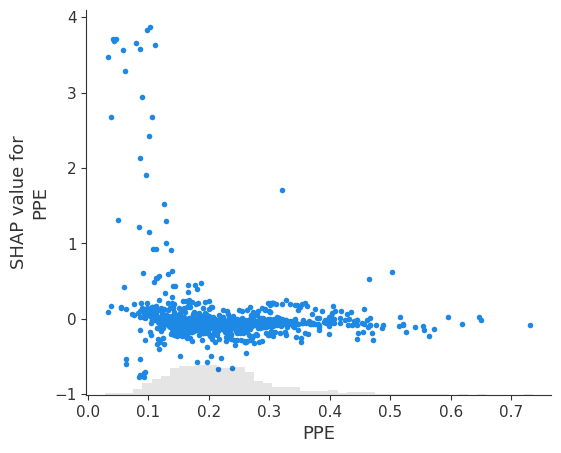

In [ ]:
shap.plots.scatter(shap_values_bt_shap[:, 'PPE'])

## **15.2. PARTIAL DEPENDENCY PLOT**

In [ ]:
x_validation_bt_after_fs

,age,sex,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
232,58,0,68.729,0.01033,0.000085,0.00593,0.00582,0.01779,0.06918,0.587,0.04132,0.04137,0.05282,0.12395,0.058886,12.998,0.69227,0.76560,0.312570
279,58,0,59.803,0.00348,0.000024,0.00184,0.00207,0.00551,0.03752,0.345,0.01743,0.02236,0.03359,0.05228,0.006597,24.026,0.59353,0.67828,0.156860
219,58,0,157.800,0.00631,0.000046,0.00325,0.00339,0.00976,0.03957,0.380,0.02316,0.02275,0.02527,0.06947,0.013434,21.427,0.50273,0.78900,0.205090
217,58,0,143.830,0.00955,0.000074,0.00467,0.00513,0.01400,0.05727,0.505,0.03194,0.03464,0.04658,0.09581,0.021009,18.431,0.57423,0.80335,0.325390
291,58,0,166.760,0.00417,0.000030,0.00195,0.00222,0.00585,0.02599,0.251,0.01146,0.01435,0.02190,0.03437,0.010793,23.144,0.61572,0.68099,0.176350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,61,0,86.767,0.00169,0.000013,0.00067,0.00085,0.00200,0.01383,0.118,0.00669,0.00758,0.01146,0.02008,0.006883,28.084,0.57206,0.54540,0.084809
5778,61,0,16.709,0.00296,0.000024,0.00137,0.00168,0.00410,0.02466,0.202,0.01208,0.01572,0.02150,0.03624,0.008399,24.659,0.51343,0.60601,0.139590
5806,61,0,37.772,0.00502,0.000044,0.00245,0.00269,0.00736,0.03222,0.284,0.01601,0.01751,0.02594,0.04804,0.027738,22.185,0.48484,0.63705,0.185630
5787,61,0,86.765,0.00621,0.000052,0.00279,0.00325,0.00838,0.02742,0.296,0.01052,0.01483,0.02574,0.03156,0.027826,22.292,0.52483,0.61083,0.136340


In [ ]:
x_validation_bt_after_fs2 = x_validation_bt_after_fs.copy()

In [ ]:
x_validation_bt_after_fs2.reset_index(drop = True, inplace=True)

In [ ]:
print(x_validation_bt_after_fs2)

      age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
0      58    0     68.729    0.01033     0.000085     0.00593      0.00582   
1      58    0     59.803    0.00348     0.000024     0.00184      0.00207   
2      58    0    157.800    0.00631     0.000046     0.00325      0.00339   
3      58    0    143.830    0.00955     0.000074     0.00467      0.00513   
4      58    0    166.760    0.00417     0.000030     0.00195      0.00222   
...   ...  ...        ...        ...          ...         ...          ...   
1140   61    0     86.767    0.00169     0.000013     0.00067      0.00085   
1141   61    0     16.709    0.00296     0.000024     0.00137      0.00168   
1142   61    0     37.772    0.00502     0.000044     0.00245      0.00269   
1143   61    0     86.765    0.00621     0.000052     0.00279      0.00325   
1144   61    0     44.640    0.00647     0.000058     0.00316      0.00253   

      Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:A

In [ ]:
selected_rows31 = x_validation_bt_after_fs2.loc[[0,1,5,6,7]]
print(selected_rows31)

   age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
0   58    0     68.729    0.01033     0.000085     0.00593      0.00582   
1   58    0     59.803    0.00348     0.000024     0.00184      0.00207   
5   58    0     54.769    0.00510     0.000038     0.00278      0.00297   
6   58    0     17.772    0.00804     0.000062     0.00385      0.00435   
7   58    0     38.715    0.00762     0.000057     0.00369      0.00265   

   Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
0     0.01779  0.06918        0.587       0.04132       0.04137   
1     0.00551  0.03752        0.345       0.01743       0.02236   
5     0.00835  0.07305        0.653       0.03807       0.04782   
6     0.01155  0.03678        0.324       0.02037       0.02216   
7     0.01108  0.03036        0.271       0.01687       0.01715   

   Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
0        0.05282      0.12395  0.058886  12.998  0.69227  0.76560  0.

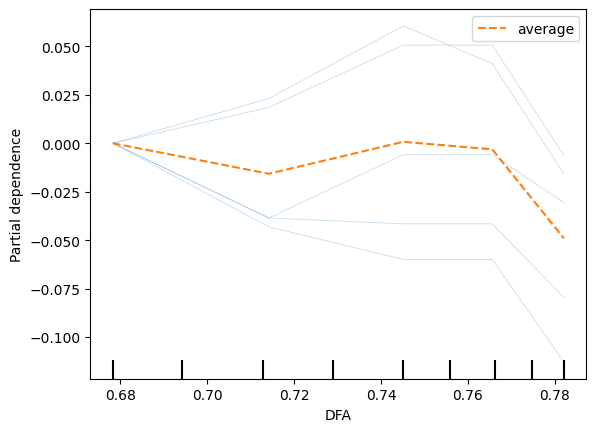

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows31, features=['DFA'], kind='both', centered=True)

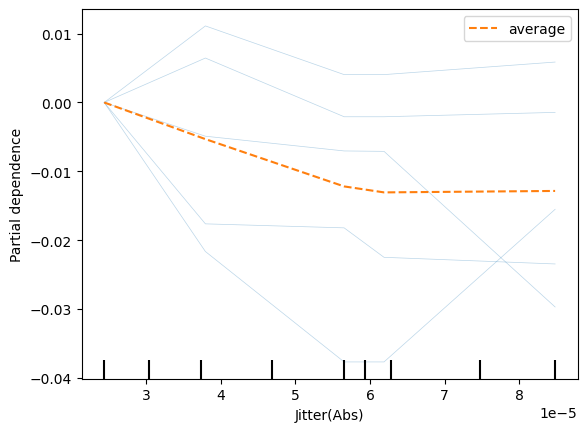

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows31, features=['Jitter(Abs)'], kind='both', centered=True)

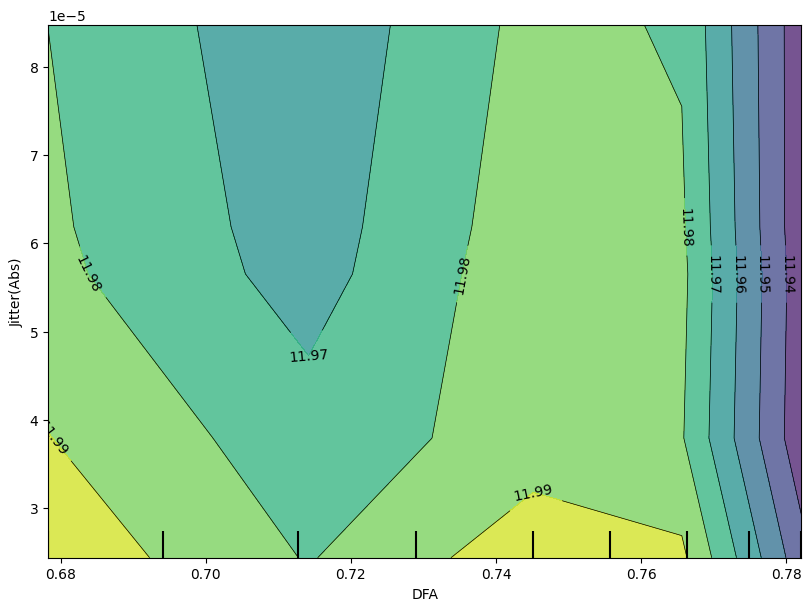

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows31,
                                        features=[('DFA', 'Jitter(Abs)')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

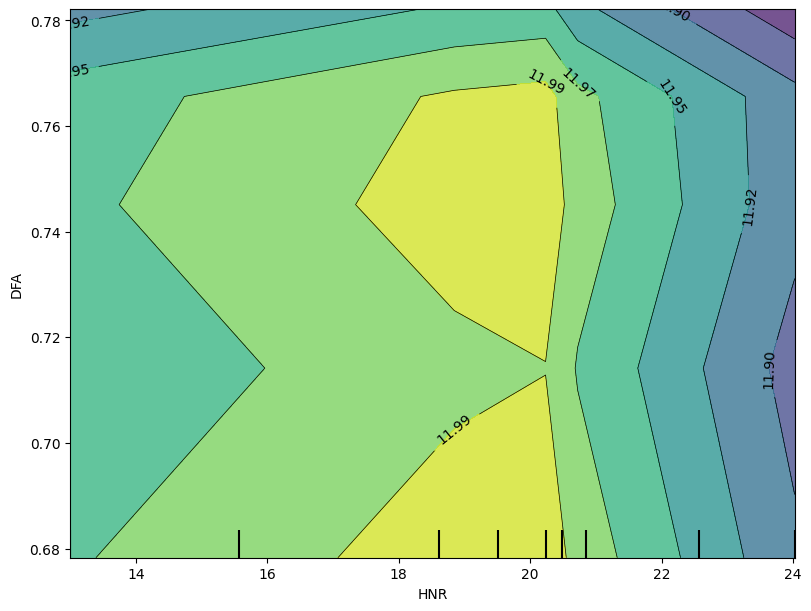

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows31,
                                        features=[('HNR', 'DFA')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows32 = x_validation_bt_after_fs2.loc[[2,3,4,13,14]]
print(selected_rows32)

    age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
2    58    0     157.80    0.00631     0.000046     0.00325      0.00339   
3    58    0     143.83    0.00955     0.000074     0.00467      0.00513   
4    58    0     166.76    0.00417     0.000030     0.00195      0.00222   
13   58    0     178.80    0.00440     0.000033     0.00230      0.00282   
14   58    0     171.80    0.00777     0.000064     0.00381      0.00460   

    Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
2      0.00976  0.03957        0.380       0.02316       0.02275   
3      0.01400  0.05727        0.505       0.03194       0.03464   
4      0.00585  0.02599        0.251       0.01146       0.01435   
13     0.00689  0.05036        0.437       0.02352       0.03349   
14     0.01142  0.03591        0.317       0.01982       0.02008   

    Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
2         0.02527      0.06947  0.013434  21.427  0.5027

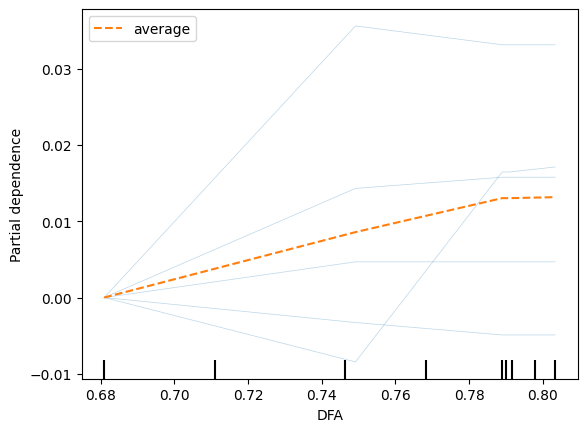

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows32, features=['DFA'], kind='both', centered=True)

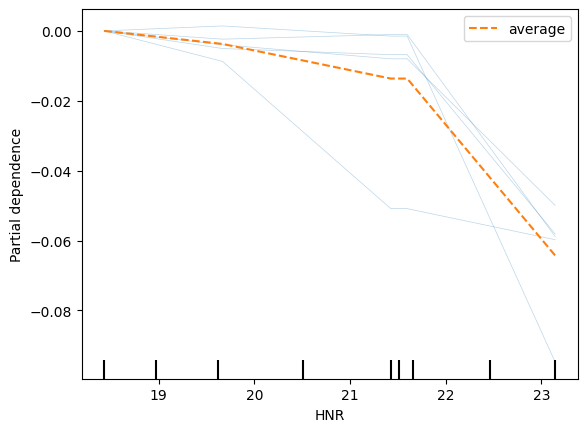

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows32, features=['HNR'], kind='both', centered=True)

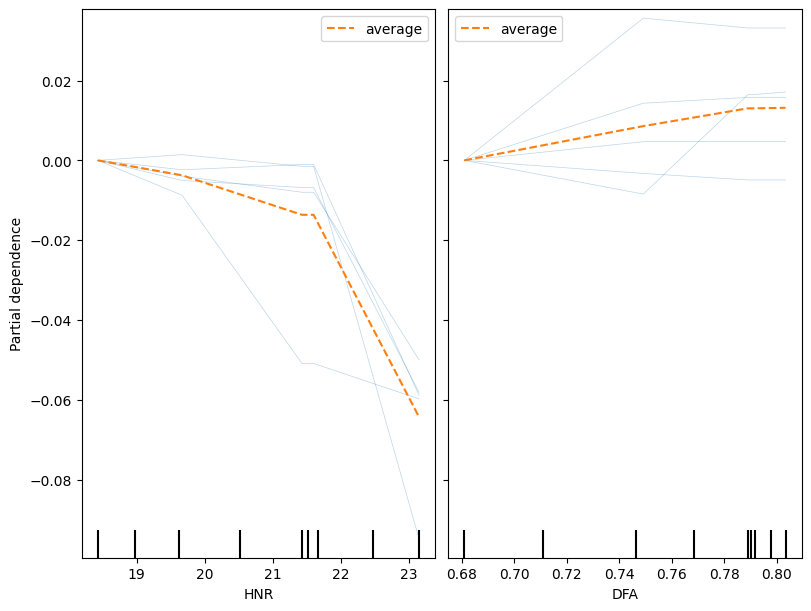

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows32,
                                        features=['HNR', 'DFA'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

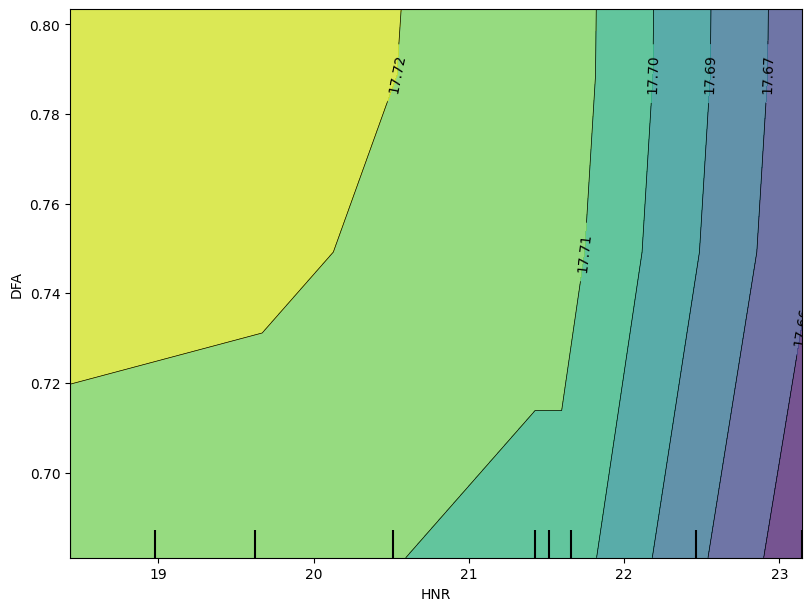

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows32,
                                        features=[('HNR', 'DFA')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows33 = x_validation_bt_after_fs2.loc[[30,32,33,45,47]]
print(selected_rows33)

    age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
30   57    0    21.2490    0.00292     0.000018     0.00138      0.00161   
32   57    0     7.2882    0.00695     0.000039     0.00389      0.00361   
33   57    0    28.2580    0.00304     0.000017     0.00157      0.00151   
45   57    0    21.2470    0.00380     0.000023     0.00221      0.00237   
47   57    0    42.3130    0.00279     0.000016     0.00156      0.00166   

    Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
30     0.00414  0.01160        0.118       0.00538       0.00630   
32     0.01166  0.02426        0.213       0.01349       0.01431   
33     0.00472  0.01205        0.109       0.00621       0.00690   
45     0.00663  0.01034        0.114       0.00509       0.00544   
47     0.00468  0.01797        0.155       0.01053       0.01100   

    Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
30        0.00950      0.01614  0.011256  27.130  0.4318

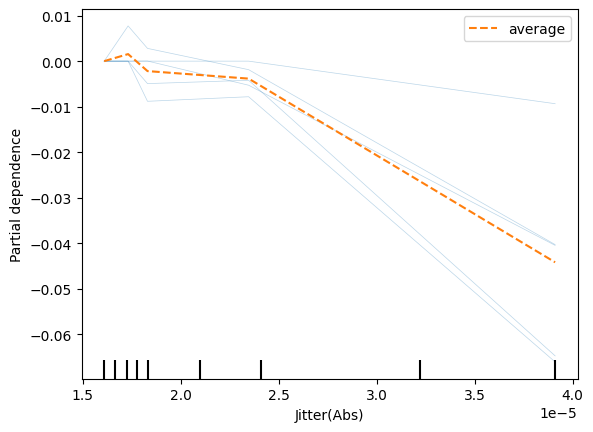

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows33, features=['Jitter(Abs)'], kind='both', centered=True)

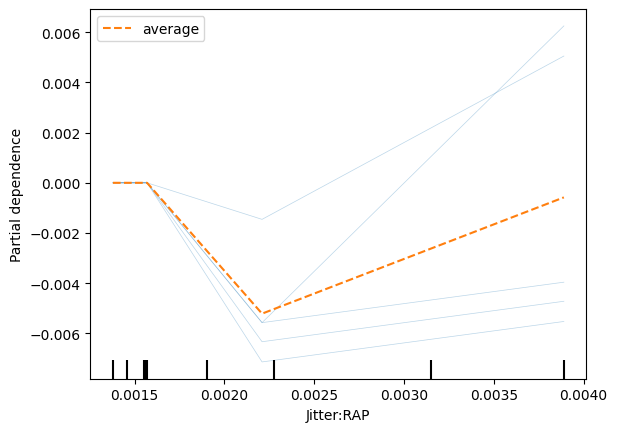

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows33, features=['Jitter:RAP'], kind='both', centered=True)

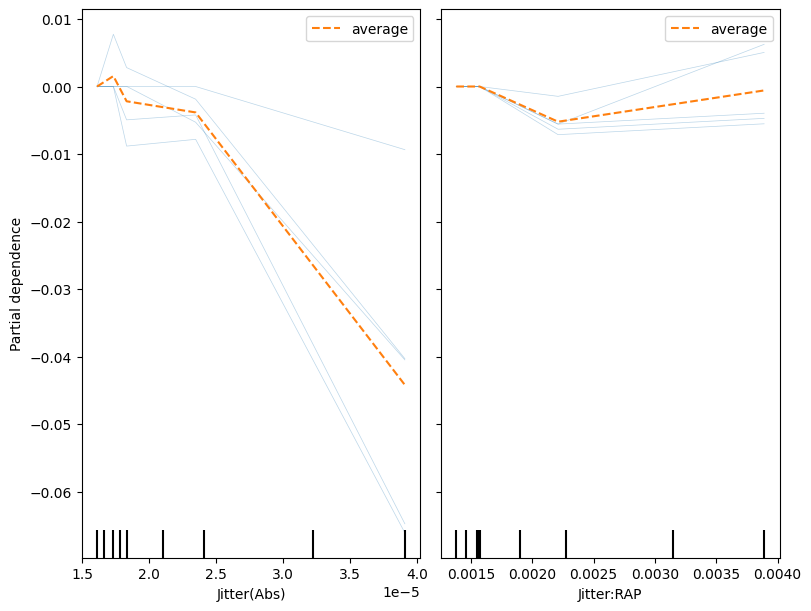

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows33,
                                        features=['Jitter(Abs)', 'Jitter:RAP'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

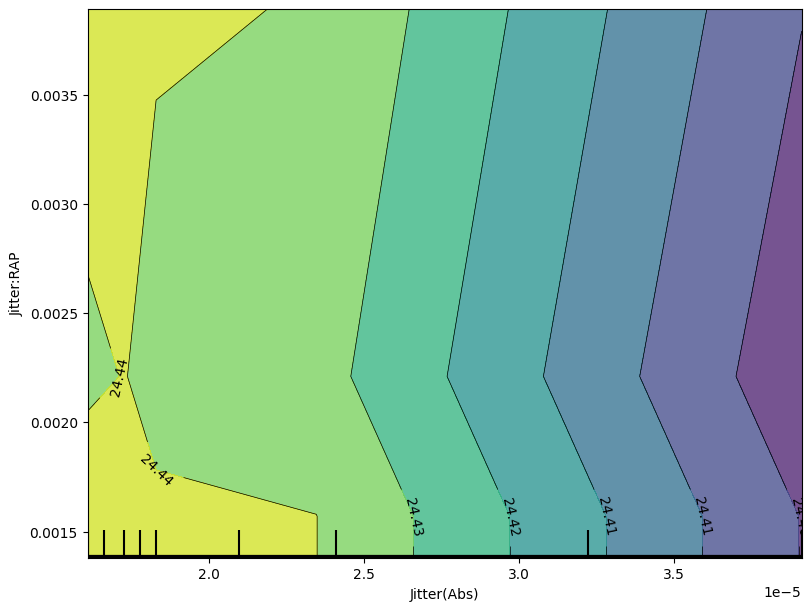

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows33,
                                        features=[('Jitter(Abs)', 'Jitter:RAP')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

In [ ]:
selected_rows34 = x_validation_bt_after_fs2.loc[[1110,1111,1112,1113,1114]]
print(selected_rows34)

      age  sex  test_time  Jitter(%)  Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  \
1110   68    1   182.5700    0.00653     0.000038     0.00300      0.00367   
1111   68    1    28.4750    0.00502     0.000023     0.00222      0.00255   
1112   68    1    42.5150    0.00618     0.000038     0.00337      0.00319   
1113   68    1     2.4896    0.00348     0.000015     0.00158      0.00167   
1114   68    1   133.5200    0.01017     0.000045     0.00502      0.00451   

      Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
1110     0.00900  0.03252        0.291       0.01459       0.01873   
1111     0.00667  0.02184        0.191       0.01116       0.01151   
1112     0.01012  0.02967        0.264       0.01598       0.01596   
1113     0.00474  0.01972        0.172       0.00897       0.01041   
1114     0.01505  0.04217        0.375       0.02104       0.02236   

      Shimmer:APQ11  Shimmer:DDA       NHR     HNR     RPDE      DFA      PPE  
1110        0.03235      0.043

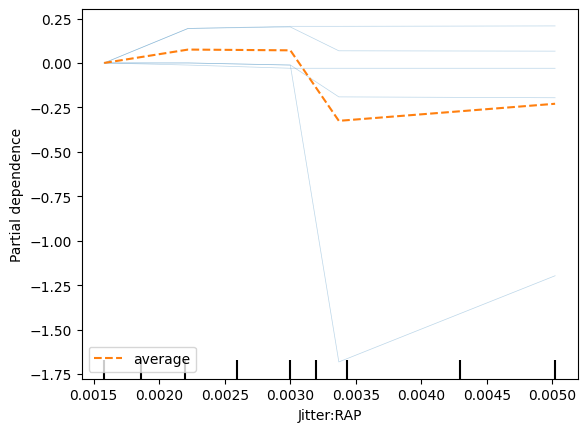

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows34, features=['Jitter:RAP'], kind='both', centered=True)

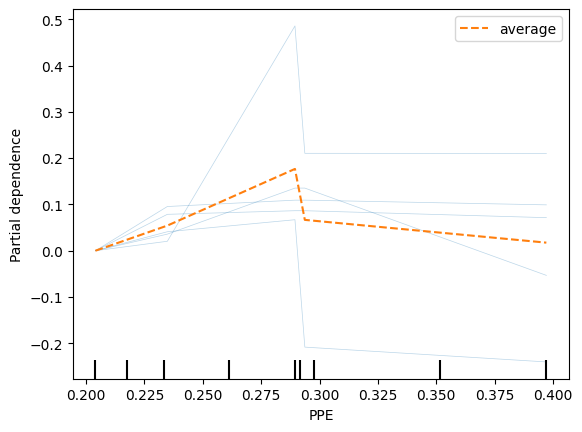

In [ ]:
PartialDependenceDisplay.from_estimator(best_model_bt, selected_rows34, features=['PPE'], kind='both', centered=True)

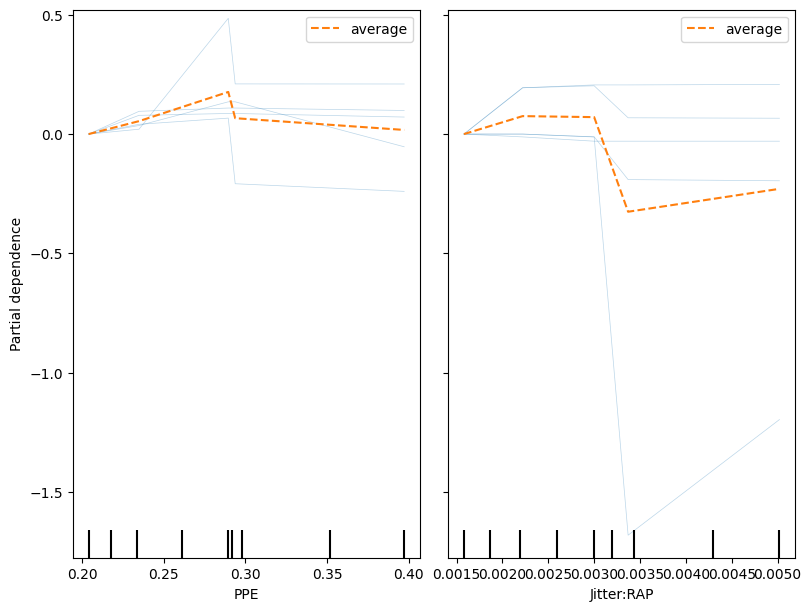

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows34,
                                        features=['PPE', 'Jitter:RAP'],
                                        kind='both',
                                        centered=True,
                                        subsample=100,
                                        grid_resolution=30,
                                        n_jobs=-1,
                                        random_state=0,ax=ax, n_cols=2);

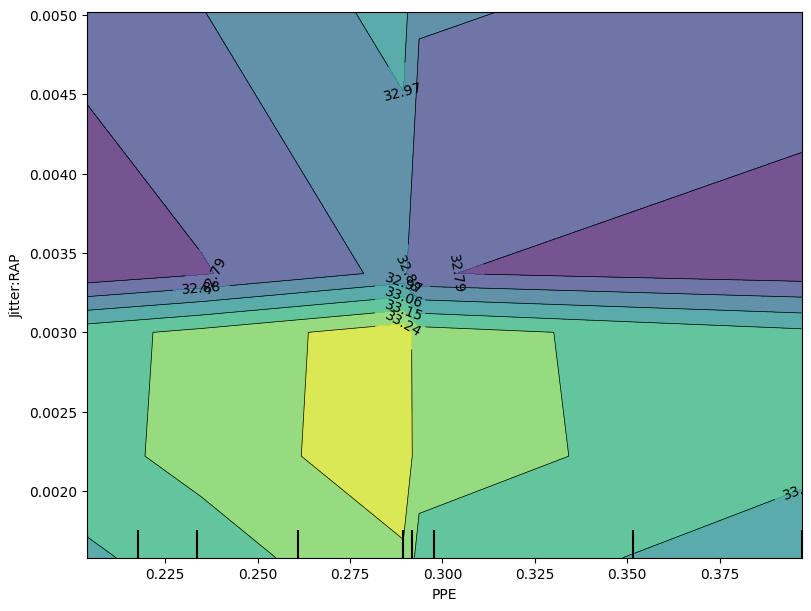

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)

PartialDependenceDisplay.from_estimator(best_model_bt,
                                        selected_rows34,
                                        features=[('PPE', 'Jitter:RAP')],
                                        kind='average',
                                        subsample=100,
                                        grid_resolution=30,
                                        random_state=0,
                                        ax=ax, n_cols=2);

#**9. PROCESSING THE DATASET (FROM TAB TO IMAGE)**

Reference: https://github.com/CBIIT/NCI-DOE-Collab-Pilot1-Image-Generator-for-Tabular-Data

## **9.00 TRAINING SET (PROBABLY DELETE)**

In [ ]:
#Training Set

Y1 = data['motor_UPDRS']

Y2 = data['total_UPDRS']

X = data.drop(['motor_UPDRS', "total_UPDRS","subject"], axis=1)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3584 entries, 0 to 5874
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            3584 non-null   int64  
 1   sex            3584 non-null   int64  
 2   test_time      3584 non-null   float64
 3   Jitter(%)      3584 non-null   float64
 4   Jitter(Abs)    3584 non-null   float64
 5   Jitter:RAP     3584 non-null   float64
 6   Jitter:PPQ5    3584 non-null   float64
 7   Jitter:DDP     3584 non-null   float64
 8   Shimmer        3584 non-null   float64
 9   Shimmer(dB)    3584 non-null   float64
 10  Shimmer:APQ3   3584 non-null   float64
 11  Shimmer:APQ5   3584 non-null   float64
 12  Shimmer:APQ11  3584 non-null   float64
 13  Shimmer:DDA    3584 non-null   float64
 14  NHR            3584 non-null   float64
 15  HNR            3584 non-null   float64
 16  RPDE           3584 non-null   float64
 17  DFA            3584 non-null   float64
 18  PPE          

In [ ]:
#Only working with training dataset

import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

class IGTD:
    def __init__(self, image_size=(224, 224), random_state=42):
        self.image_size = image_size
        self.random_state = random_state
        self.scaler = MinMaxScaler()
        self.pixel_indices = None

    def fit_transform(self, X, y=None):
        # Scale the data
        X_scaled = self.scaler.fit_transform(X)

        # Initialize the list to store images
        images = []

        # Assign each feature to a pixel (or pixels)
        np.random.seed(self.random_state)
        self.pixel_indices = np.random.choice(self.image_size[0] * self.image_size[1], size=X_scaled.shape[1], replace=False)

        # Generate the images
        for sample in X_scaled:
            image = np.zeros(self.image_size)
            for j, value in enumerate(sample):
                pixel_idx = self.pixel_indices[j]
                row, col = pixel_idx // self.image_size[1], pixel_idx % self.image_size[1]
                image[row, col] = value
            images.append(image)

        return images

    def get_pixel_for_feature(self, feature_idx):
        # Get the pixel index for the given feature index
        pixel_idx = self.pixel_indices[feature_idx]

        # Convert the flattened pixel index to row and column indices
        row, col = pixel_idx // self.image_size[1], pixel_idx % self.image_size[1]

        return row, col

    def get_feature_names_for_pixel(self, row, col):
        feature_names = []
        for i, pixel_idx in enumerate(self.pixel_indices):
            r, c = pixel_idx // self.image_size[1], pixel_idx % self.image_size[1]
            if r == row and c == col:
                feature_names.append(X.columns[i])
        return feature_names

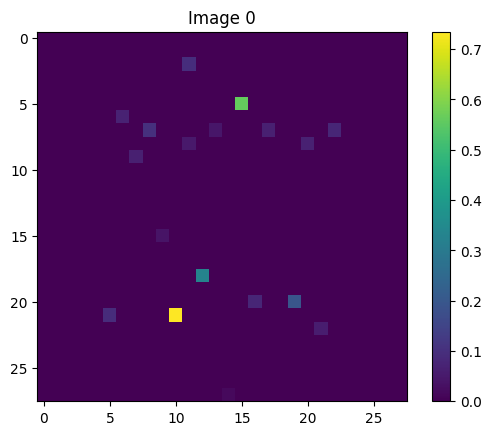

Feature index 0 is mapped to pixel (21, 10)
Features located at pixel (21, 10):
age


In [ ]:
# Create an instance of the IGTD class (only working with training set)
igtd = IGTD(image_size=(28, 28))

# Transform the tabular data into images
image_list = igtd.fit_transform(X, Y1)

###################################################

# FOR PRINTING ALL ELEMENTS OF THE TRAINING SET

# for i, image in enumerate(image_list):
#     print(f"Image {i}:")
#     print("Image with pixel values:")
#     print(image)

#     # Display the image
#     plt.figure()
#     plt.imshow(image, cmap='viridis')
#     plt.title(f'Image {i}')
#     plt.colorbar()
#     plt.show()

#####################################################

# FOR PRINTING THE FIRST ELEMENT OF THE TRAINING SET

#Display a specific image (e.g., index 0)
image_index = 0
image = image_list[image_index]

# Display the image
plt.imshow(image, cmap='viridis')
plt.title(f'Image {image_index}')
plt.colorbar()
plt.show()

#####################################################


# Get the pixel coordinates for feature index 0
row, col = igtd.get_pixel_for_feature(0)
print(f"Feature index 0 is mapped to pixel ({row}, {col})")

# Get the pixel coordinates for a specific feature index
row, col = igtd.get_pixel_for_feature(0)

# Get the list of feature names for the pixel at (row, col)
feature_names = igtd.get_feature_names_for_pixel(row, col)
print(f"Features located at pixel ({row}, {col}):")
for name in feature_names:
    print(name)

In [ ]:
print(len(image_list))

3584


## **9.1. TRAINING, VALIDATION, AND TEST SET**

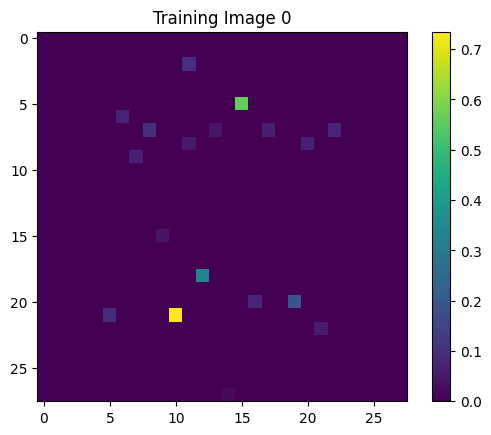

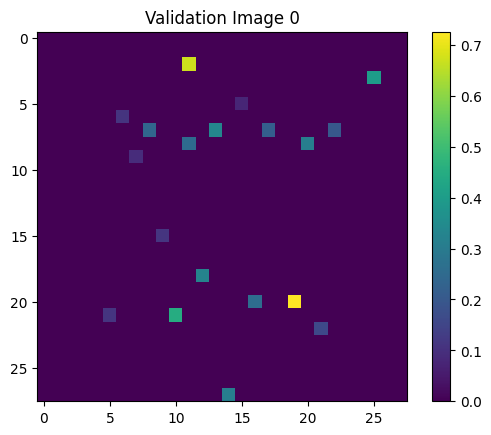

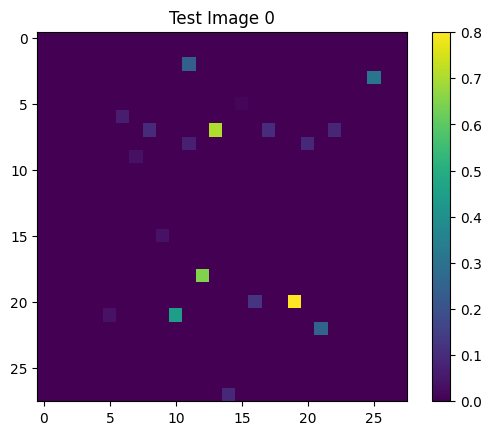

Feature index 0 is mapped to pixel (21, 10)
Features located at pixel (21, 10):
age
Number of training images: 3584
Number of validation images: 1145
Number of test images: 1146


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# IGTD Class for converting tabular data to images
class IGTD:
    def __init__(self, image_size=(224, 224), random_state=42):
        self.image_size = image_size
        self.random_state = random_state
        self.scaler = MinMaxScaler()
        self.pixel_indices = None

    def fit_transform(self, X, y=None):
        # Scale the data
        X_scaled = self.scaler.fit_transform(X)

        # Initialize the list to store images
        images = []  # Make sure it's a list

        # Assign each feature to a pixel (or pixels)
        np.random.seed(self.random_state)
        self.pixel_indices = np.random.choice(self.image_size[0] * self.image_size[1], size=X_scaled.shape[1], replace=False)

        # Generate the images
        for sample in X_scaled:
            image = np.zeros(self.image_size)  # Ensure this is a NumPy array
            for j, value in enumerate(sample):
                pixel_idx = self.pixel_indices[j]
                row, col = pixel_idx // self.image_size[1], pixel_idx % self.image_size[1]
                image[row, col] = value

            # Ensure 'image' is treated as a NumPy array and then append
            images.append(np.array(image))

        return images

    def get_pixel_for_feature(self, feature_idx):
        # Get the pixel index for the given feature index
        pixel_idx = self.pixel_indices[feature_idx]

        # Convert the flattened pixel index to row and column indices
        row, col = pixel_idx // self.image_size[1], pixel_idx % self.image_size[1]

        return row, col

    def get_feature_names_for_pixel(self, row, col, feature_names):
        feature_name_list = []
        for i, pixel_idx in enumerate(self.pixel_indices):
            r, c = pixel_idx // self.image_size[1], pixel_idx % self.image_size[1]
            if r == row and c == col:
                feature_name_list.append(feature_names[i])
        return feature_name_list


# Training Set Processing

# Assume 'data' is your training DataFrame
Y1 = data['motor_UPDRS']
Y2 = data['total_UPDRS']
X = data.drop(['motor_UPDRS', 'total_UPDRS', 'subject'], axis=1)

# Create an instance of the IGTD class
igtd = IGTD(image_size=(28, 28))

# Transform the training tabular data into images
image_list_train = igtd.fit_transform(X, Y1)

# Example: Display a specific image (e.g., index 0 from the training set)
image_index = 0
image = image_list_train[image_index]

# Display the image
plt.imshow(image, cmap='viridis')
plt.title(f'Training Image {image_index}')
plt.colorbar()
plt.show()

# Validation Set Processing

# Assume 'ValSet' is your validation DataFrame
Y_Val_1 = ValSet['motor_UPDRS']
X_Val_1 = ValSet.drop(['motor_UPDRS', 'subject'], axis=1)

# Transform the validation tabular data into images
image_list_val = igtd.fit_transform(X_Val_1, Y_Val_1)

# Example: Display a specific image (e.g., index 0 from the validation set)
image_index = 0
image_val = image_list_val[image_index]

# Display the image
plt.imshow(image_val, cmap='viridis')
plt.title(f'Validation Image {image_index}')
plt.colorbar()
plt.show()

# Test Set Processing

# Assume 'TestSet' is your test DataFrame
Y_Test_1 = TestSet['motor_UPDRS']
X_Test_1 = TestSet.drop(['motor_UPDRS', 'subject'], axis=1)

# Transform the test tabular data into images
image_list_test = igtd.fit_transform(X_Test_1, Y_Test_1)

# Example: Display a specific image (e.g., index 0 from the test set)
image_index = 0
image_test = image_list_test[image_index]

# Display the image
plt.imshow(image_test, cmap='viridis')
plt.title(f'Test Image {image_index}')
plt.colorbar()
plt.show()

# Example of using get_pixel_for_feature and get_feature_names_for_pixel
# Get the pixel coordinates for feature index 0
row, col = igtd.get_pixel_for_feature(0)
print(f"Feature index 0 is mapped to pixel ({row}, {col})")

# Get the list of feature names for the pixel at (row, col)
feature_names = igtd.get_feature_names_for_pixel(row, col, X.columns)
print(f"Features located at pixel ({row}, {col}):")
for name in feature_names:
    print(name)

# Printing the number of images in each set
print(f"Number of training images: {len(image_list_train)}")
print(f"Number of validation images: {len(image_list_val)}")
print(f"Number of test images: {len(image_list_test)}")


#**10. CNN**

##**10.00 GOOD (PROBABLY DELETE)**

In [ ]:
#New version (part 1): Model using only the training set

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# Define the CNN model for regression
class CNNRegressor(nn.Module):
    def __init__(self):
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, 1)  # Output a single value for regression

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.maxpool1(out)

        out = self.conv2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)

        out = self.flatten(out)

        out = self.fc1(out)
        out = self.relu3(out)
        out = self.fc2(out)
        return out.squeeze()  # Remove the last dimension to get a 1D tensor

In [ ]:
#New version (part 2) using only the training set

# Example usage
# Assuming you have the image_list and Y1 (target values) from the previous code

# Convert data to PyTorch tensors
images = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets = torch.tensor(Y1.values, dtype=torch.float32)  # Use float32 for regression

# Create a TensorDataset and DataLoader
dataset = TensorDataset(images, targets)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()  # Use Mean Squared Error for regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 20
train_losses = []

for epoch in range(num_epochs):
    running_loss = 0.0
    for inputs, labels in dataloader:
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(dataloader)
    train_losses.append(epoch_loss)

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

# After training, you can use the model to make predictions
model.eval()
with torch.no_grad():
    sample_input = images[0].unsqueeze(0)  # Add batch dimension
    prediction = model(sample_input)
    print(f"Sample prediction: {prediction.item():.2f}")


Epoch 1/20, Loss: 98.5187
Epoch 2/20, Loss: 65.9187
Epoch 3/20, Loss: 65.3448
Epoch 4/20, Loss: 61.3593
Epoch 5/20, Loss: 58.9584
Epoch 6/20, Loss: 59.0722
Epoch 7/20, Loss: 57.3640
Epoch 8/20, Loss: 56.8592
Epoch 9/20, Loss: 56.6815
Epoch 10/20, Loss: 54.5894
Epoch 11/20, Loss: 53.8985
Epoch 12/20, Loss: 53.3756
Epoch 13/20, Loss: 53.5494
Epoch 14/20, Loss: 54.4581
Epoch 15/20, Loss: 52.2565
Epoch 16/20, Loss: 51.9448
Epoch 17/20, Loss: 52.4946
Epoch 18/20, Loss: 51.0558
Epoch 19/20, Loss: 50.9476
Epoch 20/20, Loss: 49.5322
Sample prediction: 25.42


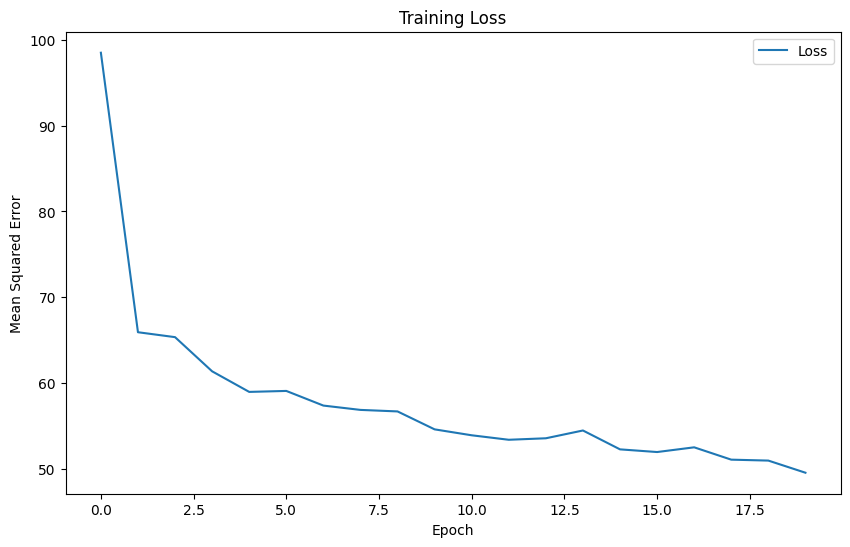

Mean Squared Error: 48.6965
Root Mean Squared Error: 6.9783
Mean Absolute Error: 5.8294
R-squared Score: 0.2650


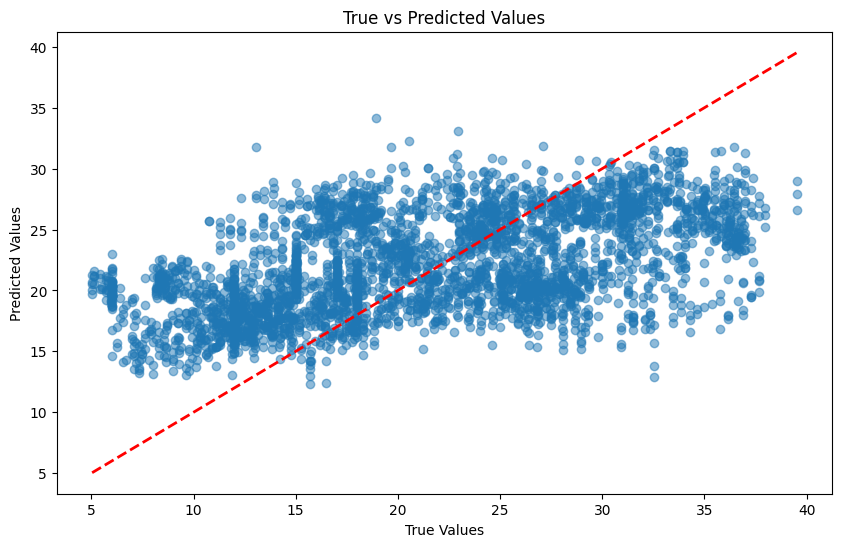

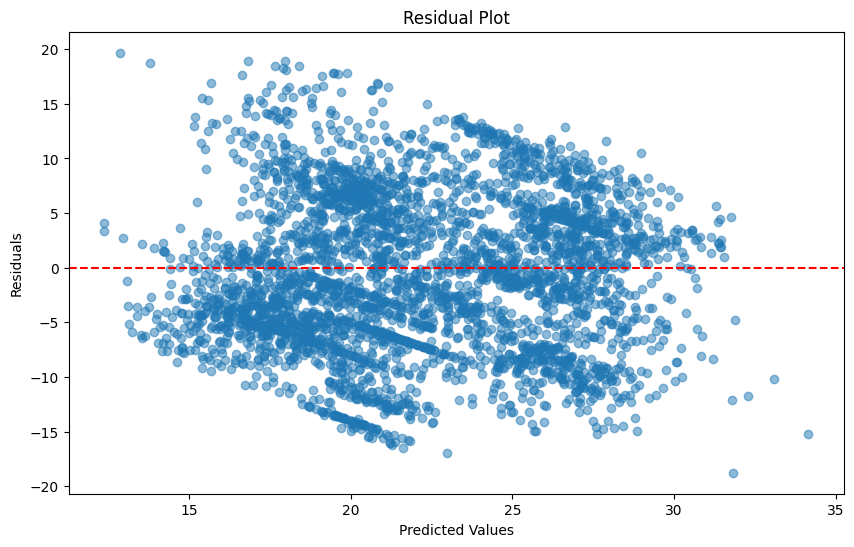

In [ ]:
#New version (part 3) using only the training set

import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Plot loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Loss')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.title('Training Loss')
plt.legend()
plt.show()

# Evaluation on test data
model.eval()
with torch.no_grad():
    y_true = []
    y_pred = []
    for inputs, labels in dataloader:
        outputs = model(inputs)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(outputs.cpu().numpy())

    # Convert lists to numpy arrays
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Calculate regression metrics
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"Mean Squared Error: {mse:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"Mean Absolute Error: {mae:.4f}")
    print(f"R-squared Score: {r2:.4f}")

# Scatter plot of true vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_true, y_pred, alpha=0.5)
plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Values')
plt.show()

# Residual plot
residuals = y_true - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()


Epoch 1/10
Train Loss: 65.1001, Val Loss: 67.0088
Train RMSE: 8.0685, Val RMSE: 8.1859
Train MSE: 65.1001, Val MSE: 67.0088
Train MAE: 6.9398, Val MAE: 7.0474

Epoch 2/10
Train Loss: 64.2774, Val Loss: 66.4132
Train RMSE: 8.0173, Val RMSE: 8.1494
Train MSE: 64.2774, Val MSE: 66.4132
Train MAE: 6.9074, Val MAE: 7.0273

Epoch 3/10
Train Loss: 62.9768, Val Loss: 65.6865
Train RMSE: 7.9358, Val RMSE: 8.1047
Train MSE: 62.9768, Val MSE: 65.6865
Train MAE: 6.8561, Val MAE: 7.0024

Epoch 4/10
Train Loss: 60.9001, Val Loss: 63.9339
Train RMSE: 7.8039, Val RMSE: 7.9959
Train MSE: 60.9001, Val MSE: 63.9339
Train MAE: 6.7189, Val MAE: 6.9001

Epoch 5/10
Train Loss: 58.9175, Val Loss: 63.1070
Train RMSE: 7.6758, Val RMSE: 7.9440
Train MSE: 58.9175, Val MSE: 63.1069
Train MAE: 6.6051, Val MAE: 6.8405

Epoch 6/10
Train Loss: 60.3029, Val Loss: 63.3516
Train RMSE: 7.7655, Val RMSE: 7.9594
Train MSE: 60.3029, Val MSE: 63.3516
Train MAE: 6.5271, Val MAE: 6.7437

Epoch 7/10
Train Loss: 57.0131, Val Loss

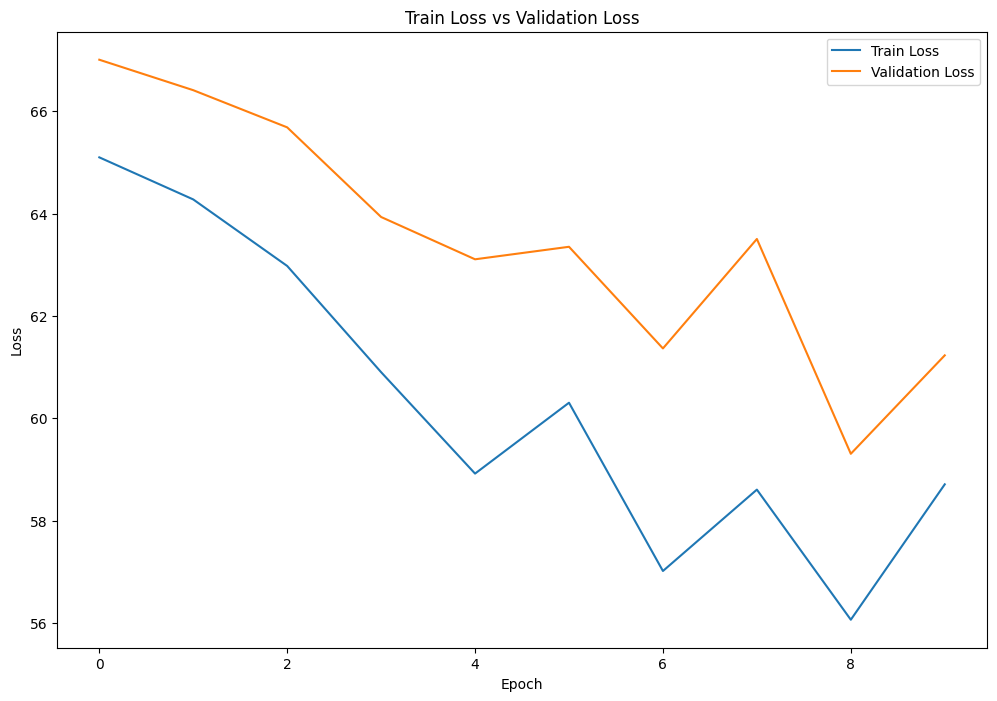

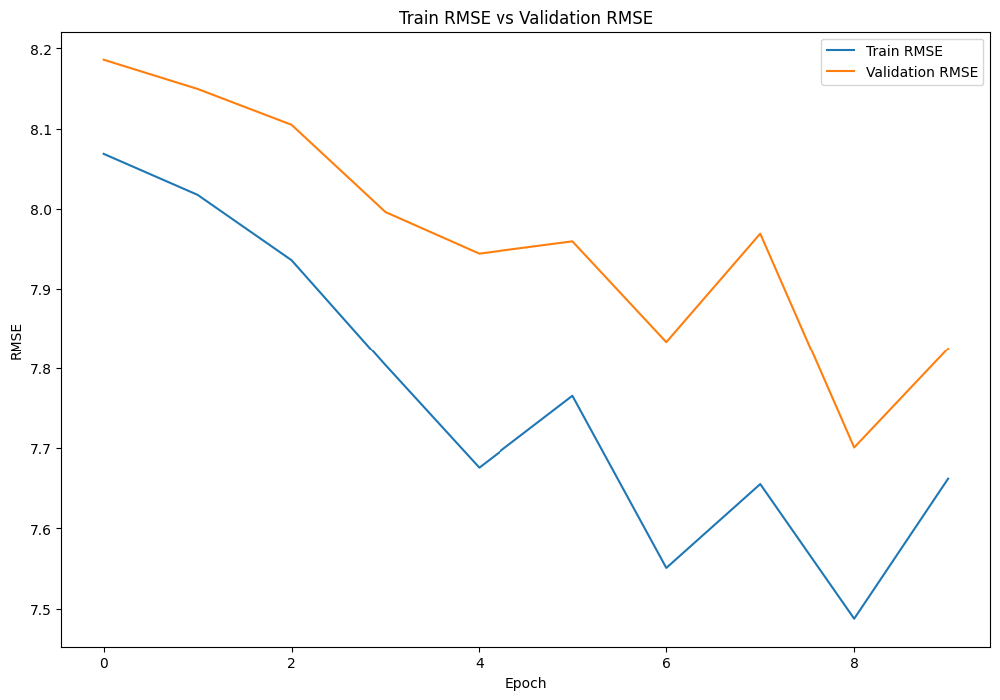

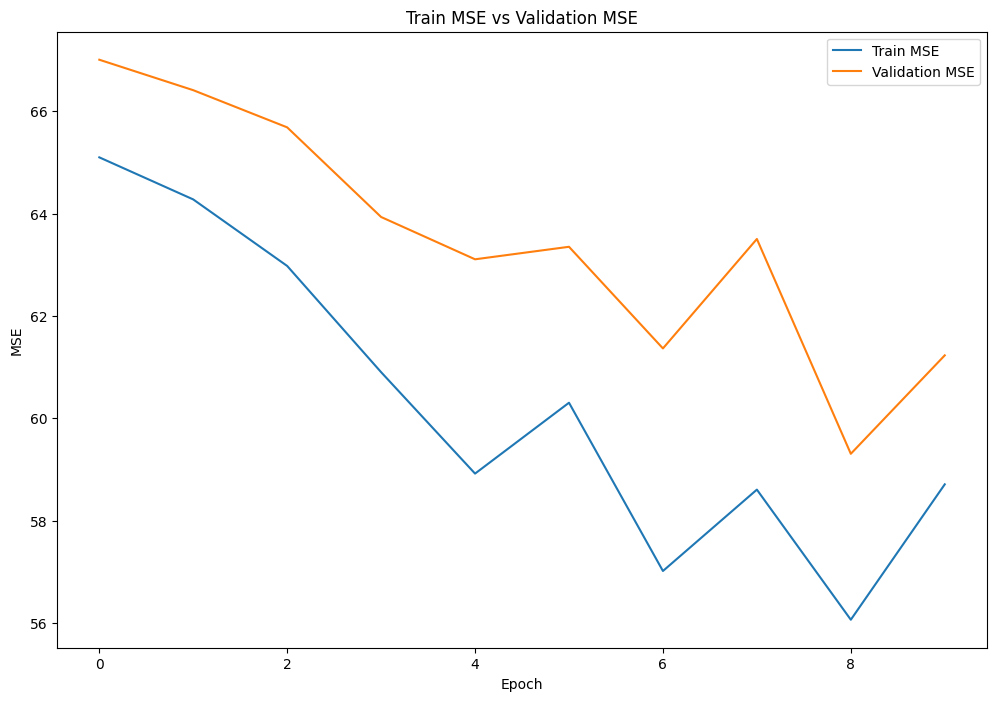

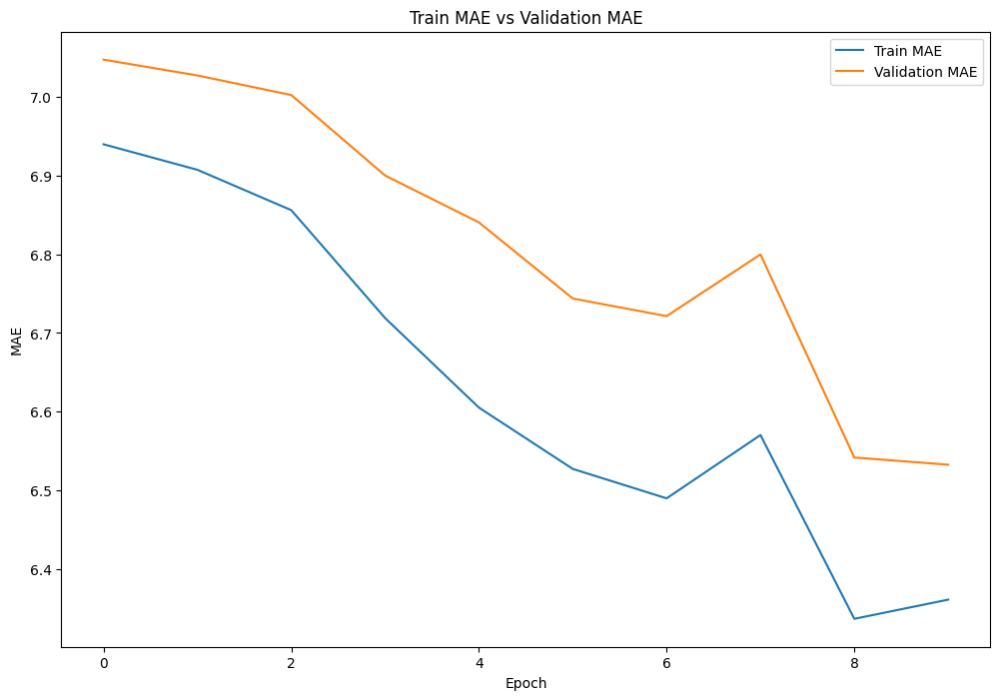

In [ ]:
#using only the training set, and from that training set I took sub "training set" and a "validation set".

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Convert data to PyTorch tensors
images = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)
targets = torch.tensor(Y1.values, dtype=torch.float32)

# Split the data into training and validation sets
dataset = TensorDataset(images, targets)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Create DataLoaders for training and validation sets
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10
train_losses = []
val_losses = []
train_rmse = []
val_rmse = []
train_mse = []
val_mse = []
train_mae = []
val_mae = []

def compute_metrics(loader):
    model.eval()
    total_loss = 0
    all_targets = []
    all_predictions = []

    with torch.no_grad():
        for inputs, targets in loader:
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * inputs.size(0)
            all_targets.extend(targets.numpy())
            all_predictions.extend(outputs.numpy())

    all_targets = np.array(all_targets)
    all_predictions = np.array(all_predictions)
    mse = mean_squared_error(all_targets, all_predictions)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(all_targets, all_predictions)

    return total_loss / len(loader.dataset), mse, rmse, mae

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

    # Compute metrics for training set
    train_loss, train_mse_val, train_rmse_val, train_mae_val = compute_metrics(train_loader)
    train_losses.append(train_loss)
    train_mse.append(train_mse_val)
    train_rmse.append(train_rmse_val)
    train_mae.append(train_mae_val)

    # Compute metrics for validation set
    val_loss, val_mse_val, val_rmse_val, val_mae_val = compute_metrics(val_loader)
    val_losses.append(val_loss)
    val_mse.append(val_mse_val)
    val_rmse.append(val_rmse_val)
    val_mae.append(val_mae_val)

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    print(f"Train RMSE: {train_rmse_val:.4f}, Val RMSE: {val_rmse_val:.4f}")
    print(f"Train MSE: {train_mse_val:.4f}, Val MSE: {val_mse_val:.4f}")
    print(f"Train MAE: {train_mae_val:.4f}, Val MAE: {val_mae_val:.4f}")
    print()

# Plot loss curves
plt.figure(figsize=(12, 8))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train Loss vs Validation Loss')
plt.legend()
plt.show()

# Plot RMSE curves
plt.figure(figsize=(12, 8))
plt.plot(train_rmse, label='Train RMSE')
plt.plot(val_rmse, label='Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.title('Train RMSE vs Validation RMSE')
plt.legend()
plt.show()

# Plot MSE curves
plt.figure(figsize=(12, 8))
plt.plot(train_mse, label='Train MSE')
plt.plot(val_mse, label='Validation MSE')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.title('Train MSE vs Validation MSE')
plt.legend()
plt.show()

# Plot MAE curves
plt.figure(figsize=(12, 8))
plt.plot(train_mae, label='Train MAE')
plt.plot(val_mae, label='Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.title('Train MAE vs Validation MAE')
plt.legend()
plt.show()


Epoch 1/10
Train Loss: 65.0500, Val Loss: 65.0261
Train RMSE: 8.0654, Val RMSE: 8.0639
Train MSE: 65.0500, Val MSE: 65.0261
Train MAE: 6.9563, Val MAE: 6.9563

Epoch 2/10
Train Loss: 64.4735, Val Loss: 64.4397
Train RMSE: 8.0295, Val RMSE: 8.0274
Train MSE: 64.4735, Val MSE: 64.4397
Train MAE: 6.9108, Val MAE: 6.9001

Epoch 3/10
Train Loss: 64.7285, Val Loss: 64.7102
Train RMSE: 8.0454, Val RMSE: 8.0443
Train MSE: 64.7285, Val MSE: 64.7101
Train MAE: 6.8504, Val MAE: 6.8095

Epoch 4/10
Train Loss: 60.8250, Val Loss: 60.4961
Train RMSE: 7.7990, Val RMSE: 7.7779
Train MSE: 60.8250, Val MSE: 60.4961
Train MAE: 6.6450, Val MAE: 6.5613

Epoch 5/10
Train Loss: 61.8726, Val Loss: 61.6467
Train RMSE: 7.8659, Val RMSE: 7.8515
Train MSE: 61.8726, Val MSE: 61.6467
Train MAE: 6.6152, Val MAE: 6.5280

Epoch 6/10
Train Loss: 57.8603, Val Loss: 57.1963
Train RMSE: 7.6066, Val RMSE: 7.5628
Train MSE: 57.8603, Val MSE: 57.1963
Train MAE: 6.4416, Val MAE: 6.3336

Epoch 7/10
Train Loss: 56.1223, Val Loss

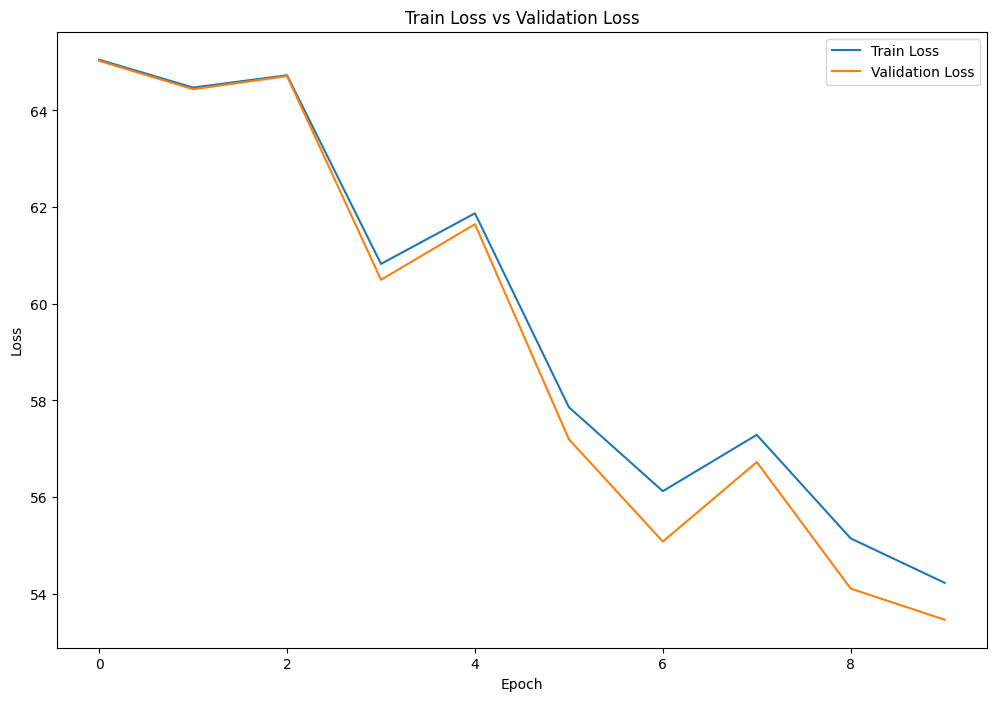

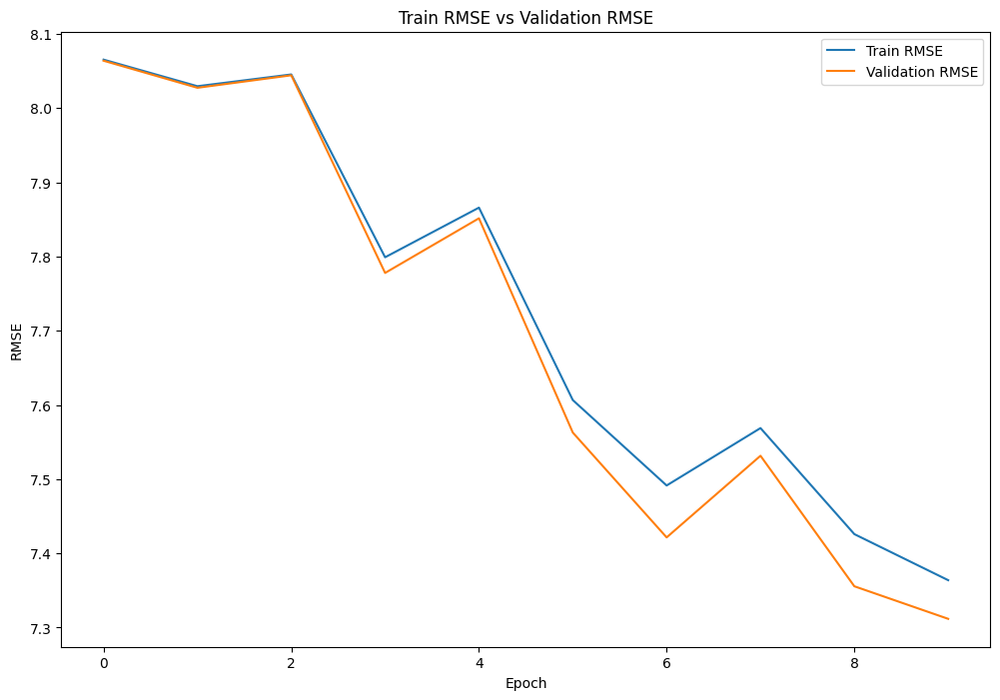

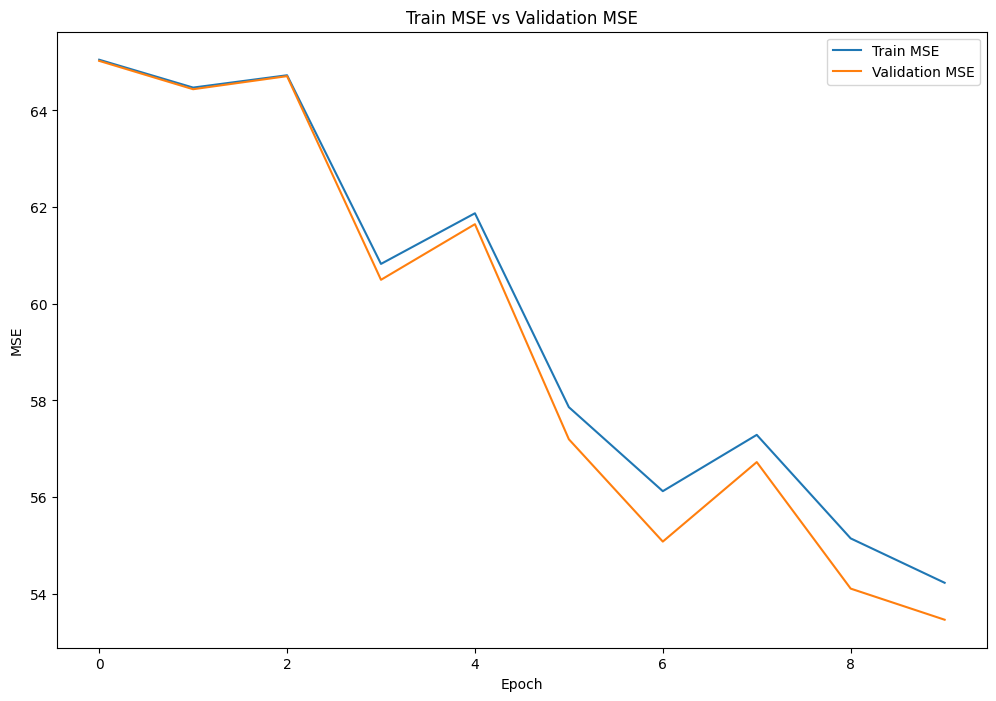

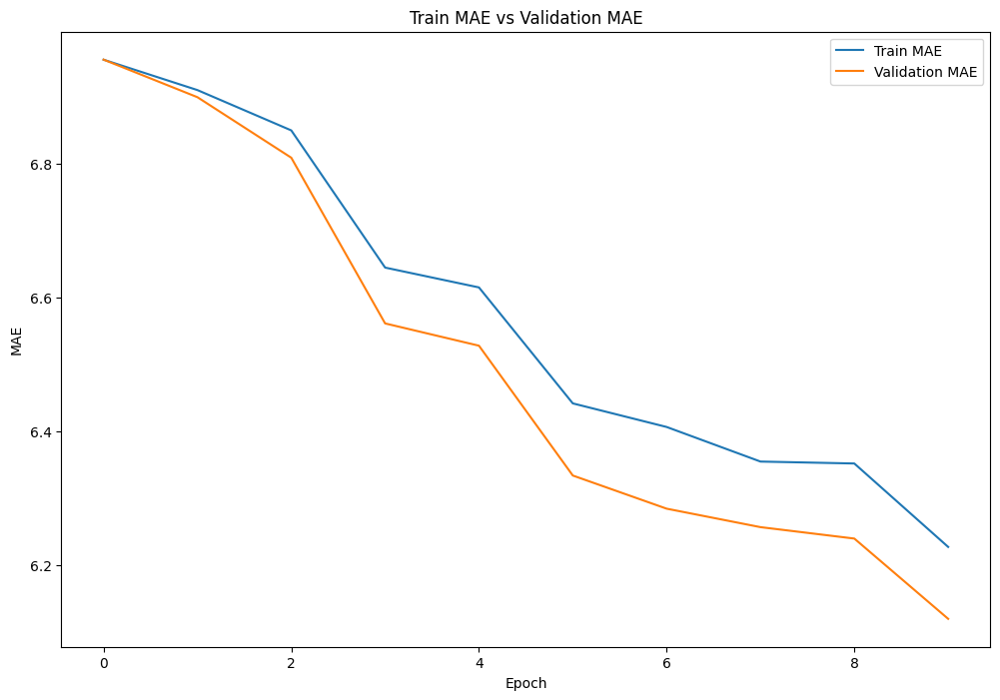

In [ ]:
#using only the training set, and from that training set I took sub "training set" and a "validation set".

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Convert data to PyTorch tensors
images = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)
targets = torch.tensor(Y1.values, dtype=torch.float32)

# Split the data into training and validation sets
dataset = TensorDataset(images, targets)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Create DataLoaders for training and validation sets
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Early stopping parameters
patience = 10
min_delta = 0.001

# Training loop
num_epochs = 10
train_losses = []
val_losses = []
train_rmse = []
val_rmse = []
train_mse = []
val_mse = []
train_mae = []
val_mae = []

def compute_metrics(loader):
    model.eval()
    total_loss = 0
    all_targets = []
    all_predictions = []

    with torch.no_grad():
        for inputs, targets in loader:
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * inputs.size(0)
            all_targets.extend(targets.numpy())
            all_predictions.extend(outputs.numpy())

    all_targets = np.array(all_targets)
    all_predictions = np.array(all_predictions)
    mse = mean_squared_error(all_targets, all_predictions)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(all_targets, all_predictions)

    return total_loss / len(loader.dataset), mse, rmse, mae

# Early stopping initialization
best_val_loss = float('inf')
best_model = None
counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

    # Compute metrics for training set
    train_loss, train_mse_val, train_rmse_val, train_mae_val = compute_metrics(train_loader)
    train_losses.append(train_loss)
    train_mse.append(train_mse_val)
    train_rmse.append(train_rmse_val)
    train_mae.append(train_mae_val)

    # Compute metrics for validation set
    val_loss, val_mse_val, val_rmse_val, val_mae_val = compute_metrics(val_loader)
    val_losses.append(val_loss)
    val_mse.append(val_mse_val)
    val_rmse.append(val_rmse_val)
    val_mae.append(val_mae_val)

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    print(f"Train RMSE: {train_rmse_val:.4f}, Val RMSE: {val_rmse_val:.4f}")
    print(f"Train MSE: {train_mse_val:.4f}, Val MSE: {val_mse_val:.4f}")
    print(f"Train MAE: {train_mae_val:.4f}, Val MAE: {val_mae_val:.4f}")
    print()

    # Early stopping check
    if val_loss < best_val_loss - min_delta:
        best_val_loss = val_loss
        best_model = model.state_dict()
        counter = 0
    else:
        counter += 1
        if counter >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

# Load the best model
if best_model is not None:
    model.load_state_dict(best_model)

# Plot loss curves
plt.figure(figsize=(12, 8))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train Loss vs Validation Loss')
plt.legend()
plt.show()

# Plot RMSE curves
plt.figure(figsize=(12, 8))
plt.plot(train_rmse, label='Train RMSE')
plt.plot(val_rmse, label='Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.title('Train RMSE vs Validation RMSE')
plt.legend()
plt.show()

# Plot MSE curves
plt.figure(figsize=(12, 8))
plt.plot(train_mse, label='Train MSE')
plt.plot(val_mse, label='Validation MSE')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.title('Train MSE vs Validation MSE')
plt.legend()
plt.show()

# Plot MAE curves
plt.figure(figsize=(12, 8))
plt.plot(train_mae, label='Train MAE')
plt.plot(val_mae, label='Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.title('Train MAE vs Validation MAE')
plt.legend()
plt.show()


## **10.00 (TRAINING AND VALIDATION SET, WITHOUST SAVING - PROBABLY DELETE)**

---



Epoch 1/20, Train Loss: 99.9365, Val Loss: 62.0467, Train MAE: 8.1237, Val MAE: 6.6959
Epoch 2/20, Train Loss: 66.1921, Val Loss: 63.0342, Train MAE: 6.9872, Val MAE: 6.7811
Epoch 3/20, Train Loss: 66.1165, Val Loss: 65.4944, Train MAE: 6.9640, Val MAE: 6.8516
Epoch 4/20, Train Loss: 63.1734, Val Loss: 66.4404, Train MAE: 6.8068, Val MAE: 6.8582
Epoch 5/20, Train Loss: 60.7153, Val Loss: 56.9991, Train MAE: 6.6584, Val MAE: 6.4860
Epoch 6/20, Train Loss: 58.8301, Val Loss: 66.1919, Train MAE: 6.5162, Val MAE: 6.8374
Epoch 7/20, Train Loss: 57.4563, Val Loss: 75.2142, Train MAE: 6.4296, Val MAE: 7.1157
Epoch 8/20, Train Loss: 57.1509, Val Loss: 76.7901, Train MAE: 6.3931, Val MAE: 7.1417
Epoch 9/20, Train Loss: 56.6020, Val Loss: 62.2825, Train MAE: 6.3477, Val MAE: 6.6304
Epoch 10/20, Train Loss: 55.3227, Val Loss: 74.7118, Train MAE: 6.2493, Val MAE: 7.0282
Epoch 11/20, Train Loss: 54.4159, Val Loss: 116.7087, Train MAE: 6.1801, Val MAE: 8.7812
Epoch 12/20, Train Loss: 55.0625, Val Lo

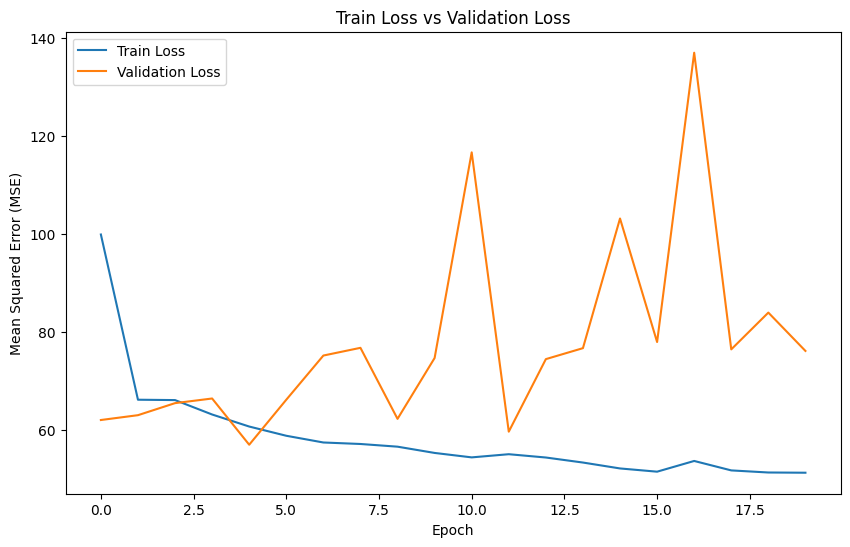

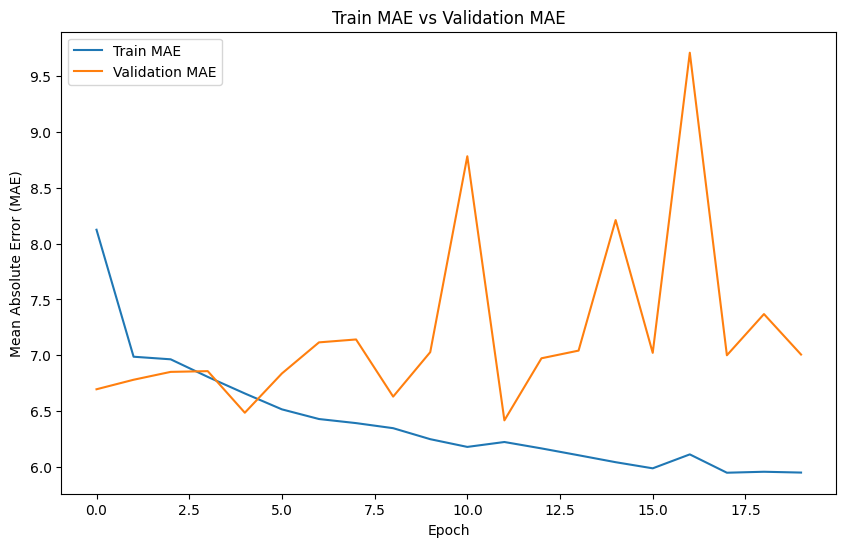

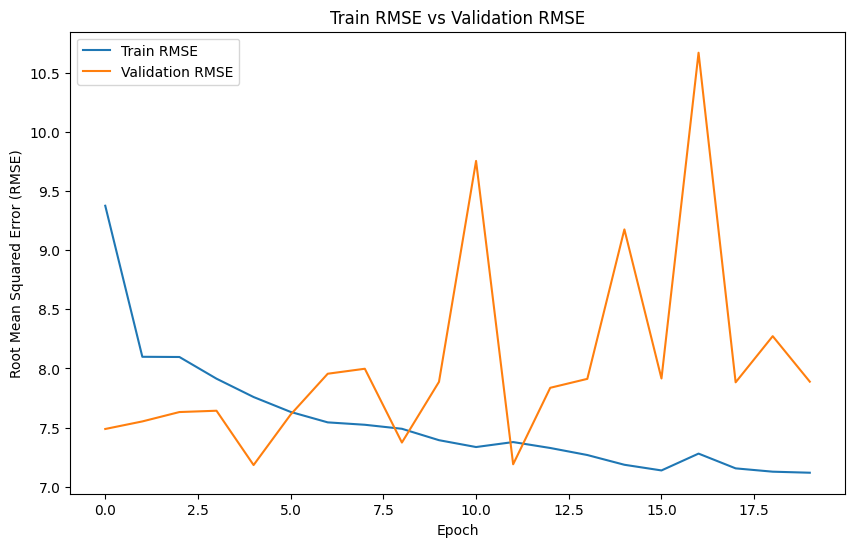

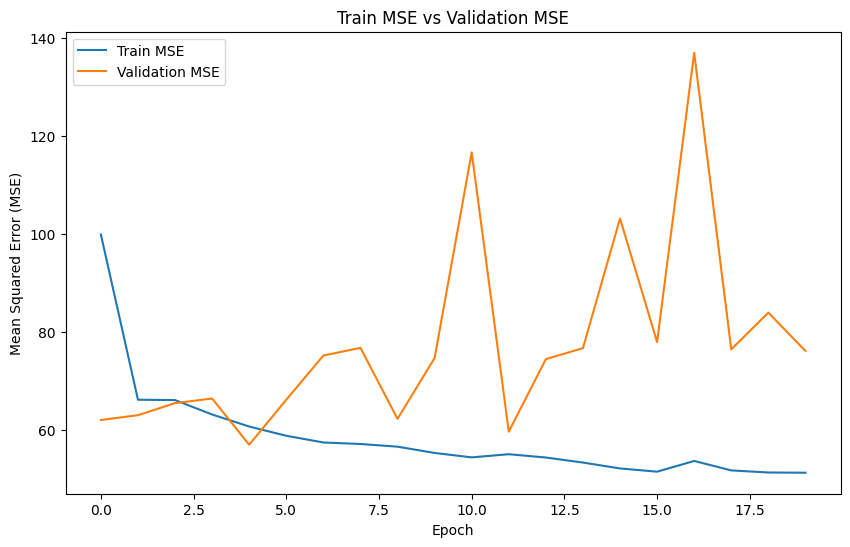

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the CNN model for regression
class CNNRegressor(nn.Module):
    def __init__(self):
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, 1)  # Output a single value for regression

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.maxpool1(out)

        out = self.conv2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)

        out = self.flatten(out)

        out = self.fc1(out)
        out = self.relu3(out)
        out = self.fc2(out)
        return out.squeeze()  # Remove the last dimension to get a 1D tensor


# Convert data to PyTorch tensors for both training and validation sets
images_train = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets_train = torch.tensor(Y1.values, dtype=torch.float32)  # Use float32 for regression

images_val = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)
targets_val = torch.tensor(Y_Val_1.values, dtype=torch.float32)

# Create TensorDatasets and DataLoaders
train_dataset = TensorDataset(images_train, targets_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(images_val, targets_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()  # Use Mean Squared Error for regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop with validation
best_valid_mae = 0
num_epochs = 20
train_losses = []
val_losses = []
train_mae = []
val_mae = []
train_rmse = []
val_rmse = []

for epoch in range(num_epochs):
    model.train()
    running_train_loss = 0.0
    running_train_mae = 0.0
    running_train_rmse = 0.0
    for inputs, labels in train_loader:
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update training loss and MAE
        running_train_loss += loss.item()
        running_train_mae += mean_absolute_error(labels.cpu().numpy(), outputs.detach().cpu().numpy())
        running_train_rmse += np.sqrt(mean_squared_error(labels.cpu().numpy(), outputs.detach().cpu().numpy()))

    epoch_train_loss = running_train_loss / len(train_loader)
    epoch_train_mae = running_train_mae / len(train_loader)
    epoch_train_rmse = running_train_rmse / len(train_loader)
    train_losses.append(epoch_train_loss)
    train_mae.append(epoch_train_mae)
    train_rmse.append(epoch_train_rmse)

    # Validation step
    model.eval()
    running_val_loss = 0.0
    running_val_mae = 0.0
    running_val_rmse = 0.0
    with torch.no_grad():
        for inputs, labels in val_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()
            running_val_mae += mean_absolute_error(labels.cpu().numpy(), outputs.cpu().numpy())
            running_val_rmse += np.sqrt(mean_squared_error(labels.cpu().numpy(), outputs.cpu().numpy()))

    epoch_val_loss = running_val_loss / len(val_loader)
    epoch_val_mae = running_val_mae / len(val_loader)
    epoch_val_rmse = running_val_rmse / len(val_loader)
    val_losses.append(epoch_val_loss)
    val_mae.append(epoch_val_mae)
    val_rmse.append(epoch_val_rmse)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, Train MAE: {epoch_train_mae:.4f}, Val MAE: {epoch_val_mae:.4f}")

# Plot Train Loss vs Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Train Loss vs Validation Loss')
plt.legend()
plt.show()

# Plot Train MAE vs Validation MAE
plt.figure(figsize=(10, 6))
plt.plot(train_mae, label='Train MAE')
plt.plot(val_mae, label='Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error (MAE)')
plt.title('Train MAE vs Validation MAE')
plt.legend()
plt.show()

# Plot Train RMSE vs Validation RMSE
plt.figure(figsize=(10, 6))
plt.plot(train_rmse, label='Train RMSE')
plt.plot(val_rmse, label='Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('Train RMSE vs Validation RMSE')
plt.legend()
plt.show()

# Plot Train MSE vs Validation MSE (already plotted as Loss vs Val Loss, but here explicitly for MSE)
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train MSE')
plt.plot(val_losses, label='Validation MSE')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Train MSE vs Validation MSE')
plt.legend()
plt.show()



## **10.00. TRAINING AND VALIDATION SET (PROBABLY DELETE)**


Epoch 1/20, Train Loss: 95.3364, Val Loss: 61.8244, Train MAE: 7.9837, Val MAE: 6.7244
Epoch 2/20, Train Loss: 66.1130, Val Loss: 65.1102, Train MAE: 6.9905, Val MAE: 6.8521
Epoch 3/20, Train Loss: 64.1788, Val Loss: 64.9023, Train MAE: 6.8924, Val MAE: 6.8243
Epoch 4/20, Train Loss: 60.4581, Val Loss: 56.9958, Train MAE: 6.6685, Val MAE: 6.4633
Epoch 5/20, Train Loss: 59.4327, Val Loss: 58.5956, Train MAE: 6.5908, Val MAE: 6.5921
Epoch 6/20, Train Loss: 58.5135, Val Loss: 58.5853, Train MAE: 6.4851, Val MAE: 6.6075
Epoch 7/20, Train Loss: 58.8524, Val Loss: 65.1629, Train MAE: 6.5219, Val MAE: 6.7969
Epoch 8/20, Train Loss: 56.8769, Val Loss: 88.7146, Train MAE: 6.3981, Val MAE: 7.6198
Epoch 9/20, Train Loss: 56.2259, Val Loss: 81.3902, Train MAE: 6.3860, Val MAE: 7.3206
Epoch 10/20, Train Loss: 57.1634, Val Loss: 66.7868, Train MAE: 6.3948, Val MAE: 6.8137
Epoch 11/20, Train Loss: 56.3358, Val Loss: 61.2642, Train MAE: 6.3498, Val MAE: 6.5993
Epoch 12/20, Train Loss: 54.8769, Val Los

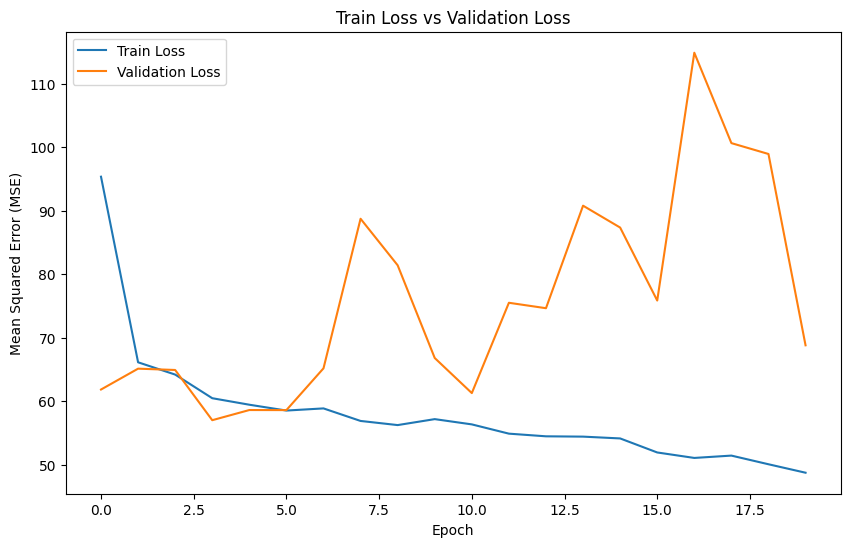

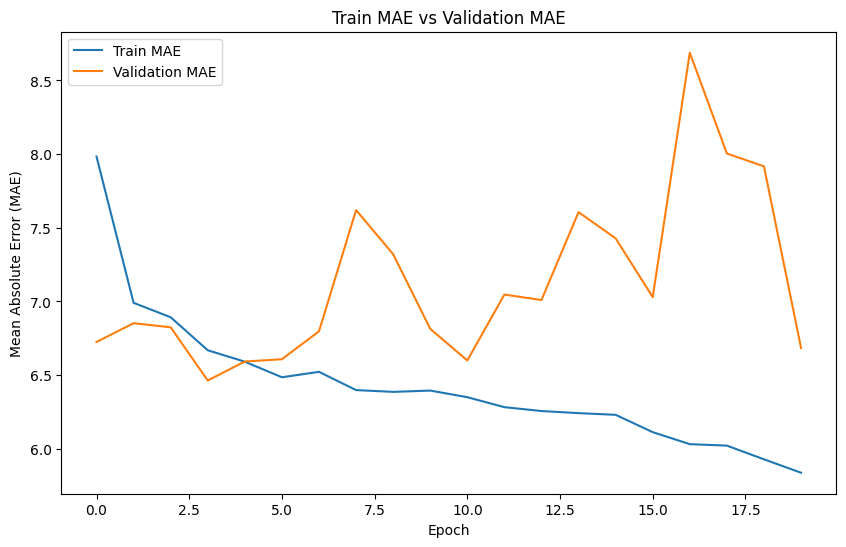

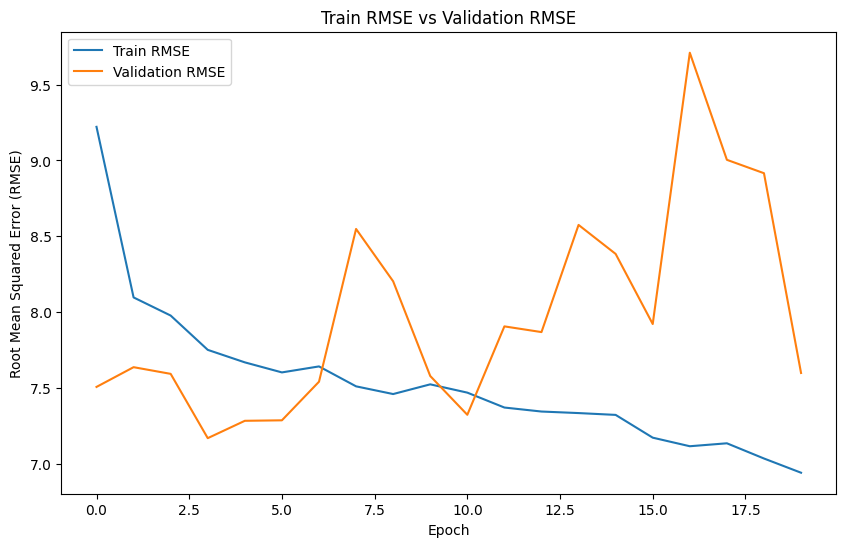

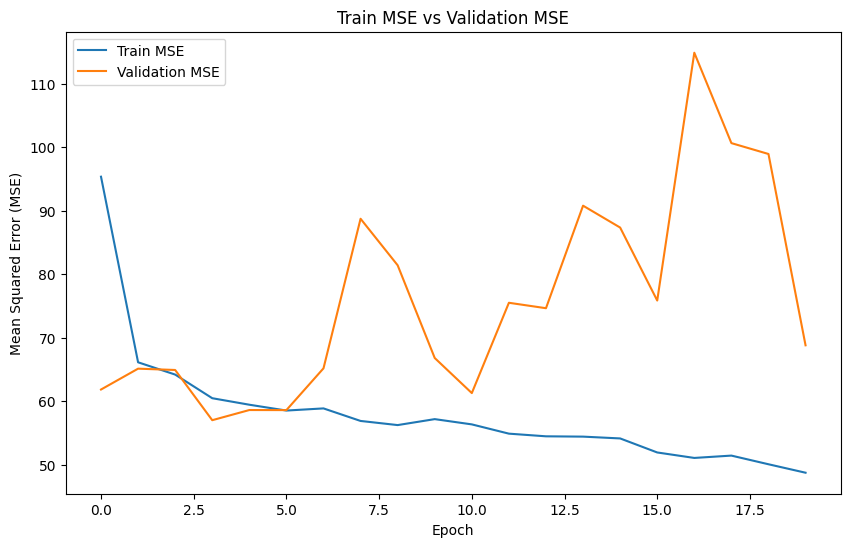

In [ ]:
#EXP 1 to FIX THE SAVINGS
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the CNN model for regression
class CNNRegressor(nn.Module):
    def __init__(self):
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, 1)  # Output a single value for regression

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.maxpool1(out)

        out = self.conv2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)

        out = self.flatten(out)

        out = self.fc1(out)
        out = self.relu3(out)
        out = self.fc2(out)
        return out.squeeze()  # Remove the last dimension to get a 1D tensor


# Convert data to PyTorch tensors for both training and validation sets
images_train = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets_train = torch.tensor(Y1.values, dtype=torch.float32)  # Use float32 for regression

images_val = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)
targets_val = torch.tensor(Y_Val_1.values, dtype=torch.float32)

# Create TensorDatasets and DataLoaders
train_dataset = TensorDataset(images_train, targets_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(images_val, targets_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()  # Use Mean Squared Error for regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Variables to track the best validation MAE
best_valid_mae = float('inf')  # Initialize as infinity to ensure the first model is saved

# Training loop with validation
num_epochs = 20
train_losses = []
val_losses = []
train_mae = []
val_mae = []
train_rmse = []
val_rmse = []

for epoch in range(num_epochs):
    model.train()
    running_train_loss = 0.0
    running_train_mae = 0.0
    running_train_rmse = 0.0
    for inputs, labels in train_loader:
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update training loss and MAE
        running_train_loss += loss.item()
        running_train_mae += mean_absolute_error(labels.cpu().numpy(), outputs.detach().cpu().numpy())
        running_train_rmse += np.sqrt(mean_squared_error(labels.cpu().numpy(), outputs.detach().cpu().numpy()))

    epoch_train_loss = running_train_loss / len(train_loader)
    epoch_train_mae = running_train_mae / len(train_loader)
    epoch_train_rmse = running_train_rmse / len(train_loader)
    train_losses.append(epoch_train_loss)
    train_mae.append(epoch_train_mae)
    train_rmse.append(epoch_train_rmse)

    # Validation step
    model.eval()
    running_val_loss = 0.0
    running_val_mae = 0.0
    running_val_rmse = 0.0
    with torch.no_grad():
        for inputs, labels in val_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()
            running_val_mae += mean_absolute_error(labels.cpu().numpy(), outputs.cpu().numpy())
            running_val_rmse += np.sqrt(mean_squared_error(labels.cpu().numpy(), outputs.cpu().numpy()))

    epoch_val_loss = running_val_loss / len(val_loader)
    epoch_val_mae = running_val_mae / len(val_loader)
    epoch_val_rmse = running_val_rmse / len(val_loader)
    val_losses.append(epoch_val_loss)
    val_mae.append(epoch_val_mae)
    val_rmse.append(epoch_val_rmse)

    # Save the model if validation MAE improves
    if epoch_val_mae < best_valid_mae:
        best_valid_mae = epoch_val_mae
        torch.save(model.state_dict(), 'best_model.pth')  # Save the best model

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Train MAE: {epoch_train_mae:.4f}, Val MAE: {epoch_val_mae:.4f}")

# Plot Train Loss vs Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Train Loss vs Validation Loss')
plt.legend()
plt.show()

# Plot Train MAE vs Validation MAE
plt.figure(figsize=(10, 6))
plt.plot(train_mae, label='Train MAE')
plt.plot(val_mae, label='Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error (MAE)')
plt.title('Train MAE vs Validation MAE')
plt.legend()
plt.show()

# Plot Train RMSE vs Validation RMSE
plt.figure(figsize=(10, 6))
plt.plot(train_rmse, label='Train RMSE')
plt.plot(val_rmse, label='Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('Train RMSE vs Validation RMSE')
plt.legend()
plt.show()

# Plot Train MSE vs Validation MSE (already plotted as Loss vs Val Loss, but here explicitly for MSE)
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train MSE')
plt.plot(val_losses, label='Validation MSE')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Train MSE vs Validation MSE')
plt.legend()
plt.show()



##**10.1 TRAINING AND VALIDATION SET**

Epoch 1/20, Train Loss: 103.1035, Val Loss: 61.1209, Train MAE: 8.2540, Val MAE: 6.6806
Epoch 2/20, Train Loss: 65.8464, Val Loss: 67.1237, Train MAE: 6.9555, Val MAE: 6.9317
Epoch 3/20, Train Loss: 64.2778, Val Loss: 58.5062, Train MAE: 6.8862, Val MAE: 6.5531
Epoch 4/20, Train Loss: 60.8062, Val Loss: 60.1030, Train MAE: 6.6848, Val MAE: 6.6487
Epoch 5/20, Train Loss: 59.3082, Val Loss: 58.0959, Train MAE: 6.5788, Val MAE: 6.5110
Epoch 6/20, Train Loss: 60.5671, Val Loss: 61.8633, Train MAE: 6.5955, Val MAE: 6.7187
Epoch 7/20, Train Loss: 58.3519, Val Loss: 58.8975, Train MAE: 6.4769, Val MAE: 6.6190
Epoch 8/20, Train Loss: 57.3005, Val Loss: 84.1200, Train MAE: 6.4206, Val MAE: 7.4742
Epoch 9/20, Train Loss: 56.5169, Val Loss: 93.3032, Train MAE: 6.3718, Val MAE: 7.8120
Epoch 10/20, Train Loss: 57.2878, Val Loss: 64.0723, Train MAE: 6.3693, Val MAE: 6.7797
Epoch 11/20, Train Loss: 55.3248, Val Loss: 61.0302, Train MAE: 6.2857, Val MAE: 6.6613
Epoch 12/20, Train Loss: 56.0329, Val Lo

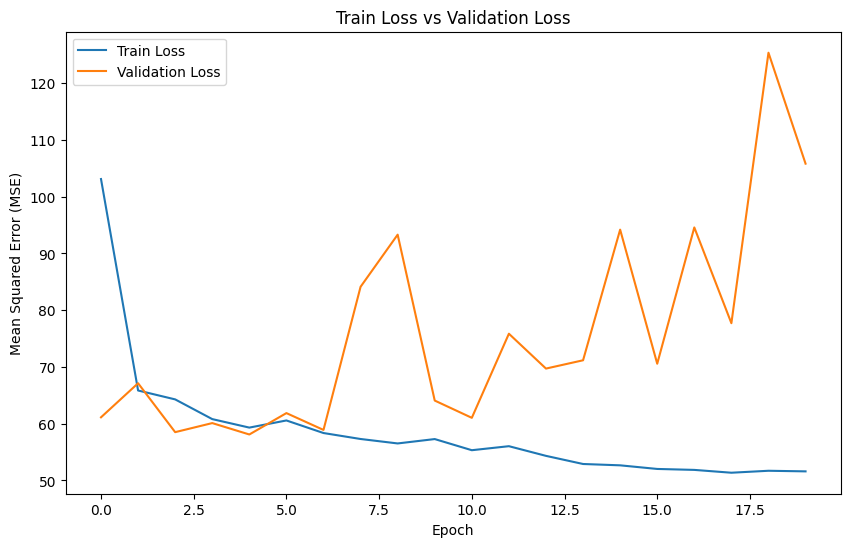

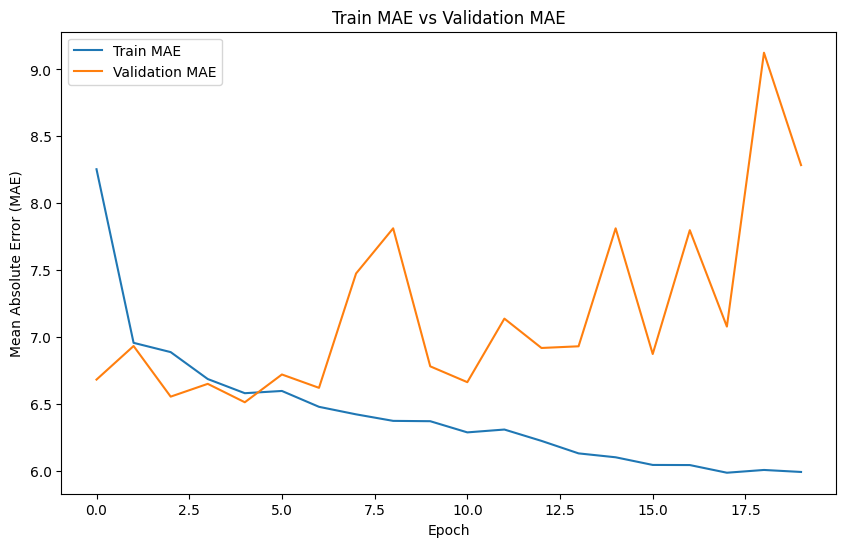

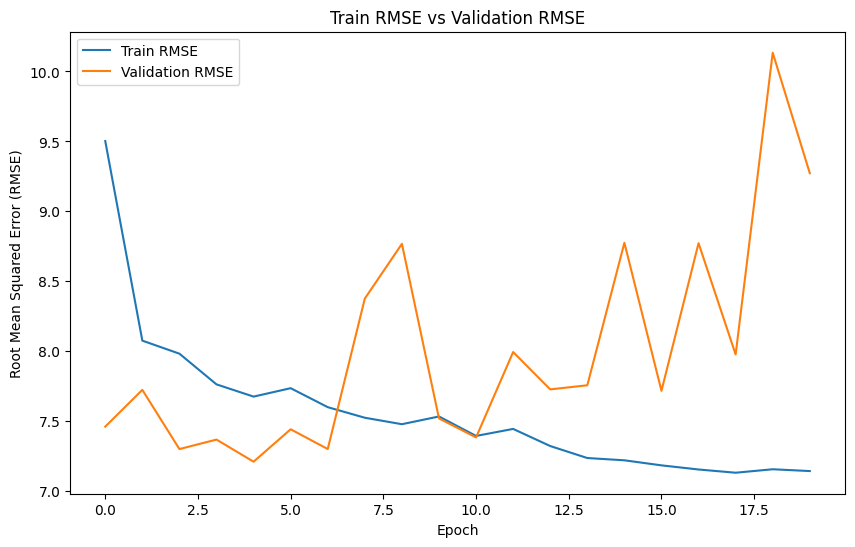

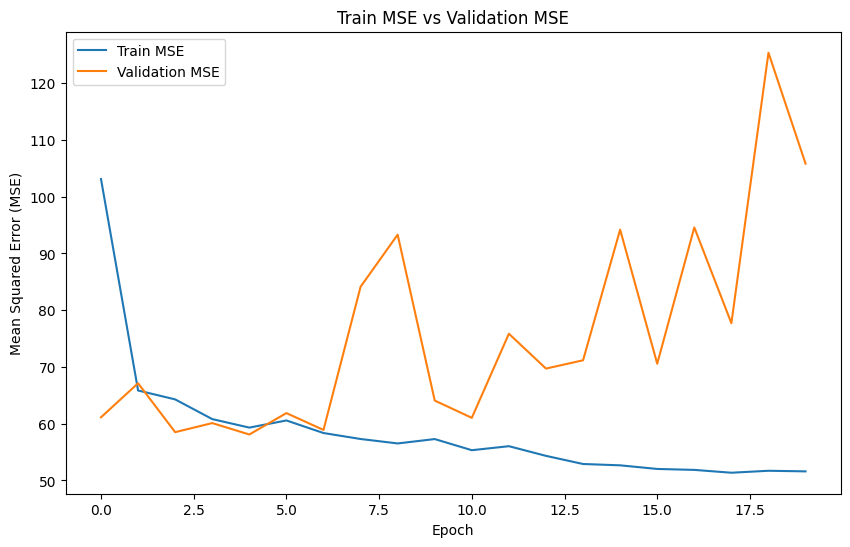

In [ ]:
#EXP 1 - SEPT 25
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the CNN model for regression
class CNNRegressor(nn.Module):
    def __init__(self):
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, 1)  # Output a single value for regression

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.maxpool1(out)

        out = self.conv2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)

        out = self.flatten(out)

        out = self.fc1(out)
        out = self.relu3(out)
        out = self.fc2(out)
        return out.squeeze()  # Remove the last dimension to get a 1D tensor


# Convert data to PyTorch tensors for both training and validation sets
images_train = torch.tensor(np.array(image_list_train), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets_train = torch.tensor(Y1.values, dtype=torch.float32)  # Use float32 for regression

images_val = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)
targets_val = torch.tensor(Y_Val_1.values, dtype=torch.float32)

# Create TensorDatasets and DataLoaders
train_dataset = TensorDataset(images_train, targets_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(images_val, targets_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()  # Use Mean Squared Error for regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Variables to track the best validation MAE
best_valid_mae = float('inf')  # Initialize as infinity to ensure the first model is saved

# Training loop with validation
num_epochs = 20
train_losses = []
val_losses = []
train_mae = []
val_mae = []
train_rmse = []
val_rmse = []

for epoch in range(num_epochs):
    model.train()
    running_train_loss = 0.0
    running_train_mae = 0.0
    running_train_rmse = 0.0
    for inputs, labels in train_loader:
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update training loss and MAE
        running_train_loss += loss.item()
        running_train_mae += mean_absolute_error(labels.cpu().numpy(), outputs.detach().cpu().numpy())
        running_train_rmse += np.sqrt(mean_squared_error(labels.cpu().numpy(), outputs.detach().cpu().numpy()))

    epoch_train_loss = running_train_loss / len(train_loader)
    epoch_train_mae = running_train_mae / len(train_loader)
    epoch_train_rmse = running_train_rmse / len(train_loader)
    train_losses.append(epoch_train_loss)
    train_mae.append(epoch_train_mae)
    train_rmse.append(epoch_train_rmse)

    # Validation step
    model.eval()
    running_val_loss = 0.0
    running_val_mae = 0.0
    running_val_rmse = 0.0
    with torch.no_grad():
        for inputs, labels in val_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()
            running_val_mae += mean_absolute_error(labels.cpu().numpy(), outputs.cpu().numpy())
            running_val_rmse += np.sqrt(mean_squared_error(labels.cpu().numpy(), outputs.cpu().numpy()))

    epoch_val_loss = running_val_loss / len(val_loader)
    epoch_val_mae = running_val_mae / len(val_loader)
    epoch_val_rmse = running_val_rmse / len(val_loader)
    val_losses.append(epoch_val_loss)
    val_mae.append(epoch_val_mae)
    val_rmse.append(epoch_val_rmse)

    # Save the model if validation MAE improves
    if epoch_val_mae < best_valid_mae:
        best_valid_mae = epoch_val_mae
        torch.save(model.state_dict(), 'best_model.pth')  # Save the best model

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Train MAE: {epoch_train_mae:.4f}, Val MAE: {epoch_val_mae:.4f}")

# Plot Train Loss vs Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Train Loss vs Validation Loss')
plt.legend()
plt.show()

# Plot Train MAE vs Validation MAE
plt.figure(figsize=(10, 6))
plt.plot(train_mae, label='Train MAE')
plt.plot(val_mae, label='Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error (MAE)')
plt.title('Train MAE vs Validation MAE')
plt.legend()
plt.show()

# Plot Train RMSE vs Validation RMSE
plt.figure(figsize=(10, 6))
plt.plot(train_rmse, label='Train RMSE')
plt.plot(val_rmse, label='Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('Train RMSE vs Validation RMSE')
plt.legend()
plt.show()

# Plot Train MSE vs Validation MSE (already plotted as Loss vs Val Loss, but here explicitly for MSE)
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train MSE')
plt.plot(val_losses, label='Validation MSE')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Train MSE vs Validation MSE')
plt.legend()
plt.show()


## **10.2. TEST SET**

<ipython-input-497-0805a8eb3f08>:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))



Test Results:
Mean Squared Error (MSE): 58.4352
Root Mean Squared Error (RMSE): 7.6443
Mean Absolute Error (MAE): 6.5241


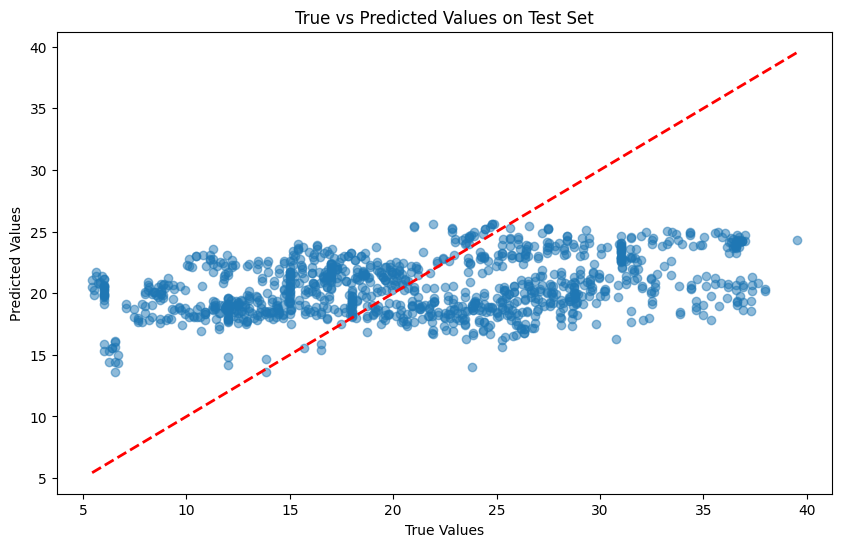

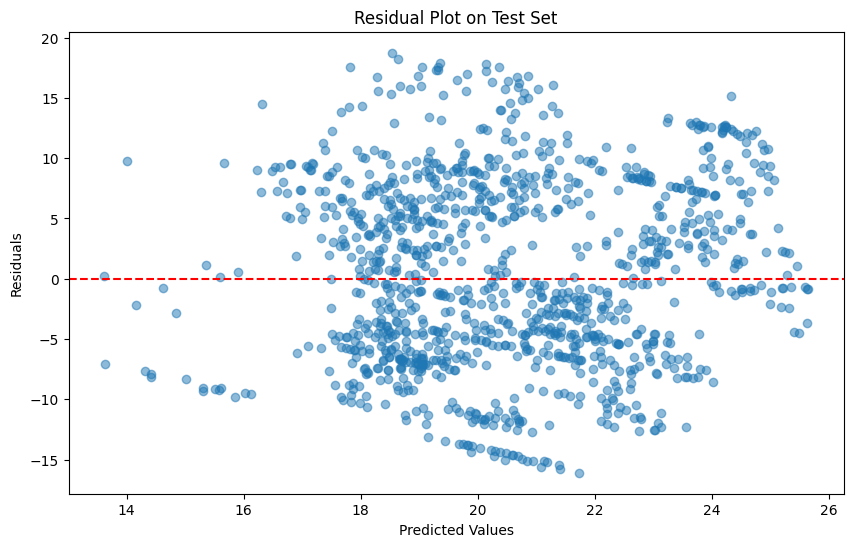

In [ ]:
import torch
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt

# Assume 'TestSet' in DataFrame
Y_Test_1 = TestSet['motor_UPDRS']
X_Test_1 = TestSet.drop(['motor_UPDRS', 'subject'], axis=1)

# Transform the test tabular data into images
image_list_test = igtd.fit_transform(X_Test_1, Y_Test_1)

# Convert test data into PyTorch tensors
images_test = torch.tensor(np.array(image_list_test), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets_test = torch.tensor(Y_Test_1.values, dtype=torch.float32)

# Create TensorDataset and DataLoader for the test set
test_dataset = TensorDataset(images_test, targets_test)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Load the best model weights
model = CNNRegressor()  # Ensure you create the model first
model.load_state_dict(torch.load('best_model.pth'))

# Ensure the model is in evaluation mode
model.eval()

# Check if GPU is available and move the model to GPU if applicable
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Initialize lists to store true and predicted values
y_true = []
y_pred = []

# Evaluate on the test set
with torch.no_grad():  # No need for gradients during testing
    for imgs, labels in test_loader:
        imgs = imgs.to(device)  # Transfer to GPU if applicable
        labels = labels.to(device)

        # Forward pass: Get model predictions
        outputs = model(imgs)

        # Store the true and predicted values
        y_true.extend(labels.cpu().numpy())  # Move data back to CPU from GPU
        y_pred.extend(outputs.cpu().numpy())  # Convert predictions to numpy

# Convert lists to numpy arrays for metric calculations
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculate performance metrics for regression
mse = mean_squared_error(y_true, y_pred)         # Mean Squared Error
rmse = np.sqrt(mse)                              # Root Mean Squared Error
mae = mean_absolute_error(y_true, y_pred)        # Mean Absolute Error

# Print the regression metrics
print("\nTest Results:")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")

# Optionally, you can plot the true vs predicted values for visualization
plt.figure(figsize=(10, 6))
plt.scatter(y_true, y_pred, alpha=0.5)
plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Values on Test Set')
plt.show()

# Residual plot for further analysis
residuals = y_true - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot on Test Set')
plt.show()


#**11. MODEL EVALUATION & ANALYSIS (INTERPRETABILITY / EXPLAINABILITY) - CNN**

## **11.1. PARTIAL DEPENDENCY PLOTS - (PROBABLY DELETE)**

NameError: name 'linear_model' is not defined

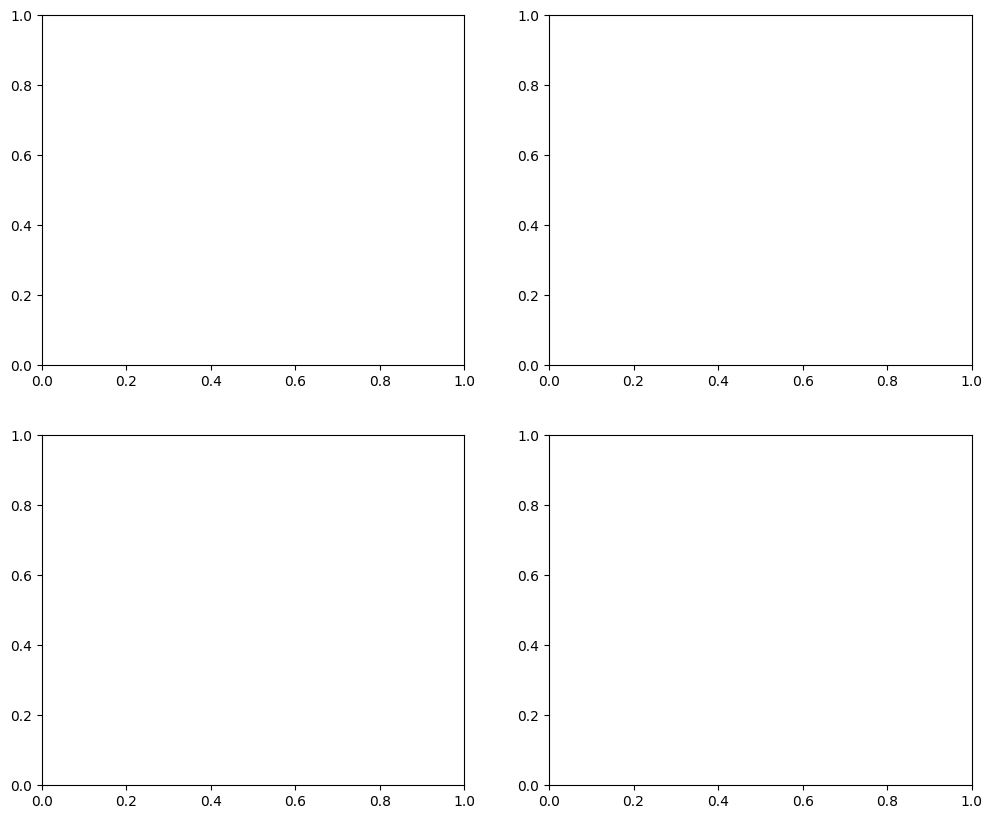

In [ ]:
# new version (part 7)
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# Assuming you have already trained your linear regression model
# and have your data in X and Y1

# Select features for partial dependence plots
features = [0, 1, 2, 3]  # Replace with the indices of the features you want to plot

# Create partial dependence plots
fig, ax = plt.subplots(2, 2, figsize=(12, 10))
display = PartialDependenceDisplay.from_estimator(
    linear_model,
    X,
    features,
    kind="average",
    subsample=1000,
    n_jobs=3,
    grid_resolution=20,
    random_state=42,
    ax=ax
)
fig.suptitle("Partial Dependence Plots")
plt.tight_layout()
plt.show()

# Create individual centered partial dependence plots
for feature in features:
    fig, ax = plt.subplots(figsize=(8, 6))
    display = PartialDependenceDisplay.from_estimator(
        linear_model,
        X,
        [feature],
        kind="average",
        centered=True,
        subsample=1000,
        n_jobs=3,
        grid_resolution=20,
        random_state=42,
        ax=ax
    )
    plt.title(f"Centered Partial Dependence Plot for {X.columns[feature]}")
    plt.tight_layout()
    plt.show()

# Create a 2D partial dependence plot
fig, ax = plt.subplots(figsize=(10, 8))
features_2d = [0, 1]  # Replace with the indices of two features you want to plot
display = PartialDependenceDisplay.from_estimator(
    linear_model,
    X,
    features_2d,
    kind="average",
    subsample=1000,
    n_jobs=3,
    grid_resolution=20,
    random_state=42,
    ax=ax
)
plt.title(f"2D Partial Dependence Plot for {X.columns[features_2d[0]]} and {X.columns[features_2d[1]]}")
plt.tight_layout()
plt.show()


##**11.2. SHAPLEY VALUES**

In [ ]:
!pip install shap
import shap

###**Feature Importance Bar Plot:**


In [ ]:
#TEST 03 - part 1 (ok)
import torch
import torch.nn as nn

# Define the CNN model for regression
class CNNRegressor(nn.Module):
    def __init__(self, image_size=(28, 28)): # Set the correct image size
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten = nn.Flatten()

        # Calculate the size after convolution and pooling dynamically
        dummy_input = torch.zeros(1, 1, *image_size) # Create a dummy input
        dummy_output = self.maxpool2(self.relu2(self.conv2(self.maxpool1(self.relu1(self.conv1(dummy_input))))))
        flattened_size = dummy_output.view(1, -1).size(1) # Calculate the flattened size

        self.fc1 = nn.Linear(flattened_size, 128) # Use the calculated flattened size
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, 1)  # Output a single value for regression

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.maxpool1(out)

        out = self.conv2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)

        out = self.flatten(out)

        out = self.fc1(out)
        out = self.relu3(out)
        out = self.fc2(out)
        return out  # Removed .squeeze() to maintain shape (batch_size, 1)


In [ ]:
#TEST 03 - part 2 (ok)
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader
import torch.optim as optim
import torch.nn as nn

# Assuming `image_list` and `Y1` are already defined as per your initial code

# Convert data to PyTorch tensors
images = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets = torch.tensor(Y1.values, dtype=torch.float32).unsqueeze(1)  # Ensure targets have shape (batch_size, 1)

# Create a TensorDataset and DataLoader
dataset = TensorDataset(images, targets)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()  # Use Mean Squared Error for regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10
train_losses = []

for epoch in range(num_epochs):
    running_loss = 0.0
    for inputs, labels in dataloader:
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(dataloader)
    train_losses.append(epoch_loss)

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

# After training, you can use the model to make predictions
model.eval()
with torch.no_grad():
    sample_input = images[0].unsqueeze(0)  # Add batch dimension
    prediction = model(sample_input)
    print(f"Sample prediction: {prediction.item():.2f}")


Epoch 1/10, Loss: 103.2662
Epoch 2/10, Loss: 66.3558
Epoch 3/10, Loss: 64.4852
Epoch 4/10, Loss: 63.2390
Epoch 5/10, Loss: 60.8807
Epoch 6/10, Loss: 60.1481
Epoch 7/10, Loss: 58.0107
Epoch 8/10, Loss: 58.9132
Epoch 9/10, Loss: 58.6924
Epoch 10/10, Loss: 56.9424
Sample prediction: 23.45


In [ ]:
#TEST 03 - part 3 (probably trash)
import shap

# Ensure the model is on the same device as SHAP expects (usually CPU)
model.eval()

# Prepare the background dataset (a subset of your training data)
background = images[:100]  # Using the first 100 samples as the background

# Initialize the SHAP DeepExplainer
explainer = shap.DeepExplainer(model, background)

# Select a set of images for which you want to calculate SHAP values
test_images = images[:10]  # For example, the first 10 samples

# Calculate SHAP values
shap_values = explainer.shap_values(test_images)

# Convert test_images to NumPy for plotting
#test_images_np = test_images.squeeze(1).numpy()  # Remove channel dimension

# Plot the SHAP values for the first image
#shap.image_plot(shap_values, test_images_np)


/usr/local/lib/python3.10/dist-packages/shap/explainers/_deep/deep_pytorch.py:243: UserWarning: unrecognized nn.Module: Flatten
  warnings.warn(f'unrecognized nn.Module: {module_type}')


In [ ]:
#TEST 03 - part 3.1 (probably trash)
import shap

# Ensure the model is on the same device as SHAP expects (usually CPU)
model.eval()

# Prepare the background dataset (a subset of your training data)
background = images[:100]  # Using the first 100 samples as the background

# Initialize the SHAP DeepExplainer
explainer = shap.DeepExplainer(model, background)

# Select a set of images for which you want to calculate SHAP values
test_images = images[:10]  # For example, the first 10 samples

# Calculate SHAP values
shap_values = explainer.shap_values(test_images)

# Convert test_images to NumPy for plotting
#test_images_np = test_images.squeeze(1).numpy()  # Remove channel dimension

# Plot the SHAP values for the first image
#shap.image_plot(shap_values, test_images_np)


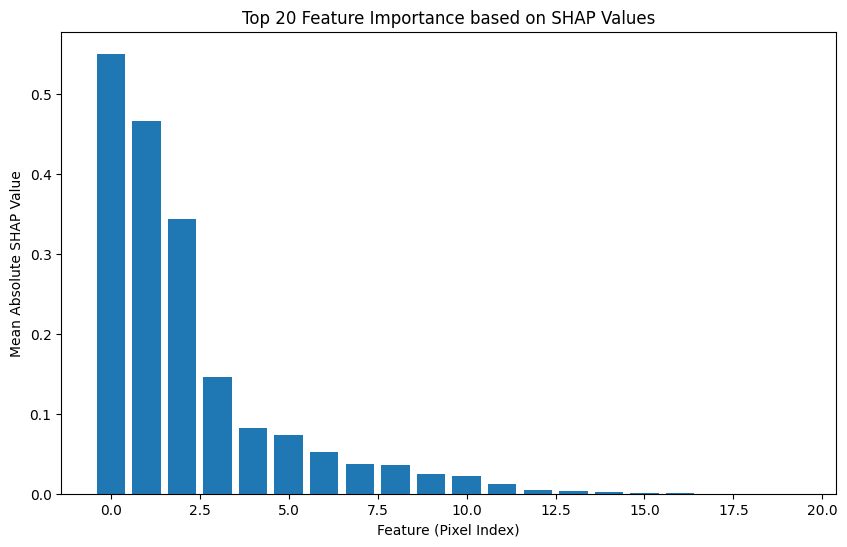

In [ ]:
#probably trash
import numpy as np
import matplotlib.pyplot as plt

# Convert SHAP values to numpy array if they are not already
shap_values_np = np.array(shap_values)

# Since shap_values are calculated for each pixel (i.e., each feature in the image),
# we need to reshape the SHAP values to match the original image dimensions.
# For this example, shap_values_np should have a shape of (number of images, 224, 224)

# Calculate the mean absolute SHAP value for each pixel across all images
mean_shap_values = np.mean(np.abs(shap_values_np), axis=0)

# Flatten the mean SHAP values to get a 1D array (since it's currently 2D for image data)
mean_shap_values_flat = mean_shap_values.flatten()

# Sort features (pixels) by importance
sorted_indices = np.argsort(mean_shap_values_flat)[::-1]
sorted_shap_values = mean_shap_values_flat[sorted_indices]

# Plot the top N important features
N = 20  # You can adjust this number based on how many top features you want to visualize
plt.figure(figsize=(10, 6))
plt.bar(range(N), sorted_shap_values[:N])
plt.xlabel("Feature (Pixel Index)")
plt.ylabel("Mean Absolute SHAP Value")
plt.title("Top 20 Feature Importance based on SHAP Values")
plt.show()


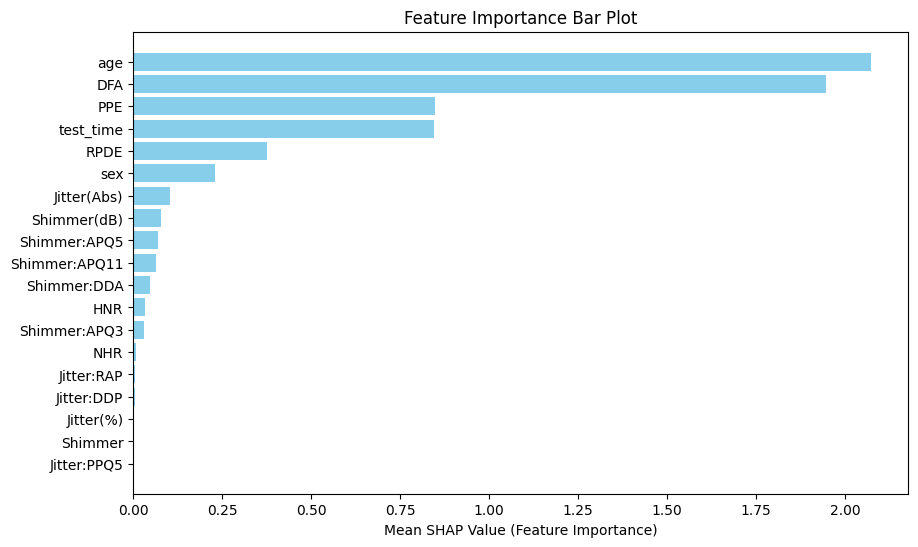

In [ ]:
#all- old training
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt

# Step 1: Calculate SHAP Values
# Assuming your model is named 'model' and you have a batch of images 'images'
# Using GradientExplainer since it can be more efficient for CNNs

# Convert the model to evaluation mode
model.eval()

# Convert images to numpy arrays for SHAP
images_numpy = images.numpy()

# Initialize SHAP explainer
explainer = shap.GradientExplainer(model, images)

# Calculate SHAP values
shap_values = explainer.shap_values(images)

# Step 2: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values[0][:, row, col]
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 3: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 4: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


In [ ]:
#EXP 5 - SETP 25

import shap
import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Set the model to evaluation mode
model.eval()

# Step 2: Select validation images and convert them to torch tensors
images_val_tensor = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)  # Add channel dimension

# Step 3: Initialize the SHAP GradientExplainer
explainer = shap.GradientExplainer(model, images_val_tensor)

# Step 4: Calculate SHAP values
# We calculate SHAP values for the entire validation set
shap_values = explainer.shap_values(images_val_tensor)

# Step 5: Map SHAP values back to original features
feature_importance = np.zeros(X_Val_1.shape[1])  # Initialize feature importance array

# Get the pixel positions for each feature
for i in range(X_Val_1.shape[1]):
    # Get pixel coordinates for the current feature index
    row, col = igtd.get_pixel_for_feature(i)

    # Extract the SHAP values corresponding to the pixel (row, col)
    pixel_shap_values = shap_values[0][:, row, col]

    # Compute the mean absolute SHAP value for that pixel and map it to the corresponding feature
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 6: Create a DataFrame for feature importance and sort by importance
feature_names = X_Val_1.columns  # Assuming feature names come from X_Val_1 DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 7: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot - Validation Set')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()






IndexError: too many indices for tensor of dimension 1

In [ ]:
#EXP 6 - SEPT 25

import shap
import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Set the model to evaluation mode
model.eval()

# Step 2: Select validation images and convert them to torch tensors
images_val_tensor = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)  # Add channel dimension

# Step 3: Initialize the SHAP GradientExplainer
# For single-output regression tasks, SHAP will compute the values directly.
explainer = shap.GradientExplainer(model, images_val_tensor)

# Step 4: Calculate SHAP values
# Since we have a regression task with a single output, SHAP values will be computed for that single output.
shap_values = explainer.shap_values(images_val_tensor)

# Step 5: Map SHAP values back to original features
feature_importance = np.zeros(X_Val_1.shape[1])  # Initialize feature importance array

# Get the pixel positions for each feature
for i in range(X_Val_1.shape[1]):
    # Get pixel coordinates for the current feature index
    row, col = igtd.get_pixel_for_feature(i)

    # Extract the SHAP values corresponding to the pixel (row, col)
    pixel_shap_values = shap_values[0][:, row, col]

    # Compute the mean absolute SHAP value for that pixel and map it to the corresponding feature
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 6: Create a DataFrame for feature importance and sort by importance
feature_names = X_Val_1.columns  # Assuming feature names come from X_Val_1 DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 7: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot - Validation Set')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


IndexError: too many indices for tensor of dimension 1

In [ ]:
#EXP 7
import shap
import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Set the model to evaluation mode
model.eval()

# Step 2: Select validation images and convert them to torch tensors
images_val_tensor = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)  # Add channel dimension

# Step 3: Initialize the SHAP GradientExplainer
# For single-output regression tasks, SHAP will compute the values directly.
explainer = shap.GradientExplainer(model, images_val_tensor)

# Step 4: Calculate SHAP values
# For regression, we don't need to index into the outputs; it's a scalar output.
shap_values = explainer.shap_values(images_val_tensor)

# Step 5: Map SHAP values back to original features
feature_importance = np.zeros(X_Val_1.shape[1])  # Initialize feature importance array

# Get the pixel positions for each feature
for i in range(X_Val_1.shape[1]):
    # Get pixel coordinates for the current feature index
    row, col = igtd.get_pixel_for_feature(i)

    # Extract the SHAP values corresponding to the pixel (row, col)
    pixel_shap_values = shap_values[0][:, row, col]

    # Compute the mean absolute SHAP value for that pixel and map it to the corresponding feature
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 6: Create a DataFrame for feature importance and sort by importance
feature_names = X_Val_1.columns  # Assuming feature names come from X_Val_1 DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 7: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot - Validation Set')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


IndexError: too many indices for tensor of dimension 1

In [ ]:
#EXP 8  sETP 5
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Convert the model to evaluation mode
model.eval()

# Step 2: Prepare validation images as tensors and convert to numpy for SHAP
images_val_numpy = images_val.numpy()  # Convert to numpy
images_val_tensor = torch.tensor(images_val_numpy, dtype=torch.float32).unsqueeze(1)  # Add channel dimension

# Step 3: Initialize SHAP's GradientExplainer
# No need to index into output since it's a scalar (regression task)
explainer = shap.GradientExplainer(model, images_val_tensor)

# Step 4: Calculate SHAP values for the entire validation set
# For regression, there's only one output, so we don’t need to specify an index.
shap_values = explainer.shap_values(images_val_tensor)

# Step 5: Map SHAP values back to the original tabular features
# Initialize an array for feature importance
feature_importance = np.zeros(X_Val_1.shape[1])  # Assuming X_Val_1 has validation features

# Get the pixel positions for each feature and map SHAP values back to features
for i in range(X_Val_1.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)

    # Get SHAP values corresponding to the pixel (row, col)
    pixel_shap_values = shap_values[0][:, row, col]

    # Calculate mean absolute SHAP values and map them back to the feature
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 6: Create a DataFrame to hold feature names and their importance
feature_names = X_Val_1.columns  # Assuming X_Val_1 is your validation DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 7: Sort by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 8: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot - Validation Set')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


RuntimeError: Expected 3D (unbatched) or 4D (batched) input to conv2d, but got input of size: [1145, 1, 1, 28, 28]

In [ ]:
#EXP 9 - SETP 25

import shap
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Convert the model to evaluation mode
model.eval()

# Step 2: Prepare validation images as tensors
images_val_tensor = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)  # Add channel dimension

# Check the shape of the tensor, it should be [batch_size, 1, 28, 28]
print(f"Shape of images_val_tensor: {images_val_tensor.shape}")

# Step 3: Initialize SHAP's GradientExplainer
# The input to the explainer should have the shape [batch_size, 1, 28, 28]
explainer = shap.GradientExplainer(model, images_val_tensor)

# Step 4: Calculate SHAP values for the entire validation set
# For regression, there's only one output, so we don’t need to specify an index.
shap_values = explainer.shap_values(images_val_tensor)

# Step 5: Map SHAP values back to the original tabular features
# Initialize an array for feature importance
feature_importance = np.zeros(X_Val_1.shape[1])  # Assuming X_Val_1 has validation features

# Get the pixel positions for each feature and map SHAP values back to features
for i in range(X_Val_1.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)

    # Get SHAP values corresponding to the pixel (row, col)
    pixel_shap_values = shap_values[0][:, row, col]

    # Calculate mean absolute SHAP values and map them back to the feature
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 6: Create a DataFrame to hold feature names and their importance
feature_names = X_Val_1.columns  # Assuming X_Val_1 is your validation DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 7: Sort by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 8: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot - Validation Set')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


Shape of images_val_tensor: torch.Size([1145, 1, 28, 28])


IndexError: too many indices for tensor of dimension 1

In [ ]:
#EXP 10 - SETP 25

import shap
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Convert the model to evaluation mode
model.eval()

# Step 2: Prepare validation images as tensors
images_val_tensor = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)  # Add channel dimension

# Check the shape of the tensor, it should be [batch_size, 1, 28, 28]
print(f"Shape of images_val_tensor: {images_val_tensor.shape}")

# Step 3: Initialize SHAP's GradientExplainer
explainer = shap.GradientExplainer(model, images_val_tensor)

# Step 4: Calculate SHAP values for the entire validation set
# Here we expect a single output per image since it's a regression task
shap_values = explainer.shap_values(images_val_tensor)

# Since shap_values will be a list of arrays (for each output), we take the first (and only) output
shap_values = shap_values[0]  # This is the array containing SHAP values for each input

# Step 5: Map SHAP values back to the original tabular features
# Initialize an array for feature importance
feature_importance = np.zeros(X_Val_1.shape[1])  # Assuming X_Val_1 has validation features

# Get the pixel positions for each feature and map SHAP values back to features
for i in range(X_Val_1.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)

    # Get SHAP values corresponding to the pixel (row, col)
    pixel_shap_values = shap_values[:, row, col]

    # Calculate mean absolute SHAP values and map them back to the feature
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 6: Create a DataFrame to hold feature names and their importance
feature_names = X_Val_1.columns  # Assuming X_Val_1 is your validation DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 7: Sort by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 8: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot - Validation Set')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


Shape of images_val_tensor: torch.Size([1145, 1, 28, 28])


IndexError: too many indices for tensor of dimension 1

In [ ]:
#EXP 11 - SEP 25

import torch
import numpy as np
import shap
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# Assuming you have already trained the model and saved it as 'best_model.pth'

# 1. Install necessary libraries (if not already installed)
# !pip install shap

# 2. Load the best model
model = CNNRegressor()
model.load_state_dict(torch.load('best_model.pth', weights_only=True))
model.eval()

# 3. Prepare the validation data
images_val = images_val.squeeze(1)  # Remove the extra dimension
val_dataset = TensorDataset(images_val, targets_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# 4. Create a wrapper class for the CNN model
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

wrapped_model = ModelWrapper(model)

# 5. Compute SHAP values
background = images_val[:100]
test_images = images_val[:100]

e = shap.DeepExplainer(wrapped_model, background)
shap_values = e.shap_values(test_images)


# 6. Create the Feature Importance Bar Plot
feature_importance = np.abs(shap_values).mean(0)
feature_importance = feature_importance.reshape(-1)  # Flatten the array

# Get the indices of the top 20 most important features
top_20_indices = np.argsort(feature_importance)[-20:]

# Create a bar plot of the top 20 feature importances
plt.figure(figsize=(12, 8))
plt.barh(range(20), feature_importance[top_20_indices][::-1])
plt.yticks(range(20), [f"Feature {i}" for i in top_20_indices[::-1]])
plt.xlabel("Mean |SHAP Value|")
plt.title("Top 20 Feature Importance - Mean |SHAP Value|")
plt.tight_layout()
plt.show()

# Print the top 20 feature importances
print("Top 20 Feature Importances:")
for i, idx in enumerate(top_20_indices[::-1]):
    print(f"Feature {idx}: {feature_importance[idx]:.4f}")

# Map feature indices to original feature names
feature_names = X.columns
for i, idx in enumerate(top_20_indices[::-1]):
    row, col = igtd.get_pixel_for_feature(idx)
    names = igtd.get_feature_names_for_pixel(row, col, feature_names)
    print(f"Feature {idx} (Pixel {row}, {col}): {', '.join(names)}")


RuntimeError: Given groups=1, weight of size [32, 1, 3, 3], expected input[1, 100, 28, 28] to have 1 channels, but got 100 channels instead

In [ ]:
#EXP 12

import shap
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd

# Load the best model weights
model = CNNRegressor()
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

# Convert the validation images to a tensor and ensure correct shape
images_val_tensor = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)  # Add channel dimension

# Initialize the SHAP explainer
explainer = shap.GradientExplainer(model, images_val_tensor)

# Calculate SHAP values for the validation set
shap_values = explainer.shap_values(images_val_tensor)

# Since we expect a single output (for regression), get the first (and only) output
shap_values = shap_values[0]

# Step 1: Initialize an array for feature importance
feature_importance = np.zeros(X_Val_1.shape[1])  # Assuming X_Val_1 has validation features

# Step 2: Calculate feature importance from SHAP values
for i in range(X_Val_1.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)  # Get pixel indices for each feature
    pixel_shap_values = shap_values[:, row, col]  # Extract SHAP values for the pixel
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))  # Calculate mean absolute SHAP value

# Step 3: Create a DataFrame to hold feature names and their importance
feature_names = X_Val_1.columns  # Assuming X_Val_1 is your validation DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 4: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot - Mean SHAP Value (Feature Importance)')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


<ipython-input-510-f2e5d5e3b185>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


IndexError: too many indices for tensor of dimension 1

In [ ]:
#EXP 13
import shap
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

# Step 1: Calculate SHAP Values
# Ensure the model is in evaluation mode
model.eval()

# Convert validation images to numpy arrays for SHAP
images_val_numpy = images_val.detach().numpy()

# Prepare a background dataset (a subset of your training data) for SHAP
background = images_train[:100].detach().numpy()  # Using the first 100 samples as background

# Initialize the SHAP DeepExplainer
explainer = shap.DeepExplainer(model, background)

# Calculate SHAP values for the validation set images
shap_values = explainer.shap_values(images_val_numpy)

# Step 2: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values[0][:, row, col]  # Using first output channel
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 3: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 4: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


TypeError: conv2d() received an invalid combination of arguments - got (numpy.ndarray, Parameter, Parameter, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias = None, tuple of ints stride = 1, tuple of ints padding = 0, tuple of ints dilation = 1, int groups = 1)
      didn't match because some of the arguments have invalid types: (!numpy.ndarray!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, !int!)
 * (Tensor input, Tensor weight, Tensor bias = None, tuple of ints stride = 1, str padding = "valid", tuple of ints dilation = 1, int groups = 1)
      didn't match because some of the arguments have invalid types: (!numpy.ndarray!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, !int!)


In [ ]:
#XEP 14

import shap
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

# Step 1: Calculate SHAP Values
# Ensure the model is in evaluation mode
model.eval()

# Convert validation images to PyTorch tensor if needed
images_val_tensor = images_val.detach()  # already a tensor
images_val_numpy = images_val_tensor.numpy()  # Convert to numpy for SHAP

# Prepare a background dataset (a subset of your training data) for SHAP
background = images_train[:100].detach()  # Use the first 100 training images
background_numpy = background.numpy()  # Convert to numpy for SHAP

# Initialize the SHAP DeepExplainer
explainer = shap.DeepExplainer(model, background_numpy)  # Use numpy background

# Calculate SHAP values for the validation set images
shap_values = explainer.shap_values(images_val_numpy)  # SHAP expects numpy

# Step 2: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values[0][:, row, col]  # Using first output channel
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 3: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 4: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


TypeError: conv2d() received an invalid combination of arguments - got (numpy.ndarray, Parameter, Parameter, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias = None, tuple of ints stride = 1, tuple of ints padding = 0, tuple of ints dilation = 1, int groups = 1)
      didn't match because some of the arguments have invalid types: (!numpy.ndarray!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, !int!)
 * (Tensor input, Tensor weight, Tensor bias = None, tuple of ints stride = 1, str padding = "valid", tuple of ints dilation = 1, int groups = 1)
      didn't match because some of the arguments have invalid types: (!numpy.ndarray!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, !int!)


In [ ]:
#EXP 15

import shap
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Ensure your model is in evaluation mode
model.eval()

# Step 1: Prepare Background Data
# Take a subset of training images for background
background = images_train[:100].detach()  # Use the first 100 training images as a PyTorch tensor

# Step 2: Initialize the SHAP DeepExplainer
# You can pass the model directly and the background should also be a tensor
explainer = shap.DeepExplainer(model, background)  # Pass tensors directly

# Step 3: Calculate SHAP values for the validation set images
# Ensure validation images are also PyTorch tensors
images_val_tensor = images_val.detach()  # Detach validation images if they're not already

# Calculate SHAP values for the validation set
shap_values = explainer.shap_values(images_val_tensor)  # No need to convert to numpy

# Step 4: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values[0][:, row, col]  # Using first output channel
    feature_importance[i] = np.mean(np.abs(pixel_shap_values.cpu().numpy()))  # Convert to numpy for analysis

# Step 5: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 6: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 7: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


IndexError: tuple index out of range

In [ ]:
#16

import shap
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Ensure your model is in evaluation mode
model.eval()

# Step 1: Prepare Background Data
# Use the first 100 training images as a PyTorch tensor
background = images_train[:100].detach()  # Make sure this is shaped correctly

# Check the shape of the model output for a single sample
test_input = images_train[0:1]  # Take a single input for testing
output = model(test_input)
print("Model output shape:", output.shape)  # Print the shape of the output

# Step 2: Initialize the SHAP DeepExplainer
# Check the shape of background data
print("Background shape:", background.shape)  # Check the shape of background data

# Make sure the model output has two dimensions (for binary/multi-class classification)
if output.dim() == 2:
    explainer = shap.DeepExplainer(model, background)  # Pass tensors directly
else:
    raise ValueError("Model output must have two dimensions (batch_size, num_classes) for SHAP.")

# Step 3: Calculate SHAP values for the validation set images
# Ensure validation images are also PyTorch tensors
images_val_tensor = images_val.detach()  # Detach validation images if they're not already

# Calculate SHAP values for the validation set
shap_values = explainer.shap_values(images_val_tensor)  # No need to convert to numpy

# Step 4: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values[0][:, row, col]  # Using first output channel
    feature_importance[i] = np.mean(np.abs(pixel_shap_values.cpu().numpy()))  # Convert to numpy for analysis

# Step 5: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 6: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 7: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title('Feature Importance Bar Plot')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


Model output shape: torch.Size([])
Background shape: torch.Size([100, 1, 28, 28])


ValueError: Model output must have two dimensions (batch_size, num_classes) for SHAP.

In [ ]:
#17
import shap
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define a modified model for binary classification
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(32 * 14 * 14, 64)
        self.fc2 = nn.Linear(64, 2)  # Output layer with 2 classes

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = x.view(-1, 32 * 14 * 14)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)  # Output logits for two classes
        return x

# Initialize model
model = MyModel()
model.eval()  # Set model to evaluation mode

# Prepare Background Data
background = images_train[:100].detach()  # Ensure this is shaped correctly

# Check the shape of the model output for a single sample
test_input = images_train[0:1]  # Take a single input for testing
output = model(test_input)
print("Model output shape:", output.shape)  # Print the shape of the output

# Initialize the SHAP DeepExplainer
if output.dim() == 2:
    explainer = shap.DeepExplainer(model, background)  # Pass tensors directly
else:
    raise ValueError("Model output must have two dimensions (batch_size, num_classes) for SHAP.")

# Calculate SHAP values for the validation set images
images_val_tensor = images_val.detach()  # Detach validation images if they're not already
shap_values = explainer.shap_values(images_val_tensor)  # No need to convert to numpy

# Feature importance mapping and visualization remains the same...


Model output shape: torch.Size([1, 2])


RuntimeError: Tensors must have same number of dimensions: got 3 and 4

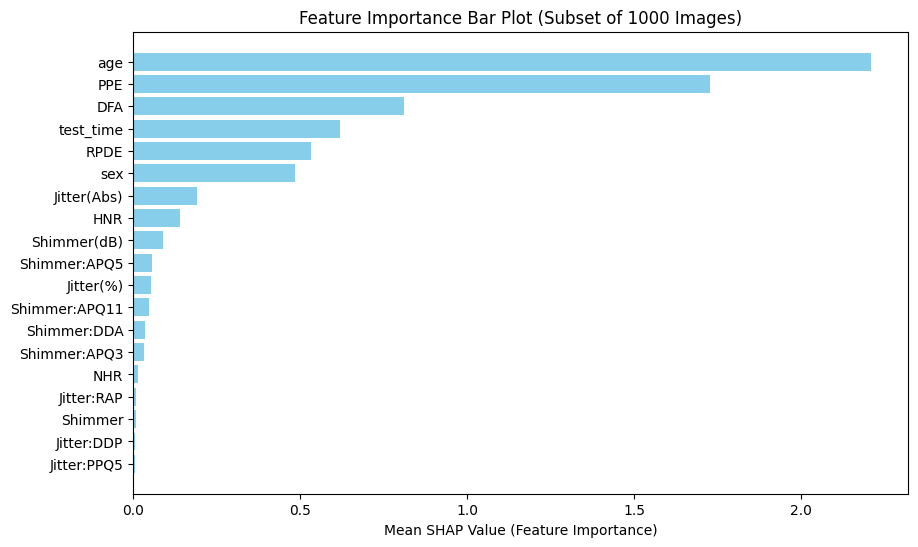

In [ ]:
#test 3 (subset 1000) Probably trash
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt

# Parameters
subset_size = 1000  # Number of images to use in the subset

# Step 0: Randomly select a subset of images
# Ensure the model is in evaluation mode
model.eval()

# Select a random subset of images
subset_indices = np.random.choice(images.shape[0], subset_size, replace=False)
images_subset = images[subset_indices]

# Step 1: Calculate SHAP Values using the subset
# Convert images to numpy arrays for SHAP
images_numpy_subset = images_subset.numpy()

# Initialize SHAP explainer (using GradientExplainer for CNNs)
explainer = shap.GradientExplainer(model, images_subset)

# Calculate SHAP values for the subset
shap_values_subset = explainer.shap_values(images_subset)

# Step 2: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values_subset[0][:, row, col]
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 3: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 4: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title(f'Feature Importance Bar Plot (Subset of {subset_size} Images)')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


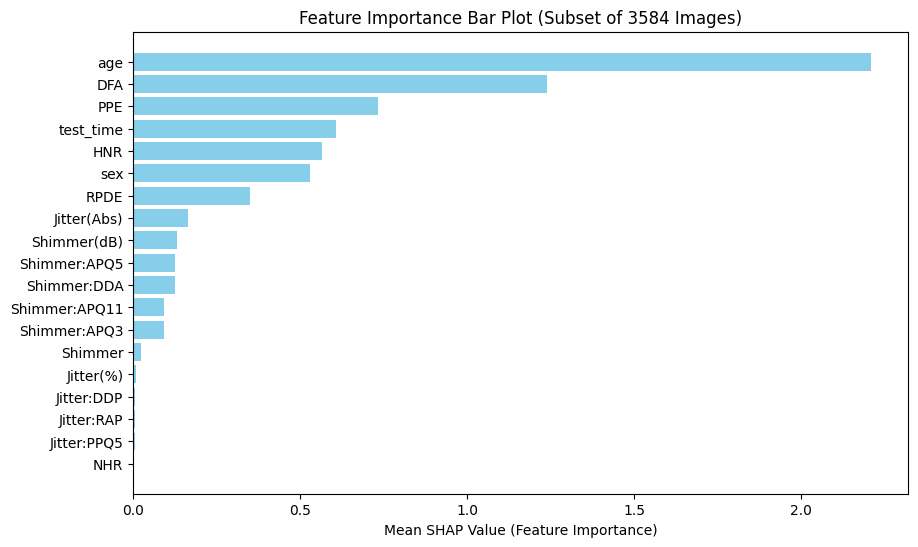

In [ ]:
#test 3 (subset 3584) Probably trash
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt

# Parameters
subset_size = 3584  # Number of images to use in the subset

# Step 0: Randomly select a subset of images
# Ensure the model is in evaluation mode
model.eval()

# Select a random subset of images
subset_indices = np.random.choice(images.shape[0], subset_size, replace=False)
images_subset = images[subset_indices]

# Step 1: Calculate SHAP Values using the subset
# Convert images to numpy arrays for SHAP
images_numpy_subset = images_subset.numpy()

# Initialize SHAP explainer (using GradientExplainer for CNNs)
explainer = shap.GradientExplainer(model, images_subset)

# Calculate SHAP values for the subset
shap_values_subset = explainer.shap_values(images_subset)

# Step 2: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values_subset[0][:, row, col]
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 3: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 4: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title(f'Feature Importance Bar Plot (Subset of {subset_size} Images)')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


In [ ]:
#test 3 (subset 5874) Probably trash
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt

# Parameters
subset_size = 5000  # Number of images to use in the subset

# Step 0: Randomly select a subset of images
# Ensure the model is in evaluation mode
model.eval()

# Select a random subset of images
subset_indices = np.random.choice(images.shape[0], subset_size, replace=False)
images_subset = images[subset_indices]

# Step 1: Calculate SHAP Values using the subset
# Convert images to numpy arrays for SHAP
images_numpy_subset = images_subset.numpy()

# Initialize SHAP explainer (using GradientExplainer for CNNs)
explainer = shap.GradientExplainer(model, images_subset)

# Calculate SHAP values for the subset
shap_values_subset = explainer.shap_values(images_subset)

# Step 2: Map SHAP Values Back to Features
# Initialize an array to store the feature importance
feature_importance = np.zeros(X.shape[1])

# Map pixel SHAP values back to the original features
for i in range(X.shape[1]):
    row, col = igtd.get_pixel_for_feature(i)
    pixel_shap_values = shap_values_subset[0][:, row, col]
    feature_importance[i] = np.mean(np.abs(pixel_shap_values))

# Step 3: Create a DataFrame to hold feature names and their corresponding importance
feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Step 4: Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the Feature Importance Bar Plot
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Mean SHAP Value (Feature Importance)')
plt.title(f'Feature Importance Bar Plot (Subset of {subset_size} Images)')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


ValueError: Cannot take a larger sample than population when 'replace=False'

In [ ]:
#EXP 1
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd

# Ensure model is in evaluation mode
model.eval()

# Function to compute SHAP values and plot feature importance
def compute_shap_and_plot(images, dataset_name="Dataset"):
    # Convert the images to numpy (if not already)
    images_numpy = images.cpu().numpy()

    # Initialize SHAP Gradient Explainer
    explainer = shap.GradientExplainer(model, images)

    # Compute SHAP values for the dataset
    shap_values = explainer.shap_values(images)

    # Initialize an array to store feature importance (for tabular data, corresponding to original features)
    feature_importance = np.zeros(X_Test_1.shape[1])  # X_Test_1 must be the shape of original feature data

    # Map pixel SHAP values back to the original features
    for i in range(X_Test_1.shape[1]):  # Assuming `igtd` can map features to image coordinates
        row, col = igtd.get_pixel_for_feature(i)
        pixel_shap_values = shap_values[0][:, row, col]
        feature_importance[i] = np.mean(np.abs(pixel_shap_values))  # Mean of absolute SHAP values per feature

    # Create a DataFrame to hold feature names and their corresponding importance
    feature_names = X_Test_1.columns  # Feature names from original tabular data
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importance
    })

    # Sort the DataFrame by importance
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Step 5: Plot the Feature Importance Bar Plot
    plt.figure(figsize=(10, 6))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.xlabel('Mean SHAP Value (Feature Importance)')
    plt.title(f'Feature Importance Bar Plot for {dataset_name}')
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.show()

# Step 1: Calculate SHAP Values and Feature Importance for Training Set
compute_shap_and_plot(images_train, dataset_name="Training Set")

# Step 2: Calculate SHAP Values and Feature Importance for Validation Set
compute_shap_and_plot(images_val, dataset_name="Validation Set")

# Step 3: Calculate SHAP Values and Feature Importance for Test Set
compute_shap_and_plot(images_test, dataset_name="Test Set")


IndexError: too many indices for tensor of dimension 1

In [ ]:
#EXP 1
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
import shap
import pandas as pd

# Define the CNN model for regression (as already provided)
class CNNRegressor(nn.Module):
    def __init__(self):
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, 1)  # Output a single value for regression

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.maxpool1(out)

        out = self.conv2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)

        out = self.flatten(out)

        out = self.fc1(out)
        out = self.relu3(out)
        out = self.fc2(out)
        return out.squeeze()

# Assume 'image_list', 'Y1', 'image_list_val', 'Y_Val_1', 'image_list_test', and 'Y_Test_1' are already defined.

# Convert data to PyTorch tensors for both training, validation, and test sets
images_train = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets_train = torch.tensor(Y1.values, dtype=torch.float32)

images_val = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)
targets_val = torch.tensor(Y_Val_1.values, dtype=torch.float32)

images_test = torch.tensor(np.array(image_list_test), dtype=torch.float32).unsqueeze(1)
targets_test = torch.tensor(Y_Test_1.values, dtype=torch.float32)

# Create TensorDatasets and DataLoaders
train_dataset = TensorDataset(images_train, targets_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(images_val, targets_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

test_dataset = TensorDataset(images_test, targets_test)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop (already provided, omitted here for brevity)
# ...

# SHAP analysis function
def shap_analysis(images, feature_data, model, feature_names):
    model.eval()

    # Convert images to numpy arrays for SHAP
    images_numpy = images.numpy()

    # Initialize SHAP explainer
    explainer = shap.GradientExplainer(model, images)

    # Calculate SHAP values
    shap_values = explainer.shap_values(images)

    # Initialize an array to store the feature importance
    feature_importance = np.zeros(feature_data.shape[1])

    # Map pixel SHAP values back to the original features
    for i in range(feature_data.shape[1]):
        row, col = igtd.get_pixel_for_feature(i)  # Ensure this function exists and works correctly
        pixel_shap_values = shap_values[0][:, row, col]
        feature_importance[i] = np.mean(np.abs(pixel_shap_values))

    # Create a DataFrame to hold feature names and their corresponding importance
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importance
    })

    # Sort the DataFrame by importance
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Plot the Feature Importance Bar Plot
    plt.figure(figsize=(10, 6))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.xlabel('Mean SHAP Value (Feature Importance)')
    plt.title('Feature Importance Bar Plot')
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.show()

# Feature names from the training set
feature_names = X_train.columns  # Ensure X_train has been defined correctly

# Perform SHAP analysis on training, validation, and test sets
shap_analysis(images_train, np.array(image_list), model, feature_names)
shap_analysis(images_val, np.array(image_list_val), model, feature_names)
shap_analysis(images_test, np.array(image_list_test), model, feature_names)


NameError: name 'X_train' is not defined

In [ ]:
#EXP 2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
import shap
import pandas as pd

# Define the CNN model for regression
class CNNRegressor(nn.Module):
    def __init__(self):
        super(CNNRegressor, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, 1)  # Output a single value for regression

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.maxpool1(out)

        out = self.conv2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)

        out = self.flatten(out)

        out = self.fc1(out)
        out = self.relu3(out)
        out = self.fc2(out)
        return out.squeeze()

# Assuming you have the following DataFrames defined:
# - train_set, val_set, test_set where 'motor_UPDRS' is the target variable

# Prepare features and targets for training, validation, and test sets
Y_train = data['motor_UPDRS']
X_train = data.drop(['motor_UPDRS', 'subject'], axis=1)

Y_val = Y_Val_1
X_val = X_Val_1

Y_test = Y_Test_1
X_test = X_Test_1

# Transform the tabular data into images (using your igtd method)
image_list = igtd.fit_transform(X_train, Y_train)
image_list_val = igtd.fit_transform(X_val, Y_val)
image_list_test = igtd.fit_transform(X_test, Y_test)

# Convert data to PyTorch tensors
images_train = torch.tensor(np.array(image_list), dtype=torch.float32).unsqueeze(1)  # Add channel dimension
targets_train = torch.tensor(Y_train.values, dtype=torch.float32)

images_val = torch.tensor(np.array(image_list_val), dtype=torch.float32).unsqueeze(1)
targets_val = torch.tensor(Y_val.values, dtype=torch.float32)

images_test = torch.tensor(np.array(image_list_test), dtype=torch.float32).unsqueeze(1)
targets_test = torch.tensor(Y_test.values, dtype=torch.float32)

# Create TensorDatasets and DataLoaders
train_dataset = TensorDataset(images_train, targets_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(images_val, targets_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

test_dataset = TensorDataset(images_test, targets_test)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Create an instance of the CNN model
model = CNNRegressor()

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop (this section can be lengthy; use your existing code)
# ...

# SHAP analysis function
def shap_analysis(images, feature_data, model, feature_names):
    model.eval()

    # Convert images to numpy arrays for SHAP
    images_numpy = images.numpy()

    # Initialize SHAP explainer
    explainer = shap.GradientExplainer(model, images)

    # Calculate SHAP values
    shap_values = explainer.shap_values(images)

    # Initialize an array to store the feature importance
    feature_importance = np.zeros(feature_data.shape[1])

    # Map pixel SHAP values back to the original features
    for i in range(feature_data.shape[1]):
        row, col = igtd.get_pixel_for_feature(i)  # Ensure this function exists and works correctly
        pixel_shap_values = shap_values[0][:, row, col]
        feature_importance[i] = np.mean(np.abs(pixel_shap_values))

    # Create a DataFrame to hold feature names and their corresponding importance
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importance
    })

    # Sort the DataFrame by importance
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Plot the Feature Importance Bar Plot
    plt.figure(figsize=(10, 6))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.xlabel('Mean SHAP Value (Feature Importance)')
    plt.title('Feature Importance Bar Plot')
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.show()

# Feature names from the training set
feature_names = X_train.columns  # Now correctly defined

# Perform SHAP analysis on training, validation, and test sets
shap_analysis(images_train, np.array(image_list), model, feature_names)
shap_analysis(images_val, np.array(image_list_val), model, feature_names)
shap_analysis(images_test, np.array(image_list_test), model, feature_names)


IndexError: too many indices for tensor of dimension 1

###**Shapley Value Heatmap:**

In [ ]:
!pip install shap matplotlib

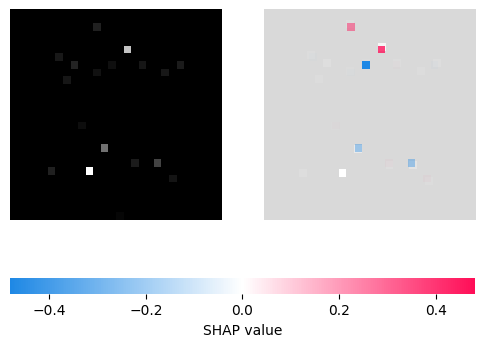

In [ ]:
#Code 1.2
import shap
import matplotlib.pyplot as plt

# Convert model to evaluation mode
model.eval()

# Define a small batch of background data to use in SHAP
background = images[:100]  # Use the first 100 images as background

# Define SHAP explainer
explainer = shap.DeepExplainer(model, background)

# Select a sample from the dataset to explain
sample_images = images[:10]  # Choose the first 10 images as examples

# Compute Shapley values
shap_values = explainer.shap_values(sample_images)

# Since it's a regression task, shap_values will be a list with a single array
shap_values = shap_values[0]

# Reshape SHAP values to remove the single-sample dimension
shap_values_reshaped = shap_values.reshape(shap_values.shape[1:]) # New shape will be (28, 28, 1)

# Display the first image's SHAP values as a heatmap
# Pass a list with a single element for the reshaped SHAP values
shap.image_plot([shap_values_reshaped], sample_images[0].squeeze().numpy(), show=True)

In [ ]:
#Code 2.1
import numpy as np

def get_top_pixels(shap_values, top_n=5):
    # Flatten the SHAP values to find the most relevant pixels
    flat_shap_values = shap_values.flatten()

    # Get the indices of the top N pixels with the highest absolute SHAP values
    top_pixel_indices = np.argsort(np.abs(flat_shap_values))[-top_n:]

    return top_pixel_indices

# Example: Get the top 5 most important pixels for the first sample image
top_pixel_indices = get_top_pixels(shap_values[0], top_n=5)


In [ ]:
def get_feature_names_from_pixels(igtd_instance, pixel_indices):
    feature_names = []
    for pixel_idx in pixel_indices:
        row, col = pixel_idx // igtd_instance.image_size[1], pixel_idx % igtd_instance.image_size[1]
        features = igtd_instance.get_feature_names_for_pixel(row, col)
        feature_names.extend(features)
    return feature_names

# Assuming 'igtd' is the instance of IGTD class
important_features = get_feature_names_from_pixels(igtd_instance=igtd, pixel_indices=top_pixel_indices)

print("Important features related to the most relevant pixels:")
print(important_features)


Important features related to the most relevant pixels:
['RPDE', 'PPE', 'DFA', 'HNR', 'test_time']


In [ ]:
#Code 2.2
# Choose a specific image index to analyze
image_index = 0

# Get the SHAP values for the chosen image
shap_values_for_image = shap_values[image_index]

# Identify the most important pixels
top_pixel_indices = get_top_pixels(shap_values_for_image, top_n=5)

# Map those pixels back to feature names
important_features = get_feature_names_from_pixels(igtd_instance=igtd, pixel_indices=top_pixel_indices)

print(f"Important features for image {image_index+1}:")
for feature in important_features:
    print(feature)


Important features for image 1:
RPDE
PPE
DFA
HNR
test_time


In [ ]:
#Code 3.1
def get_top_pixels_and_shap_values(shap_values, image_size, top_n=5):
    # Flatten the SHAP values to find the most relevant pixels
    flat_shap_values = shap_values.flatten()

    # Get the indices of the top N pixels with the highest absolute SHAP values
    top_pixel_indices = np.argsort(np.abs(flat_shap_values))[-top_n:]

    # Retrieve the SHAP values and their coordinates
    top_shap_values = flat_shap_values[top_pixel_indices]
    top_pixel_coords = [(idx // image_size[1], idx % image_size[1]) for idx in top_pixel_indices]

    return top_pixel_indices, top_shap_values, top_pixel_coords


In [ ]:
#Code 3.2
def get_feature_details_from_pixels(igtd_instance, top_pixel_indices, top_shap_values, top_pixel_coords):
    feature_details = []

    for pixel_idx, shap_value, coord in zip(top_pixel_indices, top_shap_values, top_pixel_coords):
        row, col = coord
        features = igtd_instance.get_feature_names_for_pixel(row, col)
        for feature in features:
            feature_details.append({
                'feature_name': feature,
                'shap_value': shap_value,
                'pixel_coords': coord
            })

    return feature_details

# Example usage with image size and IGTD instance
image_size = igtd.image_size  # Assuming IGTD instance is 'igtd'

# Get details for the first image
image_index = 0
shap_values_for_image = shap_values[image_index]

# Get top pixels, their SHAP values, and coordinates
top_pixel_indices, top_shap_values, top_pixel_coords = get_top_pixels_and_shap_values(shap_values_for_image, image_size, top_n=5)

# Map those pixels back to feature details
important_features_details = get_feature_details_from_pixels(igtd_instance=igtd, top_pixel_indices=top_pixel_indices, top_shap_values=top_shap_values, top_pixel_coords=top_pixel_coords)

# Print out the details
print(f"Important features for image {image_index + 1}:")
for detail in important_features_details:
    print(f"Feature: {detail['feature_name']}, SHAP Value: {detail['shap_value']:.4f}, Coordinates: {detail['pixel_coords']}")


Important features for image 1:
Feature: RPDE, SHAP Value: -0.1819, Coordinates: (18, 12)
Feature: PPE, SHAP Value: -0.1843, Coordinates: (20, 19)
Feature: DFA, SHAP Value: 0.2210, Coordinates: (2, 11)
Feature: HNR, SHAP Value: 0.3750, Coordinates: (5, 15)
Feature: test_time, SHAP Value: -0.8659, Coordinates: (7, 13)


###**SHAP Summary Plot**

In [ ]:
import shap

# Convert the images to a format that SHAP can process (e.g., batch of images)
background = images[:100]  # Use a subset of images as background for SHAP
explainer = shap.DeepExplainer(model, background)

# Compute SHAP values for a batch of images
shap_values = explainer.shap_values(images[:10])  # Use the first 10 images for explanation

# SHAP values will be a list where each entry corresponds to the output of the model.
# For regression, there will be only one entry since the output is a single value.
shap_values = shap_values[0]


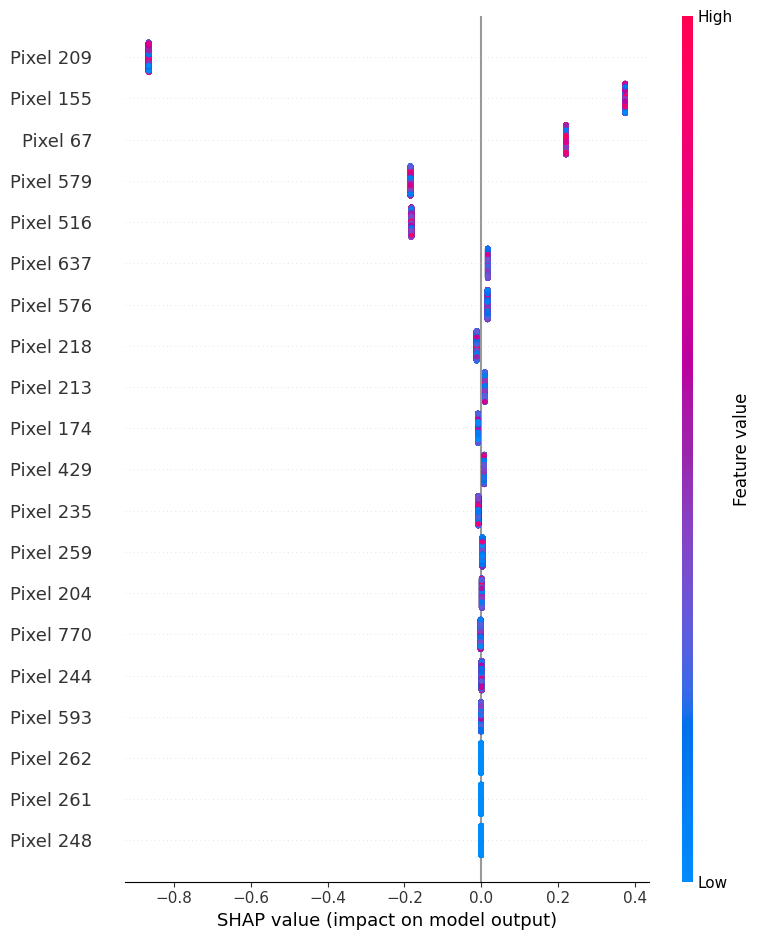

In [ ]:
import shap

# Assume images and shap_values have been computed as before

# Convert images and SHAP values to a format that SHAP can process
num_samples = images.shape[0]  # Number of samples
num_pixels = images.shape[2] * images.shape[3]  # Flatten the image pixels

# Reshape the images to match the desired format
images_flattened = images.reshape(num_samples, num_pixels)

# Ensure SHAP values are in the correct format (assuming they are for a single image)
if shap_values.ndim == 4:
    shap_values_flattened = shap_values.reshape(num_pixels)  # Flatten if needed
else:
    shap_values_flattened = shap_values  # Already flattened

# Replicate SHAP values for each sample if they correspond to a single image
if shap_values_flattened.shape[0] == num_pixels:
    shap_values_flattened = np.tile(shap_values_flattened, (num_samples, 1))

# Create the summary plot
shap.summary_plot(shap_values_flattened, images_flattened, feature_names=[f"Pixel {i}" for i in range(num_pixels)])